# Necessary imports

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import os
from sklearn.ensemble import RandomForestClassifier
import itertools
from sklearn.base import clone
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import  ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
#from xgboost import XGBClassifier
from scipy.stats import randint, uniform

# Step 1: Exploraoty data analysis on the given data
First and foremost we will need to collect the data from all of the files into a single data frame.

For this we will need to make a file managment function with the help of the os library

In [2]:
def append_csvs_across_folders(folder_names, csv_files, base_path='.'):
    combined_dfs = []

    for folder in folder_names:
        dfs = []
        for csv_file in csv_files:
            file_path = os.path.join(base_path, folder, csv_file)
            if os.path.exists(file_path):
                df = pd.read_csv(file_path)
                dfs.append(df)
            else:
                print(f"Warning: {file_path} not found.")
        
        if dfs:
            combined_df = pd.concat(dfs, axis=1)

            # Check for duplicate columns
            duplicated_cols = combined_df.columns[combined_df.columns.duplicated()].tolist()
            if duplicated_cols:
                print(f"⚠️ Duplicate columns found in folder '{folder}': {duplicated_cols}")

            combined_dfs.append(combined_df)

    if combined_dfs:
        final_df = pd.concat(combined_dfs, axis=0)
        return final_df
    else:
        print("No data to combine.")
        return pd.DataFrame()



In [3]:
all_features=['Subject.csv','Accelerometer_Raw.X.csv','Accelerometer_Raw.Y.csv','Accelerometer_Raw.Z.csv','Nav_Raw.X[LeftTemple].csv','Nav_Raw.Y[LeftTemple].csv','Nav_Raw.X[RightTemple].csv','Nav_Raw.Y[RightTemple].csv','Prox_Raw[LeftCheek].csv','Prox_Raw[RightCheek].csv','Label.csv']
all_names=['FEIT_eating_AngelaM','FEIT_eating_AngelaS','FEIT_eating_DamjanM','FEIT_eating_DavidA','FEIT_eating_EmilijaM','FEIT_eating_FilipP','FEIT_eating_IlijaM','FEIT_eating_JakovGj','FEIT_eating_JanaGj','FEIT_eating_JanaH','FEIT_eating_JovanaA','FEIT_eating_KristijanM','FEIT_eating_KristinaK','FEIT_eating_MajaN','FEIT_eating_MaksimP','FEIT_eating_MarinoJ','FEIT_eating_MartinaM','FEIT_eating_MatejG','FEIT_eating_MiaD','FEIT_eating_MilaP','FEIT_eating_NatalijaG','FEIT_eating_OgnenS','FEIT_eating_PetarA','FEIT_eating_PetarK','FEIT_eating_SaraI','FEIT_eating_SaraM','FEIT_eating_StefanS','FEIT_eating_StevceK','FEIT_eating_TamaraK','FEIT_eating_TomiN','FEIT_eating_ViktorI','FEIT_eating_ViktorijaP']

In [5]:
full_dataset=append_csvs_across_folders(all_names, all_features, 'data/')

In [6]:
full_dataset.shape

(25473, 641)

In [7]:
full_dataset['Subject'].unique()

array(['FEIT_eating_AngelaM', 'FEIT_eating_AngelaS',
       'FEIT_eating_DamjanM', 'FEIT_eating_DavidA',
       'FEIT_eating_EmilijaM', 'FEIT_eating_FilipP', 'FEIT_eating_IlijaM',
       'FEIT_eating_JakovGj', 'FEIT_eating_JanaGj', 'FEIT_eating_JanaH',
       'FEIT_eating_JovanaA', 'FEIT_eating_KristijanM',
       'FEIT_eating_KristinaK', 'FEIT_eating_MajaN',
       'FEIT_eating_MaksimP', 'FEIT_eating_MarinoJ',
       'FEIT_eating_MartinaM', 'FEIT_eating_MatejG', 'FEIT_eating_MiaD',
       'FEIT_eating_MilaP', 'FEIT_eating_NatalijaG', 'FEIT_eating_OgnenS',
       'FEIT_eating_PetarA', 'FEIT_eating_PetarK', 'FEIT_eating_SaraI',
       'FEIT_eating_SaraM', 'FEIT_eating_StefanS', 'FEIT_eating_StevceK',
       'FEIT_eating_TamaraK', 'FEIT_eating_TomiN', 'FEIT_eating_ViktorI',
       'FEIT_eating_ViktorijaP'], dtype=object)

In [8]:
full_dataset['Subject'] = full_dataset['Subject'].str.replace(r"^FEIT_eating_", "", regex=True)

In [9]:
full_dataset['Subject'].unique()

array(['AngelaM', 'AngelaS', 'DamjanM', 'DavidA', 'EmilijaM', 'FilipP',
       'IlijaM', 'JakovGj', 'JanaGj', 'JanaH', 'JovanaA', 'KristijanM',
       'KristinaK', 'MajaN', 'MaksimP', 'MarinoJ', 'MartinaM', 'MatejG',
       'MiaD', 'MilaP', 'NatalijaG', 'OgnenS', 'PetarA', 'PetarK',
       'SaraI', 'SaraM', 'StefanS', 'StevceK', 'TamaraK', 'TomiN',
       'ViktorI', 'ViktorijaP'], dtype=object)

# Step 2: EDA
Now that we have all the data nicely in one data frame we can move on to doing some exploratory data analysis

We start off by looking at the class distribution to see if the data set is balanced

Because the goal of this experiment is to train models specifically tailored to the person who the data was collected from we will continue with looking at the class distribution for each participant individually.

In [9]:
grouped = full_dataset.groupby("Subject")

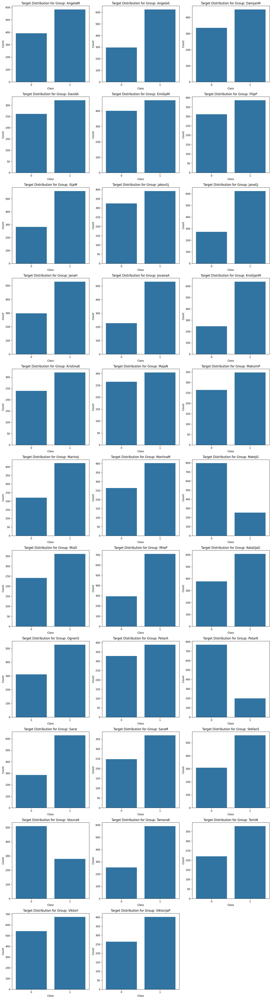

In [10]:
grouped_list = list(grouped)
n = len(grouped_list)
cols = 3
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
axes = axes.flatten()
for i, (group_name, group_df) in enumerate(grouped_list):
    sns.countplot(x=group_df["Label"], ax=axes[i])
    axes[i].set_title(f"Target Distribution for Group: {group_name}")
    axes[i].set_xlabel("Class")
    axes[i].set_ylabel("Count")
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

From these plots we can conclude that while class 1(Eating) has more instances than class 0(Not Eating) we have enough instances in both classes to not require the use of under/over sampling.
One exception might be the data from PetarK where class zero dominates with a ratio of over 4:1 so we might try over/undersampling here.

The next step would be exploring the different features in this dataset to see which of them carry useful information and can be utilized to predict the outcome.

Since this dataset has a lot of features standard EDA procedure is not quite possible given the high number of features in this dataset.

For this reason we will make use of the feature_importances atribute of the RandomForest classifier

In [11]:
rf = RandomForestClassifier(random_state=15)
X=full_dataset.drop(['Subject', 'Label'],axis=1)
y=full_dataset['Label']
rf.fit(X, y)
importances = rf.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": importances
})
feature_importance_df = feature_importance_df.sort_values(by="importance", ascending=False)
top_features = feature_importance_df.head(20)
top_feature_names=top_features['feature']
display(top_feature_names)

333      Nav/Raw.Y[LeftTemple]_wave_haar_5
218              Nav/Raw.X[LeftTemple]_iqr
271     Nav/Raw.X[LeftTemple]_wave_haar_14
262      Nav/Raw.X[LeftTemple]_wave_haar_5
280     Nav/Raw.X[LeftTemple]_wave_haar_23
427             Nav/Raw.Y[RightTemple]_std
342     Nav/Raw.Y[LeftTemple]_wave_haar_14
475     Nav/Raw.Y[RightTemple]_wave_haar_5
422    Nav/Raw.X[RightTemple]_wave_haar_23
354     Nav/Raw.Y[LeftTemple]_wave_haar_26
347     Nav/Raw.Y[LeftTemple]_wave_haar_19
493    Nav/Raw.Y[RightTemple]_wave_haar_23
276     Nav/Raw.X[LeftTemple]_wave_haar_19
292              Nav/Raw.Y[LeftTemple]_rms
513         Prox/Raw[LeftCheek]_amplitude3
285              Nav/Raw.Y[LeftTemple]_std
345     Nav/Raw.Y[LeftTemple]_wave_haar_17
351     Nav/Raw.Y[LeftTemple]_wave_haar_23
584        Prox/Raw[RightCheek]_amplitude3
484    Nav/Raw.Y[RightTemple]_wave_haar_14
Name: feature, dtype: object

By doing this we now have a rough estimate of our most important features.

We can now proceed to utilize the EDA techniques that we are used to and hopefuly extract some useful information about the classification task that we want to perform.

Now lets extract the data from our most important features into another data frame together with the target variable

In [12]:
df_EDA=pd.concat([full_dataset[top_feature_names], full_dataset['Label']],axis=1)

In [13]:
df_EDA.columns

Index(['Nav/Raw.Y[LeftTemple]_wave_haar_5', 'Nav/Raw.X[LeftTemple]_iqr',
       'Nav/Raw.X[LeftTemple]_wave_haar_14',
       'Nav/Raw.X[LeftTemple]_wave_haar_5',
       'Nav/Raw.X[LeftTemple]_wave_haar_23', 'Nav/Raw.Y[RightTemple]_std',
       'Nav/Raw.Y[LeftTemple]_wave_haar_14',
       'Nav/Raw.Y[RightTemple]_wave_haar_5',
       'Nav/Raw.X[RightTemple]_wave_haar_23',
       'Nav/Raw.Y[LeftTemple]_wave_haar_26',
       'Nav/Raw.Y[LeftTemple]_wave_haar_19',
       'Nav/Raw.Y[RightTemple]_wave_haar_23',
       'Nav/Raw.X[LeftTemple]_wave_haar_19', 'Nav/Raw.Y[LeftTemple]_rms',
       'Prox/Raw[LeftCheek]_amplitude3', 'Nav/Raw.Y[LeftTemple]_std',
       'Nav/Raw.Y[LeftTemple]_wave_haar_17',
       'Nav/Raw.Y[LeftTemple]_wave_haar_23', 'Prox/Raw[RightCheek]_amplitude3',
       'Nav/Raw.Y[RightTemple]_wave_haar_14', 'Label'],
      dtype='object')

# Step 2.1: Plotting the Correlation Matrix for the most important features of the dataset 

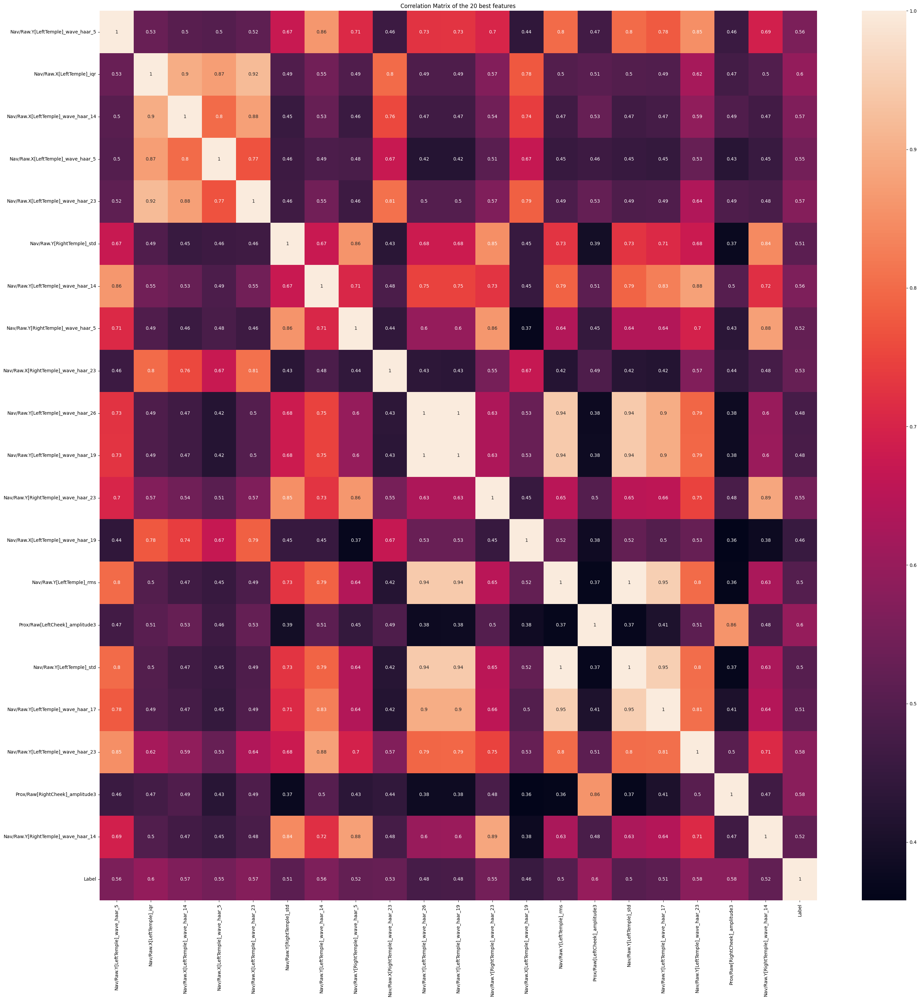

In [14]:
plt.figure(figsize=(30,30))
sns.heatmap(data=df_EDA.corr(), annot=True)
plt.title('Correlation Matrix of the 20 best features')
plt.tight_layout()
plt.show()

# Step 2.2: Plotting Box plots

We will proceed by plotting the box plots per class for each one of the 20 features to get a feel of how the distributions of the feature differ per class. 

In [15]:
df_class_zero=df_EDA[df_EDA['Label']==0]
df_class_one=df_EDA[df_EDA['Label']==1]

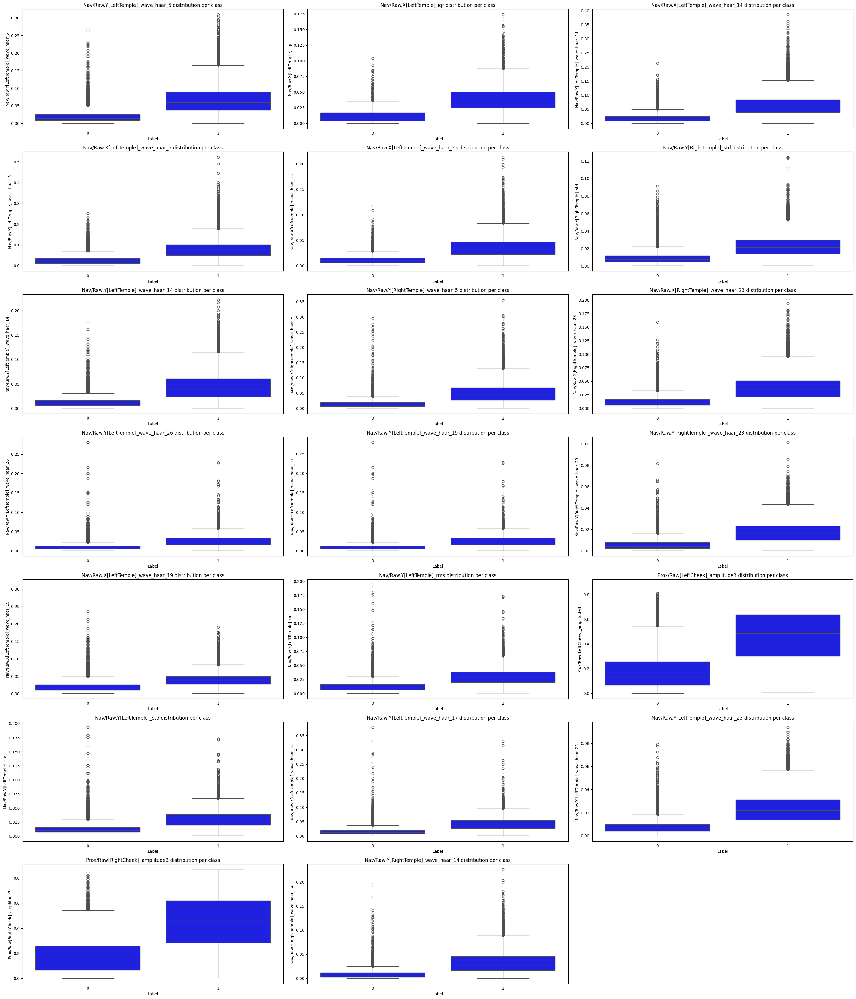

In [16]:
n = len(top_feature_names)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10 * cols, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(top_feature_names):
    sns.boxplot(
        x=df_EDA['Label'],
        y=df_EDA[feature],
        ax=axes[i],
        color='blue'
    )
    axes[i].set_title(f'{feature} distribution per class')
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


# Step 2.3: Plotting Violin Plots
Now we can add to this analysis with ploting the violin plots whose width tells us the density of data at that value

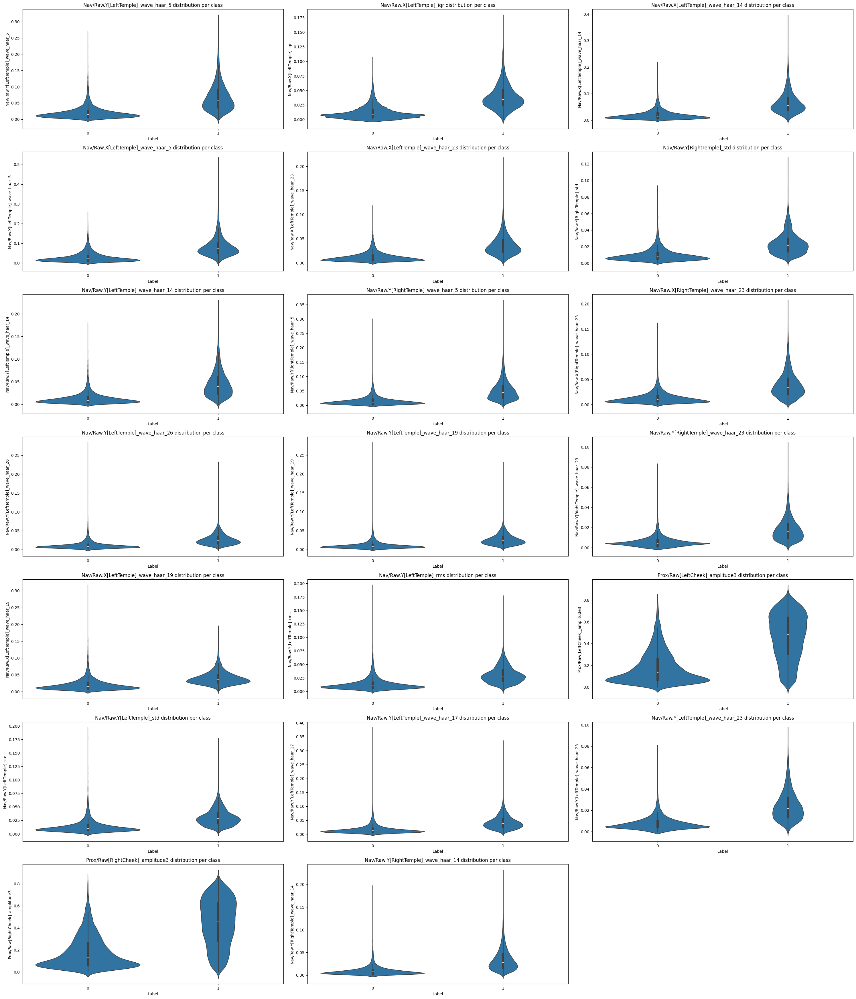

In [17]:
n = len(top_feature_names)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10 * cols, 5 * rows))
axes = axes.flatten()

for i, feature in enumerate(top_feature_names):
    sns.violinplot(
        x=df_EDA['Label'],
        y=df_EDA[feature],
        ax=axes[i],
    )
    axes[i].set_title(f'{feature} distribution per class')
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

# Step 2.4: Plotting Scatter Plots

Even though we have significantly reduced the number of features from the data plotting scatter plots for all combinations of our 20 best features(per the RandomForest feature_importaances_) will stil be a tidious task and we will probably get overwhelmed by all the plots and data.

To work through this problem we will make use of our box plots and see which combinations of features have different distributions by class and use this information to plot scatter plots that will hopefuly give us a good idea of class seperability. We can also make use of the information from our correlation matrix and tend to plot scatter plots for uncorrelated features to remove redundancy.

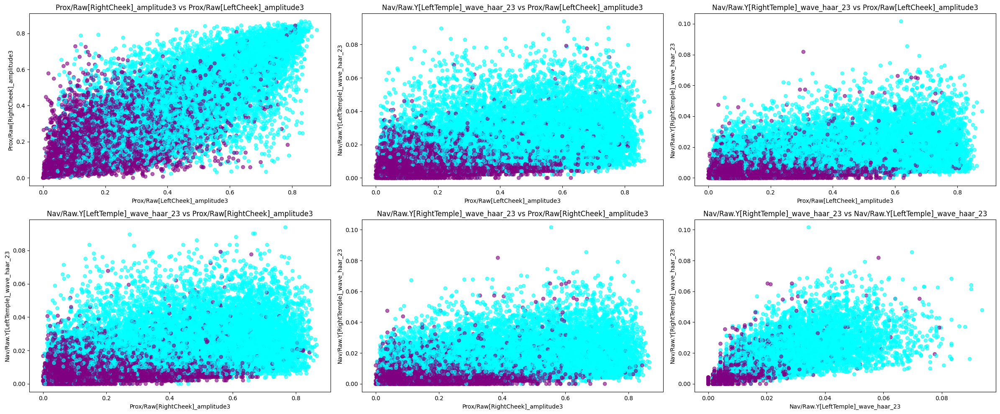

In [18]:
scatter_features=['Prox/Raw[LeftCheek]_amplitude3','Prox/Raw[RightCheek]_amplitude3','Nav/Raw.Y[LeftTemple]_wave_haar_23','Nav/Raw.Y[RightTemple]_wave_haar_23']
feature_pairs = list(itertools.combinations(scatter_features, 2))
n = len(feature_pairs)
cols = 3
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(8 * cols, 5 * rows))
axes = axes.flatten()
palette = {0: 'purple', 1: 'cyan'}
colors = df_EDA['Label'].map(palette)
for idx, (x_feat, y_feat) in enumerate(feature_pairs):
    ax = axes[idx]
    ax.scatter(df_EDA[x_feat], df_EDA[y_feat], c=colors, alpha=0.6)
    ax.set_xlabel(x_feat)
    ax.set_ylabel(y_feat)
    ax.set_title(f'{y_feat} vs {x_feat}')
for j in range(len(feature_pairs), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Step 3: Making the pipeline

Now that we have a handle on our data the next step is to make the pipeline for training the machine learning models.

We start of by defining a couple of functions

In [10]:
def append_csvs_across_folders(folder_name, csv_files, base_path='.'):
    combined_dfs = []

    dfs = []
    for csv_file in csv_files:
        file_path = os.path.join(base_path, folder_name, csv_file)
        if os.path.exists(file_path):
            df = pd.read_csv(file_path)
            dfs.append(df)
        else:
            print(f"Warning: {file_path} not found.")

    if dfs:
        combined_df = pd.concat(dfs, axis=1)
        combined_dfs.append(combined_df)

    if combined_dfs:
        final_df = pd.concat(combined_dfs, axis=0)
        final_df['Subject'] = final_df['Subject'].str.replace(r"^FEIT_eating_", "", regex=True)
        return final_df
    else:
        print("No data to combine.")
        return pd.DataFrame()


In [11]:
def select_columns_by_keyword(df, keywords=None, keep=True):
    if keywords==None:
        return df
    else:
        if isinstance(keywords, str):
            keywords = [keywords]
        
        matching_cols = [col for col in df.columns if any(kw in col for kw in keywords)]
        
        if keep:
            cols_to_keep = matching_cols + ['Label'] if 'Label' in df.columns else matching_cols
            return df[cols_to_keep]
        else:
            cols_to_drop = [col for col in matching_cols if col != 'Label']
            return df.drop(columns=cols_to_drop)


In [12]:
def clean_feature_names(df):
    df = df.copy()
    df.columns = df.columns.str.replace(r'[{}[\]":,]', '_', regex=True)
    return df

In [13]:
def evaluate_model_cv(model, X, y, cv_splits=5, plot_cm=False, random_state=42):
    skf = StratifiedKFold(n_splits=cv_splits, shuffle=True, random_state=random_state)
    classes = np.unique(y)
    metrics_per_class = {
        cls: {"precision": [], "recall": [], "f1": []}
        for cls in classes
    }
    f1_macro_scores=cross_val_score(model, X, y, cv=cv_splits, scoring='f1_macro')
    acc_scores=cross_val_score(model, X, y, cv=cv_splits, scoring='accuracy')
    for train_idx, test_idx in skf.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]


        clf = clone(model)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        precision, recall, f1, _ = precision_recall_fscore_support(
            y_test, y_pred, labels=classes, zero_division=0
        )
        for i, cls in enumerate(classes):
            metrics_per_class[cls]["precision"].append(precision[i])
            metrics_per_class[cls]["recall"].append(recall[i])
            metrics_per_class[cls]["f1"].append(f1[i])
    results_df = pd.DataFrame({
        cls: {
            "precision_mean": np.mean(m["precision"]),
            "precision_std": np.std(m["precision"]),
            "recall_mean": np.mean(m["recall"]),
            "recall_std": np.std(m["recall"]),
            "f1_mean": np.mean(m["f1"]),
            "f1_std": np.std(m["f1"])
        }
        for cls, m in metrics_per_class.items()
    }).T
    results_non_class={
        'Accuracy': np.mean(acc_scores),
        'F1 Macro': np.mean(f1_macro_scores)
    }
    results_df_non_class = pd.DataFrame([results_non_class])  

    results_df_non_class = pd.DataFrame(results_non_class, index=["score"])  

    y_pred_all = cross_val_predict(model, X, y, cv=skf)
    cm = confusion_matrix(y, y_pred_all, labels=classes)

    if plot_cm:
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
        disp.plot(cmap='Blues')
        plt.title("Confusion Matrix (All CV Predictions)")
        plt.show()

    return results_df.round(3), results_df_non_class, cm

In [14]:
def search(X, y, base_model, param_dist, search_type, n_iter=20, top_k=3, cv_splits=5, random_state=42):
    if search_type=='random':
        search = RandomizedSearchCV (
            estimator=base_model,
            param_distributions=param_dist,
            n_iter=n_iter,
            scoring='f1_macro',
            cv=cv_splits,
            random_state=random_state,
            n_jobs=-1,
            return_train_score=False
        )
    elif search_type=='grid':
        search = GridSearchCV (
            estimator=base_model,
            param_grid=param_dist,
            scoring='f1_macro',
            cv=cv_splits,
            n_jobs=-1,
            return_train_score=False
        )
    else:
        raise ValueError("search_type must be 'random' or 'grid'")
    search.fit(X, y)
    results_df = pd.DataFrame(search.cv_results_)
    top_k_models = results_df.sort_values("mean_test_score", ascending=False).head(top_k).index

    results = []

    for idx in top_k_models:
        params = results_df.loc[idx, 'params']
        model = clone(base_model).set_params(**params)

        eval_df,eval_df_non_class, cm = evaluate_model_cv(model, X, y, cv_splits=cv_splits, plot_cm=False)

        results.append({
            "model_name": base_model.__class__.__name__,
            "params": params,
            "cv_metrics": eval_df,
            'cv_metrics_non_class': eval_df_non_class,
            "confusion_matrix": cm
        })

    return results

In [15]:
def display_results(results,participant_names):
    participant_names2 = participant_names.replace("FEIT_eating_", "", 1)
    print(participant_names2)
    classes=[0,1]
    for res in results:
        print(res['model_name'])
        print('\n')
        df_params=pd.DataFrame(res['params'], index=[0])
        print(df_params, )
        print('\n')
        cv_metrics_df=pd.DataFrame(res['cv_metrics'])
        print(cv_metrics_df)
        print('\n')
        cv_metrics_non_class_df=pd.DataFrame(res['cv_metrics_non_class'])
        print(cv_metrics_non_class_df)
        cm=res['confusion_matrix']
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
        disp.plot(cmap='Blues')
        plt.title(f"Confusion Matrix (All CV Predictions) {participant_names2}")
        plt.show()

In [16]:
def final_pipeline(model,param_dist, search_type,names,feat, n_iter=20, top_k=3,cv_splits=5):
    filtered_by_name=append_csvs_across_folders(names,all_features,base_path='data/')
    filtered_by_feature=select_columns_by_keyword(filtered_by_name,feat)
    X = filtered_by_feature.drop(['Label', 'Subject'], axis=1)
    X=clean_feature_names(X)
    y = filtered_by_feature['Label']
    searched = search(X, y, model, param_dist, search_type, n_iter, top_k, cv_splits, random_state=42)
    participant_name=''
    for name in names:
        participant_name=participant_name+name
    display_results(searched,participant_names=participant_name)    

# Step 4: Testing and Reporting Results

Now that we have created the pipeline we can proceed with training and testing different models for different participants.

First and foremost we will create the randomized search grids for each type of classifier so we can use them during training.

In [17]:
DecisionTreeParams = {
    "criterion": ["gini", "entropy", "log_loss"],
    "splitter": ["best", "random"],
    "max_depth": randint(3, 51),
    "min_samples_split": randint(2, 11),
    "min_samples_leaf": randint(1, 5),
    "max_features": [None, "sqrt", "log2"]
}

KNeighborsParams = {
    "n_neighbors": randint(3, 10),
    "weights": ["uniform", "distance"],
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],
    "p": [1, 2]
}

SVMParams = {
    "C": uniform(0.1, 10),
    "kernel": ["linear", "rbf"],               
    "gamma": [0.01, 0.1, "scale"],         
    "degree": [2]                              
}


RandomForestParams = {
    "n_estimators": randint(100, 501),
    "max_depth": randint(5, 51),
    "min_samples_split": randint(2, 11),
    "min_samples_leaf": randint(1, 5),
    "max_features": ["sqrt", "log2"]
}

XGBoostParams = {
    "n_estimators": randint(100, 501),
    "max_depth": randint(3, 11),
    "learning_rate": uniform(0.01, 0.2),
    "subsample": uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.6, 0.4),
    "gamma": uniform(0, 0.5)
}

LightGBMParams = {
    "n_estimators": randint(100, 501),
    "max_depth": [-1] + list(range(3, 11)),
    "learning_rate": uniform(0.01, 0.2),
    "num_leaves": randint(15, 128),
    "subsample": uniform(0.6, 0.4),
    "colsample_bytree": uniform(0.6, 0.4),
    'verbosity':[-1]
}

We start off by training Random Forest, Decision Tree and KNearestNeigbours since those take less time to train. 

In [23]:
params=[RandomForestParams,DecisionTreeParams,KNeighborsParams,LightGBMParams]

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
AngelaM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.921          0.036        0.959       0.033    0.939   0.024
1           0.972          0.022        0.943       0.028    0.957   0.017


       Accuracy  F1 Macro
score  0.902485  0.893867


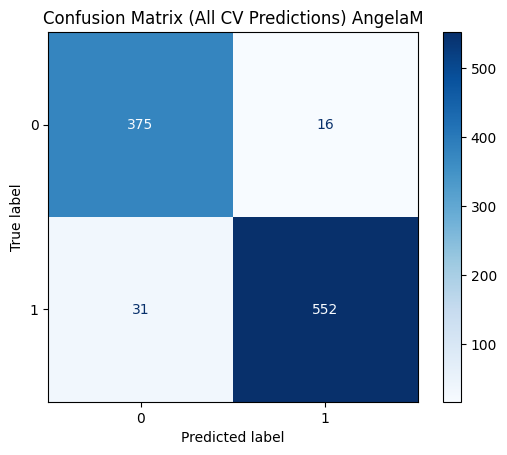

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         19         sqrt                 1                 10           426


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.927          0.029        0.962       0.029    0.944   0.018
1           0.974          0.019        0.949       0.023    0.961   0.013


       Accuracy  F1 Macro
score  0.902485  0.893593


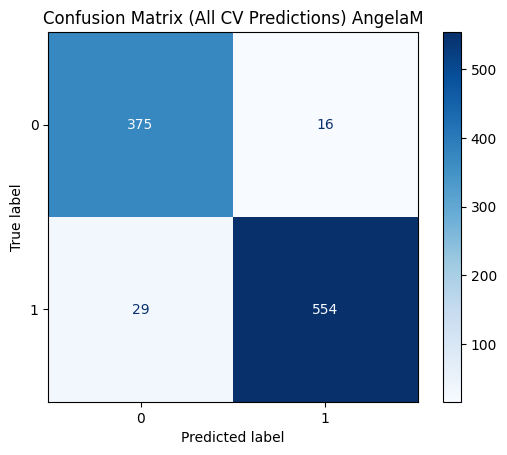

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         sqrt                 1                  4           463


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.934          0.023        0.962       0.024    0.947   0.015
1           0.974          0.016        0.954       0.018    0.964   0.010


       Accuracy  F1 Macro
score  0.899403  0.896078


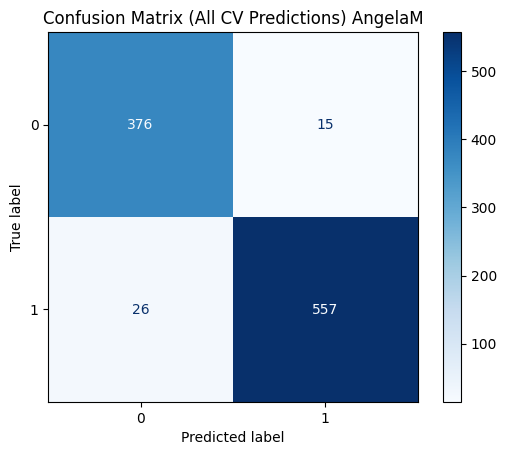

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
AngelaM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.877          0.045        0.867       0.018    0.872   0.030
1           0.911          0.013        0.918       0.032    0.914   0.022


       Accuracy  F1 Macro
score  0.824473  0.808105


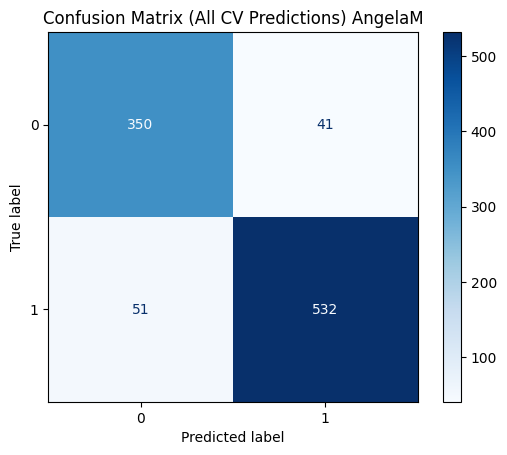

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.876          0.034        0.882       0.027    0.879   0.029
1           0.921          0.018        0.916       0.024    0.918   0.020


       Accuracy  F1 Macro
score  0.864499  0.847066


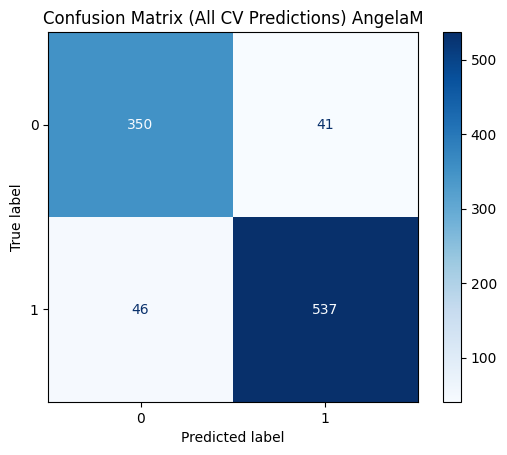

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         42         None                 4                  3   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.885          0.031        0.898       0.026    0.891   0.022
1           0.931          0.016        0.921       0.024    0.926   0.016


       Accuracy  F1 Macro
score  0.856294  0.858639


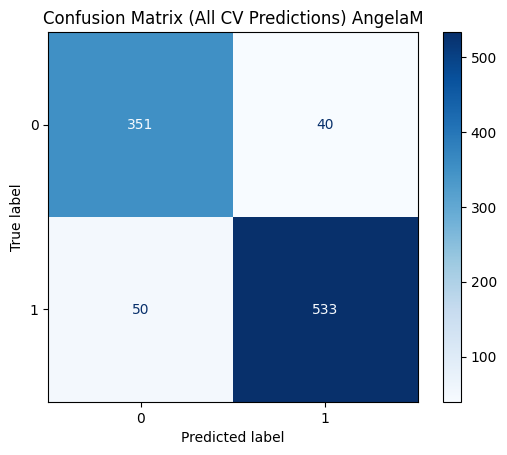

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
AngelaM
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.806          0.027        0.785       0.041    0.795   0.028
1           0.859          0.024        0.873       0.021    0.866   0.017


       Accuracy  F1 Macro
score  0.655982  0.615307


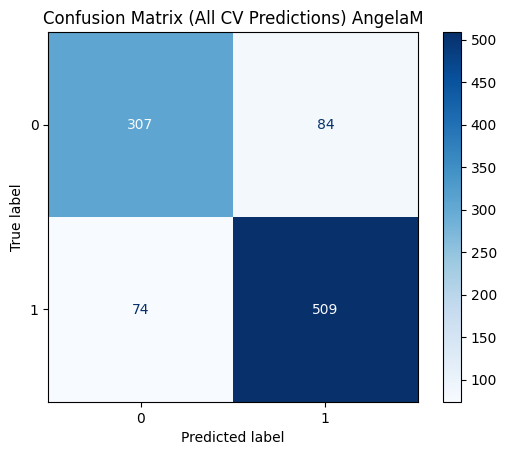

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.803          0.022        0.783       0.053    0.792   0.034
1           0.858          0.030        0.871       0.016    0.864   0.018


       Accuracy  F1 Macro
score  0.650817  0.610693


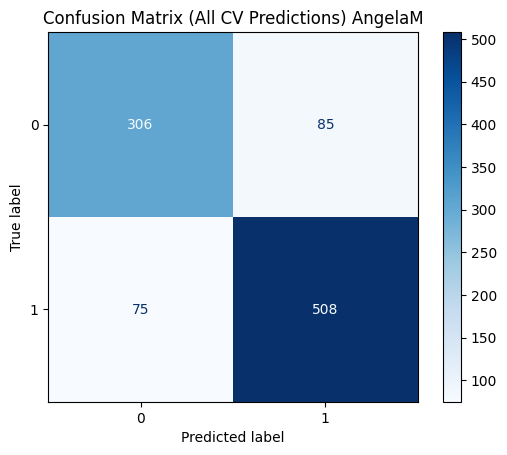

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.803          0.022        0.783       0.053    0.792   0.034
1           0.858          0.030        0.871       0.016    0.864   0.018


       Accuracy  F1 Macro
score  0.650817  0.610693


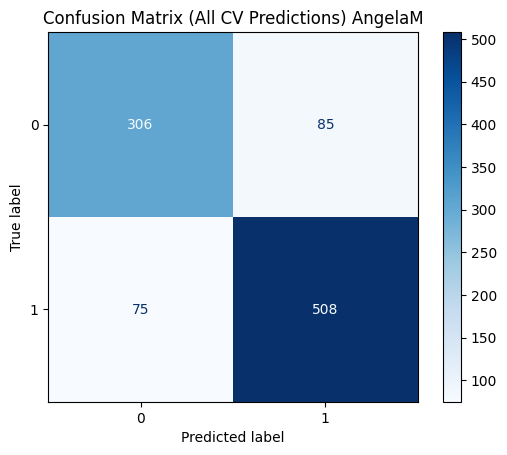

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
AngelaS
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962           0.02        0.929       0.023    0.945   0.019
1           0.967           0.01        0.982       0.009    0.975   0.009


       Accuracy  F1 Macro
score   0.93376  0.924303


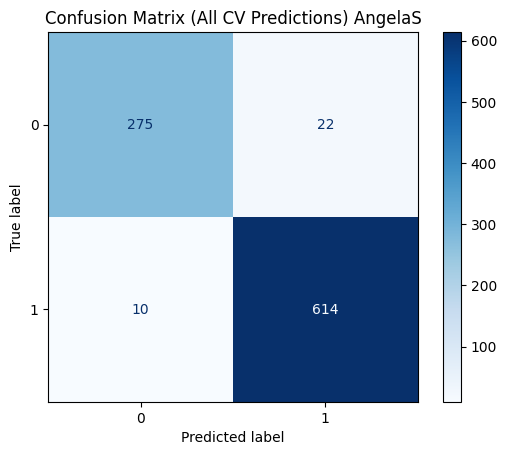

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         sqrt                 1                  4           463


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.955          0.023        0.926       0.017    0.940   0.020
1           0.965          0.008        0.979       0.011    0.972   0.009


       Accuracy  F1 Macro
score  0.929418   0.92125


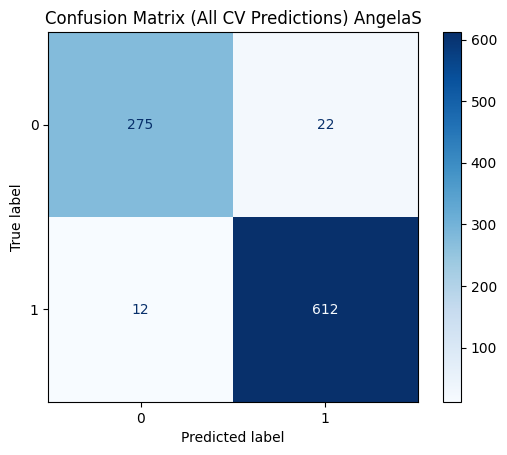

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         19         sqrt                 1                 10           426


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.955          0.023        0.926       0.023    0.940   0.021
1           0.965          0.010        0.979       0.011    0.972   0.010


       Accuracy  F1 Macro
score  0.931592  0.921267


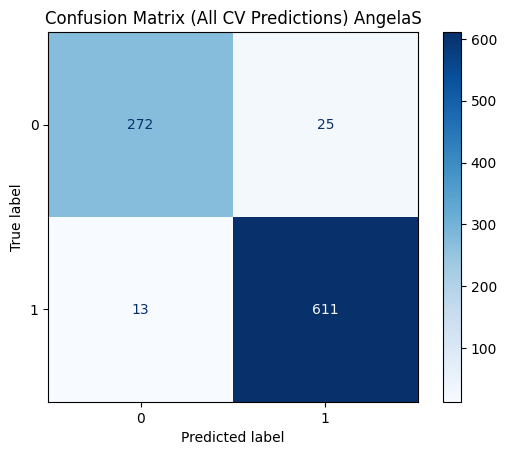

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
AngelaS
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         47         None                 1                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.935          0.042        0.899       0.024    0.916   0.026
1           0.953          0.011        0.970       0.020    0.961   0.013


       Accuracy  F1 Macro
score  0.887098  0.871116


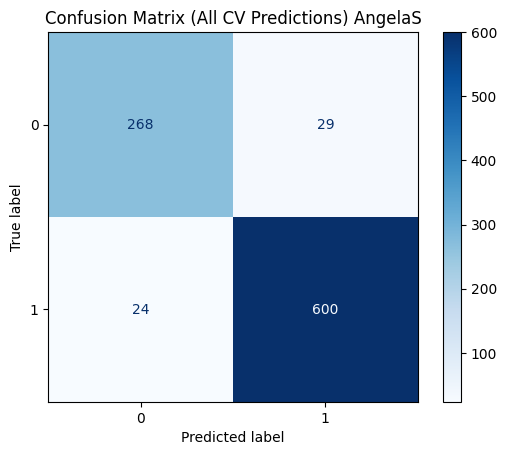

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         20         sqrt                 4                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.868          0.070        0.875       0.041    0.870   0.049
1           0.940          0.019        0.934       0.041    0.937   0.027


       Accuracy  F1 Macro
score  0.868543  0.850932


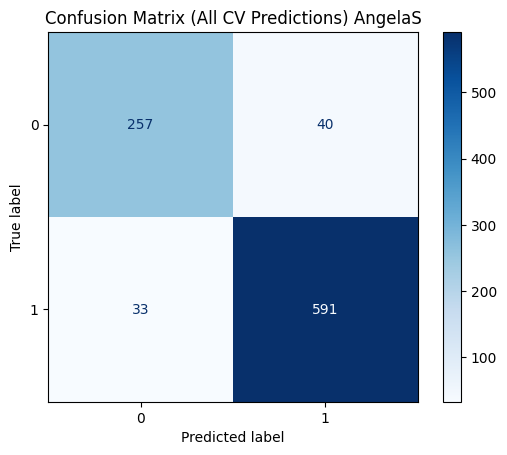

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         11         sqrt                 1                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.865          0.055        0.899       0.029    0.880   0.031
1           0.951          0.012        0.931       0.035    0.941   0.019


       Accuracy  F1 Macro
score   0.87738  0.848375


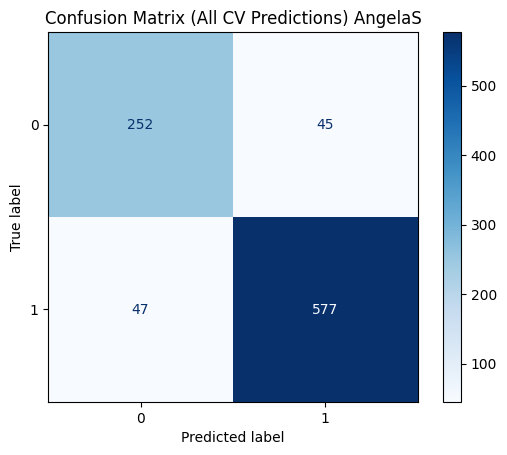

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
AngelaS
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.825          0.043        0.862       0.046    0.842   0.035
1           0.933          0.021        0.912       0.026    0.922   0.018


       Accuracy  F1 Macro
score  0.824078  0.793171


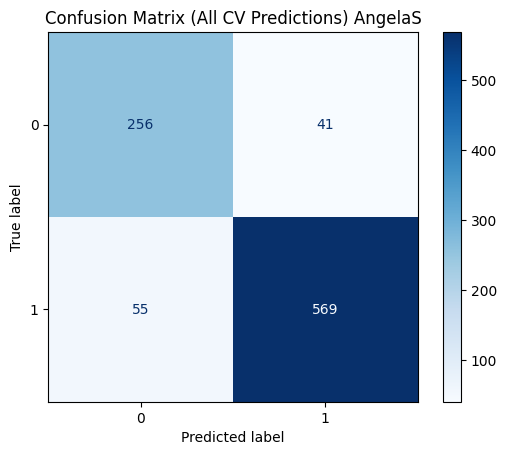

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.825          0.043        0.862       0.046    0.842   0.035
1           0.933          0.021        0.912       0.026    0.922   0.018


       Accuracy  F1 Macro
score  0.824078  0.793171


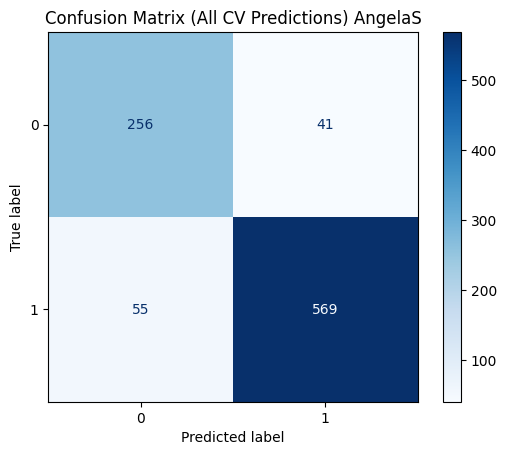

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.855          0.034        0.832       0.044    0.843   0.035
1           0.921          0.020        0.933       0.017    0.927   0.016


       Accuracy  F1 Macro
score  0.828384  0.792785


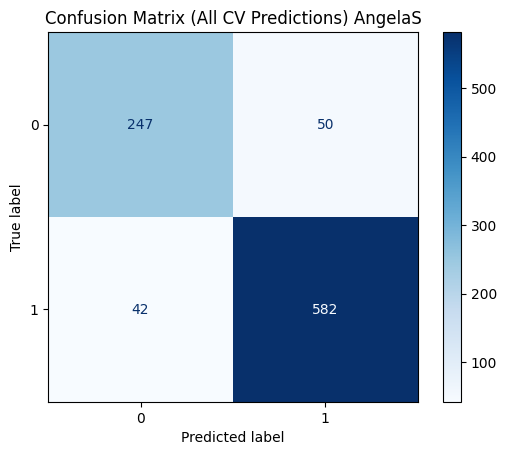

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
DamjanM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 2                  4           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.017        0.967       0.022    0.977   0.010
1           0.976          0.015        0.991       0.013    0.983   0.007


       Accuracy  F1 Macro
score  0.956639  0.953832


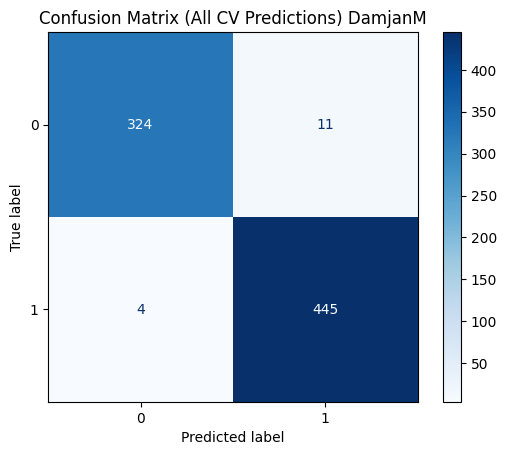

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.991          0.012        0.970       0.016    0.980   0.006
1           0.978          0.012        0.993       0.009    0.986   0.004


       Accuracy  F1 Macro
score  0.951543  0.963145


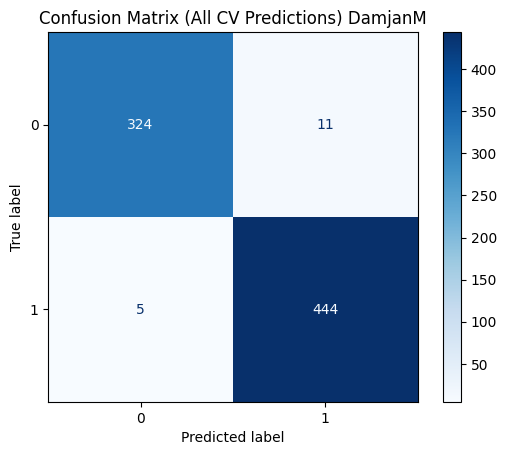

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.977          0.019        0.967       0.022    0.971   0.009
1           0.976          0.015        0.982       0.015    0.979   0.007


       Accuracy  F1 Macro
score  0.964282  0.959123


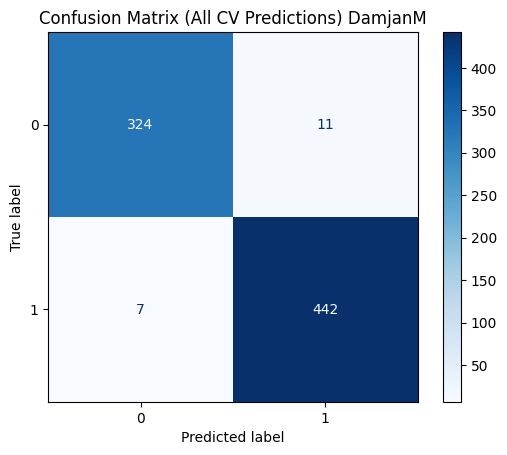

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
DamjanM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         46         sqrt                 3                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.044        0.949       0.015    0.948   0.021
1           0.962          0.010        0.960       0.036    0.961   0.018


       Accuracy  F1 Macro
score  0.901862  0.859728


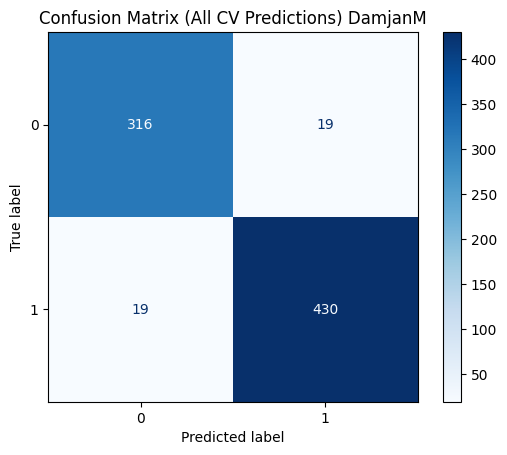

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.026        0.967       0.011    0.956   0.012
1           0.975          0.008        0.958       0.022    0.966   0.010


       Accuracy  F1 Macro
score  0.908174  0.888836


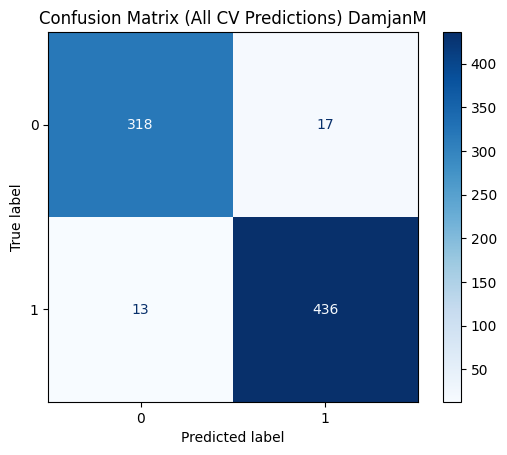

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.909          0.047        0.922       0.046    0.914   0.032
1           0.942          0.030        0.929       0.040    0.935   0.025


       Accuracy  F1 Macro
score  0.887759  0.936788


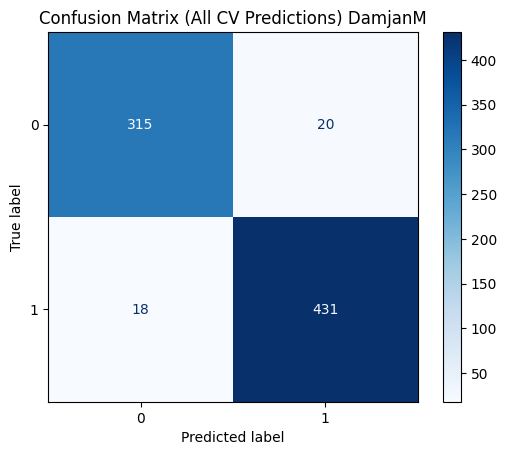

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
DamjanM
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.926          0.019        0.896       0.013    0.911   0.014
1           0.924          0.010        0.947       0.015    0.935   0.011


       Accuracy  F1 Macro
score  0.785955  0.758733


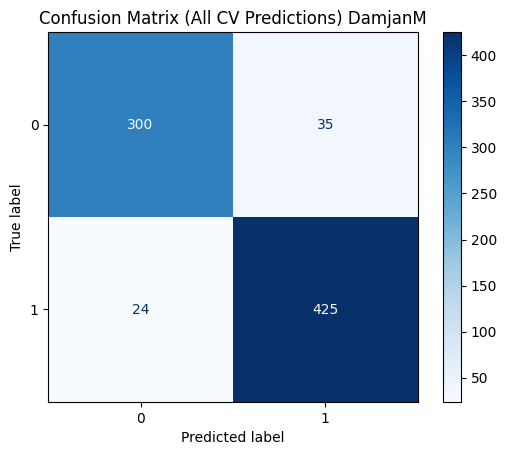

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.926          0.019        0.896       0.013    0.911   0.014
1           0.924          0.010        0.947       0.015    0.935   0.011


       Accuracy  F1 Macro
score  0.785955  0.758733


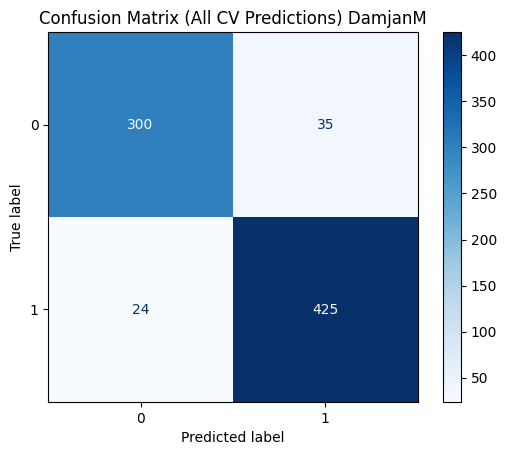

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.930          0.030        0.901       0.026    0.915   0.025
1           0.928          0.019        0.949       0.023    0.938   0.018


       Accuracy  F1 Macro
score  0.780835  0.755566


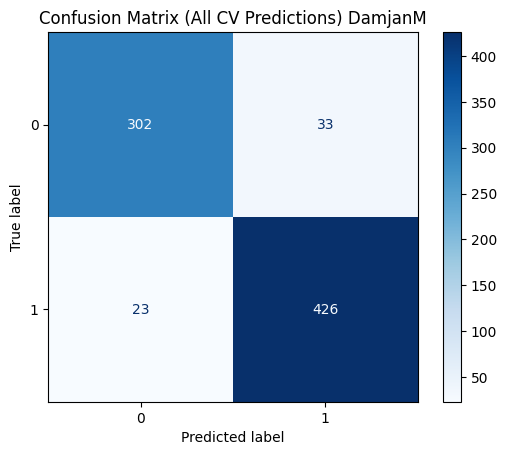

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
DavidA
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  7           485


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.022        0.981       0.012    0.973   0.013
1           0.984          0.010        0.972       0.018    0.978   0.011


       Accuracy  F1 Macro
score  0.940068    0.9325


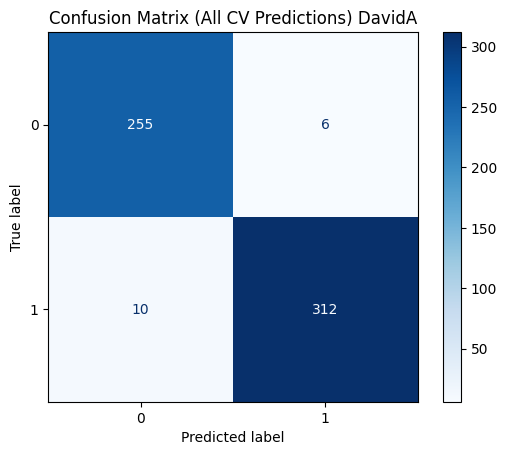

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.970          0.022        0.981       0.012    0.975   0.013
1           0.984          0.010        0.975       0.019    0.980   0.011


       Accuracy  F1 Macro
score   0.93494  0.936022


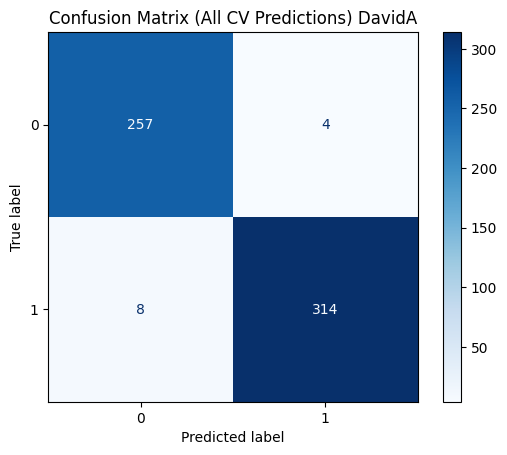

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         sqrt                 1                  4           463


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.021        0.985       0.008    0.975   0.009
1           0.987          0.006        0.972       0.018    0.980   0.008


       Accuracy  F1 Macro
score  0.936649  0.936481


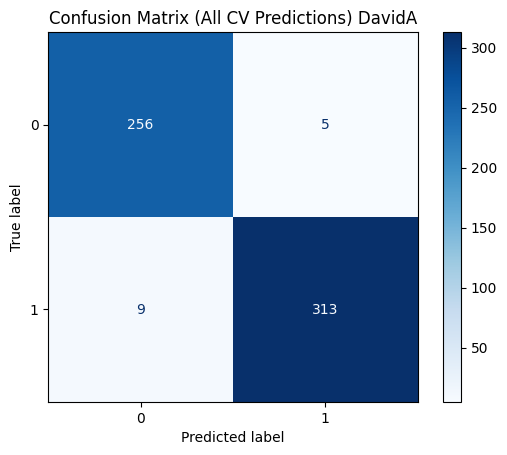

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
DavidA
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.033        0.942       0.032     0.95   0.027
1           0.954          0.025        0.966       0.027     0.96   0.022


       Accuracy  F1 Macro
score  0.900707  0.878707


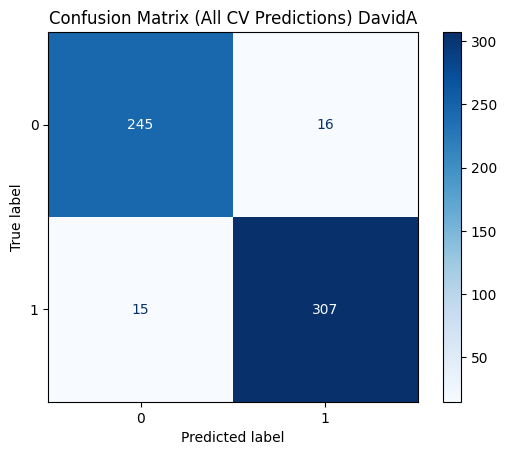

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.926          0.041        0.923       0.036    0.923   0.023
1           0.939          0.028        0.938       0.038    0.938   0.020


       Accuracy  F1 Macro
score  0.874786  0.810993


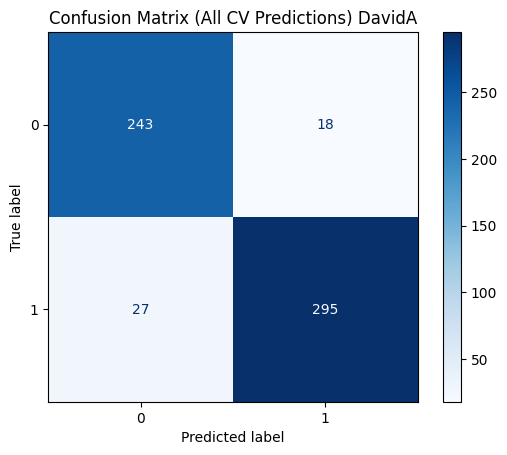

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.952          0.020        0.916       0.042    0.933   0.027
1           0.934          0.032        0.963       0.016    0.948   0.020


       Accuracy  F1 Macro
score  0.895476  0.872942


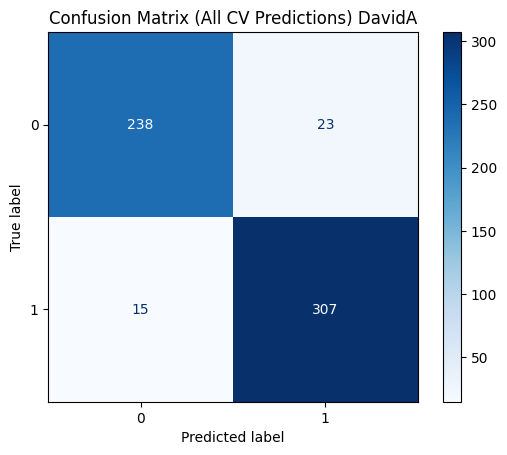

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
DavidA
KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.844          0.070        0.874       0.039    0.856   0.030
1           0.895          0.029        0.863       0.063    0.877   0.031


       Accuracy  F1 Macro
score  0.719098  0.700219


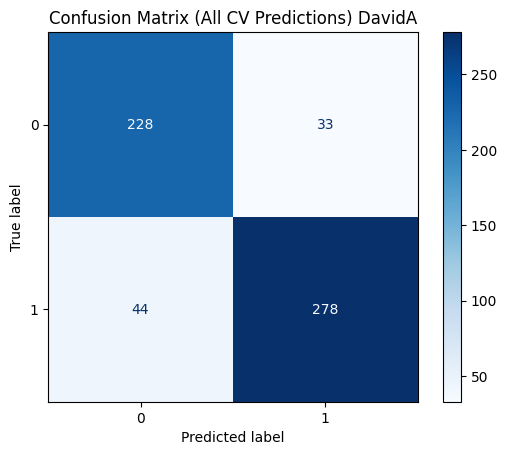

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.864          0.061        0.870       0.033    0.865   0.032
1           0.894          0.025        0.885       0.054    0.889   0.030


       Accuracy  F1 Macro
score  0.719069  0.698567


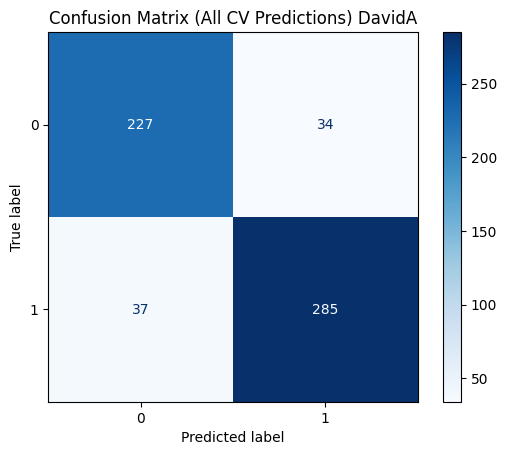

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.864          0.061        0.870       0.033    0.865   0.032
1           0.894          0.025        0.885       0.054    0.889   0.030


       Accuracy  F1 Macro
score  0.719069  0.698567


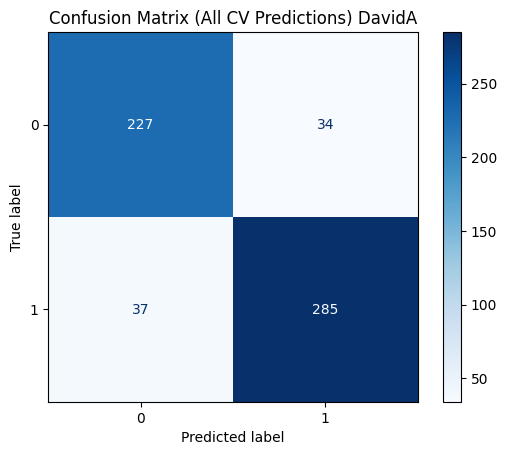

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
EmilijaM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 2                  4           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.014        0.962       0.018    0.960   0.012
1           0.968          0.015        0.964       0.013    0.966   0.010


       Accuracy  F1 Macro
score  0.906877  0.902042


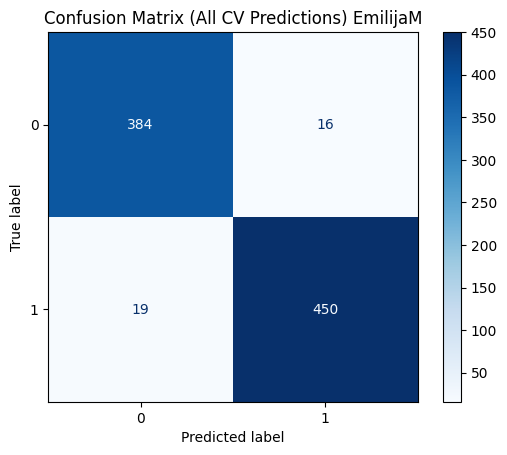

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.015        0.960       0.015    0.953   0.009
1           0.966          0.012        0.953       0.014    0.959   0.008


       Accuracy  F1 Macro
score  0.905727  0.898703


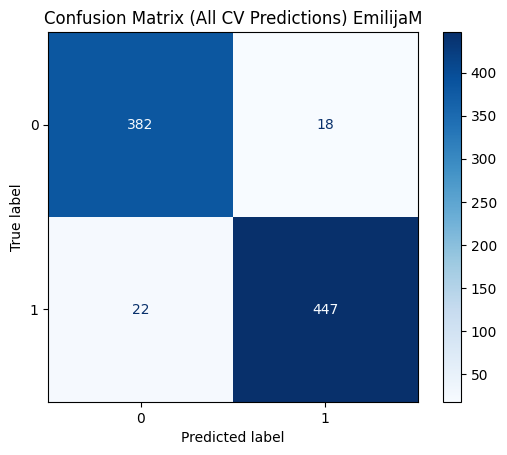

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 1                  9           262


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.014        0.962       0.018    0.958   0.011
1           0.968          0.015        0.960       0.012    0.964   0.009


       Accuracy  F1 Macro
score  0.905721  0.899926


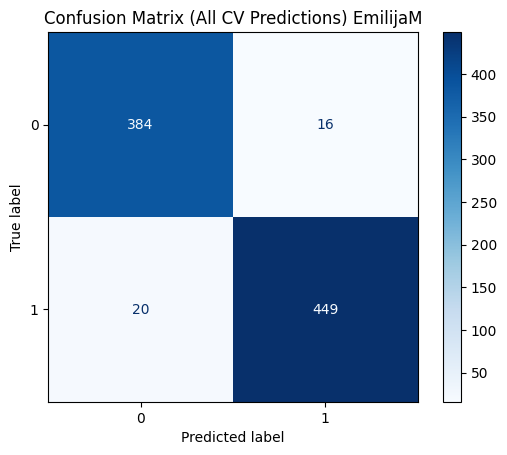

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
EmilijaM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.937          0.024        0.920       0.026    0.928   0.018
1           0.933          0.021        0.947       0.022    0.940   0.016


       Accuracy  F1 Macro
score  0.883862  0.873337


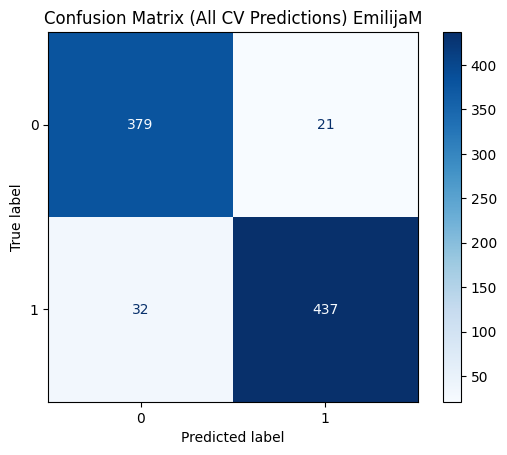

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.017        0.912       0.025    0.927   0.018
1           0.928          0.019        0.953       0.014    0.940   0.014


       Accuracy  F1 Macro
score  0.863165  0.883552


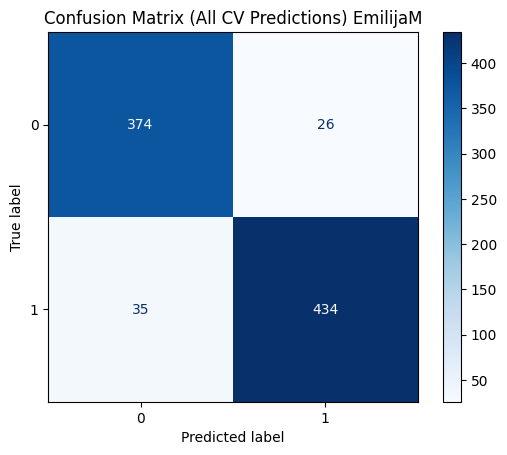

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.909          0.027        0.918       0.013    0.913   0.013
1           0.929          0.010        0.921       0.026    0.925   0.013


       Accuracy  F1 Macro
score  0.860813  0.881121


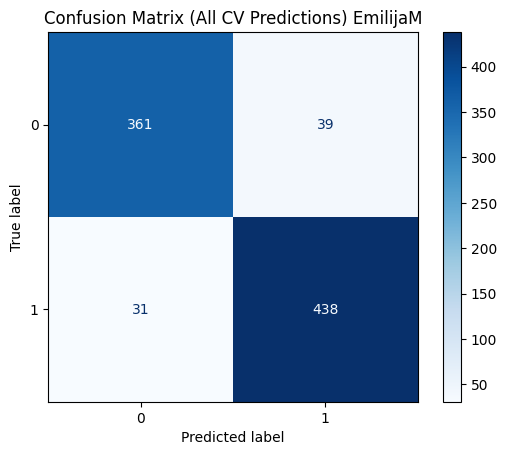

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
EmilijaM
KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.903          0.043        0.865       0.048    0.882   0.029
1           0.890          0.035        0.919       0.040    0.903   0.023


       Accuracy  F1 Macro
score  0.841293  0.835381


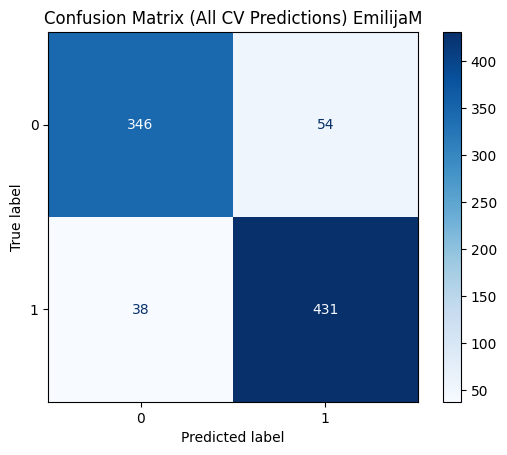

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            9  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.882          0.040        0.845       0.032    0.862   0.022
1           0.873          0.022        0.902       0.039    0.886   0.021


       Accuracy  F1 Macro
score  0.840144  0.835041


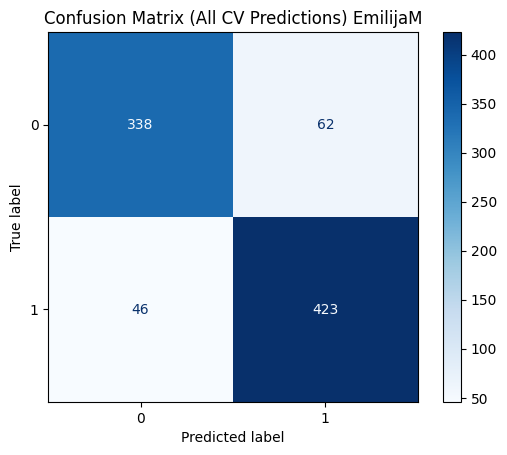

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.905          0.044        0.815       0.047    0.856   0.032
1           0.855          0.030        0.925       0.039    0.888   0.023


       Accuracy  F1 Macro
score  0.837871  0.830331


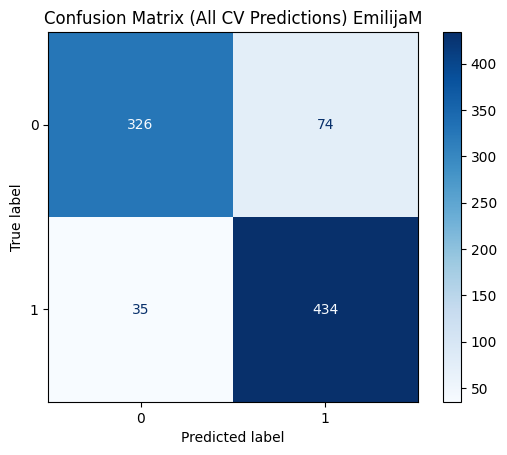

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
FilipP
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         19         sqrt                 1                 10           426


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.961          0.027        0.932       0.021    0.946   0.013
1           0.947          0.016        0.969       0.023    0.958   0.011


       Accuracy  F1 Macro
score  0.933885  0.929866


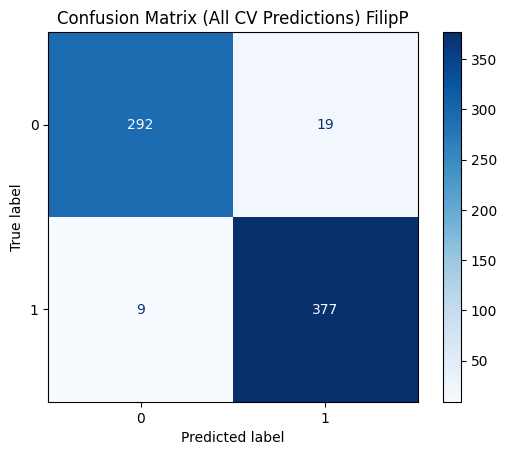

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         46         log2                 2                  3           317


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962          0.038        0.932       0.021    0.947   0.016
1           0.947          0.015        0.969       0.032    0.958   0.015


       Accuracy  F1 Macro
score  0.932446  0.931256


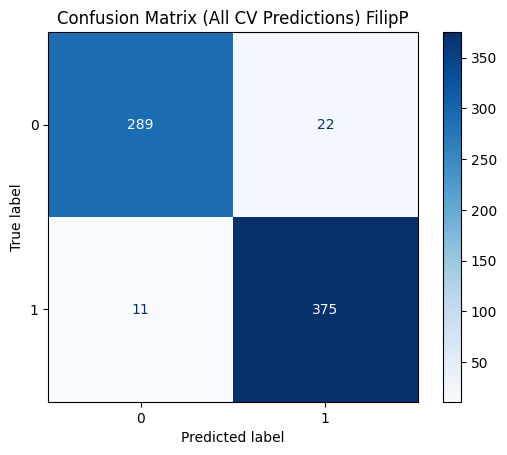

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 2                  4           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.971          0.031        0.939       0.033    0.954   0.025
1           0.952          0.025        0.977       0.025    0.964   0.020


       Accuracy  F1 Macro
score  0.931007  0.928271


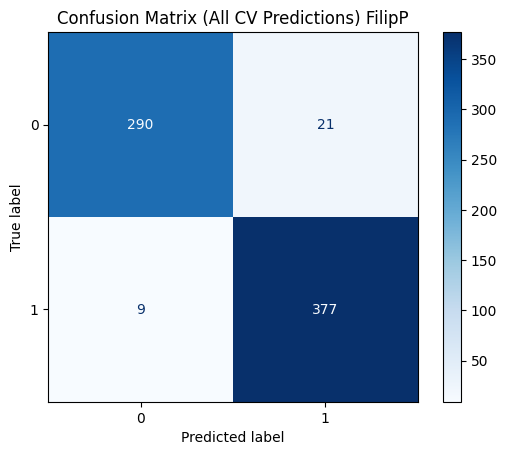

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
FilipP
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.905          0.029        0.936       0.010    0.920   0.017
1           0.947          0.008        0.920       0.028    0.933   0.016


       Accuracy  F1 Macro
score  0.902333  0.905403


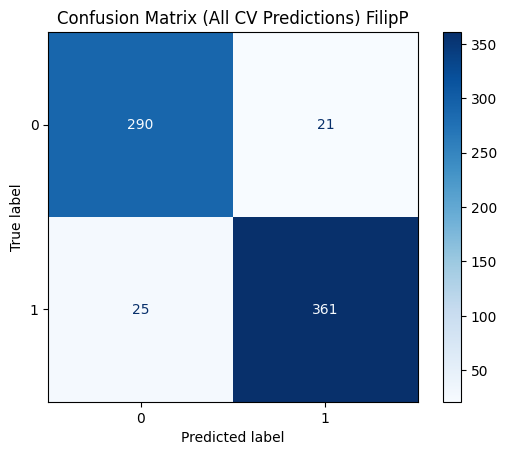

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.904          0.052        0.920       0.031    0.910   0.017
1           0.935          0.021        0.917       0.048    0.925   0.019


       Accuracy  F1 Macro
score  0.869239  0.825603


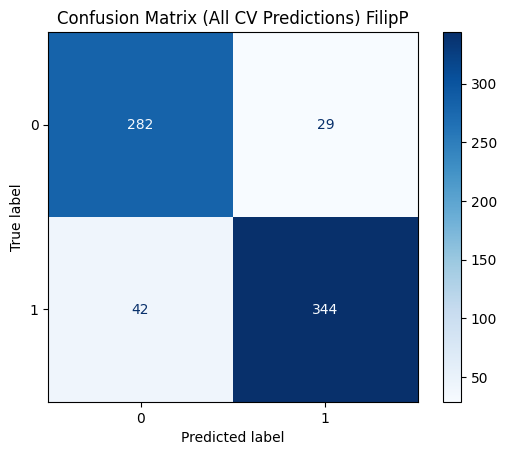

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.923          0.042        0.923       0.030    0.922   0.020
1           0.938          0.021        0.935       0.041    0.936   0.019


       Accuracy  F1 Macro
score  0.896588   0.89952


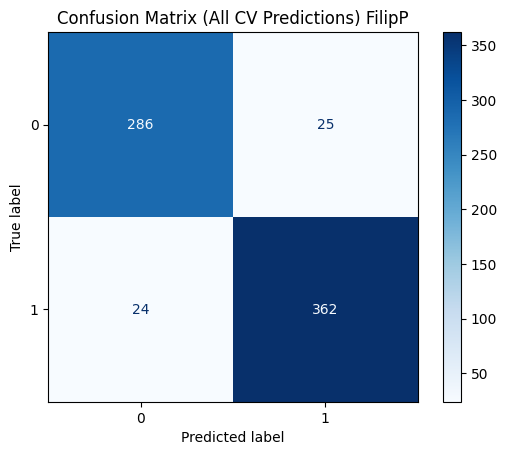

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
FilipP
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.791          0.023        0.862       0.026    0.825   0.023
1           0.880          0.021        0.816       0.022    0.847   0.020


       Accuracy  F1 Macro
score  0.706053   0.69614


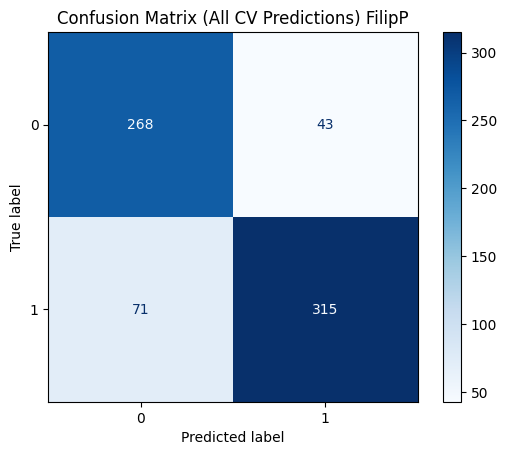

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.756          0.014        0.897       0.024    0.820   0.016
1           0.903          0.021        0.767       0.013    0.829   0.014


       Accuracy  F1 Macro
score  0.698911  0.694674


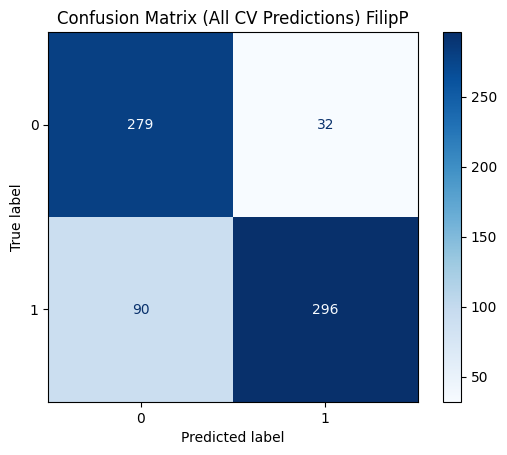

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.756          0.014        0.897       0.024    0.820   0.016
1           0.903          0.021        0.767       0.013    0.829   0.014


       Accuracy  F1 Macro
score  0.698911  0.694674


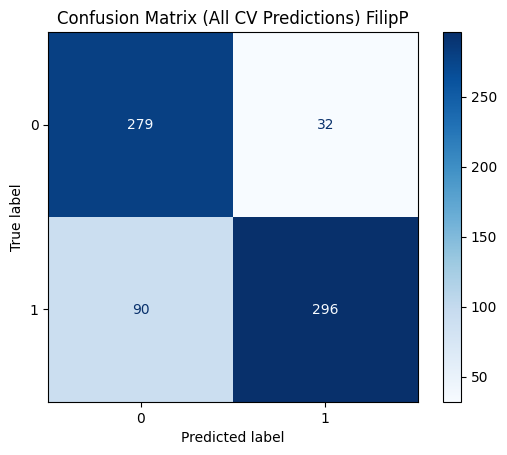

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
IlijaM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.993          0.009        0.968       0.017     0.98   0.012
1           0.984          0.009        0.996       0.004     0.99   0.006


       Accuracy  F1 Macro
score  0.973964  0.957987


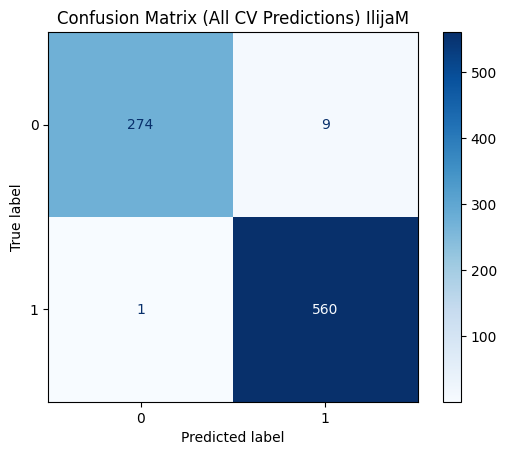

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 4                  7           352


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.993          0.009        0.965       0.022    0.978   0.015
1           0.983          0.011        0.996       0.004    0.989   0.007


       Accuracy  F1 Macro
score  0.971598  0.966093


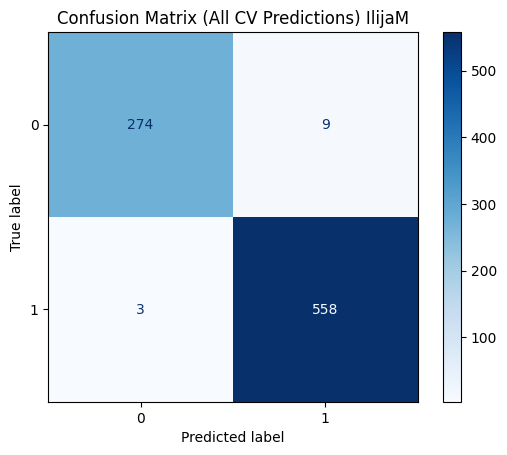

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         sqrt                 4                  3           466


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.993          0.009        0.961       0.023    0.977   0.015
1           0.981          0.011        0.996       0.004    0.989   0.007


       Accuracy  F1 Macro
score  0.969231  0.964712


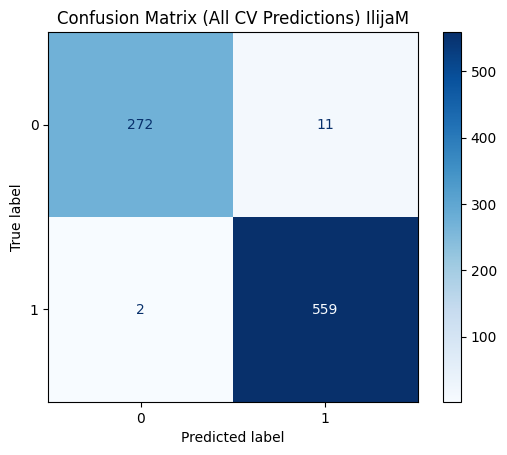

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
IlijaM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         26         sqrt                 1                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.924          0.039        0.919       0.014    0.921   0.019
1           0.959          0.007        0.961       0.020    0.960   0.010


       Accuracy  F1 Macro
score   0.91473  0.870332


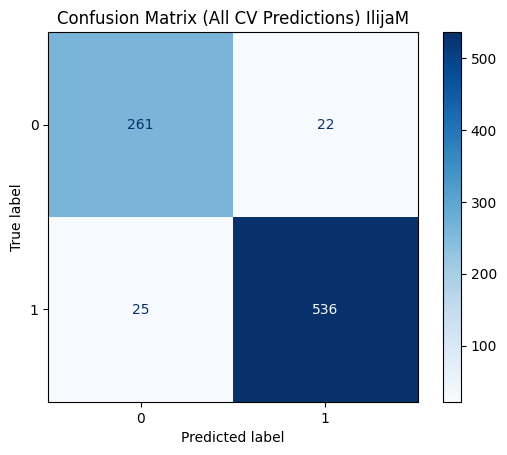

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.013        0.933       0.013    0.946   0.011
1           0.967          0.006        0.980       0.007    0.973   0.006


       Accuracy  F1 Macro
score  0.900592   0.88306


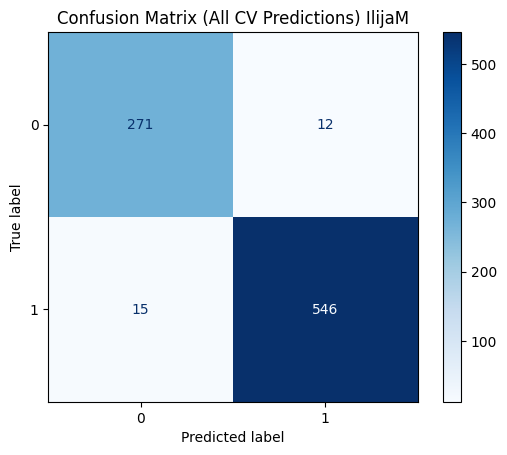

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         46         sqrt                 3                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.918          0.029        0.901       0.027    0.909   0.017
1           0.951          0.012        0.959       0.017    0.955   0.009


       Accuracy  F1 Macro
score  0.924246  0.924031


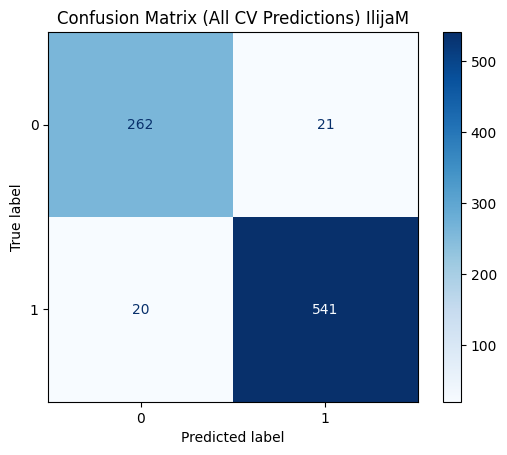

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
IlijaM
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.888          0.037        0.880       0.035    0.883   0.024
1           0.940          0.017        0.943       0.020    0.941   0.012


       Accuracy  F1 Macro
score  0.895858  0.879813


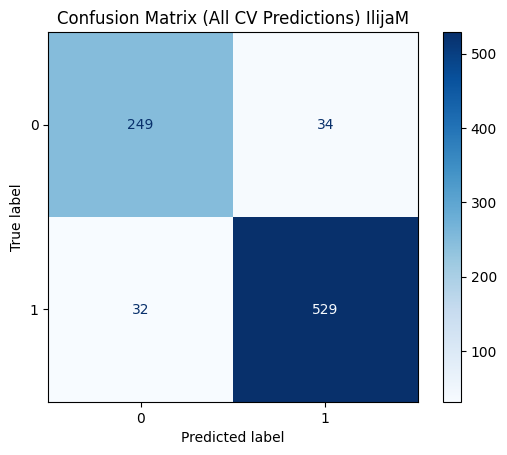

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            9  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.893          0.036        0.898       0.057    0.894   0.030
1           0.949          0.028        0.945       0.021    0.947   0.014


       Accuracy  F1 Macro
score  0.891117  0.875136


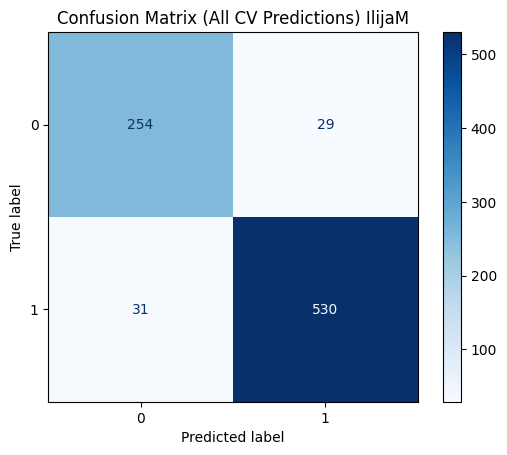

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            8  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.893          0.044        0.898       0.051    0.894   0.034
1           0.949          0.025        0.945       0.024    0.946   0.016


       Accuracy  F1 Macro
score   0.88992  0.873297


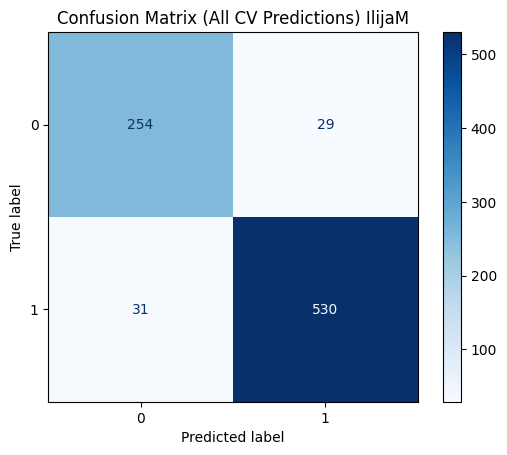

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
JakovGj
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         19         sqrt                 1                 10           426


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.951          0.026        0.874       0.028    0.910   0.018
1           0.902          0.019        0.962       0.021    0.931   0.014


       Accuracy  F1 Macro
score  0.892473  0.883203


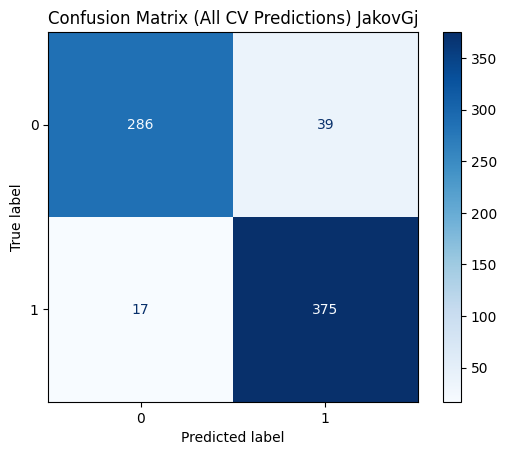

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 1                  9           262


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.954          0.025        0.883       0.025    0.917   0.014
1           0.909          0.017        0.964       0.020    0.936   0.011


       Accuracy  F1 Macro
score  0.891084  0.888445


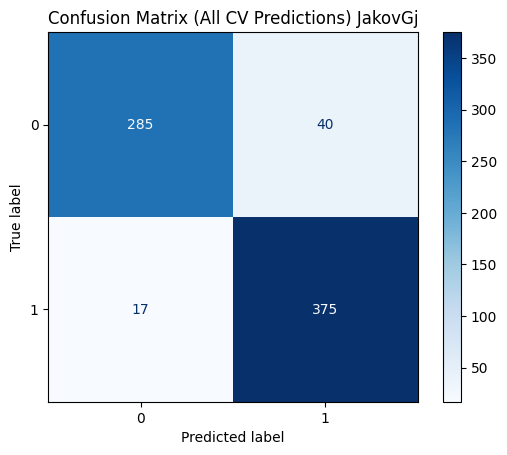

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         log2                 2                  5           369


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.944          0.018        0.874       0.026    0.907   0.011
1           0.902          0.017        0.957       0.015    0.928   0.007


       Accuracy  F1 Macro
score   0.88411  0.884625


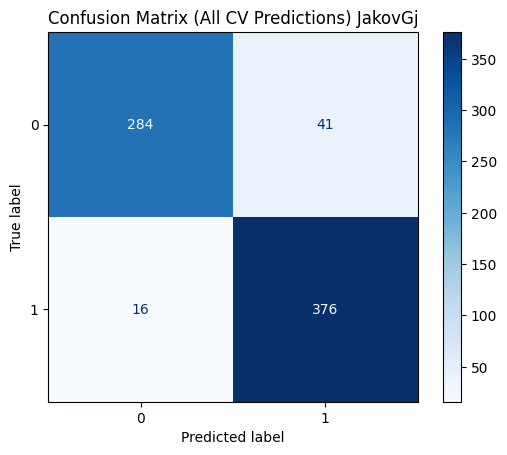

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
JakovGj
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.864          0.061        0.831       0.051    0.844   0.025
1           0.865          0.028        0.885       0.058    0.873   0.026


       Accuracy  F1 Macro
score  0.811577  0.808768


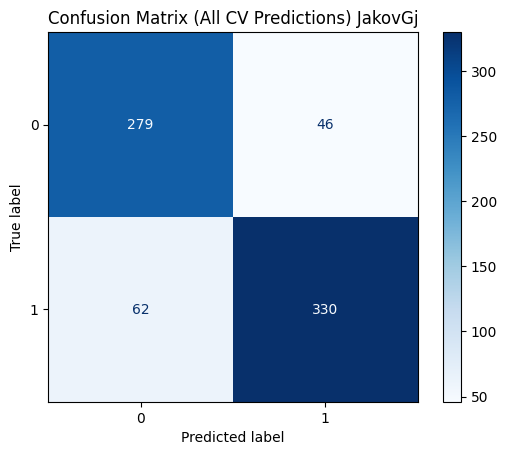

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.845          0.035        0.871       0.053    0.856   0.024
1           0.893          0.042        0.865       0.041    0.877   0.019


       Accuracy  F1 Macro
score  0.825534  0.852081


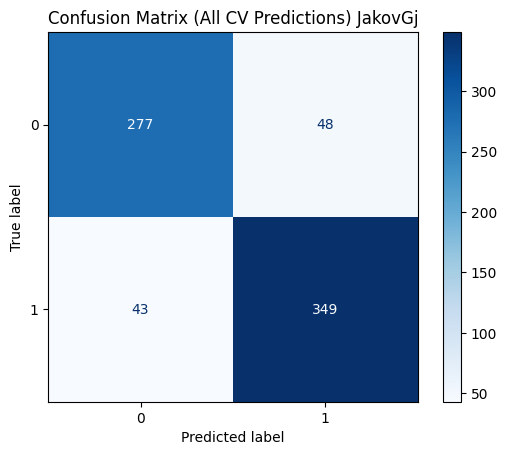

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.887          0.027        0.846       0.082    0.863   0.040
1           0.881          0.050        0.908       0.030    0.893   0.019


       Accuracy  F1 Macro
score  0.835237  0.821903


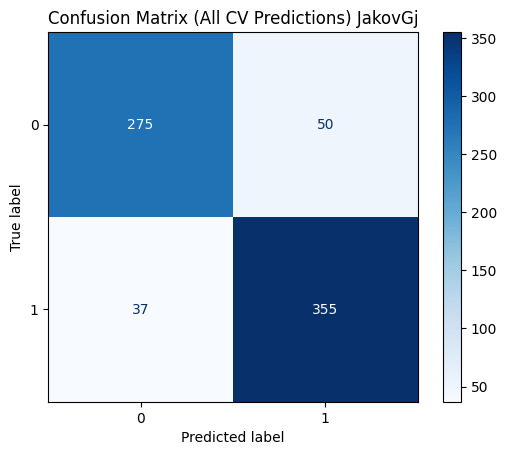

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
JakovGj
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.767          0.082        0.708       0.052    0.736   0.066
1           0.771          0.045        0.819       0.069    0.794   0.057


       Accuracy  F1 Macro
score  0.633188  0.606981


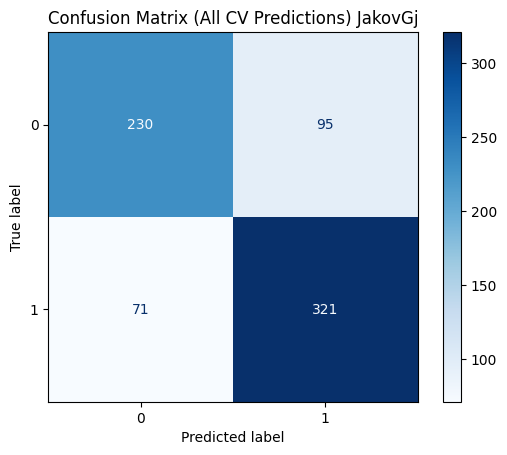

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.784          0.059        0.735       0.033    0.758   0.043
1           0.790          0.029        0.829       0.054    0.809   0.040


       Accuracy  F1 Macro
score  0.629021  0.603197


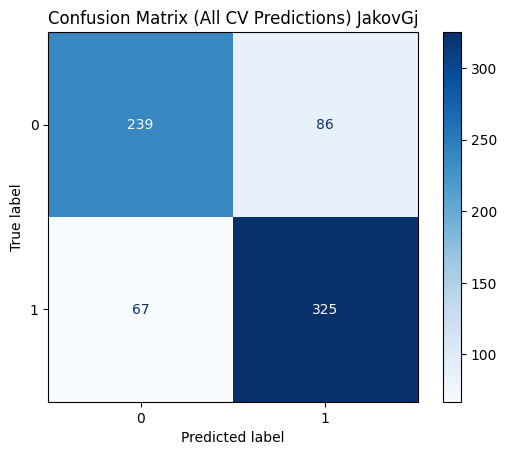

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.775          0.045        0.714       0.025    0.743   0.029
1           0.777          0.018        0.827       0.044    0.801   0.028


       Accuracy  F1 Macro
score  0.627574   0.60313


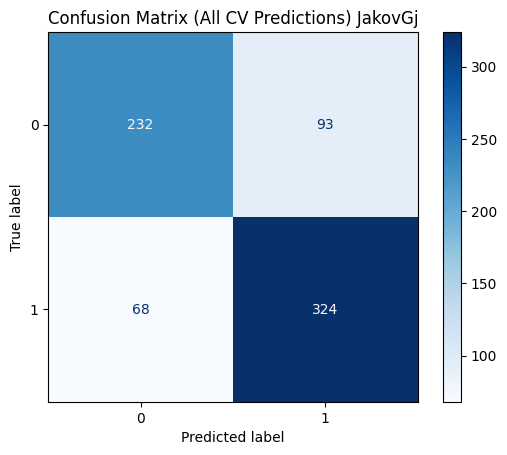

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
JanaGj
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.954          0.041        0.897       0.019    0.924   0.027
1           0.956          0.008        0.981       0.017    0.968   0.012


       Accuracy  F1 Macro
score  0.933011  0.901509


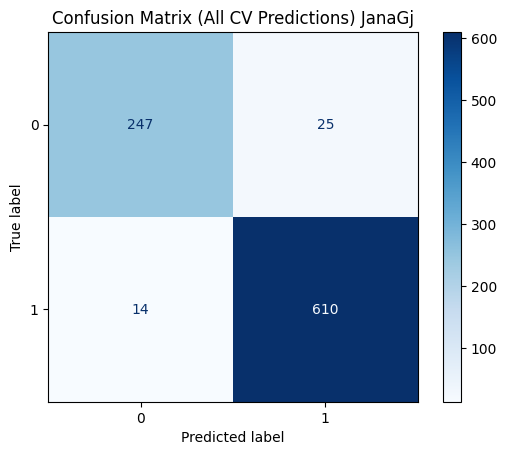

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.950          0.039        0.875       0.024    0.910   0.022
1           0.947          0.009        0.979       0.016    0.963   0.009


       Accuracy  F1 Macro
score  0.927436  0.902876


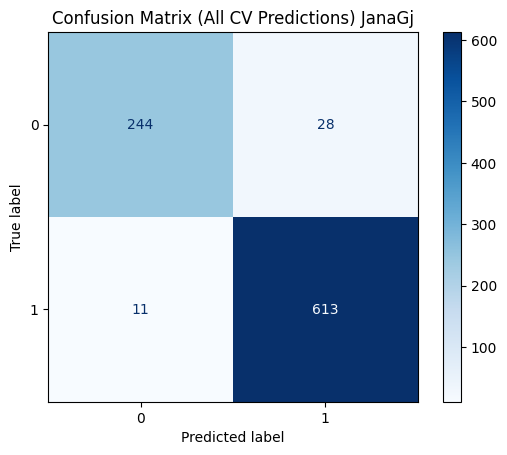

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.954          0.041        0.901       0.019    0.926   0.028
1           0.958          0.008        0.981       0.017    0.969   0.012


       Accuracy  F1 Macro
score  0.921862  0.906187


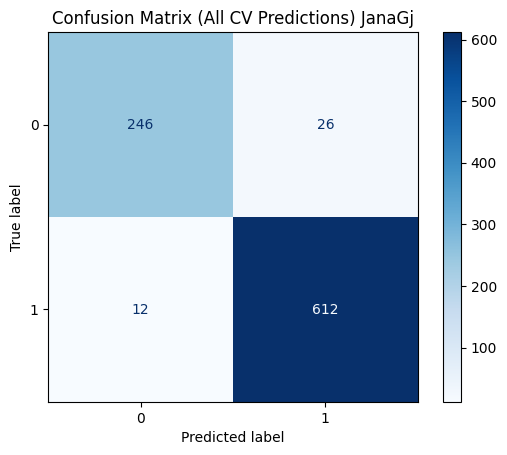

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
JanaGj
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.883          0.040        0.871       0.045    0.876   0.026
1           0.945          0.018        0.949       0.021    0.946   0.011


       Accuracy  F1 Macro
score  0.912917  0.888515


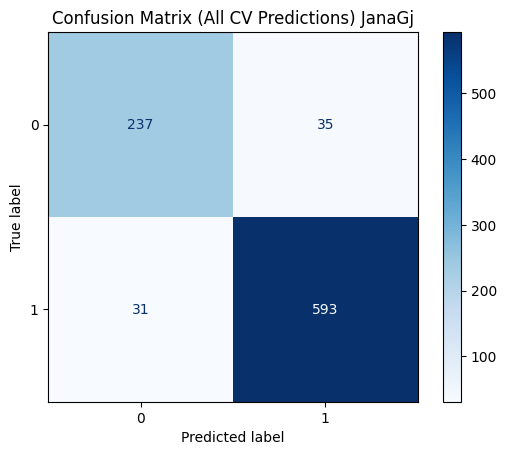

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.850          0.043        0.886       0.018    0.867   0.024
1           0.949          0.008        0.931       0.022    0.940   0.012


       Accuracy  F1 Macro
score  0.907331  0.887334


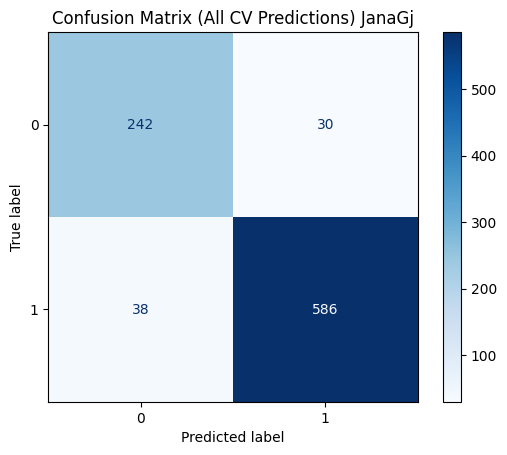

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         42         None                 4                  3   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.865          0.038        0.901       0.018    0.882   0.017
1           0.956          0.007        0.938       0.020    0.947   0.009


       Accuracy  F1 Macro
score  0.903979  0.884208


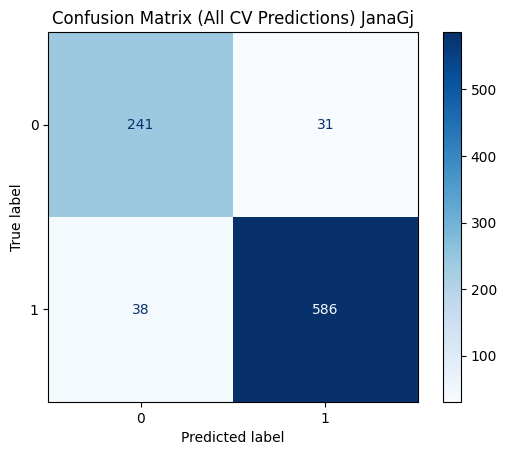

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
JanaGj
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.848          0.037        0.779       0.063    0.811   0.047
1           0.908          0.024        0.939       0.015    0.923   0.017


       Accuracy  F1 Macro
score  0.841515  0.802551


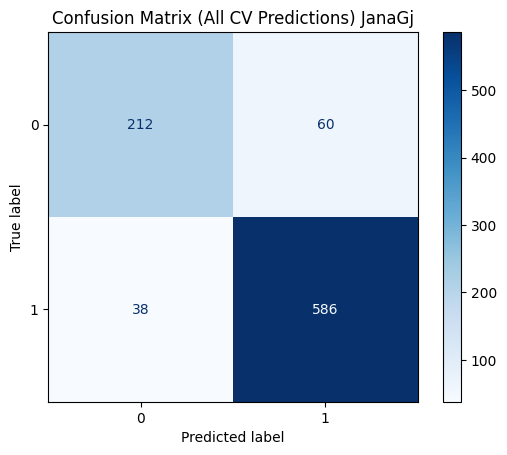

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.810          0.031        0.871       0.036    0.839   0.025
1           0.942          0.015        0.910       0.018    0.926   0.011


       Accuracy  F1 Macro
score  0.835959  0.800745


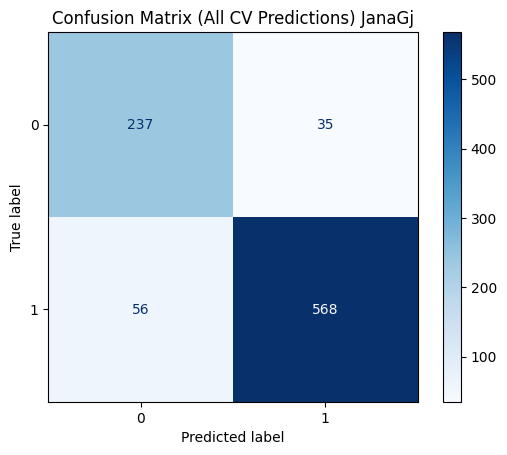

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.810          0.031        0.871       0.036    0.839   0.025
1           0.942          0.015        0.910       0.018    0.926   0.011


       Accuracy  F1 Macro
score  0.835959  0.800745


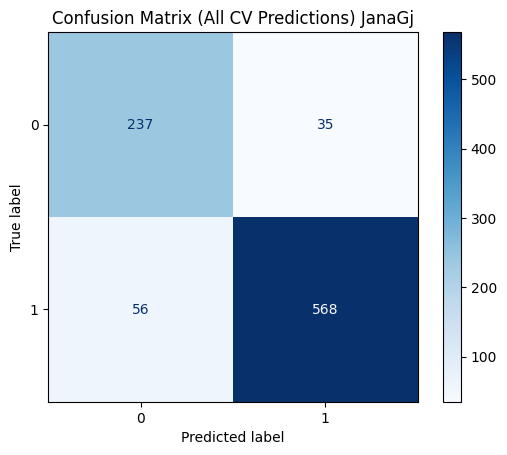

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
JanaH
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.023        0.798       0.058    0.869   0.036
1           0.897          0.027        0.979       0.011    0.936   0.015


       Accuracy  F1 Macro
score  0.887528  0.843167


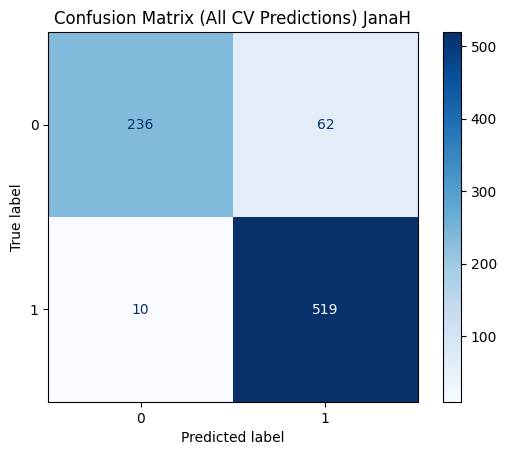

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  7           485


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.959          0.024        0.785       0.054    0.862   0.039
1           0.891          0.025        0.981       0.010    0.934   0.017


       Accuracy  F1 Macro
score   0.89356  0.849202


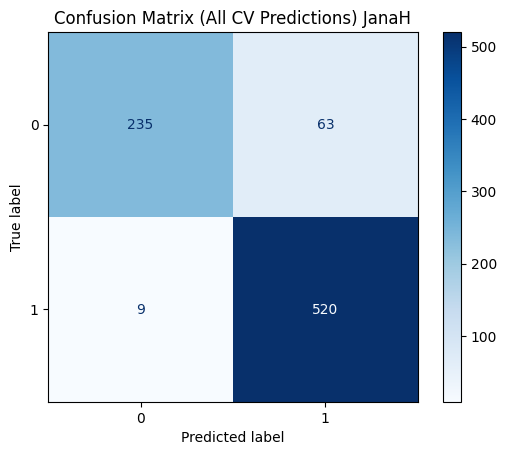

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.023        0.802       0.047    0.871   0.032
1           0.898          0.022        0.979       0.011    0.937   0.014


       Accuracy  F1 Macro
score  0.892355  0.840521


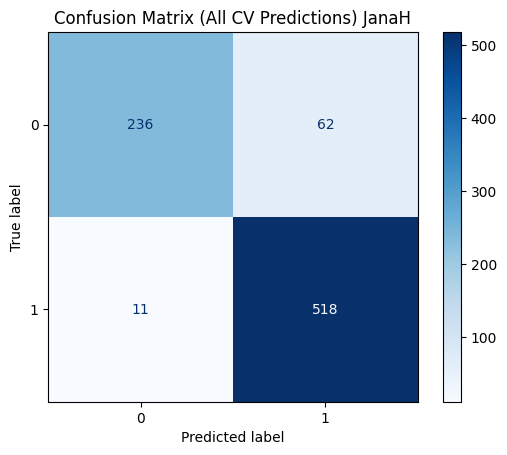

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
JanaH
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.860          0.065        0.788       0.053    0.820   0.033
1           0.887          0.023        0.924       0.036    0.905   0.018


       Accuracy  F1 Macro
score  0.825929  0.777352


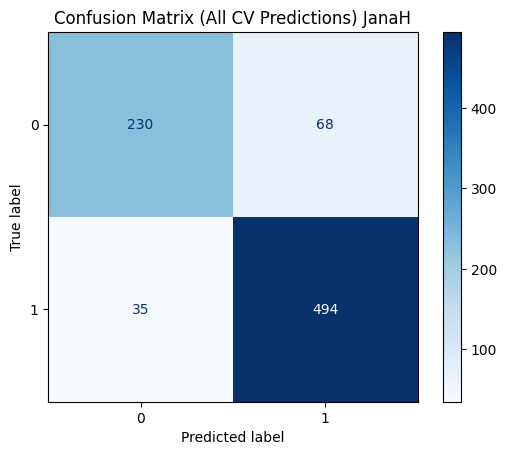

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.806          0.055        0.809        0.03    0.807   0.037
1           0.892          0.017        0.888        0.04    0.890   0.026


       Accuracy  F1 Macro
score  0.799168  0.762617


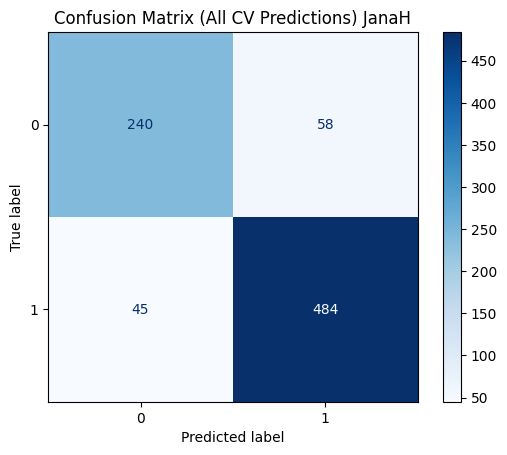

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         46         sqrt                 3                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.834          0.062        0.849       0.030    0.840   0.039
1           0.914          0.017        0.902       0.044    0.907   0.027


       Accuracy  F1 Macro
score  0.821066   0.77304


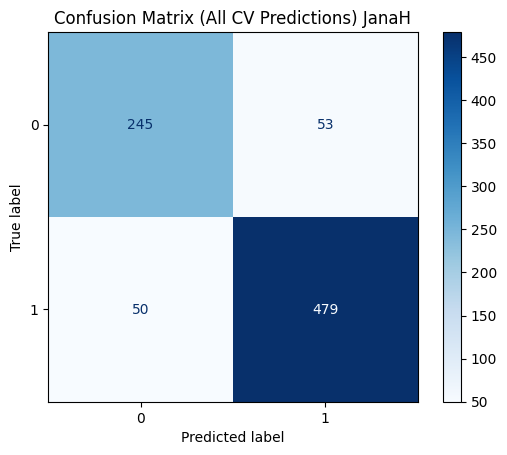

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
JanaH
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.855          0.054        0.718       0.066    0.778   0.048
1           0.855          0.027        0.930       0.029    0.891   0.020


       Accuracy  F1 Macro
score  0.747265  0.679845


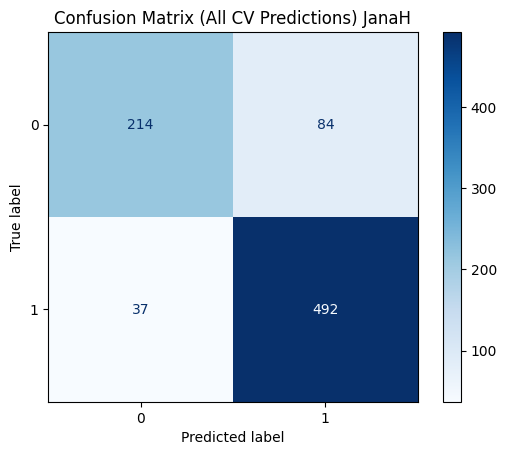

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.868          0.048        0.741       0.059    0.798   0.043
1           0.866          0.026        0.936       0.025    0.899   0.019


       Accuracy  F1 Macro
score  0.741212  0.676501


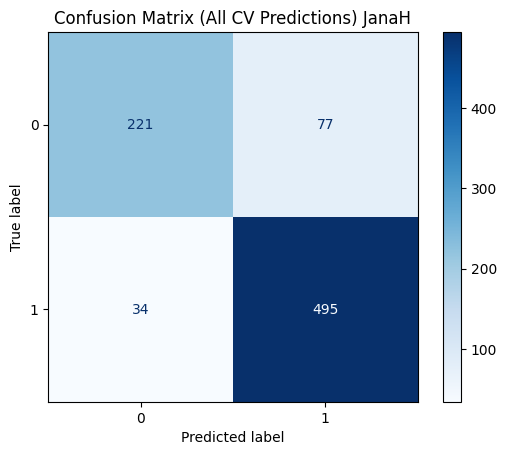

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.857          0.051        0.738       0.053    0.792   0.044
1           0.864          0.023        0.930       0.027    0.895   0.020


       Accuracy  F1 Macro
score  0.741198  0.673795


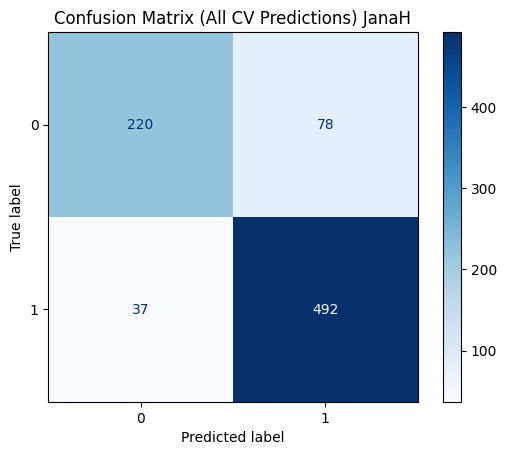

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
JovanaA
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         19         sqrt                 1                 10           426


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.032        0.863       0.017    0.906   0.018
1           0.944          0.007        0.981       0.013    0.962   0.008


       Accuracy  F1 Macro
score  0.876089   0.82547


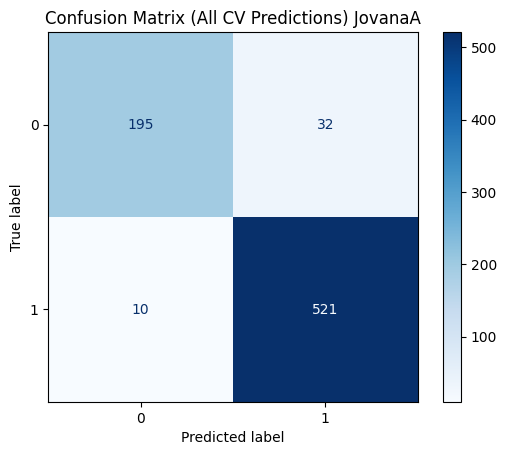

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.036        0.833       0.038    0.885   0.032
1           0.932          0.015        0.979       0.014    0.955   0.012


       Accuracy  F1 Macro
score  0.876089  0.833988


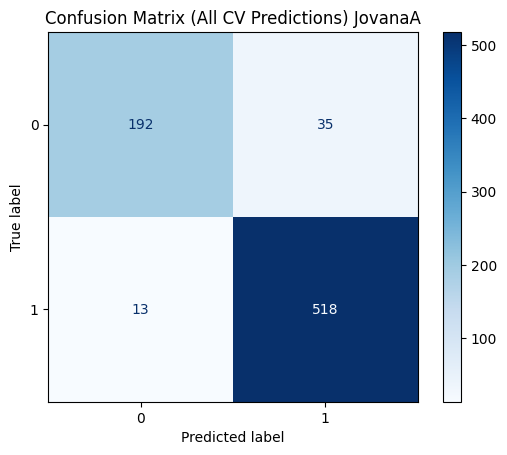

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.939          0.043        0.855       0.023    0.894   0.027
1           0.940          0.009        0.975       0.018    0.957   0.012


       Accuracy  F1 Macro
score  0.869519  0.835555


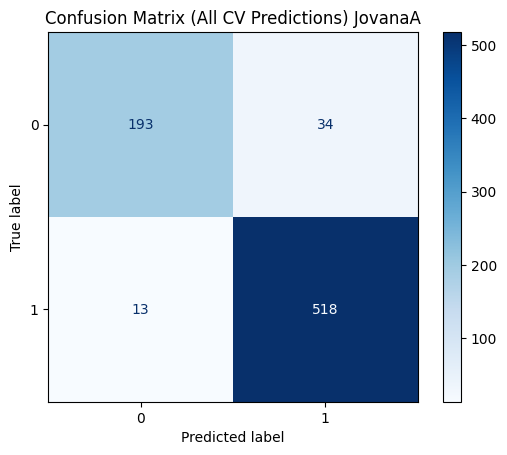

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
JovanaA
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         46         log2                 3                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.817          0.026        0.762       0.023    0.788   0.014
1           0.901          0.009        0.927       0.014    0.914   0.007


       Accuracy  F1 Macro
score  0.833932  0.779072


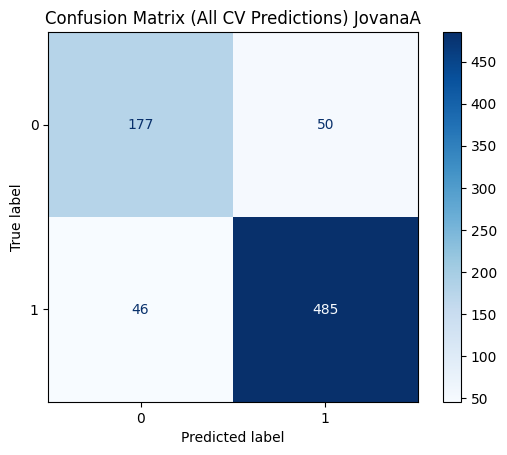

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         39         log2                 2                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.758          0.083        0.815       0.017    0.783   0.049
1           0.918          0.009        0.883       0.053    0.899   0.031


       Accuracy  F1 Macro
score  0.790293  0.757479


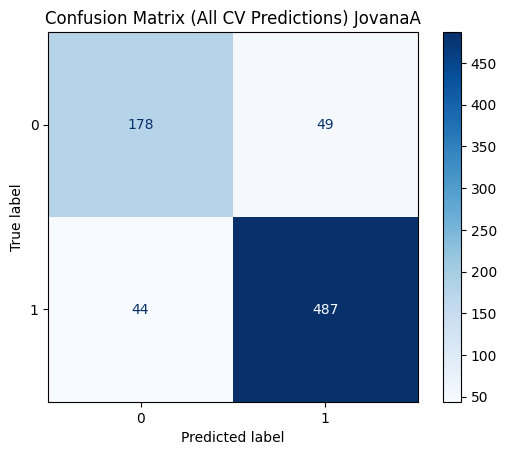

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.831          0.073        0.859       0.043    0.844   0.053
1           0.939          0.018        0.923       0.038    0.930   0.026


       Accuracy  F1 Macro
score  0.825932  0.743201


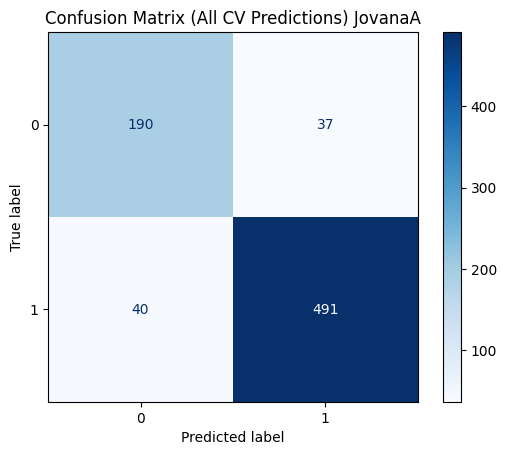

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
JovanaA
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            4  2  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.779          0.059        0.845       0.050    0.809   0.040
1           0.932          0.019        0.895       0.039    0.912   0.022


       Accuracy  F1 Macro
score   0.81409  0.766463


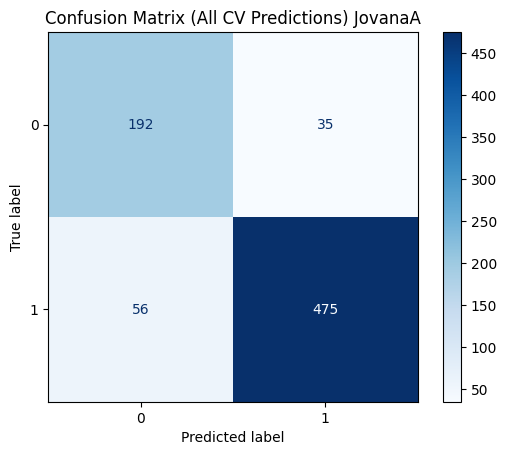

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            4  2  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.779          0.059        0.845       0.050    0.809   0.040
1           0.932          0.019        0.895       0.039    0.912   0.022


       Accuracy  F1 Macro
score   0.81409  0.766463


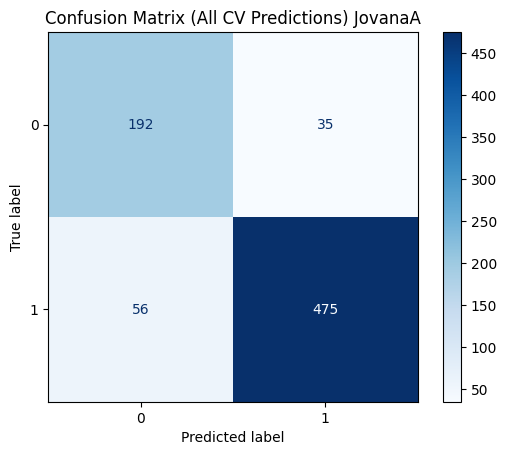

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.840           0.09        0.801       0.057    0.815   0.037
1           0.917           0.02        0.929       0.045    0.922   0.021


       Accuracy  F1 Macro
score  0.811494  0.758197


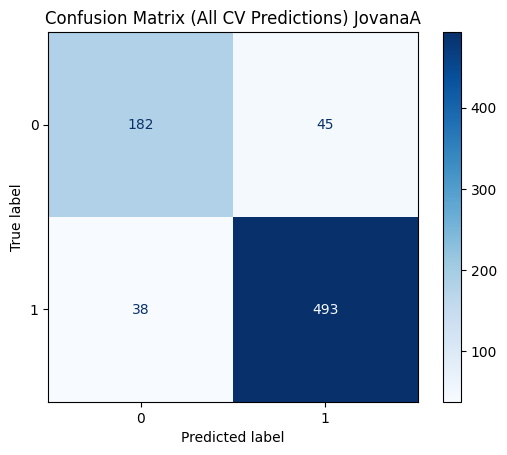

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
KristijanM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.980       0.018    0.988   0.012
1           0.992          0.007        0.998       0.003    0.995   0.005


       Accuracy  F1 Macro
score  0.962712  0.930976


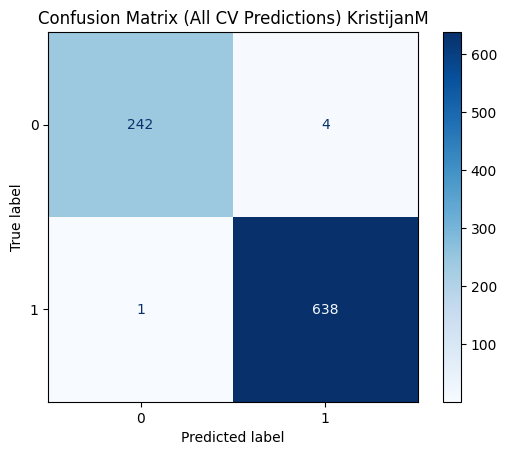

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.980       0.013    0.988   0.008
1           0.992          0.005        0.998       0.003    0.995   0.003


       Accuracy  F1 Macro
score  0.961582  0.935058


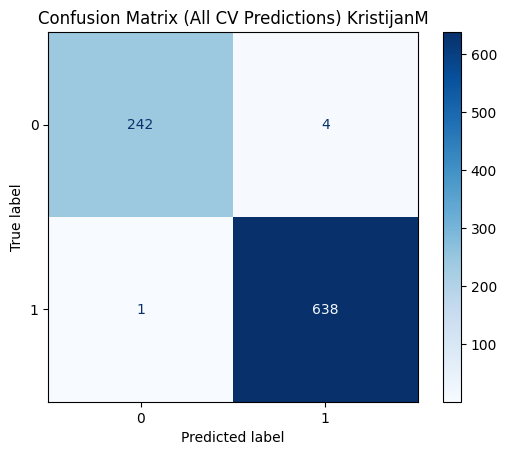

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.980       0.018    0.988   0.012
1           0.992          0.007        0.998       0.003    0.995   0.005


       Accuracy  F1 Macro
score  0.961582  0.919646


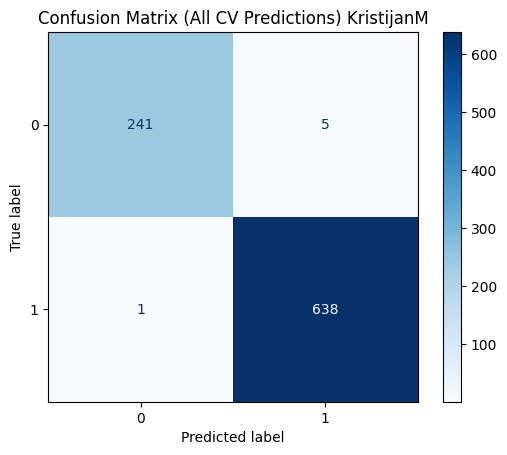

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
KristijanM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.033        0.947       0.027    0.951   0.022
1           0.980          0.010        0.983       0.014    0.981   0.009


       Accuracy  F1 Macro
score  0.963842   0.88882


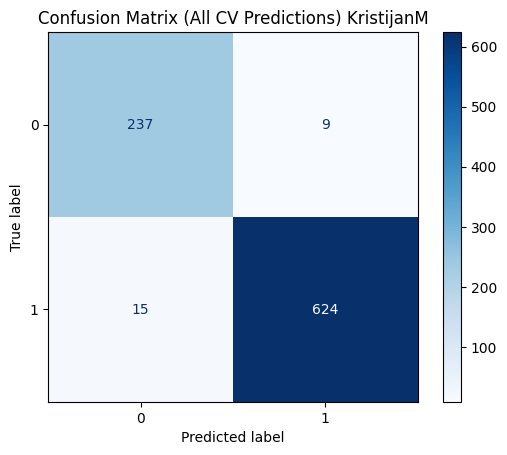

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.931          0.040        0.943       0.041    0.936   0.015
1           0.978          0.016        0.972       0.018    0.975   0.006


       Accuracy  F1 Macro
score  0.952542  0.913159


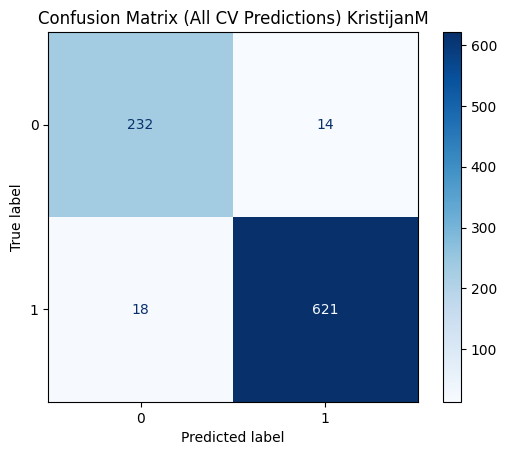

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         20         sqrt                 4                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.899          0.044        0.902       0.046    0.899   0.019
1           0.963          0.016        0.959       0.019    0.961   0.008


       Accuracy  F1 Macro
score  0.936723  0.858371


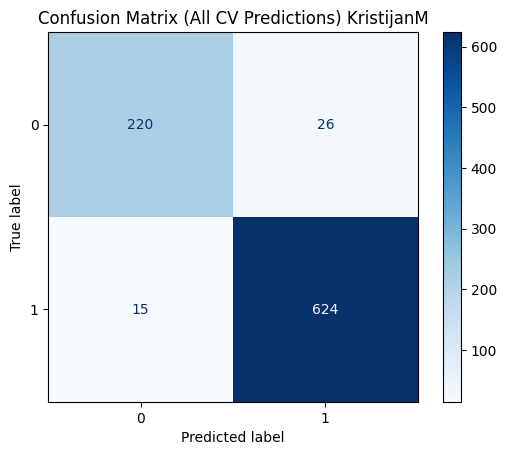

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
KristijanM
KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.934          0.050        0.931       0.021    0.932   0.027
1           0.973          0.008        0.973       0.022    0.973   0.012


       Accuracy  F1 Macro
score  0.909605  0.881547


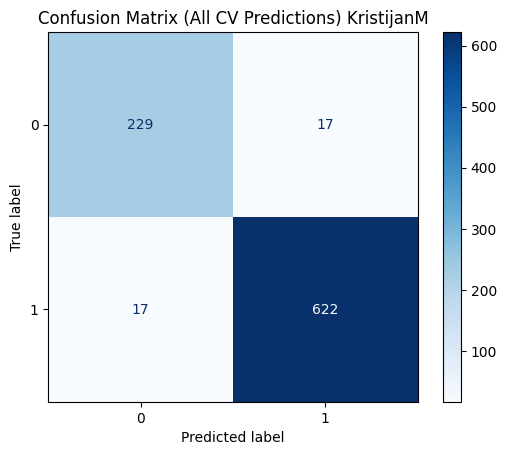

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.885          0.042        0.947       0.010    0.914    0.02
1           0.979          0.004        0.951       0.021    0.965    0.01


       Accuracy  F1 Macro
score  0.905085  0.879071


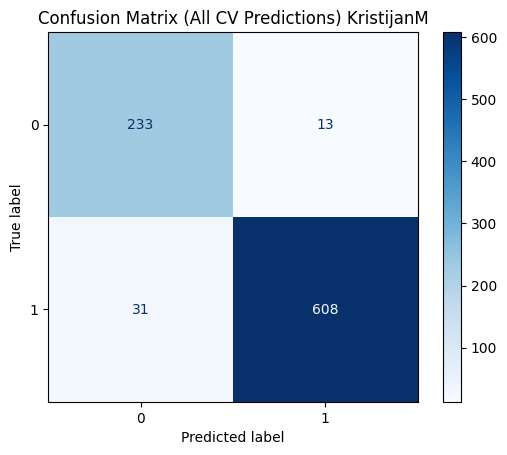

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.885          0.042        0.947       0.010    0.914    0.02
1           0.979          0.004        0.951       0.021    0.965    0.01


       Accuracy  F1 Macro
score  0.905085  0.879071


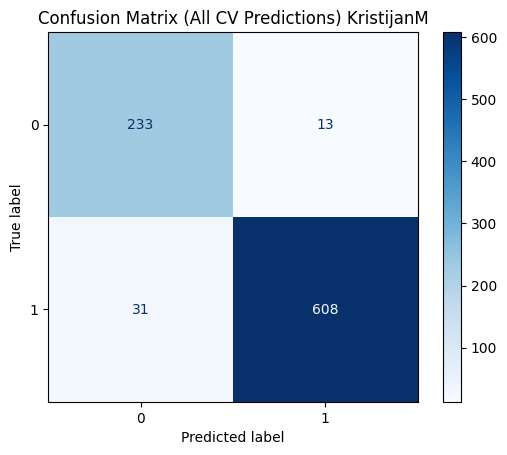

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
KristinaK
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.992       0.010    0.990   0.007
1           0.994          0.008        0.991       0.008    0.992   0.005


       Accuracy  F1 Macro
score  0.969643   0.97211


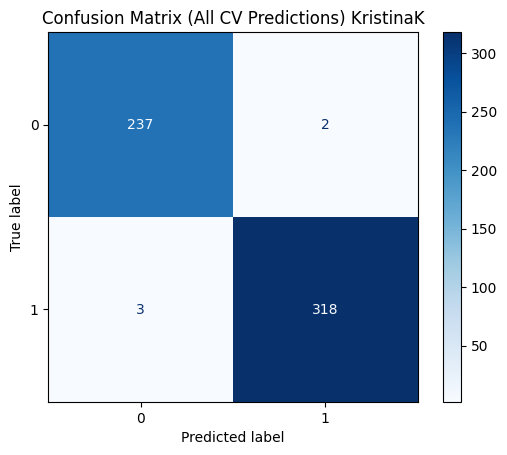

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.992       0.010    0.990   0.007
1           0.994          0.008        0.991       0.008    0.992   0.005


       Accuracy  F1 Macro
score  0.971429  0.970325


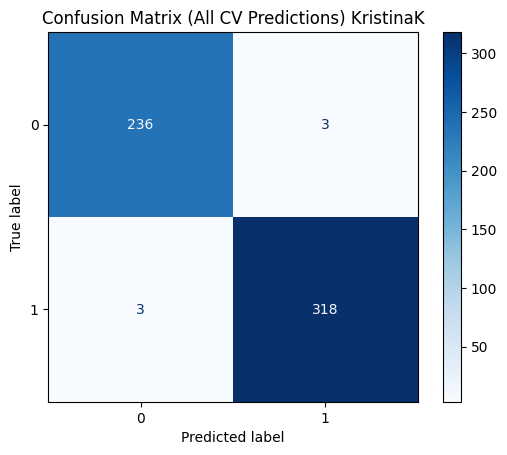

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.987          0.010        0.988       0.017    0.987   0.010
1           0.991          0.012        0.991       0.008    0.991   0.008


       Accuracy  F1 Macro
score  0.973214  0.970325


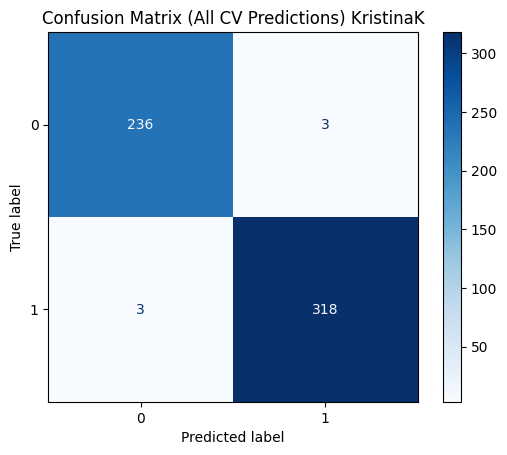

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
KristinaK
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.972          0.020        0.975       0.020    0.973   0.005
1           0.982          0.015        0.978       0.016    0.980   0.004


       Accuracy  F1 Macro
score     0.975  0.912934


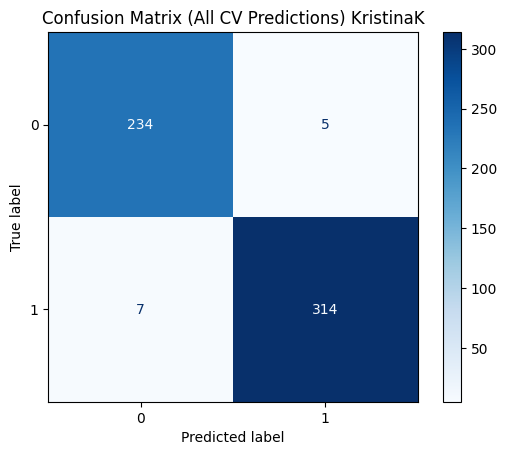

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         24         None                 2                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.983          0.016        0.975       0.016    0.979   0.011
1           0.982          0.012        0.988       0.012    0.984   0.009


       Accuracy  F1 Macro
score    0.9375  0.947749


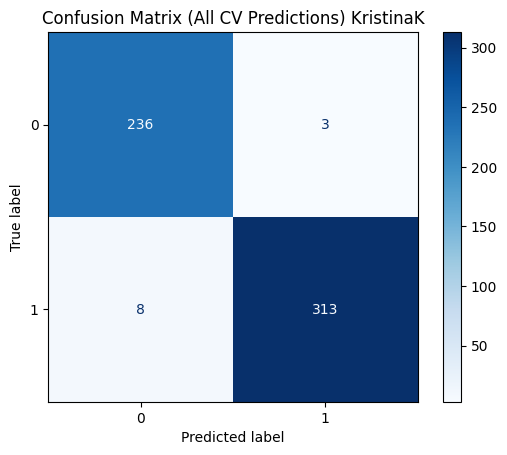

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.987          0.016        0.987       0.017    0.987   0.015
1           0.991          0.012        0.991       0.012    0.991   0.011


       Accuracy  F1 Macro
score  0.969643  0.968474


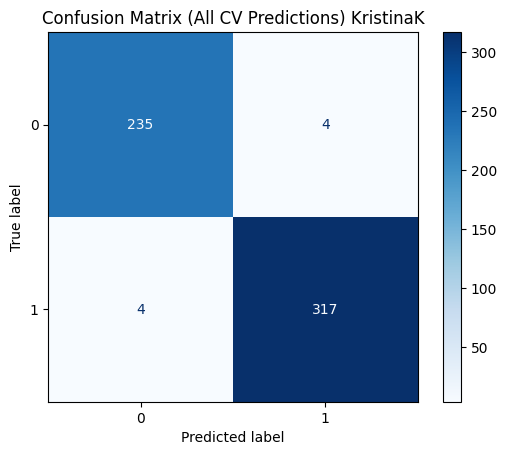

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
KristinaK
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.778          0.039        0.895       0.032    0.831   0.009
1           0.913          0.019        0.807       0.045    0.856   0.017


       Accuracy  F1 Macro
score  0.673214   0.65381


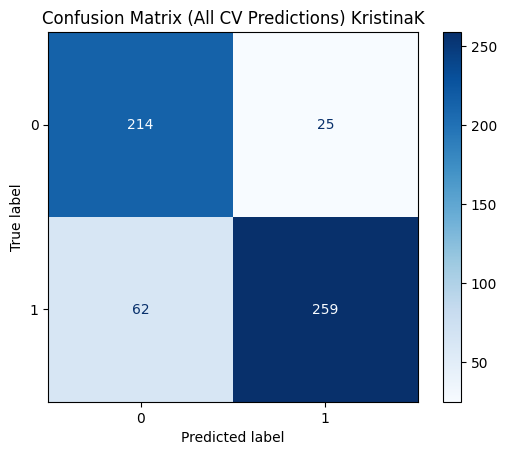

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.778          0.039        0.895       0.032    0.831   0.009
1           0.913          0.019        0.807       0.045    0.856   0.017


       Accuracy  F1 Macro
score  0.673214   0.65381


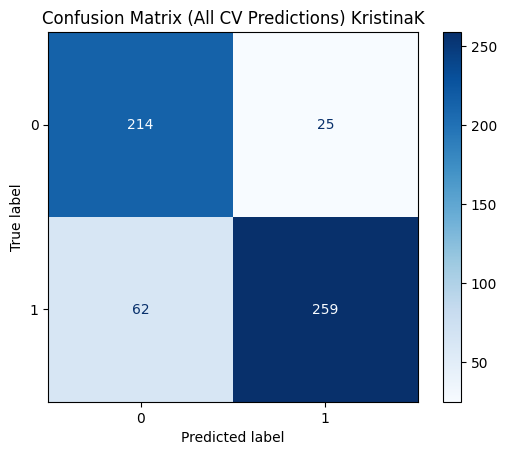

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.875          0.064        0.887       0.045    0.878   0.022
1           0.916          0.028        0.900       0.053    0.907   0.020


       Accuracy  F1 Macro
score  0.673214  0.641504


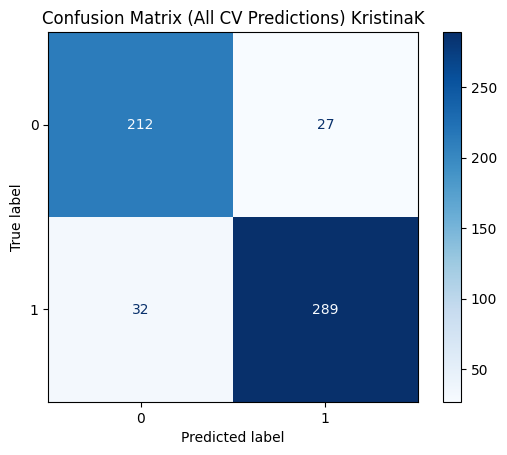

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MajaN
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.963          0.016        0.962       0.034    0.962   0.017
1           0.968          0.029        0.967       0.015    0.967   0.014


       Accuracy  F1 Macro
score  0.927961  0.918514


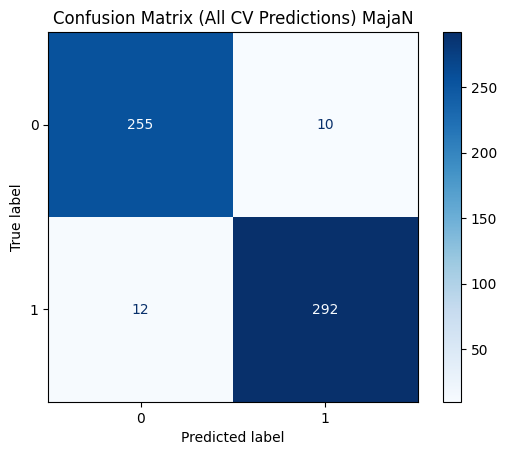

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         log2                 2                  5           369


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.959          0.014        0.958       0.030    0.958   0.018
1           0.964          0.026        0.964       0.012    0.964   0.015


       Accuracy  F1 Macro
score  0.920944  0.916095


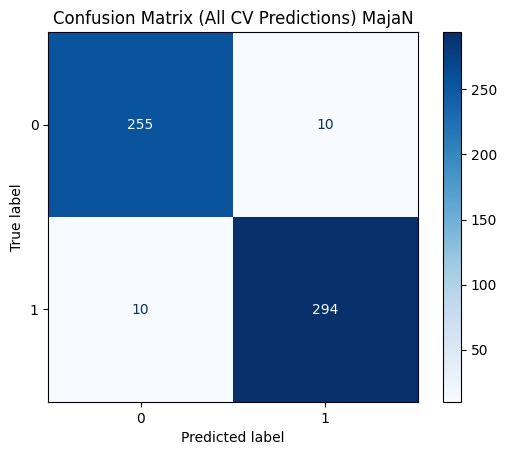

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.959          0.014        0.962       0.034    0.960   0.019
1           0.968          0.029        0.964       0.012    0.966   0.016


       Accuracy  F1 Macro
score  0.933225  0.920878


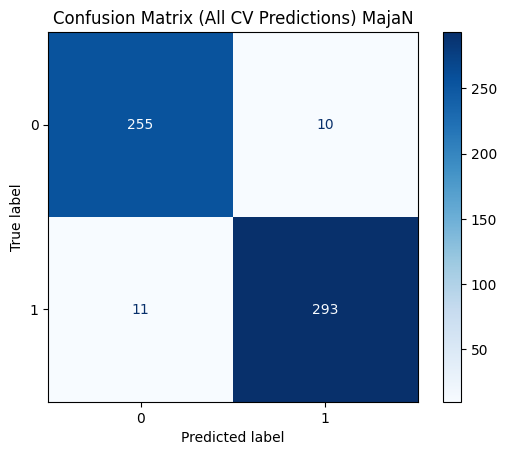

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MajaN
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.031        0.958       0.028    0.953   0.013
1           0.964          0.023        0.954       0.030    0.959   0.012


       Accuracy  F1 Macro
score   0.87356  0.869614


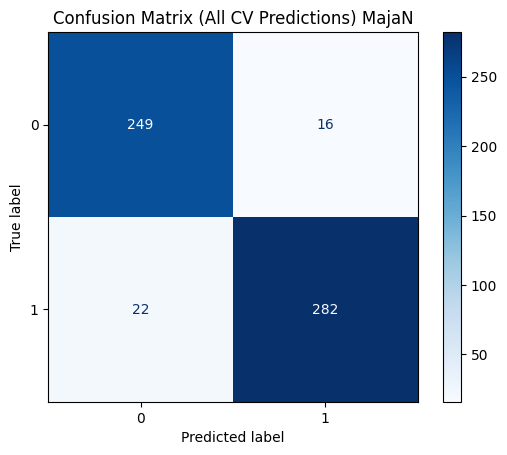

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.952          0.031        0.928       0.037    0.939   0.012
1           0.940          0.027        0.957       0.029    0.948   0.010


       Accuracy  F1 Macro
score  0.882347  0.851114


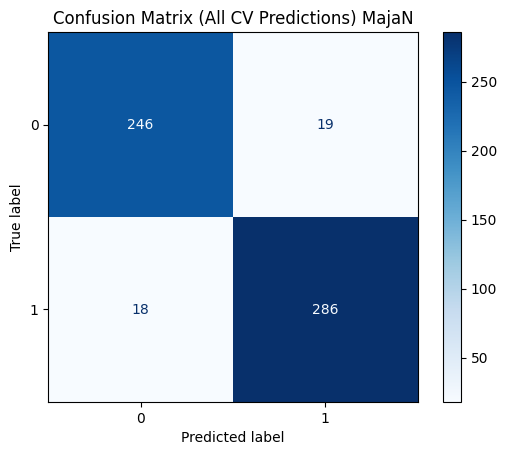

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.924          0.027        0.936       0.037    0.929   0.012
1           0.945          0.028        0.931       0.028    0.937   0.010


       Accuracy  F1 Macro
score  0.884102  0.890043


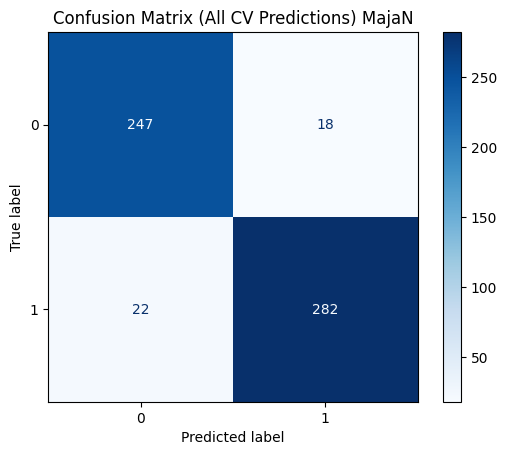

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MajaN
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.827          0.040        0.883       0.051    0.854   0.042
1           0.893          0.046        0.839       0.037    0.865   0.038


       Accuracy  F1 Macro
score  0.692827  0.661668


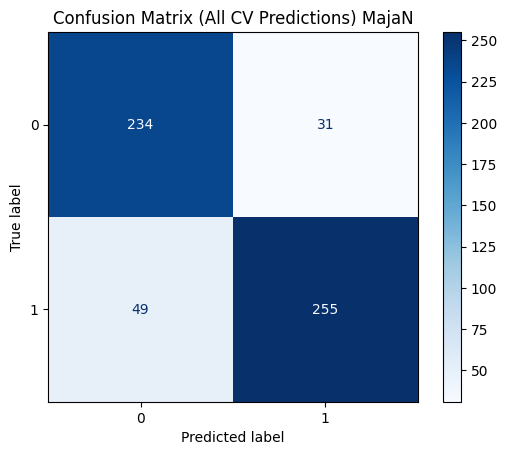

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.827          0.040        0.883       0.051    0.854   0.042
1           0.893          0.046        0.839       0.037    0.865   0.038


       Accuracy  F1 Macro
score  0.692827  0.661668


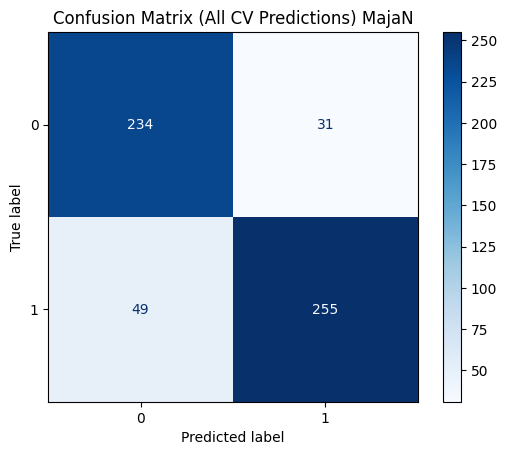

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.876          0.046        0.872       0.047    0.873   0.040
1           0.889          0.039        0.892       0.042    0.890   0.036


       Accuracy  F1 Macro
score  0.687564   0.65706


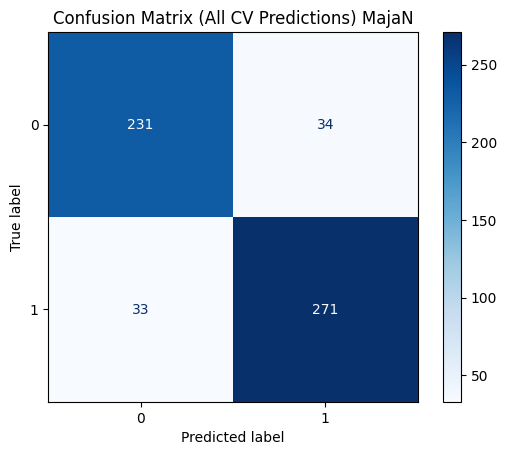

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MaksimP
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         35         log2                 3                  9           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.957          0.027        0.913       0.035    0.934   0.023
1           0.937          0.023        0.968       0.021    0.952   0.016


       Accuracy  F1 Macro
score  0.903425  0.883372


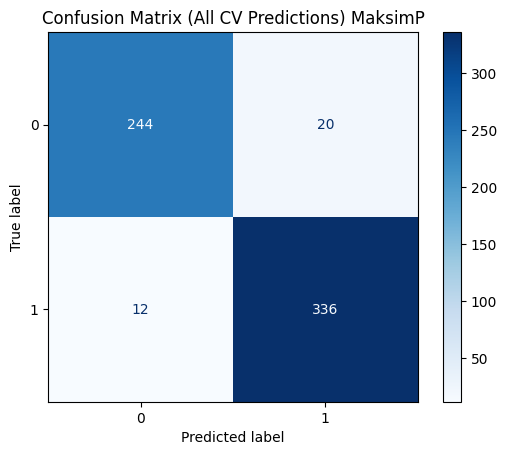

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  8           363


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.025        0.917       0.026    0.934   0.018
1           0.939          0.017        0.966       0.019    0.952   0.013


       Accuracy  F1 Macro
score  0.903425  0.883413


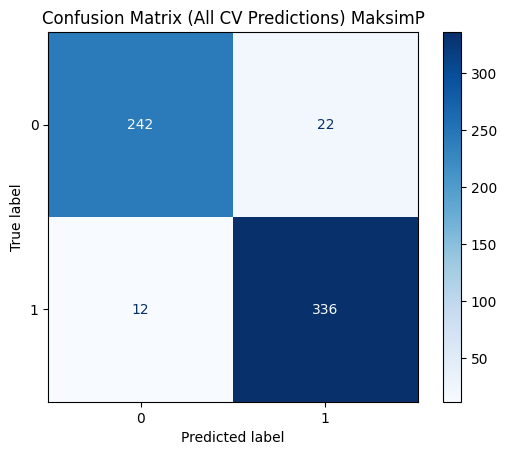

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  7           485


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.025        0.909       0.032    0.930   0.020
1           0.934          0.021        0.966       0.019    0.949   0.013


       Accuracy  F1 Macro
score  0.903425  0.884524


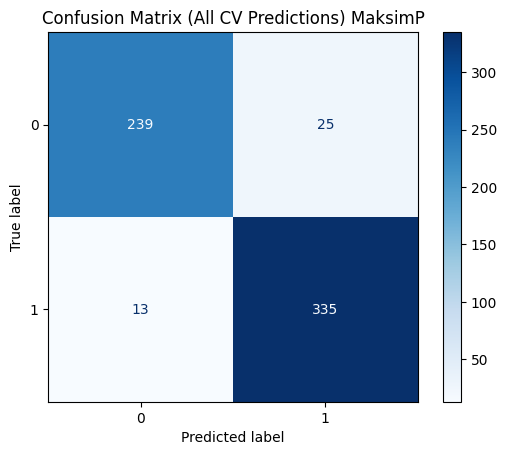

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MaksimP
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         24         None                 2                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.929          0.021        0.939       0.025    0.934   0.019
1           0.954          0.018        0.945       0.017    0.949   0.014


       Accuracy  F1 Macro
score  0.843169  0.851609


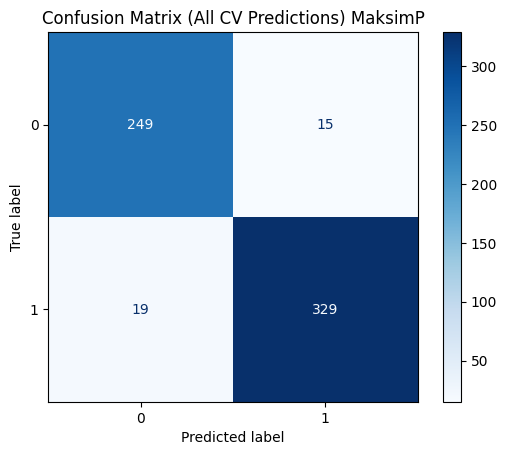

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         42         None                 4                  3   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.038        0.936       0.064    0.938   0.027
1           0.954          0.041        0.957       0.030    0.955   0.017


       Accuracy  F1 Macro
score  0.875756  0.854322


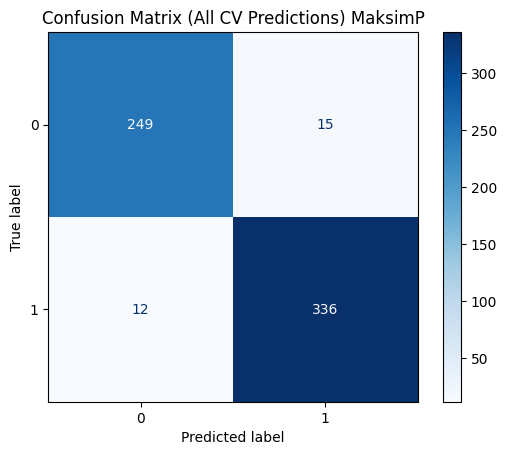

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.948          0.042        0.928       0.055    0.936   0.030
1           0.948          0.037        0.960       0.033    0.953   0.021


       Accuracy  F1 Macro
score  0.856231  0.852226


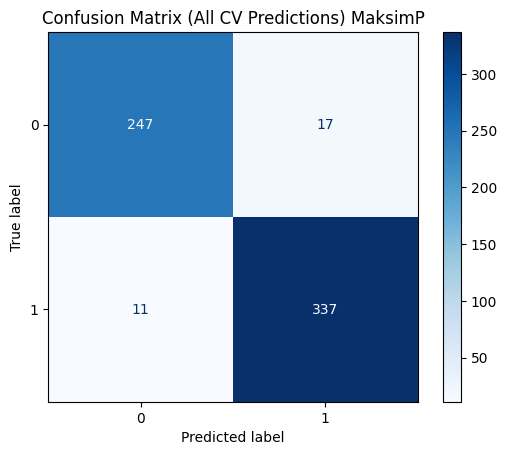

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MaksimP
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.919          0.028        0.886       0.064    0.901   0.032
1           0.919          0.040        0.940       0.025    0.928   0.019


       Accuracy  F1 Macro
score  0.875756  0.864903


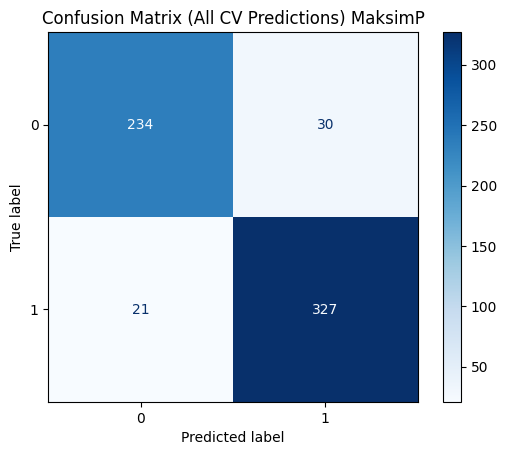

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.914          0.039        0.890       0.058    0.900   0.029
1           0.920          0.037        0.934       0.035    0.926   0.021


       Accuracy  F1 Macro
score  0.852979  0.841739


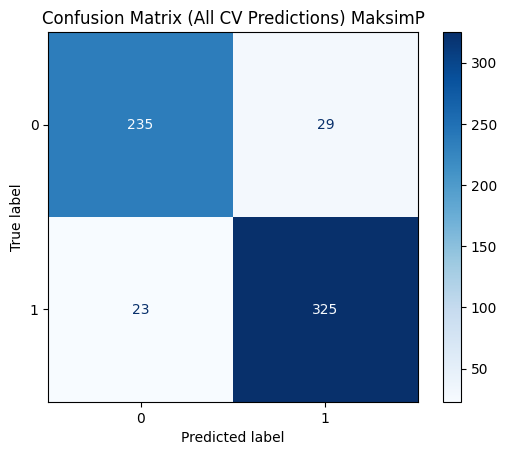

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            9  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.927          0.050        0.894       0.059    0.907   0.026
1           0.924          0.037        0.942       0.042    0.932   0.019


       Accuracy  F1 Macro
score  0.851299   0.84123


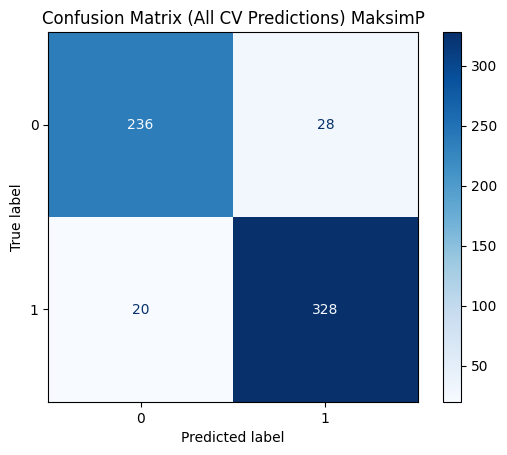

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MarinoJ
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  7           485


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.040        0.973       0.027    0.971   0.030
1           0.986          0.014        0.983       0.022    0.984   0.016


       Accuracy  F1 Macro
score   0.94868  0.938795


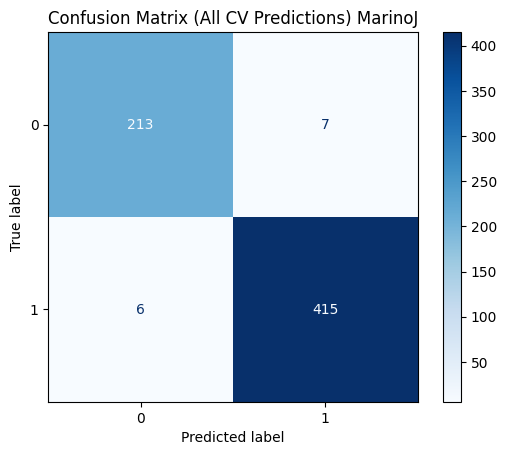

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.978          0.034        0.973       0.017    0.975   0.021
1           0.986          0.009        0.988       0.018    0.987   0.012


       Accuracy  F1 Macro
score  0.962657  0.938795


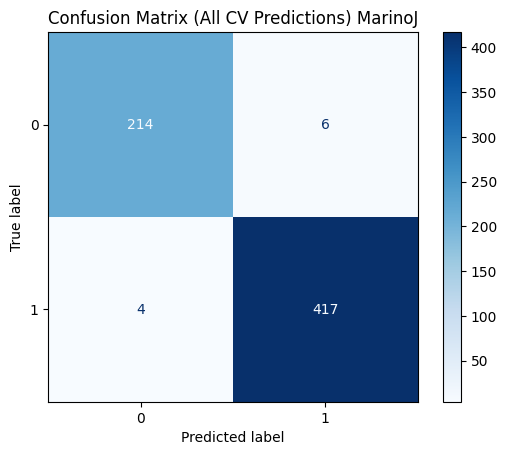

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  8           363


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.040        0.968       0.023    0.968   0.029
1           0.983          0.012        0.983       0.022    0.983   0.016


       Accuracy  F1 Macro
score  0.945579  0.936518


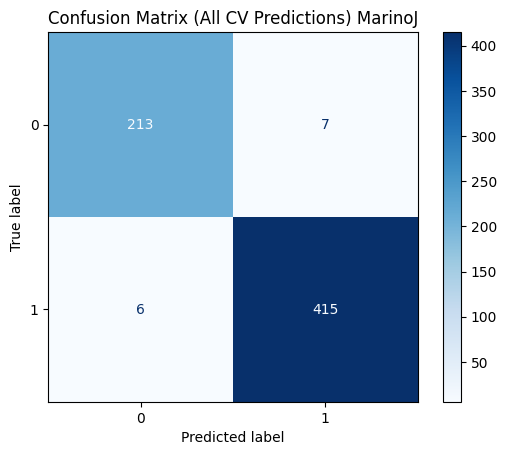

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MarinoJ
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         47         None                 1                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.978          0.020        0.959       0.030    0.968   0.012
1           0.979          0.015        0.988       0.011    0.983   0.006


       Accuracy  F1 Macro
score  0.964111  0.953936


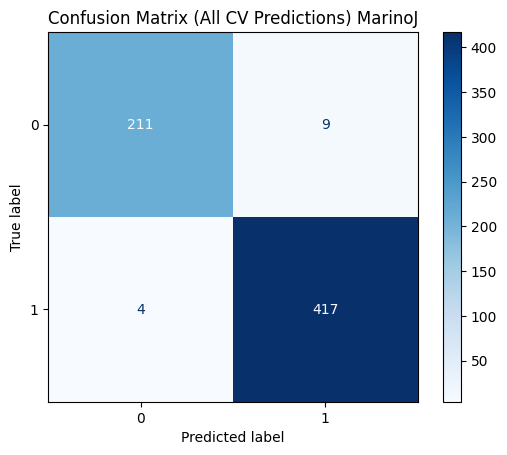

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.977          0.020        0.955       0.032    0.965   0.015
1           0.977          0.016        0.988       0.011    0.982   0.007


       Accuracy  F1 Macro
score  0.962548  0.963835


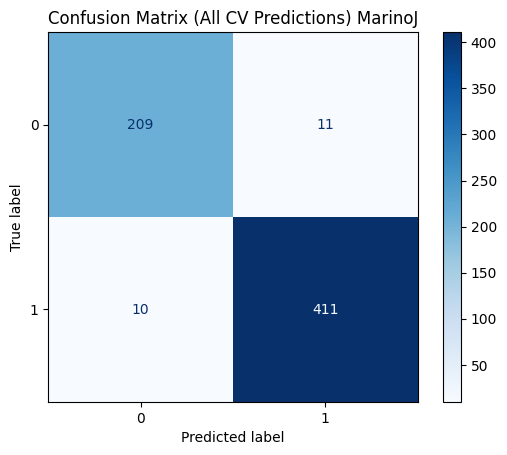

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         42         None                 4                  3   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.982          0.017        0.959       0.027    0.970   0.016
1           0.979          0.014        0.991       0.009    0.985   0.008


       Accuracy  F1 Macro
score  0.962548  0.963453


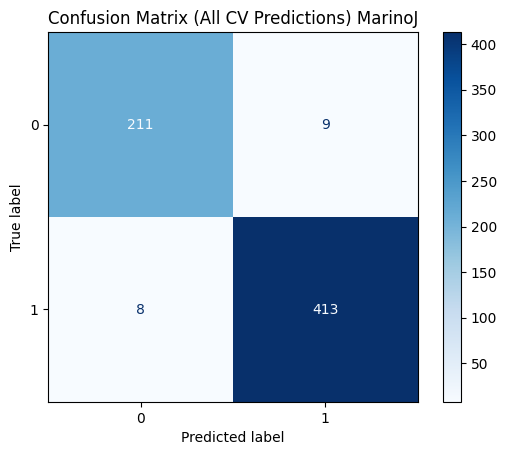

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MarinoJ
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.931          0.019        0.918       0.011    0.925   0.011
1           0.958          0.006        0.964       0.011    0.961   0.006


       Accuracy  F1 Macro
score  0.867696  0.853603


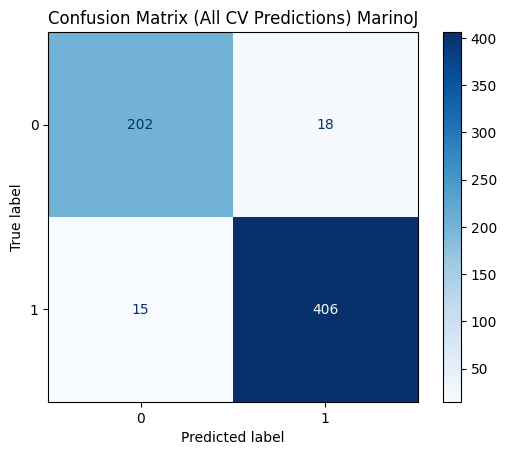

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.936          0.031        0.918       0.018    0.927   0.015
1           0.958          0.009        0.967       0.017    0.962   0.008


       Accuracy  F1 Macro
score  0.866109  0.851041


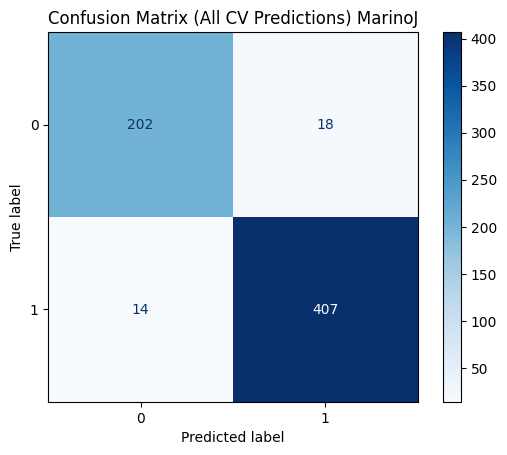

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.947          0.029        0.941       0.023    0.943   0.007
1           0.969          0.011        0.972       0.016    0.970   0.004


       Accuracy  F1 Macro
score  0.863033  0.848314


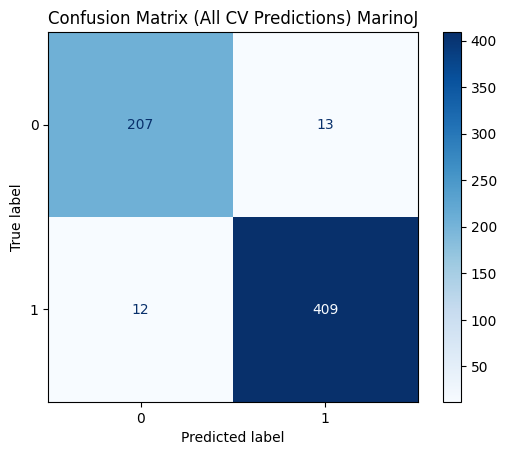

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MartinaM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.014        0.902       0.014    0.928   0.010
1           0.938          0.009        0.973       0.009    0.955   0.006


       Accuracy  F1 Macro
score   0.88283  0.876304


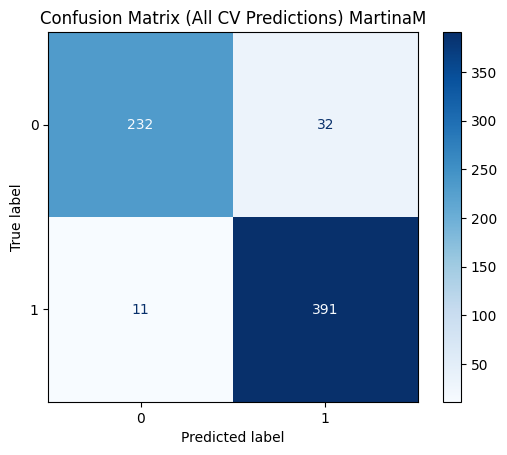

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         35         log2                 3                  9           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.014        0.894       0.025    0.924   0.011
1           0.933          0.014        0.973       0.009    0.953   0.006


       Accuracy  F1 Macro
score  0.882864  0.869234


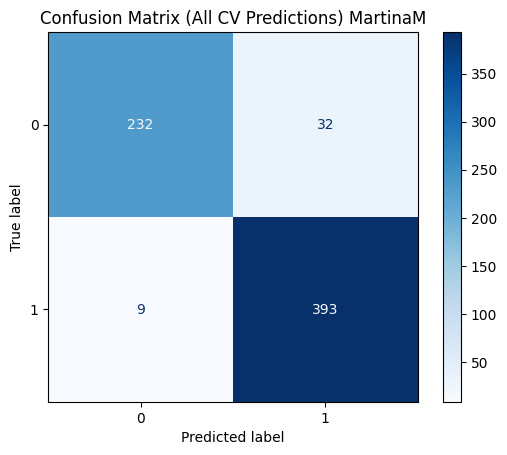

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.014        0.902       0.022    0.928   0.010
1           0.938          0.013        0.973       0.009    0.955   0.006


       Accuracy  F1 Macro
score  0.888845   0.87406


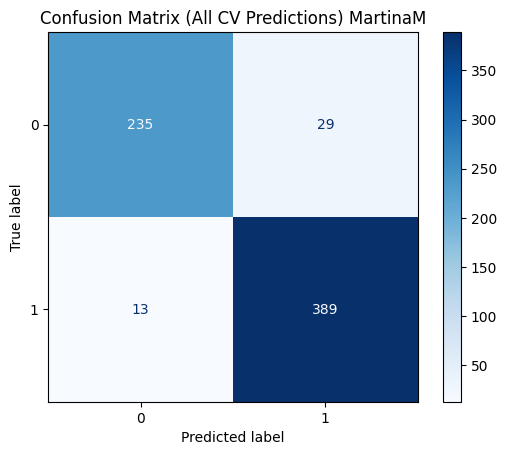

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MartinaM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.855          0.062        0.894       0.040    0.873   0.046
1           0.928          0.029        0.898       0.045    0.912   0.034


       Accuracy  F1 Macro
score  0.858927  0.849412


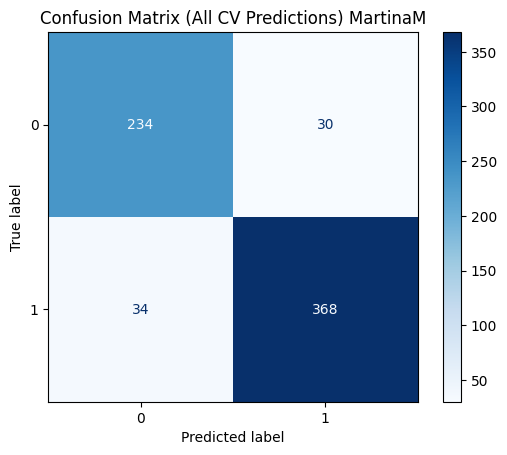

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         31         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.867          0.058        0.913       0.015    0.889   0.033
1           0.940          0.011        0.906       0.045    0.922   0.026


       Accuracy  F1 Macro
score  0.843912  0.846857


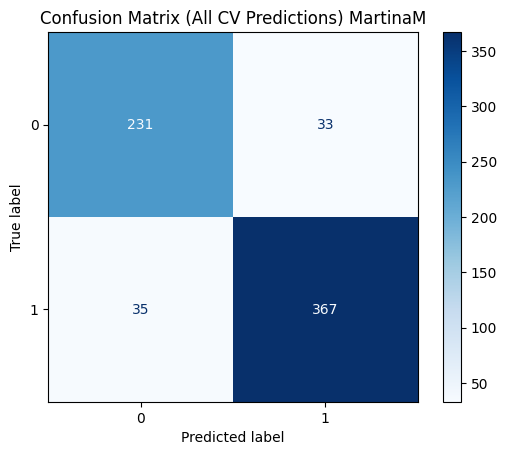

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         38         sqrt                 4                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.871          0.055        0.883       0.030    0.875   0.021
1           0.923          0.016        0.911       0.045    0.916   0.019


       Accuracy  F1 Macro
score  0.809471  0.872476


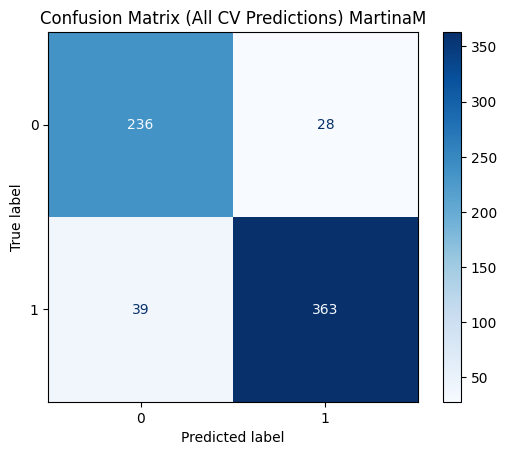

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MartinaM
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.906          0.035        0.826       0.052    0.863   0.032
1           0.893          0.030        0.943       0.023    0.917   0.018


       Accuracy  F1 Macro
score  0.822893  0.806169


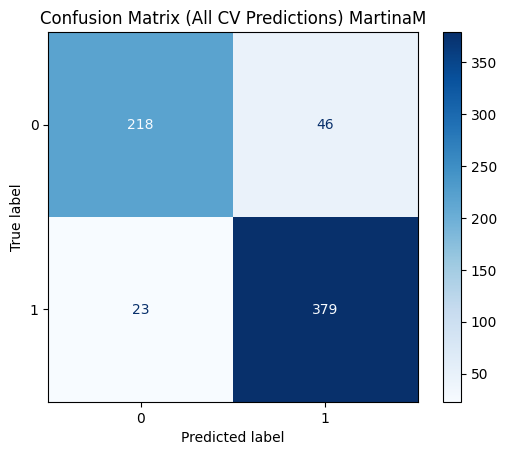

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.907           0.03        0.841       0.051    0.872   0.033
1           0.901           0.03        0.943       0.020    0.921   0.020


       Accuracy  F1 Macro
score  0.816912  0.798588


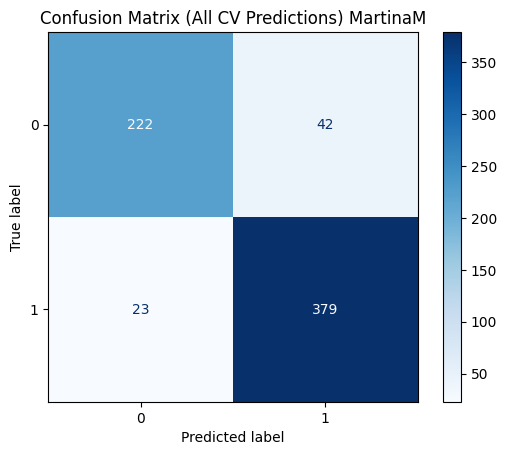

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.894          0.020        0.856       0.045    0.874   0.017
1           0.909          0.026        0.933       0.017    0.920   0.008


       Accuracy  F1 Macro
score  0.810874  0.794722


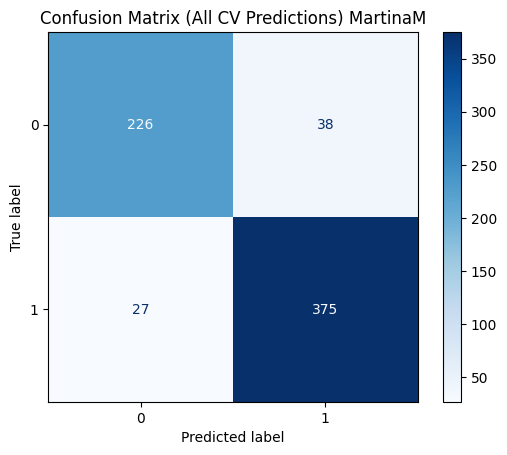

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MatejG
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         19         sqrt                 1                 10           426


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.935          0.015        0.984       0.018    0.958   0.011
1           0.943          0.060        0.783       0.055    0.853   0.038


       Accuracy  F1 Macro
score  0.874249  0.810041


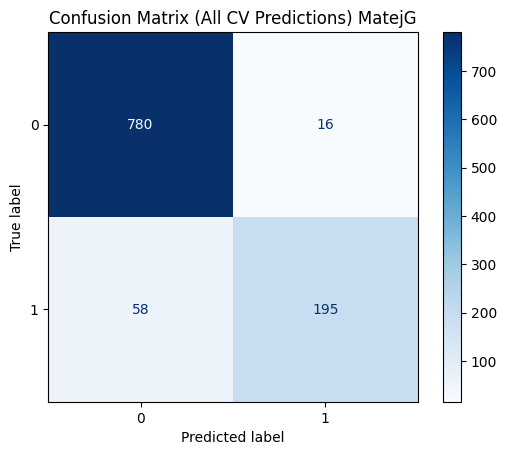

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         sqrt                 3                  9           313


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0            0.93          0.008        0.980       0.020    0.954   0.009
1            0.93          0.064        0.767       0.029    0.839   0.023


       Accuracy  F1 Macro
score  0.874249  0.813858


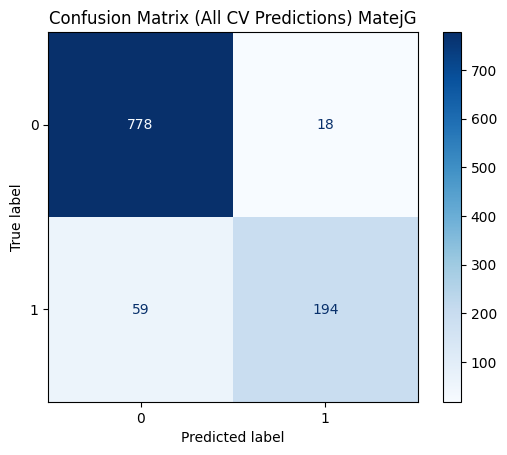

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 4                  6           199


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.933          0.010        0.979       0.023    0.955   0.010
1           0.928          0.072        0.779       0.036    0.844   0.028


       Accuracy  F1 Macro
score  0.877102  0.818562


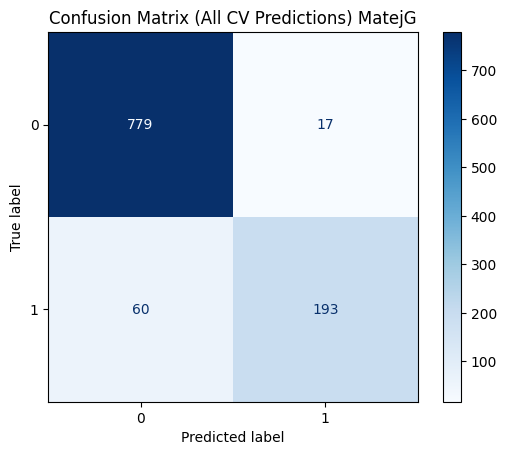

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MatejG
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         31         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.911          0.013        0.911       0.027    0.911   0.013
1           0.725          0.055        0.720       0.045    0.720   0.027


       Accuracy  F1 Macro
score  0.818952  0.735372


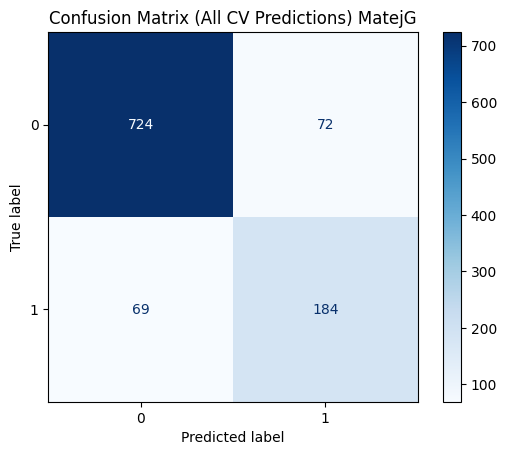

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0            0.90          0.022        0.937       0.028    0.918   0.016
1            0.78          0.076        0.672       0.079    0.718   0.058


       Accuracy  F1 Macro
score  0.813292  0.754919


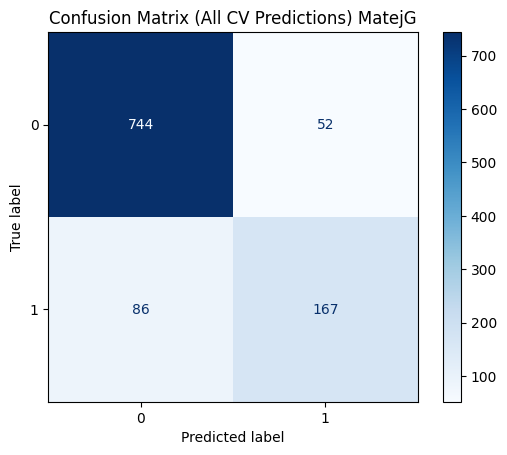

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.890          0.018        0.932       0.033    0.910   0.017
1           0.759          0.075        0.637       0.066    0.688   0.047


       Accuracy  F1 Macro
score  0.833215  0.757303


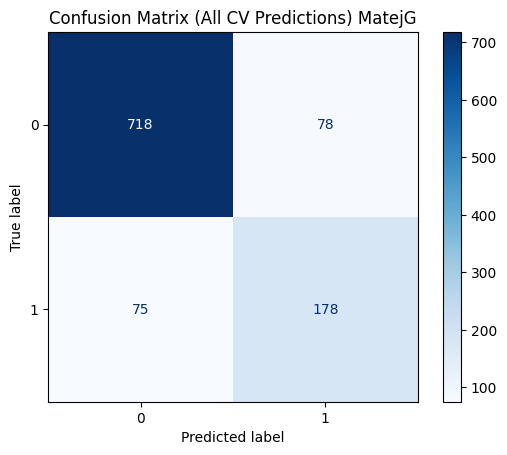

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MatejG
KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.851          0.013        0.954       0.018    0.899   0.007
1           0.770          0.057        0.474       0.057    0.584   0.043


       Accuracy  F1 Macro
score  0.656696  0.537864


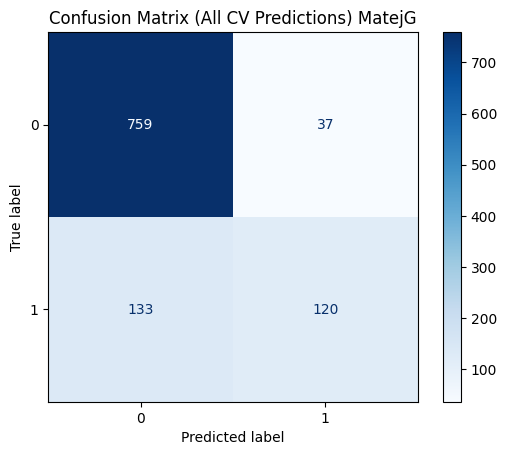

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.847          0.014        0.957       0.017    0.899   0.009
1           0.777          0.061        0.455       0.061    0.570   0.051


       Accuracy  F1 Macro
score  0.662406  0.536699


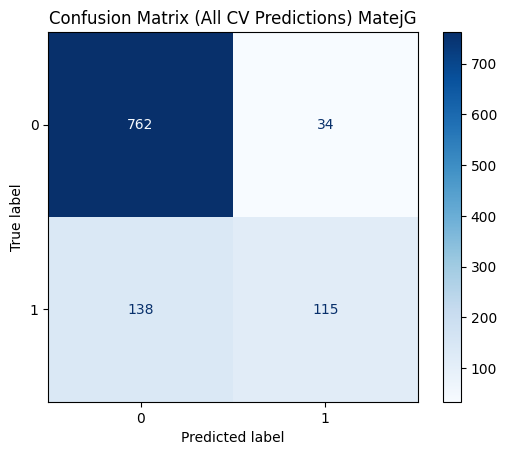

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.858          0.009        0.907       0.032    0.881   0.016
1           0.652          0.074        0.526       0.040    0.579   0.036


       Accuracy  F1 Macro
score  0.629045    0.5335


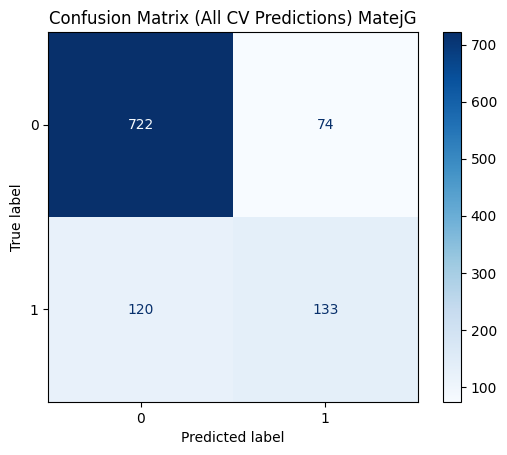

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MiaD
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.984       0.024    0.992   0.012
1           0.989          0.016        1.000       0.000    0.995   0.008


       Accuracy  F1 Macro
score   0.99168     0.993


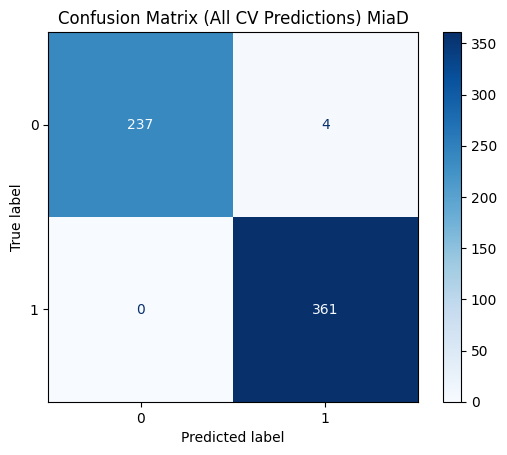

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 3                  7           408


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.984       0.024    0.992   0.012
1           0.989          0.016        1.000       0.000    0.995   0.008


       Accuracy  F1 Macro
score  0.993347     0.993


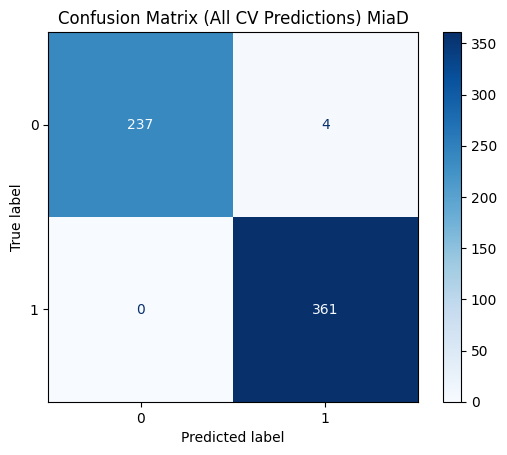

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.988       0.016    0.994   0.008
1           0.992          0.011        1.000       0.000    0.996   0.005


       Accuracy  F1 Macro
score  0.993347     0.993


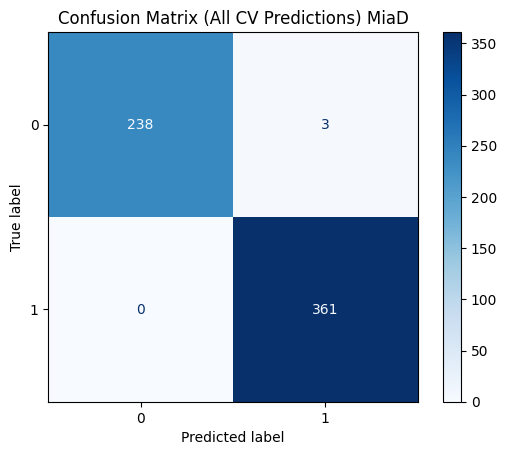

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MiaD
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         38         sqrt                 4                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.042        0.975       0.020    0.971   0.024
1           0.984          0.013        0.978       0.031    0.980   0.017


       Accuracy  F1 Macro
score  0.912039  0.921097


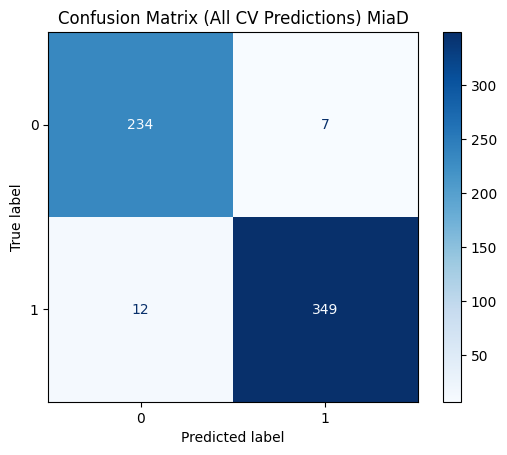

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         47         None                 1                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.019        1.000       0.000    0.992   0.010
1           1.000          0.000        0.989       0.014    0.994   0.007


       Accuracy  F1 Macro
score  0.981736  0.982614


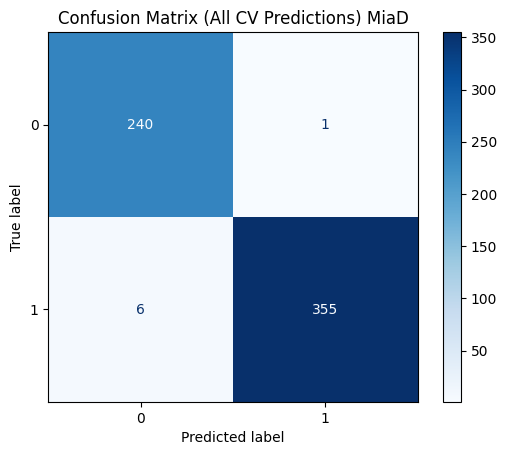

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.020        0.988       0.010    0.986   0.014
1           0.992          0.007        0.989       0.014    0.990   0.009


       Accuracy  F1 Macro
score  0.981736  0.980882


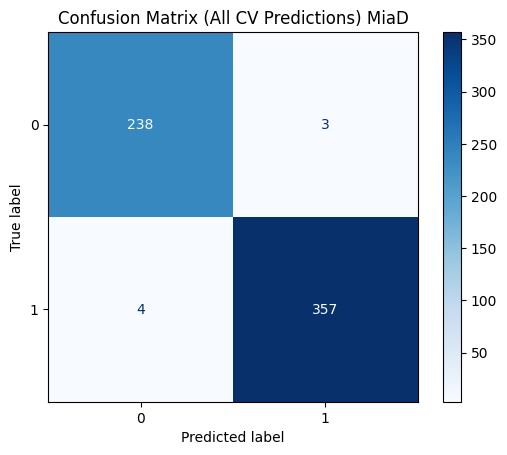

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MiaD
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.939          0.037        0.884       0.059    0.910   0.041
1           0.926          0.035        0.961       0.024    0.943   0.024


       Accuracy  F1 Macro
score   0.76949  0.756362


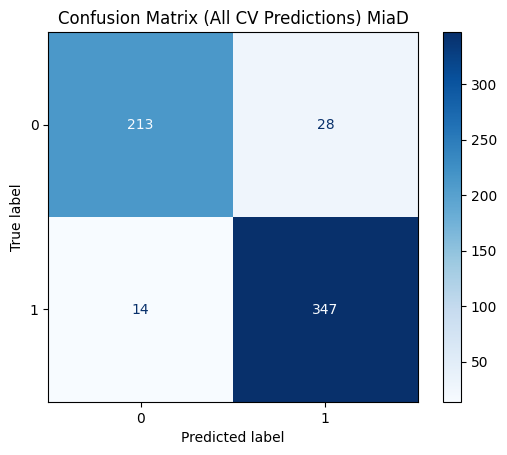

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.952          0.034        0.892       0.039    0.921   0.030
1           0.931          0.024        0.970       0.022    0.950   0.018


       Accuracy  F1 Macro
score  0.754573   0.73949


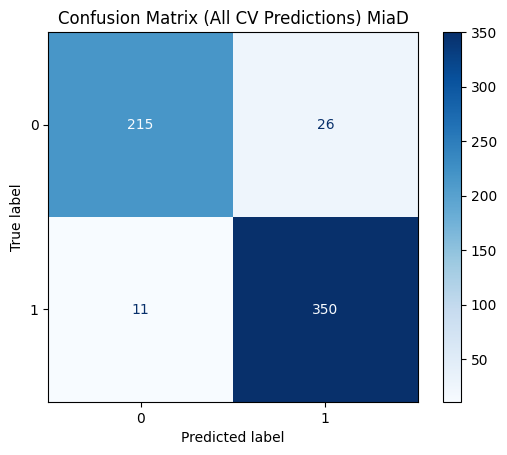

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.945          0.039        0.901       0.030    0.922   0.028
1           0.936          0.019        0.964       0.026    0.949   0.019


       Accuracy  F1 Macro
score  0.749573  0.736252


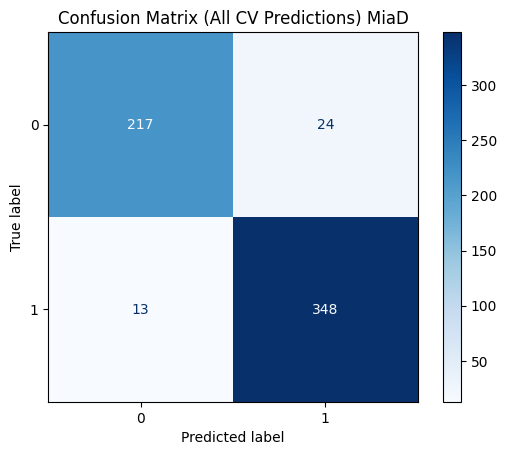

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MilaP
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         46         log2                 2                  3           317


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.021        0.813       0.048    0.883   0.033
1           0.928          0.017        0.989       0.007    0.957   0.011


       Accuracy  F1 Macro
score  0.879408  0.831313


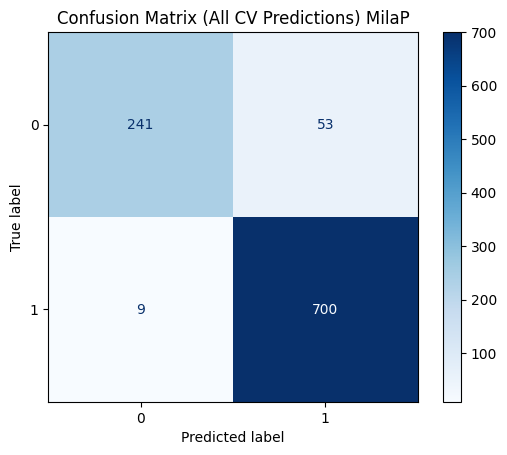

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  7           485


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.963          0.014        0.789       0.046    0.866   0.026
1           0.919          0.016        0.987       0.005    0.952   0.008


       Accuracy  F1 Macro
score  0.882403  0.832301


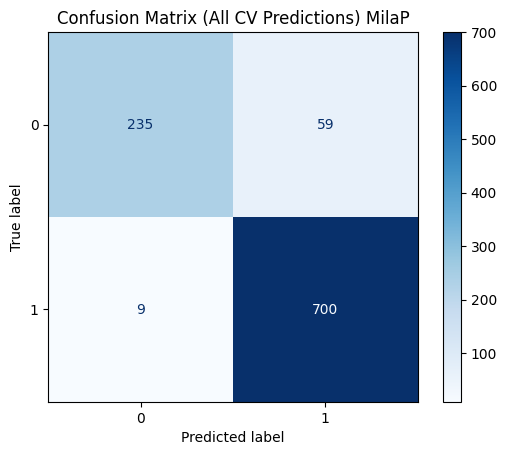

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.020        0.816       0.047    0.883   0.032
1           0.929          0.017        0.987       0.007    0.957   0.010


       Accuracy  F1 Macro
score  0.875428   0.82547


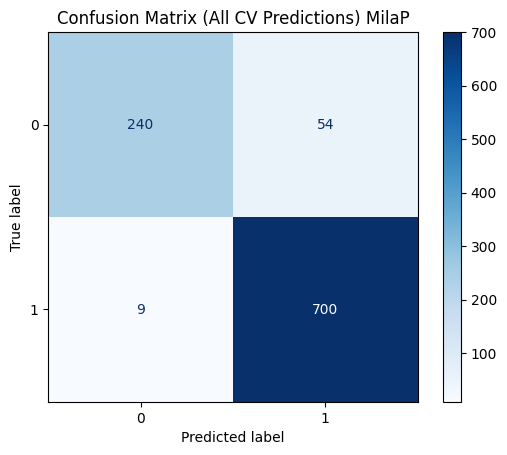

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MilaP
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.832          0.030        0.840       0.057    0.835   0.038
1           0.934          0.023        0.929       0.013    0.932   0.015


       Accuracy  F1 Macro
score  0.860398  0.792181


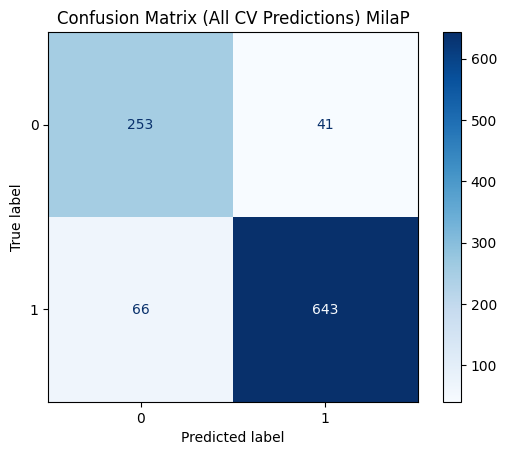

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.838          0.027        0.796       0.055    0.816   0.040
1           0.917          0.020        0.937       0.009    0.927   0.013


       Accuracy  F1 Macro
score  0.840478   0.76687


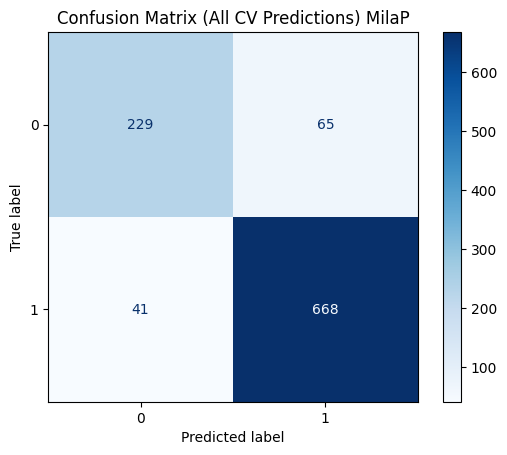

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         35         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.823          0.083        0.813       0.038    0.815   0.043
1           0.923          0.013        0.922       0.046    0.922   0.024


       Accuracy  F1 Macro
score  0.858438  0.774027


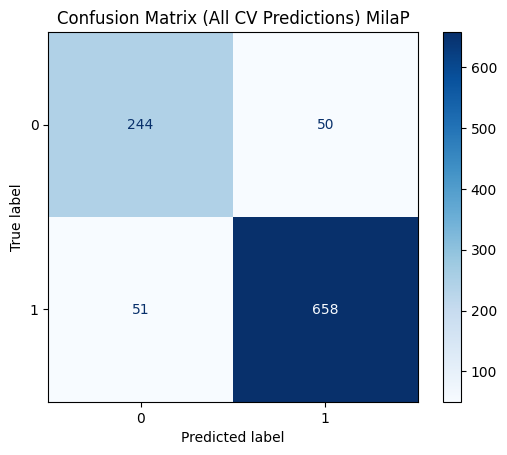

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MilaP
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            8  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.820          0.045        0.803       0.039    0.811   0.040
1           0.919          0.016        0.927       0.019    0.923   0.016


       Accuracy  F1 Macro
score  0.828627  0.787188


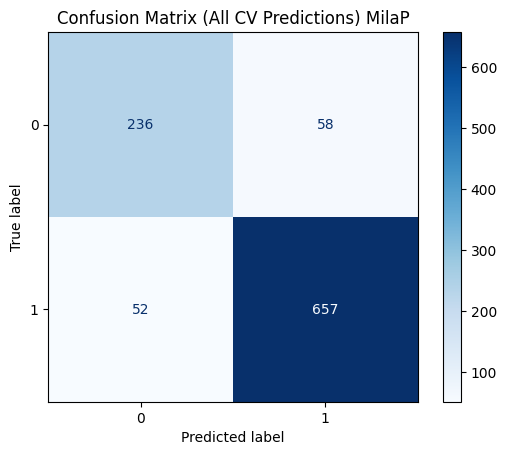

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.820          0.045        0.803       0.039    0.811   0.040
1           0.919          0.016        0.927       0.019    0.923   0.016


       Accuracy  F1 Macro
score  0.828627  0.787188


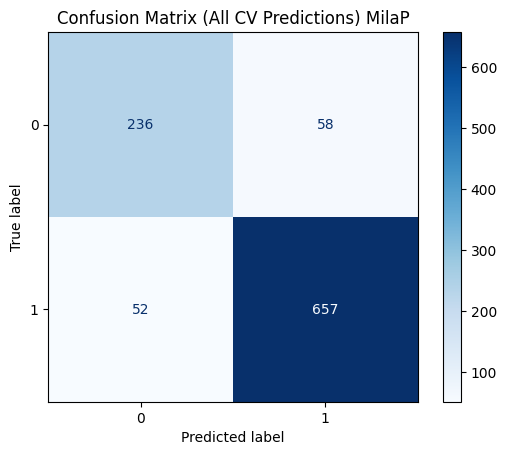

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            9  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.817          0.053        0.799       0.045    0.808   0.047
1           0.917          0.018        0.925       0.023    0.921   0.019


       Accuracy  F1 Macro
score  0.827642  0.786251


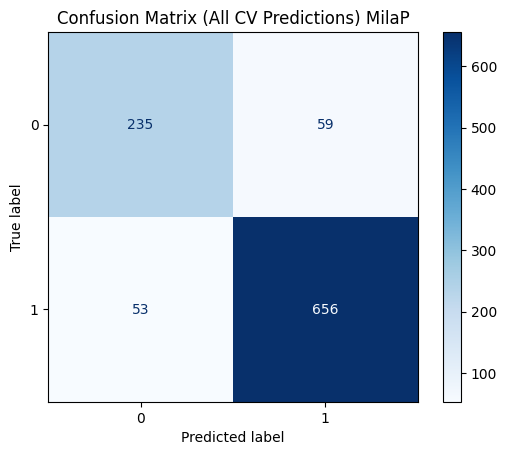

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
NatalijaG
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         45         log2                 3                 10           427


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.921          0.033        0.865       0.033    0.892   0.029
1           0.919          0.019        0.954       0.020    0.936   0.017


       Accuracy  F1 Macro
score  0.892355  0.882136


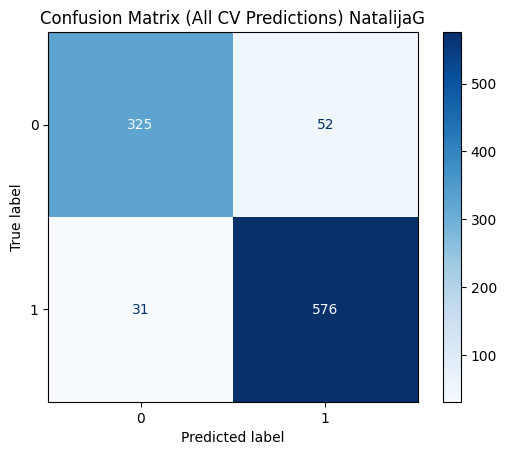

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.929          0.028        0.867       0.037    0.897   0.030
1           0.921          0.020        0.959       0.017    0.940   0.017


       Accuracy  F1 Macro
score  0.888294   0.88302


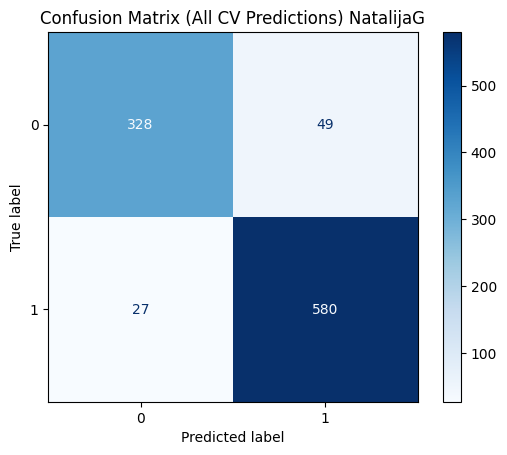

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         log2                 2                  5           369


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.925          0.029        0.875       0.026    0.899   0.024
1           0.925          0.015        0.956       0.018    0.940   0.014


       Accuracy  F1 Macro
score  0.892355  0.884043


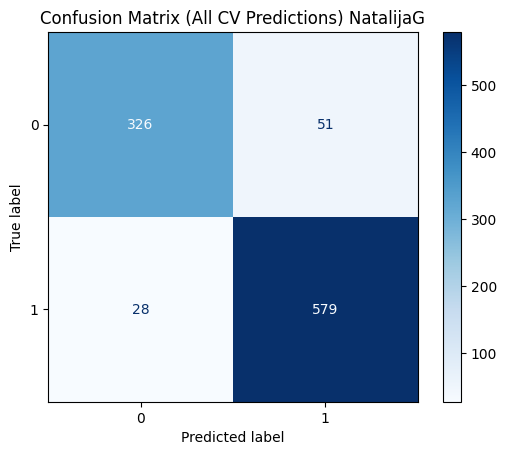

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
NatalijaG
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         11         sqrt                 1                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.819          0.054        0.844       0.038    0.831   0.045
1           0.901          0.025        0.883       0.037    0.892   0.030


       Accuracy  F1 Macro
score  0.805962  0.793893


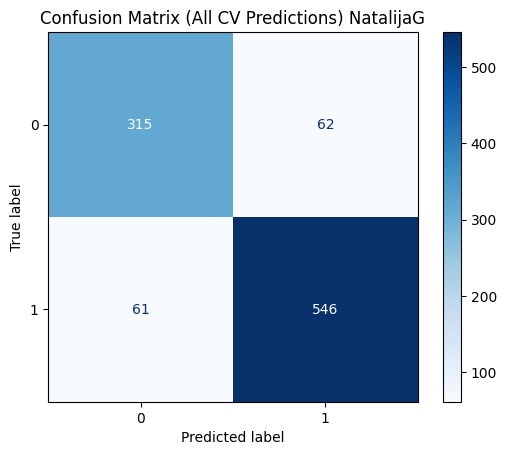

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         38         sqrt                 3                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.839          0.022        0.804       0.055    0.820   0.035
1           0.882          0.028        0.904       0.015    0.893   0.017


       Accuracy  F1 Macro
score  0.788667  0.808479


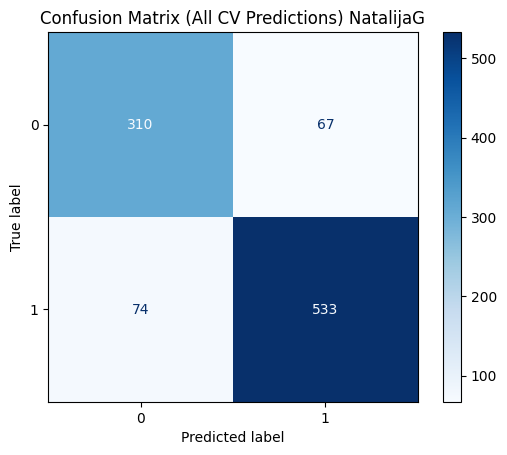

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.869          0.024        0.859       0.047    0.864   0.028
1           0.914          0.027        0.919       0.017    0.916   0.016


       Accuracy  F1 Macro
score  0.828302  0.828326


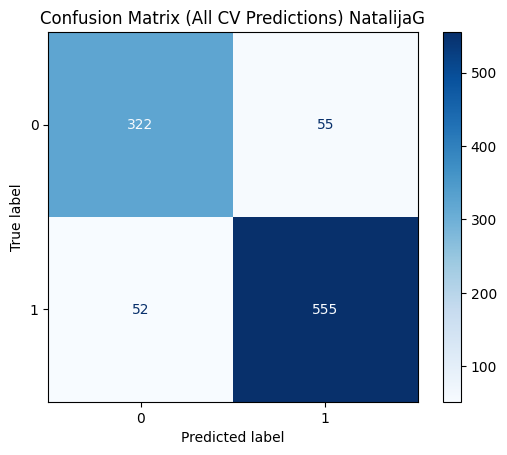

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
NatalijaG
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.757          0.049        0.679       0.028    0.715   0.033
1           0.812          0.016        0.863       0.032    0.837   0.022


       Accuracy  F1 Macro
score  0.675909  0.636638


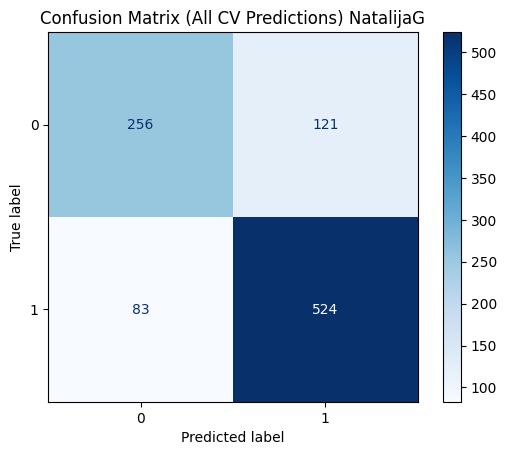

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.768          0.037        0.700       0.040    0.732   0.034
1           0.824          0.019        0.868       0.023    0.845   0.017


       Accuracy  F1 Macro
score  0.662716  0.624663


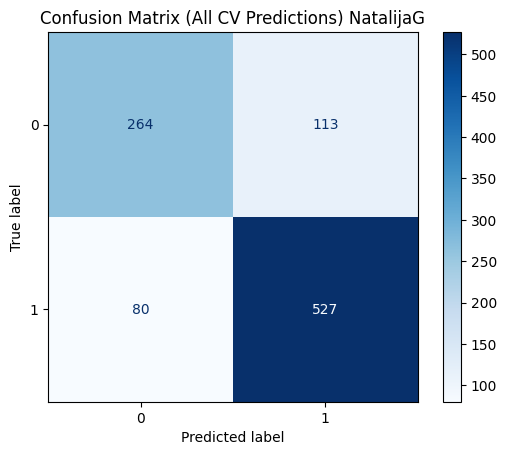

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.794          0.025        0.713       0.025    0.751   0.021
1           0.833          0.012        0.885       0.016    0.858   0.011


       Accuracy  F1 Macro
score   0.65662  0.617395


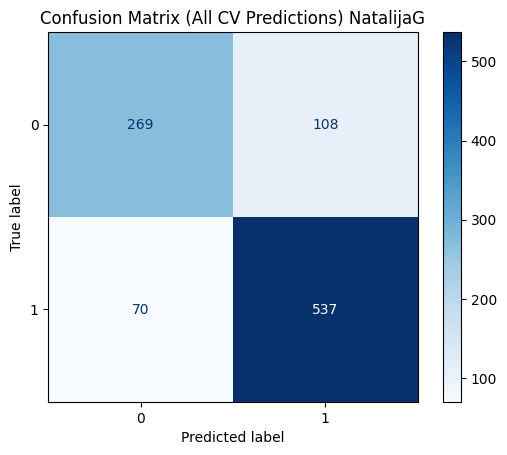

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
OgnenS
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.983          0.015        0.932       0.019    0.957   0.014
1           0.961          0.010        0.990       0.009    0.976   0.008


       Accuracy  F1 Macro
score  0.927203  0.919608


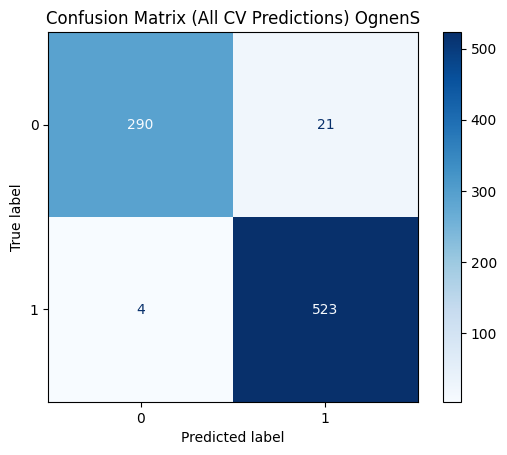

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         45         log2                 3                 10           427


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.973          0.025        0.929       0.024    0.951   0.022
1           0.959          0.014        0.985       0.014    0.972   0.013


       Accuracy  F1 Macro
score  0.931965  0.919485


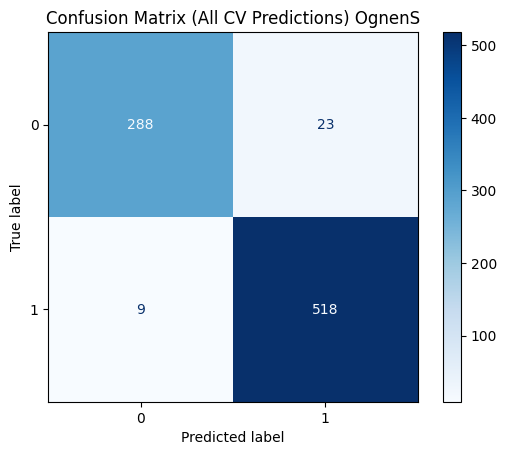

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         35         log2                 3                  9           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.970          0.022        0.926       0.026    0.947   0.022
1           0.958          0.015        0.983       0.013    0.970   0.012


       Accuracy  F1 Macro
score  0.924815  0.917209


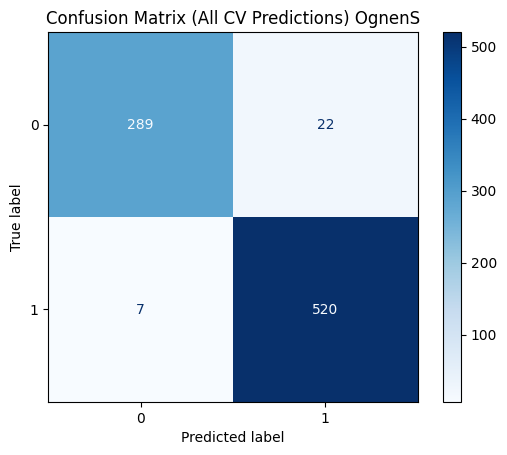

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
OgnenS
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.899          0.031        0.910       0.013    0.904   0.021
1           0.946          0.008        0.939       0.020    0.943   0.014


       Accuracy  F1 Macro
score  0.871136  0.882748


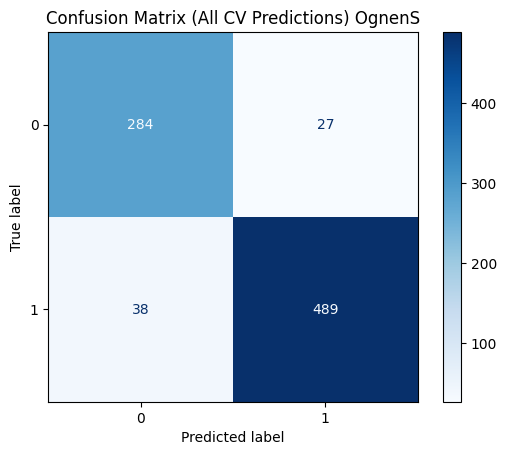

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         35         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.895          0.079        0.897       0.022    0.895   0.047
1           0.939          0.015        0.934       0.055    0.936   0.034


       Accuracy  F1 Macro
score  0.884239  0.874951


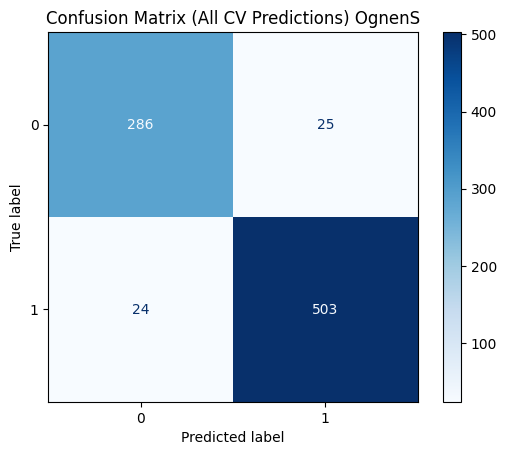

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         38         sqrt                 3                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.915          0.031        0.865       0.050    0.889   0.038
1           0.923          0.027        0.953       0.017    0.938   0.020


       Accuracy  F1 Macro
score  0.898589  0.862995


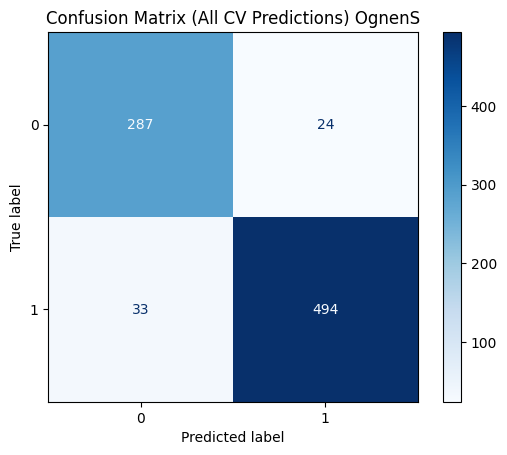

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
OgnenS
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.933          0.028        0.829       0.022    0.878   0.016
1           0.906          0.011        0.964       0.016    0.934   0.009


       Accuracy  F1 Macro
score  0.811534  0.760814


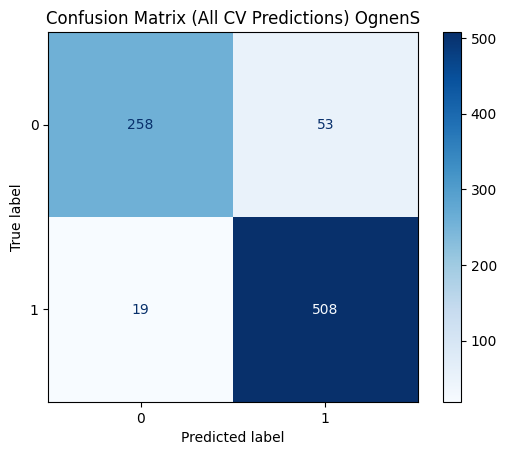

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.931          0.048        0.833       0.013    0.879   0.024
1           0.907          0.007        0.962       0.028    0.933   0.016


       Accuracy  F1 Macro
score  0.811541  0.758106


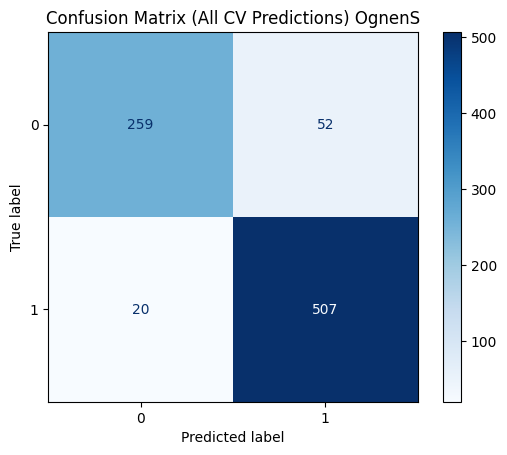

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.950          0.027        0.849       0.020    0.896   0.018
1           0.916          0.010        0.973       0.015    0.944   0.010


       Accuracy  F1 Macro
score   0.80911  0.757998


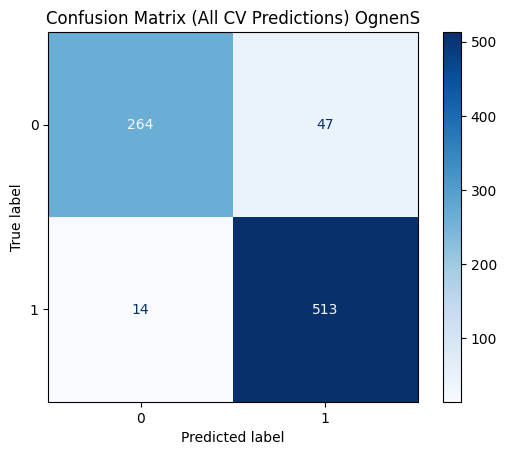

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
PetarA
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.921          0.053        0.939       0.022    0.930   0.035
1           0.947          0.019        0.931       0.047    0.939   0.031


       Accuracy  F1 Macro
score  0.903662  0.904139


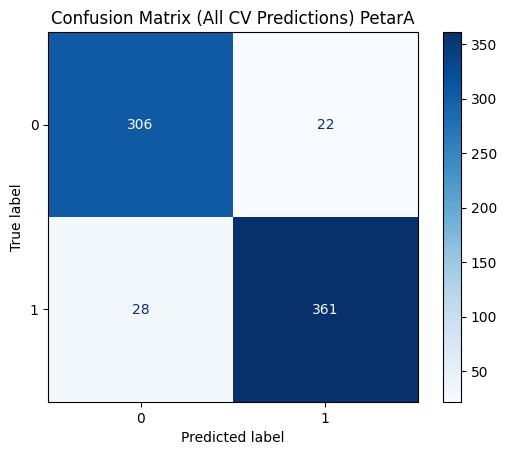

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         sqrt                 3                  9           313


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.921          0.045        0.942       0.020    0.931   0.029
1           0.950          0.017        0.931       0.041    0.940   0.026


       Accuracy  F1 Macro
score   0.90506  0.911084


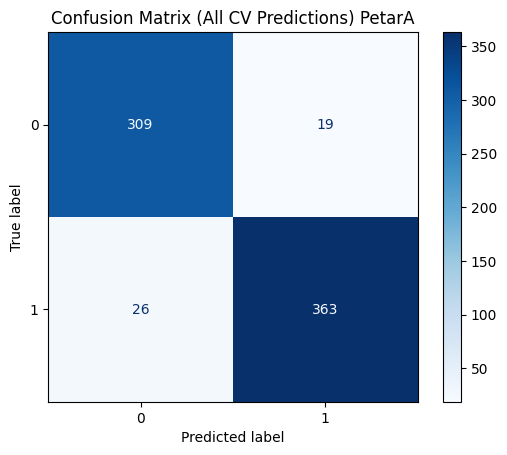

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 4                  6           199


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.920          0.042        0.939       0.022    0.929   0.030
1           0.947          0.019        0.931       0.038    0.939   0.027


       Accuracy  F1 Macro
score  0.906459  0.904088


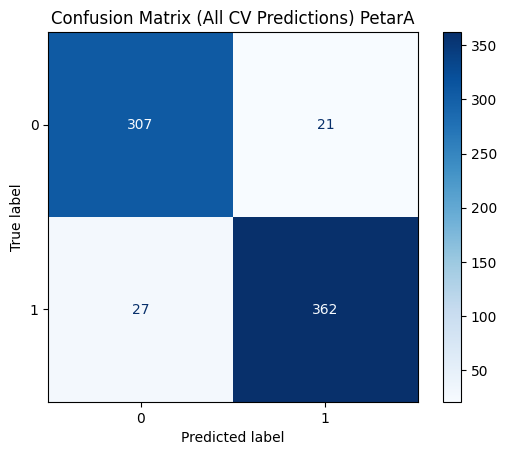

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
PetarA
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.857          0.043        0.875       0.068    0.865   0.048
1           0.895          0.052        0.876       0.039    0.885   0.037


       Accuracy  F1 Macro
score  0.825583  0.834285


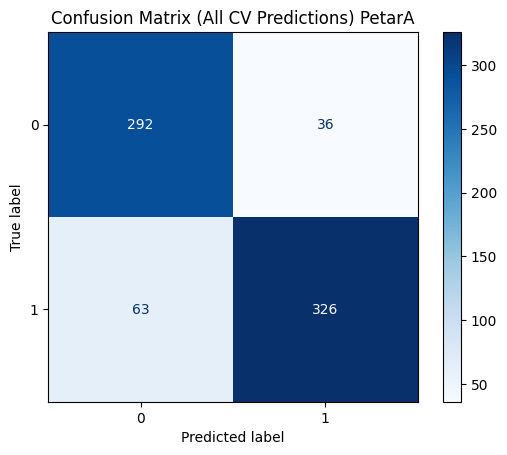

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.881          0.030        0.899       0.021    0.890   0.025
1           0.913          0.018        0.897       0.027    0.905   0.022


       Accuracy  F1 Macro
score  0.813005  0.837357


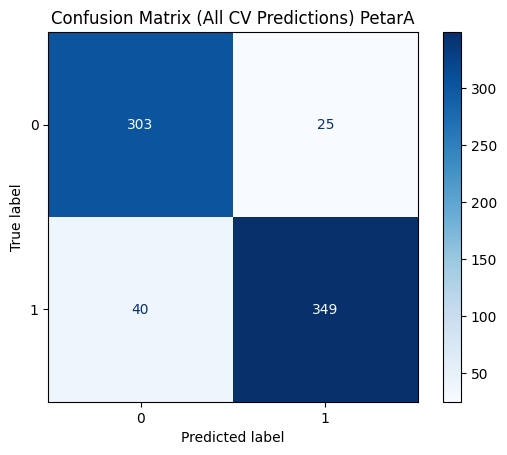

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.836          0.055        0.848       0.052    0.841   0.051
1           0.870          0.042        0.859       0.048    0.864   0.043


       Accuracy  F1 Macro
score  0.779516  0.841611


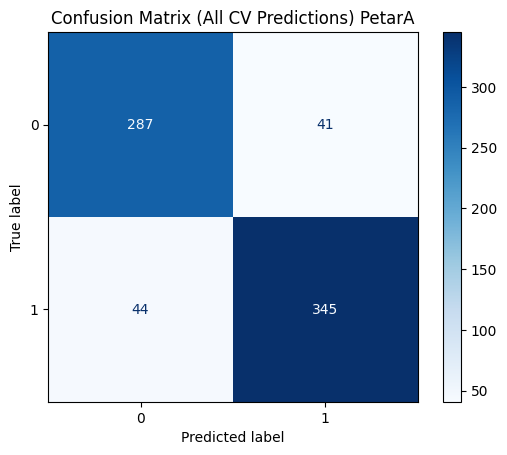

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
PetarA
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.790           0.05        0.811       0.044    0.799   0.030
1           0.838           0.03        0.815       0.056    0.825   0.031


       Accuracy  F1 Macro
score  0.755905  0.752539


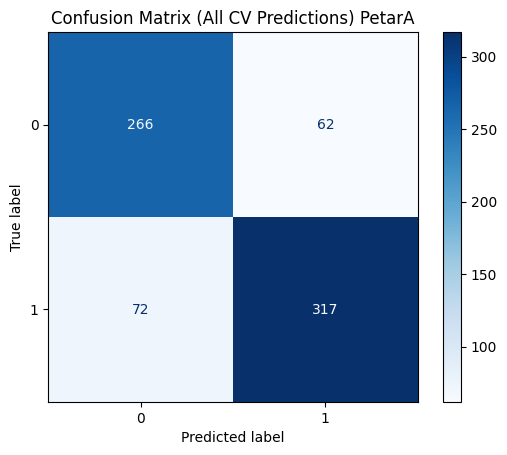

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.788          0.060        0.808       0.052    0.796   0.039
1           0.836          0.037        0.812       0.064    0.822   0.037


       Accuracy  F1 Macro
score   0.75034  0.746981


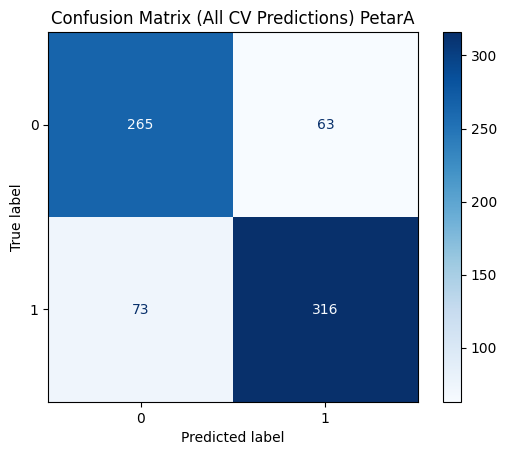

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.805          0.052         0.82       0.068    0.811   0.046
1           0.849          0.049         0.83       0.055    0.838   0.036


       Accuracy  F1 Macro
score  0.746164  0.742546


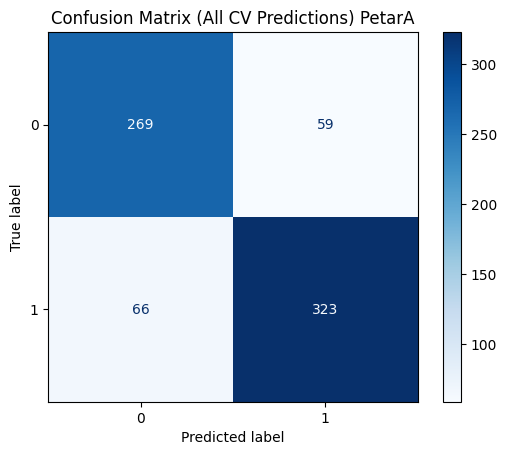

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
PetarK
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.945          0.019        0.957       0.008    0.951   0.010
1           0.825          0.028        0.783       0.079    0.802   0.048


       Accuracy  F1 Macro
score  0.887255  0.812197


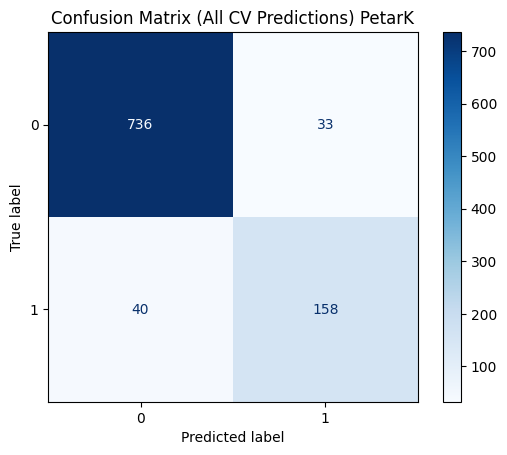

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         log2                 2                  5           369


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.018        0.960       0.003    0.954   0.008
1           0.836          0.011        0.799       0.071    0.815   0.041


       Accuracy  F1 Macro
score  0.878992  0.813476


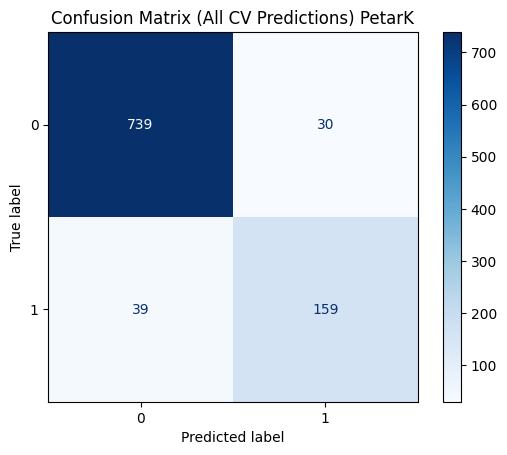

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 3                  7           408


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.948          0.019        0.957       0.005    0.952   0.008
1           0.826          0.012        0.794       0.079    0.808   0.043


       Accuracy  F1 Macro
score  0.882084  0.813364


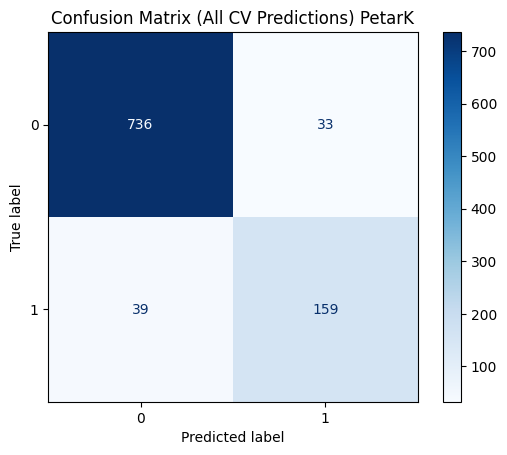

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
PetarK
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         38         sqrt                 3                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.920          0.011        0.936       0.008    0.928   0.005
1           0.734          0.022        0.682       0.048    0.706   0.029


       Accuracy  F1 Macro
score  0.857273  0.750757


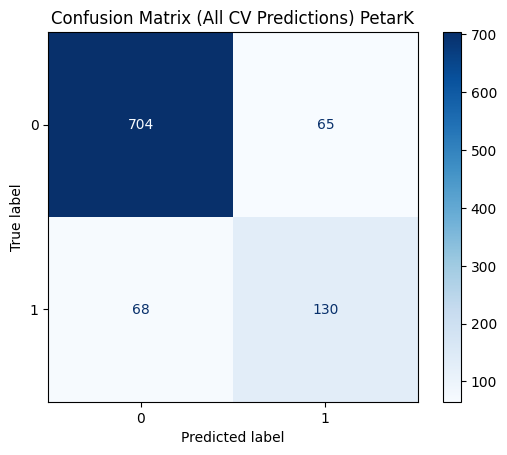

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.905          0.010        0.934        0.03    0.919   0.009
1           0.721          0.078        0.616        0.06    0.657   0.009


       Accuracy  F1 Macro
score  0.861439  0.772432


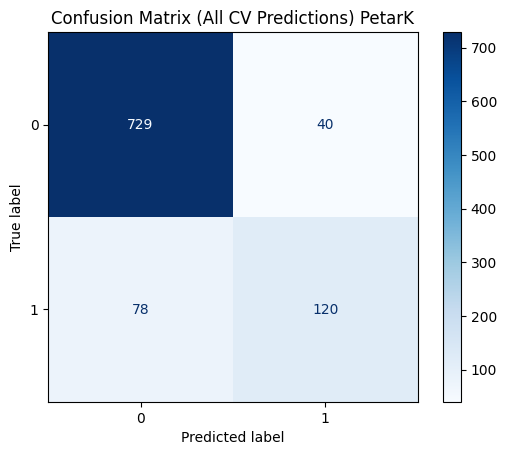

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.936          0.012        0.930       0.020    0.933   0.013
1           0.738          0.059        0.753       0.048    0.744   0.042


       Accuracy  F1 Macro
score  0.855179  0.719614


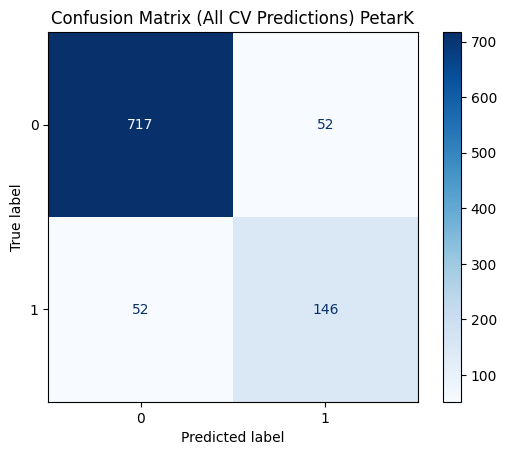

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
PetarK
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.898          0.020        0.947       0.011    0.922   0.014
1           0.734          0.059        0.581       0.090    0.647   0.077


       Accuracy  F1 Macro
score  0.799407  0.675709


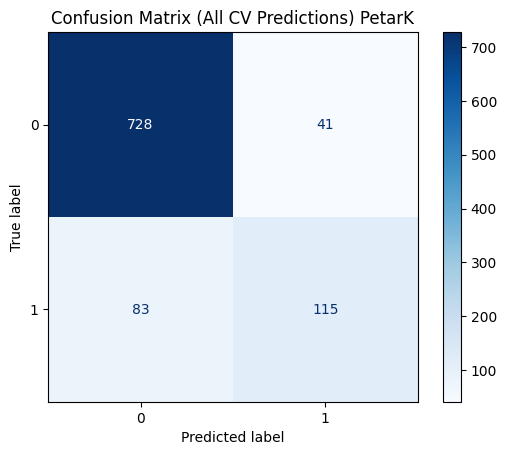

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.914          0.016        0.949       0.011    0.931   0.009
1           0.769          0.035        0.652       0.073    0.703   0.050


       Accuracy  F1 Macro
score   0.78804  0.675268


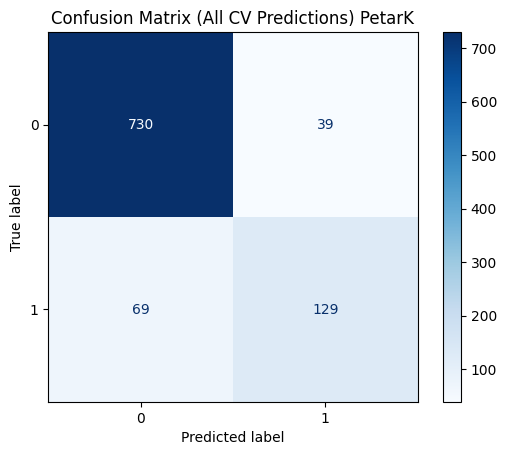

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.908          0.021        0.953       0.008    0.930   0.012
1           0.770          0.044        0.621       0.096    0.685   0.076


       Accuracy  F1 Macro
score    0.7932  0.674976


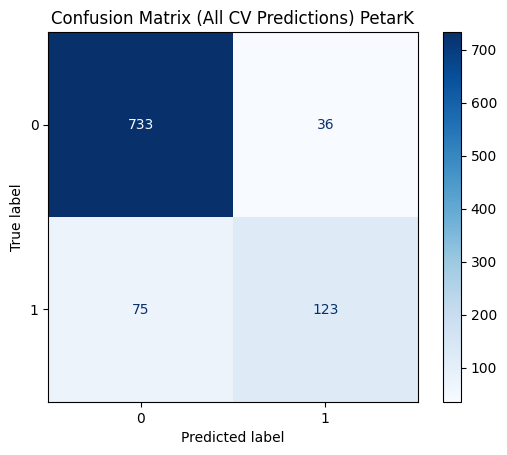

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
SaraI
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  7           485


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.976          0.007        0.856       0.050    0.911   0.029
1           0.939          0.020        0.990       0.003    0.964   0.010


       Accuracy  F1 Macro
score  0.930043   0.90356


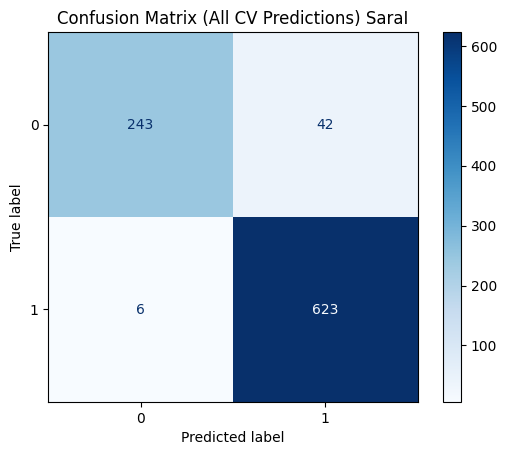

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  8           363


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.985          0.014        0.856       0.050    0.915   0.025
1           0.939          0.019        0.994       0.006    0.965   0.008


       Accuracy  F1 Macro
score  0.922392  0.897448


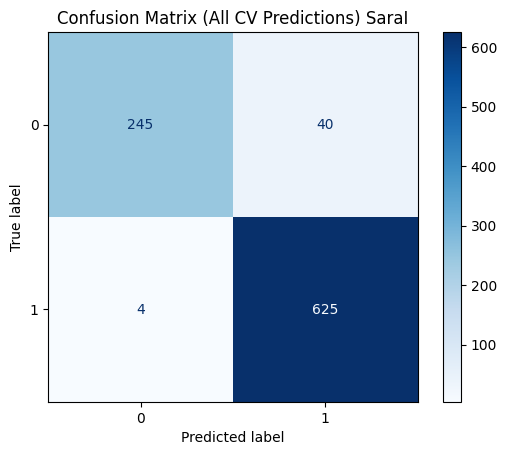

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 3                  7           408


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.985          0.014        0.863       0.048    0.919   0.023
1           0.942          0.019        0.994       0.006    0.967   0.008


       Accuracy  F1 Macro
score  0.919114  0.905071


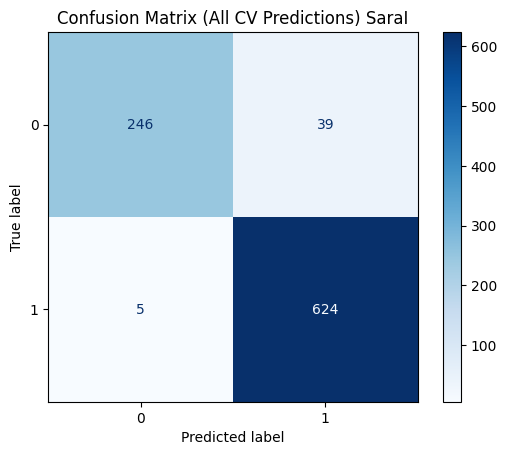

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
SaraI
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.859          0.030        0.853       0.036    0.856   0.027
1           0.934          0.015        0.936       0.015    0.935   0.012


       Accuracy  F1 Macro
score  0.867736  0.839428


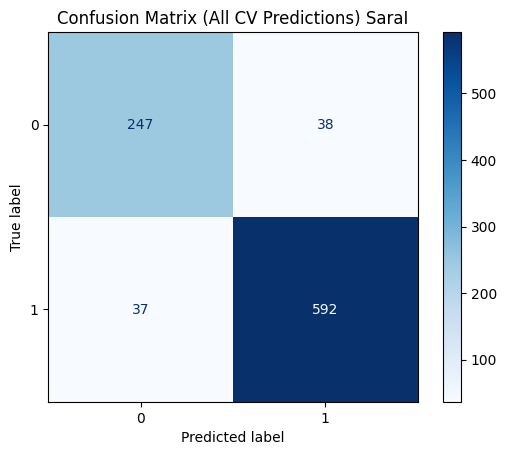

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.031        0.839       0.073    0.885   0.040
1           0.931          0.028        0.976       0.013    0.953   0.013


       Accuracy  F1 Macro
score  0.874239  0.848788


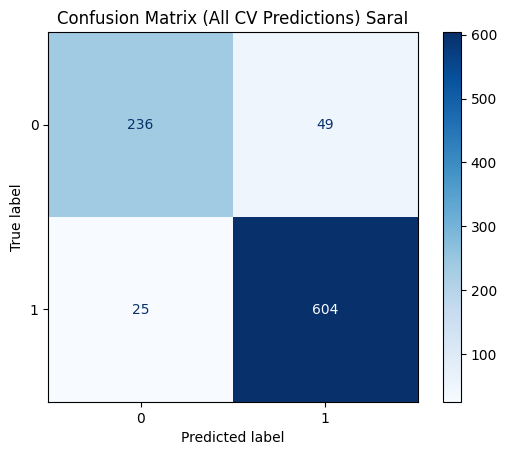

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         11         sqrt                 1                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.842          0.028        0.888       0.048    0.863   0.027
1           0.948          0.020        0.924       0.017    0.936   0.011


       Accuracy  F1 Macro
score  0.873182  0.839844


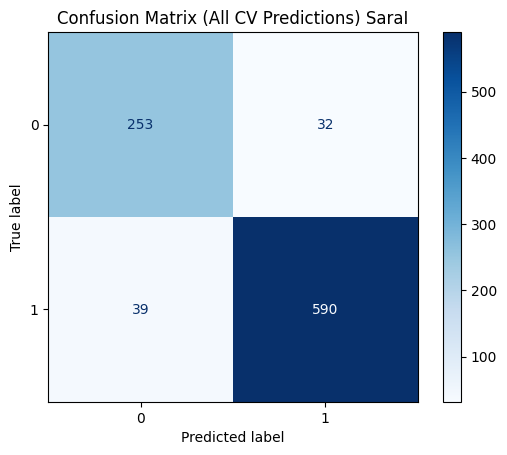

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
SaraI
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.931          0.045        0.779       0.026    0.848   0.024
1           0.907          0.010        0.973       0.019    0.939   0.011


       Accuracy  F1 Macro
score  0.886321  0.830688


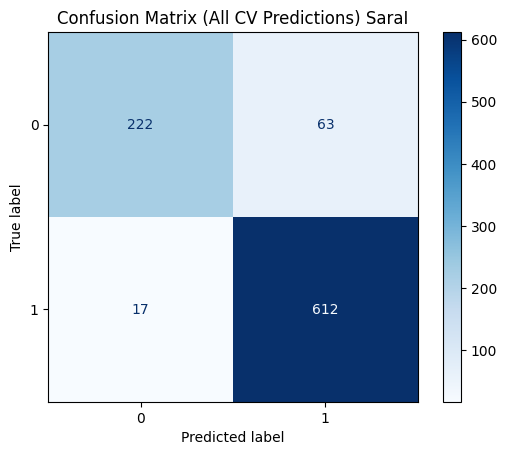

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.932          0.044        0.796       0.038    0.858   0.035
1           0.914          0.015        0.973       0.018    0.942   0.014


       Accuracy  F1 Macro
score   0.88521  0.829949


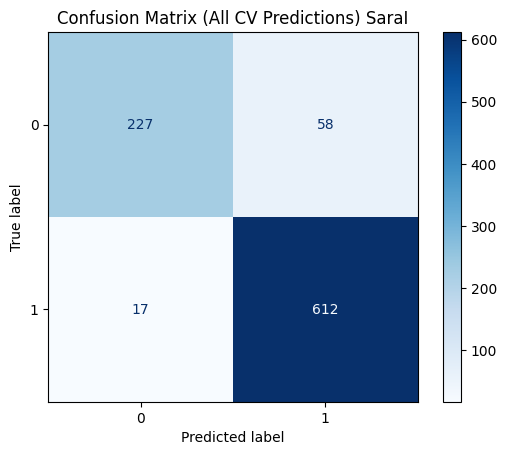

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            5  2  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.902          0.044        0.807       0.037    0.852   0.039
1           0.917          0.016        0.960       0.018    0.938   0.016


       Accuracy  F1 Macro
score  0.879739  0.826074


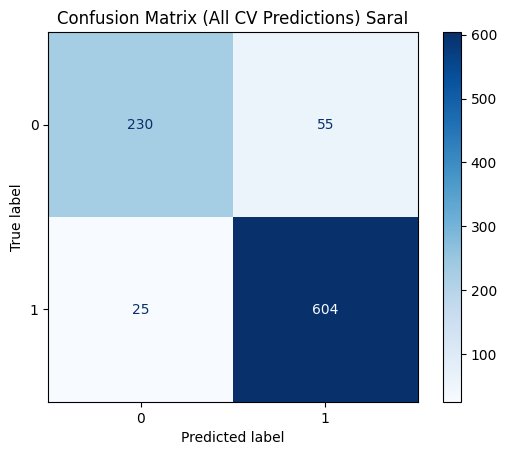

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
SaraM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.970          0.029        0.916       0.046    0.942   0.034
1           0.946          0.029        0.981       0.018    0.963   0.021


       Accuracy  F1 Macro
score  0.884697  0.875654


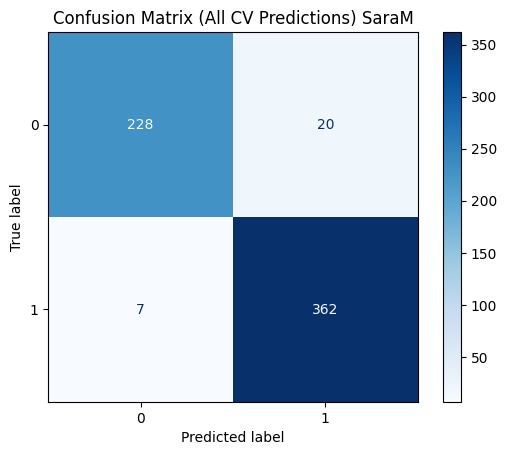

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.976          0.029        0.919       0.036    0.946   0.021
1           0.948          0.021        0.984       0.020    0.965   0.013


       Accuracy  F1 Macro
score  0.889562  0.885692


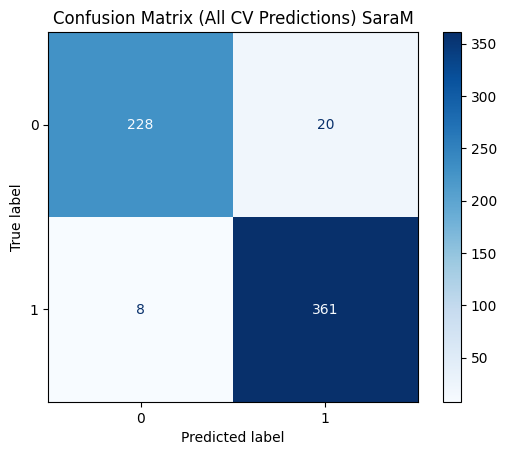

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.971          0.030        0.920        0.04    0.944   0.028
1           0.948          0.025        0.981        0.02    0.964   0.018


       Accuracy  F1 Macro
score  0.897705   0.87822


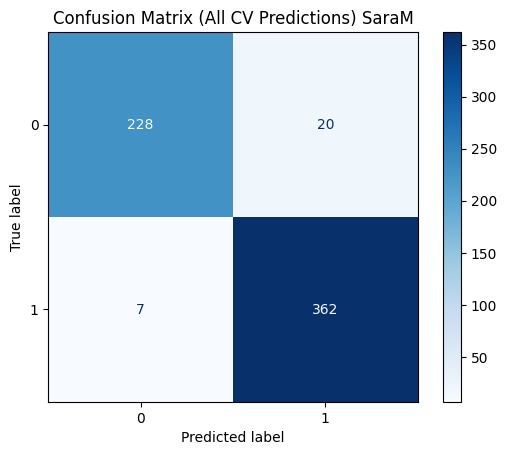

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
SaraM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         31         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0            0.85          0.017        0.916       0.034    0.881   0.023
1            0.94          0.023        0.892       0.012    0.915   0.015


       Accuracy  F1 Macro
score  0.875007  0.854454


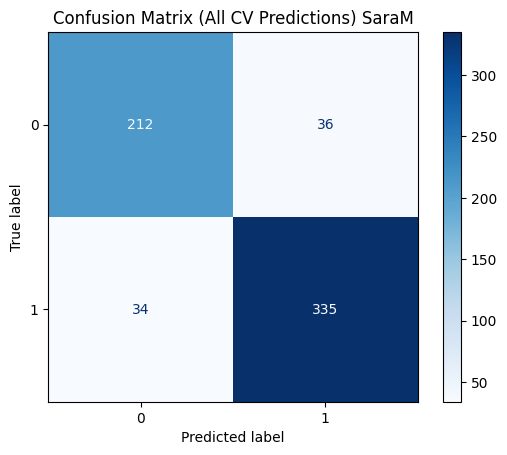

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.928          0.020        0.879       0.060    0.902   0.035
1           0.923          0.035        0.954       0.014    0.938   0.020


       Accuracy  F1 Macro
score  0.865329  0.854905


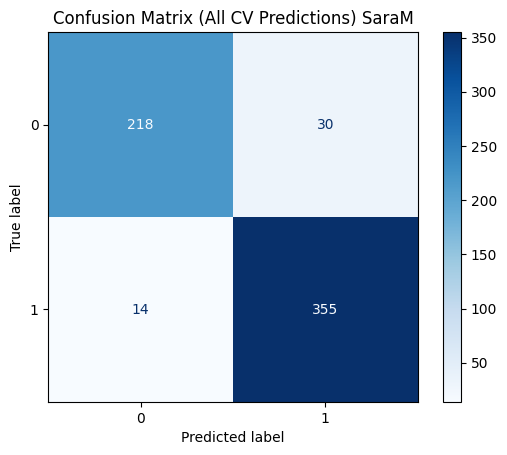

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         47         None                 1                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.927           0.02        0.875       0.050    0.900   0.031
1           0.920           0.03        0.954       0.014    0.936   0.018


       Accuracy  F1 Macro
score  0.858851  0.845271


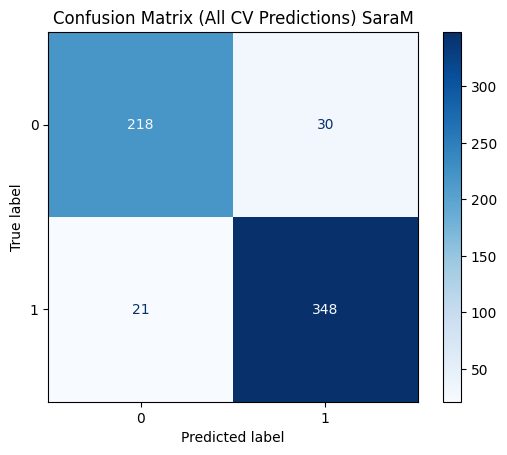

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
SaraM
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            9  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0            0.94          0.019        0.823       0.034    0.877   0.027
1            0.89          0.020        0.965       0.011    0.926   0.015


       Accuracy  F1 Macro
score   0.87502  0.840406


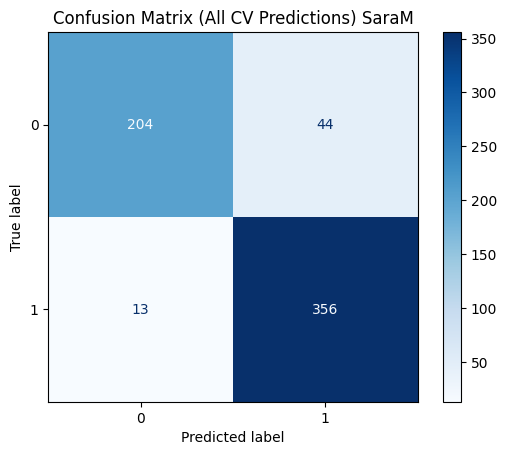

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            7  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.944          0.031        0.819       0.039    0.877   0.034
1           0.888          0.023        0.967       0.018    0.926   0.020


       Accuracy  F1 Macro
score  0.862077  0.822856


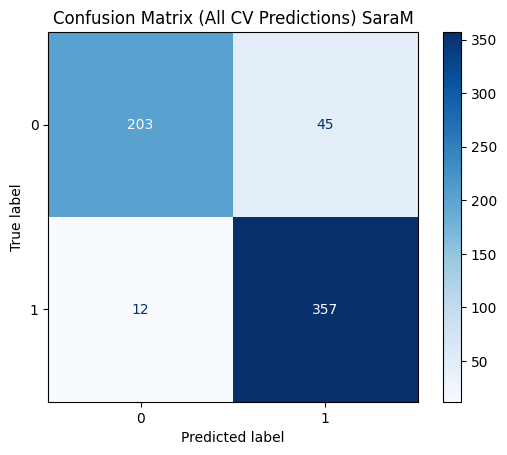

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            8  2  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.936          0.025        0.823       0.034    0.876   0.026
1           0.890          0.020        0.962       0.016    0.925   0.016


       Accuracy  F1 Macro
score  0.860451  0.818902


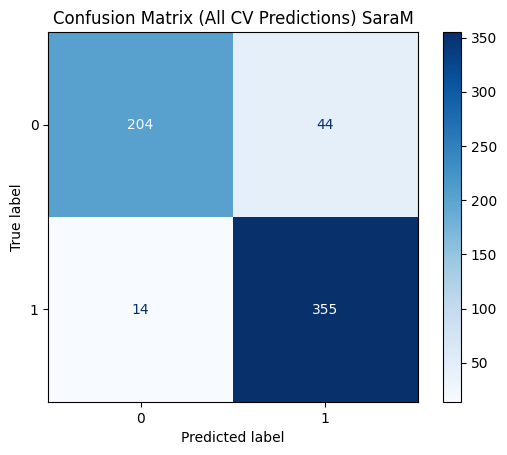

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
StefanS
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         sqrt                 1                  4           463


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.971          0.027        0.860       0.030    0.912   0.019
1           0.927          0.014        0.986       0.013    0.956   0.009


       Accuracy  F1 Macro
score  0.863409  0.829169


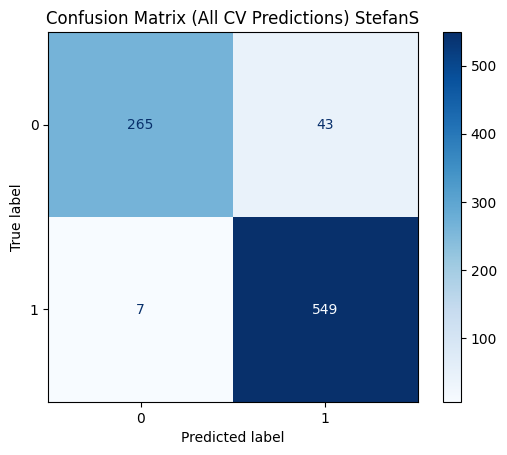

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         sqrt                 2                  5           188


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.012        0.860       0.039    0.909   0.025
1           0.927          0.019        0.982       0.006    0.954   0.011


       Accuracy  F1 Macro
score  0.863402  0.825044


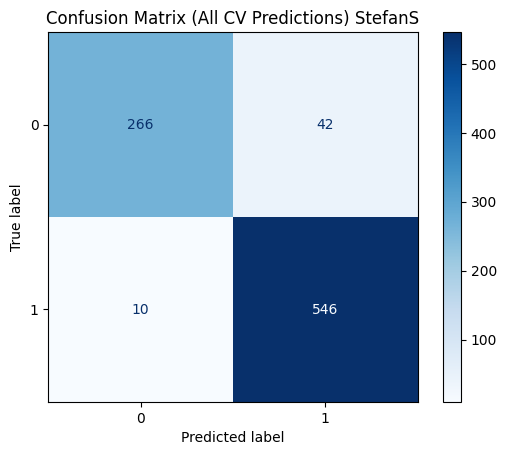

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.014        0.838       0.051    0.897   0.033
1           0.917          0.024        0.984       0.007    0.949   0.014


       Accuracy  F1 Macro
score   0.85531  0.818234


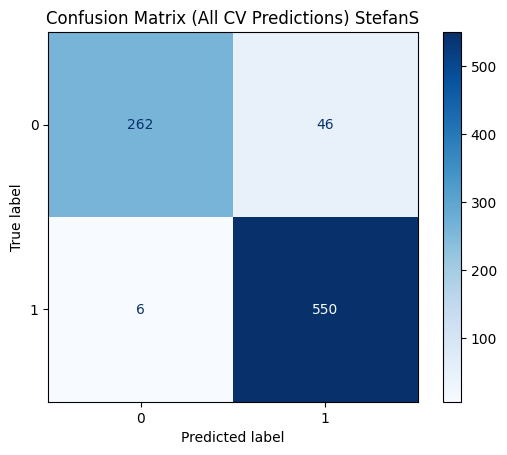

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
StefanS
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         24         None                 2                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.871          0.057        0.896       0.036    0.881   0.020
1           0.942          0.017        0.923       0.042    0.931   0.016


       Accuracy  F1 Macro
score  0.839091  0.802549


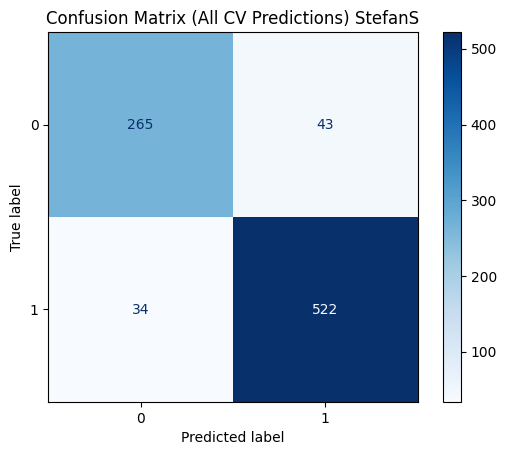

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.834          0.070        0.812       0.040    0.820   0.035
1           0.897          0.018        0.906       0.046    0.901   0.024


       Accuracy  F1 Macro
score  0.798568  0.763922


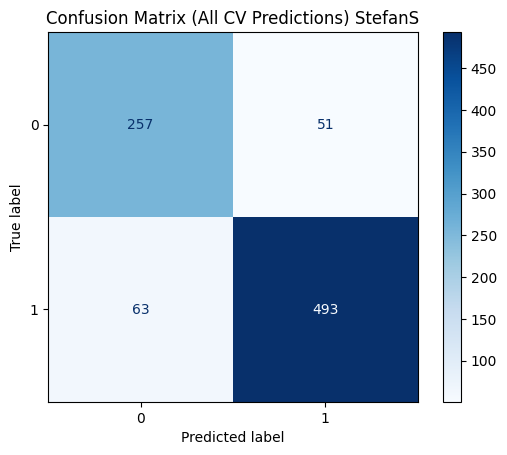

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.865          0.045        0.870       0.015    0.867   0.023
1           0.928          0.008        0.923       0.031    0.925   0.017


       Accuracy  F1 Macro
score  0.832067  0.811947


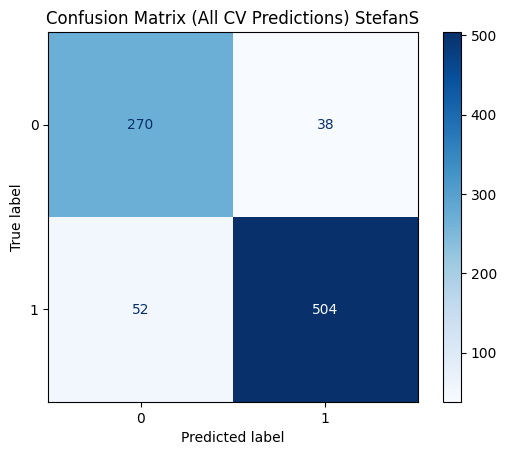

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
StefanS
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.808          0.027        0.766       0.037    0.787   0.029
1           0.874          0.019        0.899       0.015    0.887   0.015


       Accuracy  F1 Macro
score  0.680723  0.635432


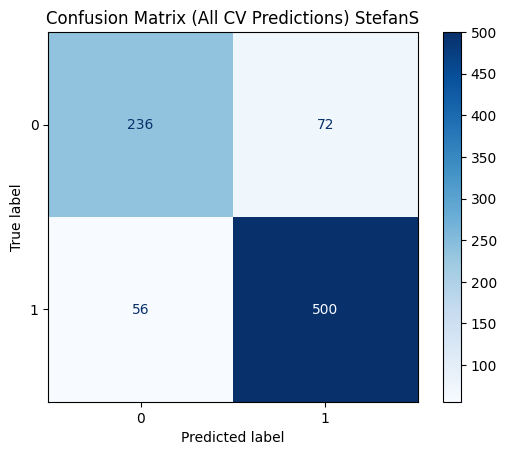

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.782          0.015        0.757       0.047    0.768   0.029
1           0.868          0.022        0.883       0.010    0.875   0.012


       Accuracy  F1 Macro
score  0.680737   0.63212


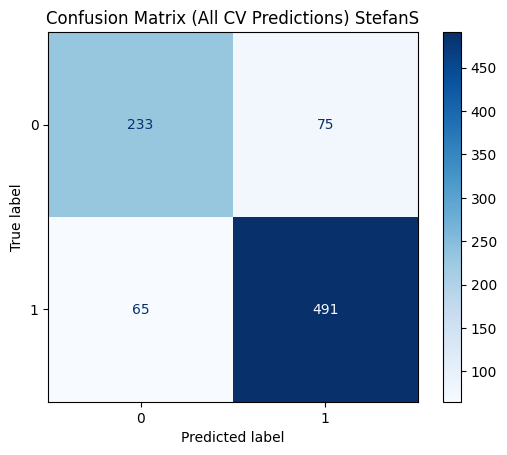

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.782          0.015        0.757       0.047    0.768   0.029
1           0.868          0.022        0.883       0.010    0.875   0.012


       Accuracy  F1 Macro
score  0.680737   0.63212


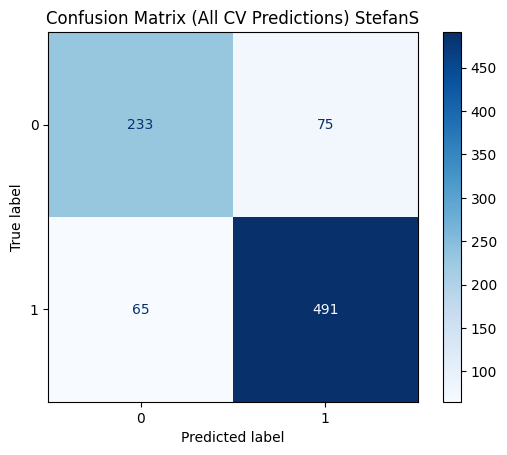

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
StevceK
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  8           363


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.922          0.033        0.863       0.056    0.890   0.034
1           0.781          0.070        0.864       0.060    0.818   0.049


       Accuracy  F1 Macro
score  0.746698  0.731718


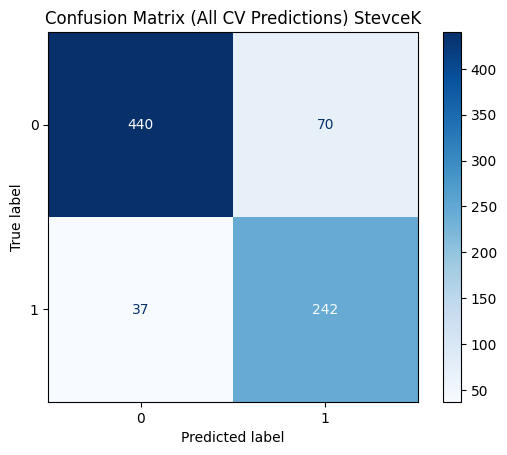

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.919          0.033        0.886       0.049    0.902   0.034
1           0.810          0.074        0.857       0.059    0.831   0.055


       Accuracy  F1 Macro
score  0.750488  0.735289


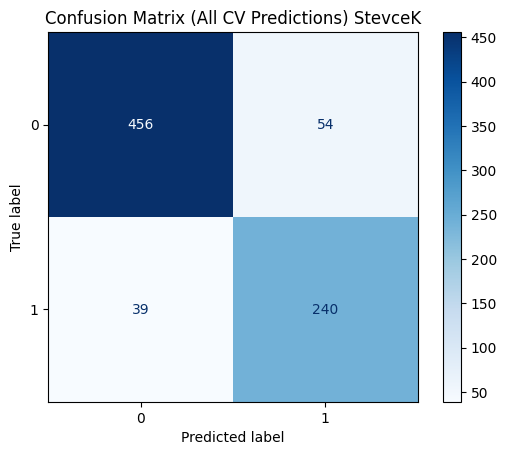

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.925          0.041        0.896       0.047    0.909   0.033
1           0.824          0.069        0.864       0.077    0.841   0.058


       Accuracy  F1 Macro
score  0.744175   0.71832


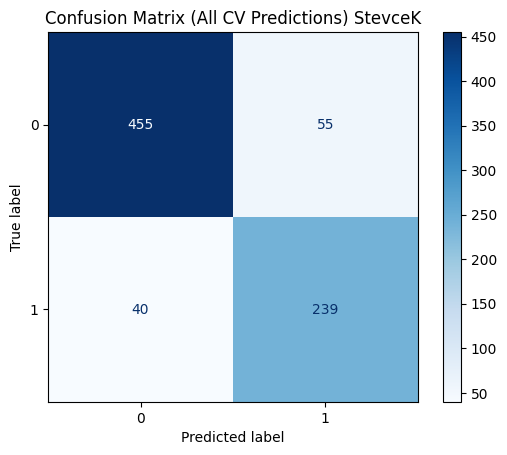

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
StevceK
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.864          0.028        0.835       0.044    0.848   0.018
1           0.720          0.045        0.756       0.064    0.735   0.025


       Accuracy  F1 Macro
score  0.668145  0.702731


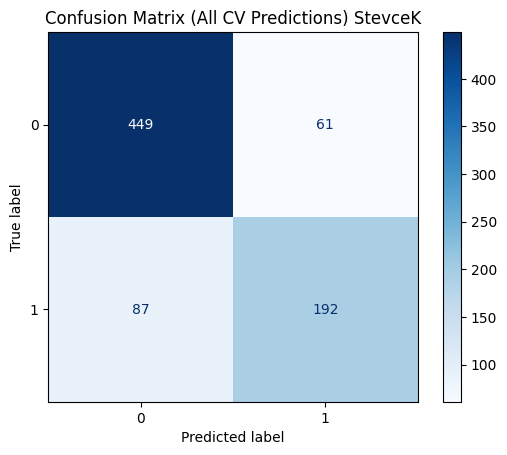

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         24         None                 2                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.844          0.017        0.855       0.037    0.849   0.020
1           0.732          0.048        0.710       0.040    0.719   0.028


       Accuracy  F1 Macro
score  0.702338  0.637492


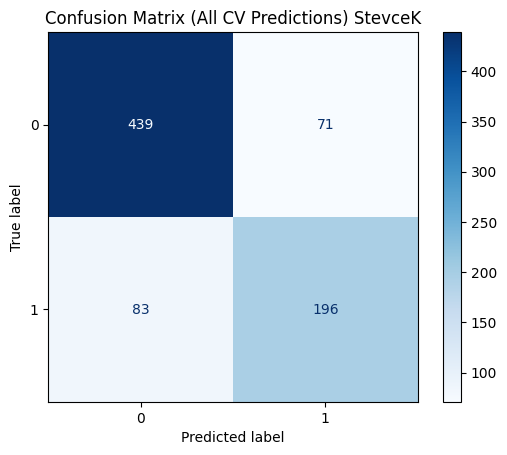

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.891           0.03        0.802       0.076    0.842   0.043
1           0.703           0.07        0.817       0.063    0.751   0.040


       Accuracy  F1 Macro
score  0.715021  0.699965


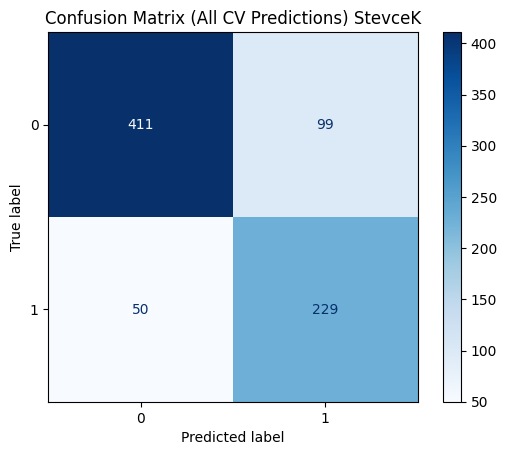

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
StevceK
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.795          0.023        0.847       0.046    0.819   0.028
1           0.686          0.055        0.599       0.057    0.637   0.044


       Accuracy  F1 Macro
score  0.652915  0.624448


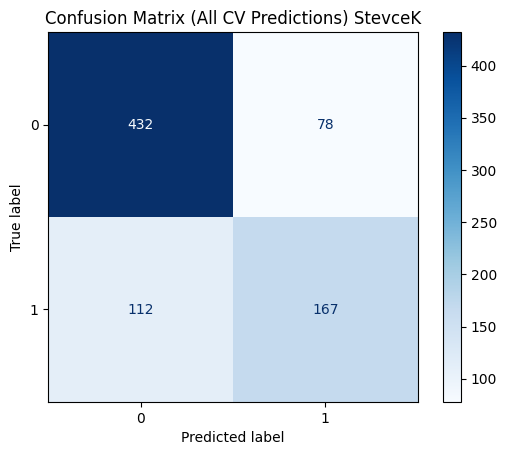

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.795          0.023        0.847       0.046    0.819   0.028
1           0.686          0.055        0.599       0.057    0.637   0.044


       Accuracy  F1 Macro
score  0.652915  0.624448


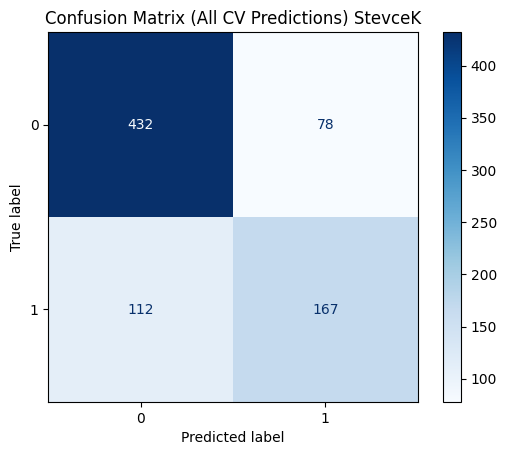

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            5  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.787          0.033        0.861       0.042    0.822   0.031
1           0.695          0.074        0.574       0.077    0.627   0.069


       Accuracy  F1 Macro
score  0.650335  0.614278


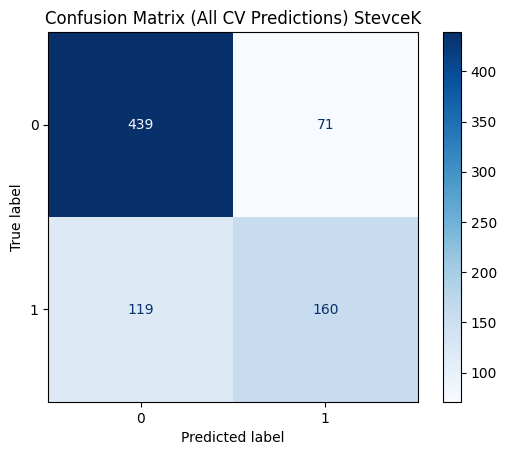

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
TamaraK
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 4                  7           352


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.954          0.019        0.882       0.035    0.916   0.016
1           0.951          0.014        0.981       0.008    0.966   0.006


       Accuracy  F1 Macro
score  0.892308  0.855585


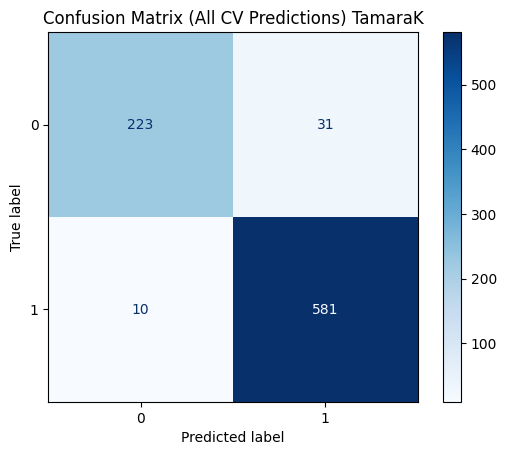

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.020        0.906       0.029    0.935   0.013
1           0.961          0.011        0.986       0.009    0.973   0.005


       Accuracy  F1 Macro
score  0.898225  0.856321


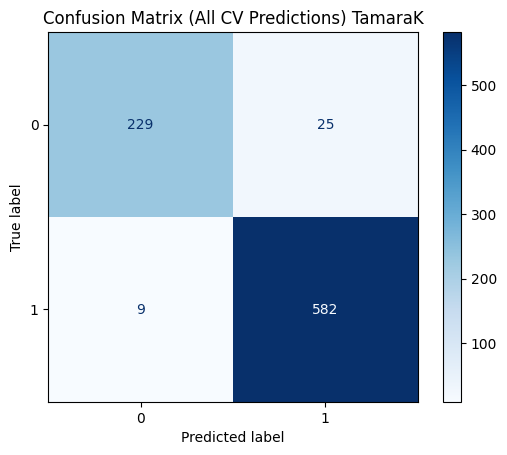

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         log2                 2                  5           369


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.023        0.886       0.026    0.920   0.011
1           0.953          0.010        0.983       0.009    0.968   0.004


       Accuracy  F1 Macro
score  0.895858  0.862031


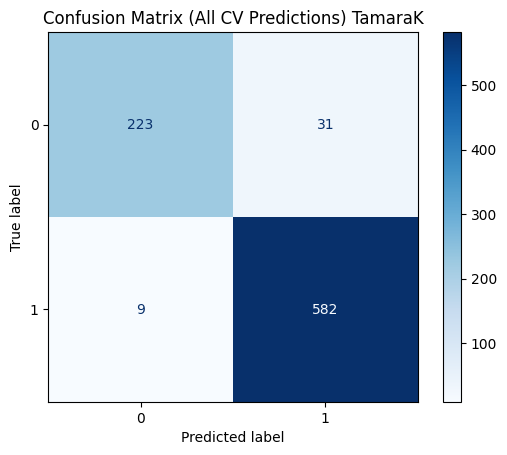

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
TamaraK
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         20         sqrt                 4                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.821          0.027        0.827       0.073    0.822   0.039
1           0.926          0.028        0.922       0.017    0.924   0.013


       Accuracy  F1 Macro
score  0.859172  0.841095


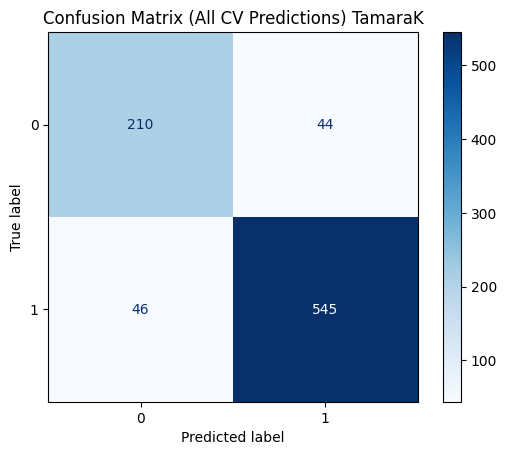

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.803          0.042        0.867       0.063    0.833   0.048
1           0.941          0.028        0.909       0.020    0.924   0.021


       Accuracy  F1 Macro
score  0.874556  0.797499


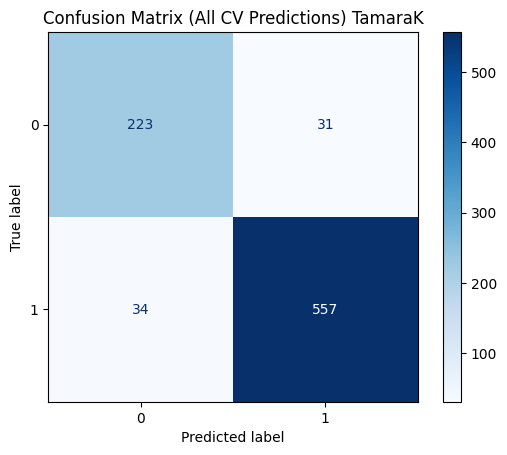

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.856          0.039        0.890       0.032    0.873   0.034
1           0.952          0.014        0.936       0.018    0.944   0.015


       Accuracy  F1 Macro
score  0.830769  0.846027


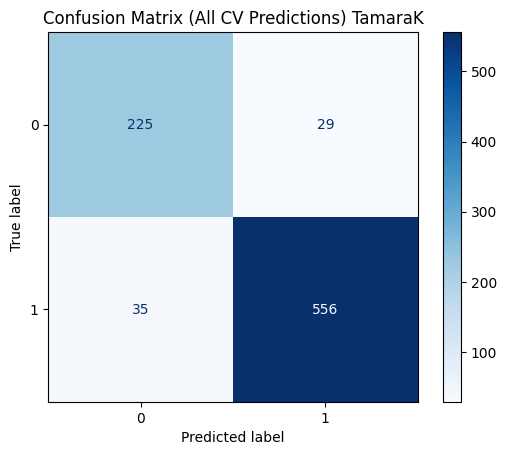

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
TamaraK
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.780          0.029        0.768       0.081    0.772   0.046
1           0.902          0.032        0.907       0.015    0.904   0.015


       Accuracy  F1 Macro
score  0.804734  0.763392


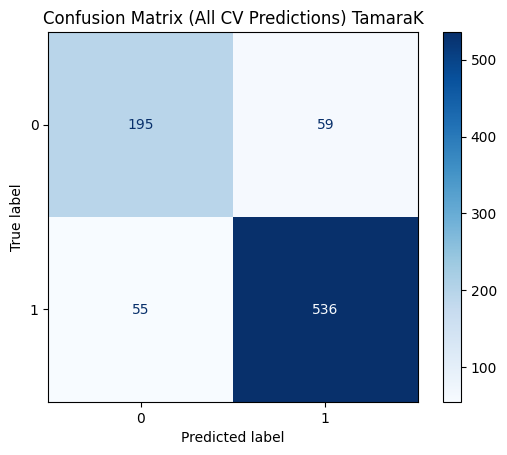

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.762          0.017        0.803       0.059    0.781   0.028
1           0.914          0.023        0.892       0.015    0.902   0.008


       Accuracy  F1 Macro
score  0.781065  0.738441


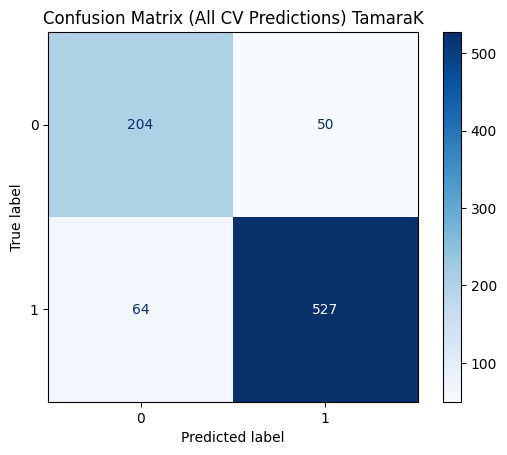

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.762          0.017        0.803       0.059    0.781   0.028
1           0.914          0.023        0.892       0.015    0.902   0.008


       Accuracy  F1 Macro
score  0.781065  0.738441


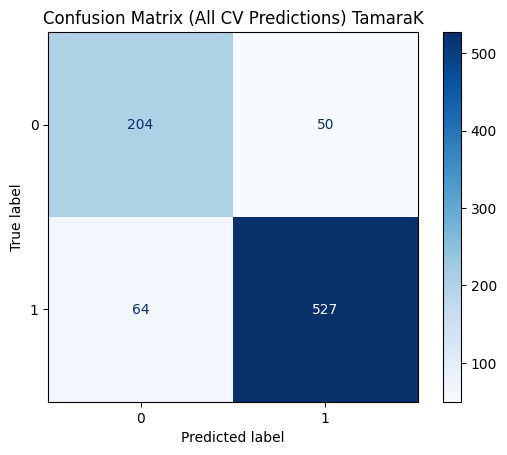

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
TomiN
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         35         log2                 3                  9           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.964       0.018    0.981   0.009
1           0.979           0.01        1.000       0.000    0.990   0.005


       Accuracy  F1 Macro
score  0.976667  0.970853


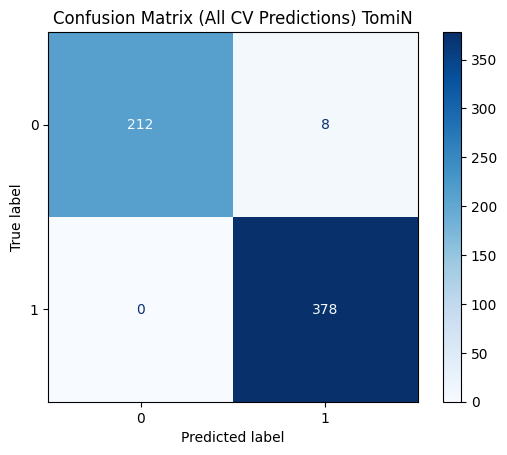

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.964       0.018    0.981   0.009
1           0.979           0.01        1.000       0.000    0.990   0.005


       Accuracy  F1 Macro
score  0.976667  0.972647


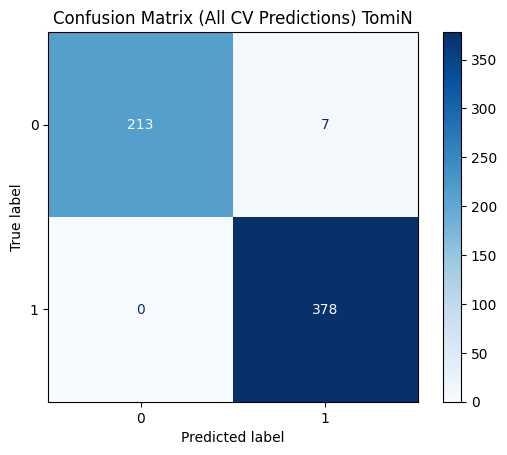

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         45         log2                 3                 10           427


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.964       0.018    0.981   0.009
1           0.979           0.01        1.000       0.000    0.990   0.005


       Accuracy  F1 Macro
score  0.974986  0.972647


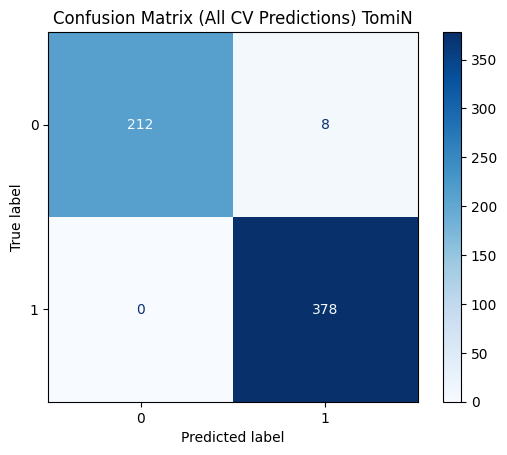

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
TomiN
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.931          0.044        0.955       0.014    0.942   0.025
1           0.973          0.008        0.958       0.028    0.965   0.016


       Accuracy  F1 Macro
score  0.936499  0.953197


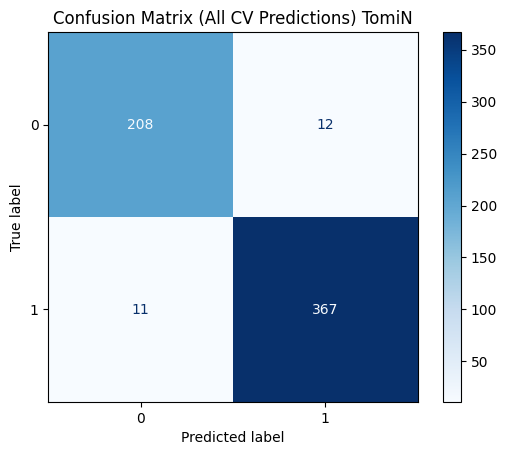

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.035        0.959       0.042    0.959   0.028
1           0.977          0.023        0.976       0.021    0.976   0.016


       Accuracy  F1 Macro
score  0.933123  0.967437


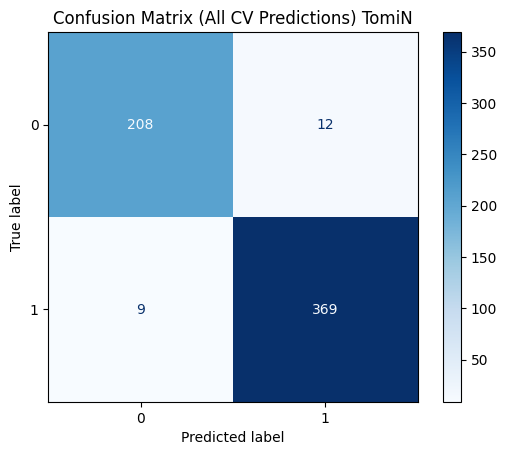

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.965          0.036        0.955       0.038    0.959   0.025
1           0.974          0.021        0.979       0.022    0.976   0.014


       Accuracy  F1 Macro
score  0.951583  0.953592


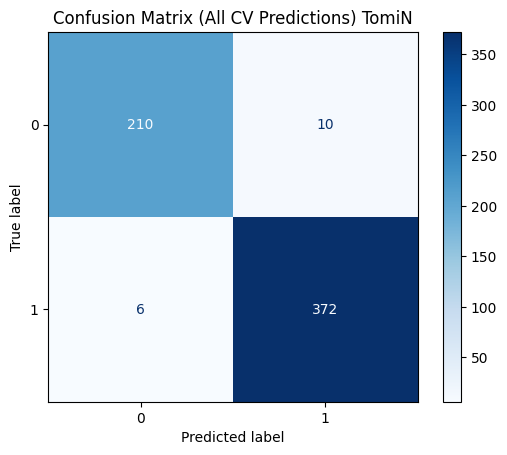

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
TomiN
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.941       0.037    0.969    0.02
1           0.967           0.02        1.000       0.000    0.983    0.01


       Accuracy  F1 Macro
score     0.945  0.934251


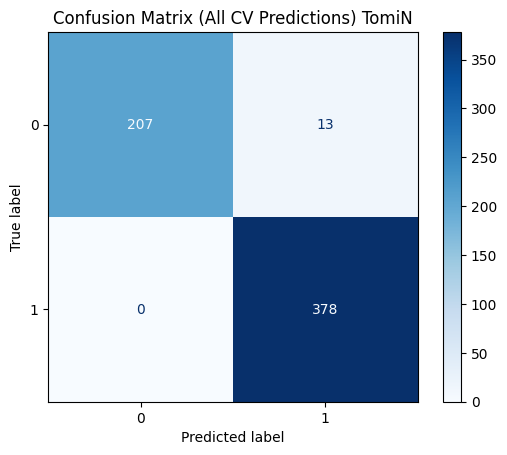

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.941       0.037    0.969    0.02
1           0.967           0.02        1.000       0.000    0.983    0.01


       Accuracy  F1 Macro
score     0.945  0.934251


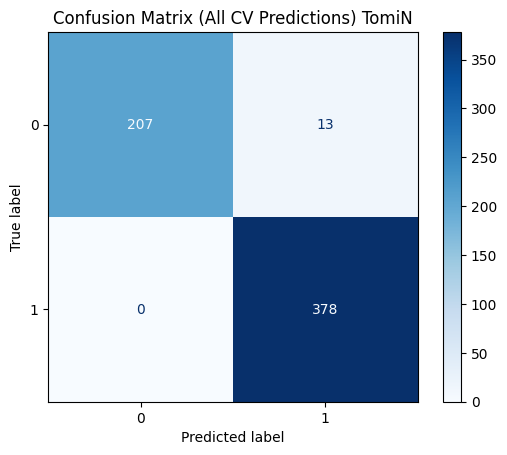

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.941       0.037    0.969    0.02
1           0.967           0.02        1.000       0.000    0.983    0.01


       Accuracy  F1 Macro
score     0.945  0.934251


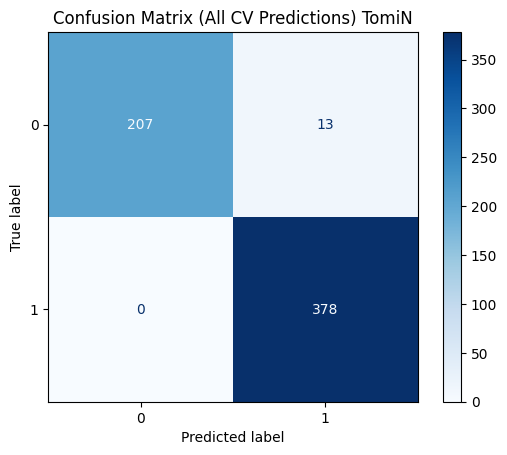

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
ViktorI
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.031        0.924       0.020    0.935   0.018
1           0.941          0.014        0.957       0.026    0.948   0.015


       Accuracy  F1 Macro
score  0.917031  0.916183


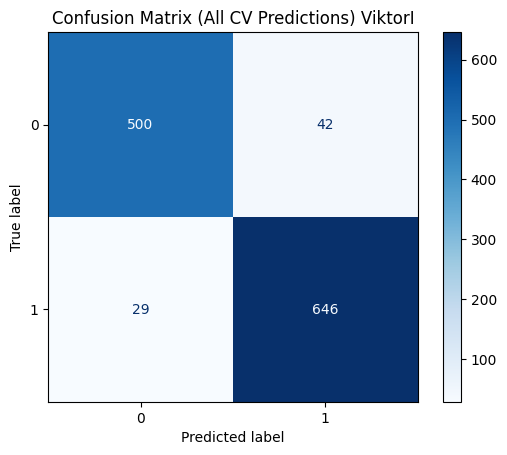

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.944          0.026        0.922       0.019    0.933   0.017
1           0.939          0.014        0.956       0.021    0.947   0.014


       Accuracy  F1 Macro
score  0.913735  0.917831


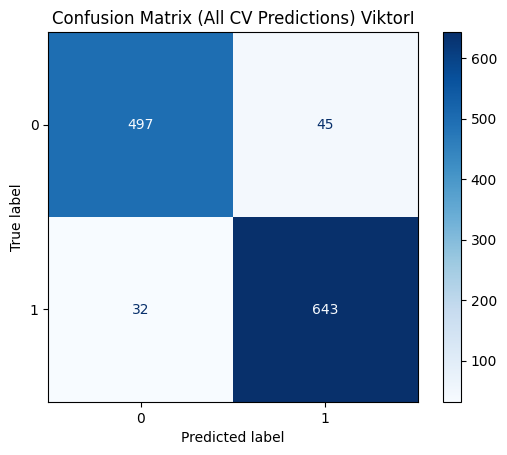

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 3                  7           408


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.025        0.917       0.025    0.932   0.016
1           0.935          0.017        0.960       0.021    0.947   0.012


       Accuracy  F1 Macro
score  0.916208  0.916176


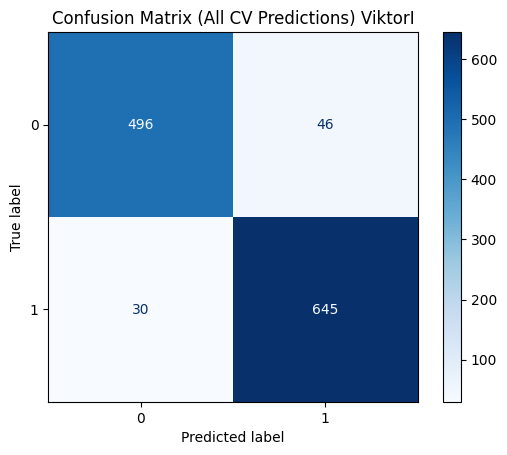

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
ViktorI
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         38         sqrt                 4                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.877          0.043        0.884       0.024    0.879   0.017
1           0.906          0.016        0.898       0.041    0.901   0.018


       Accuracy  F1 Macro
score  0.838147  0.865828


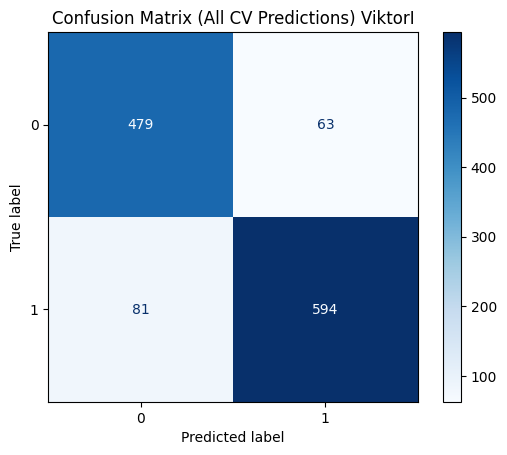

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         20         sqrt                 4                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.869          0.047        0.889       0.024    0.878   0.017
1           0.910          0.015        0.889       0.047    0.898   0.021


       Accuracy  F1 Macro
score  0.836521  0.802019


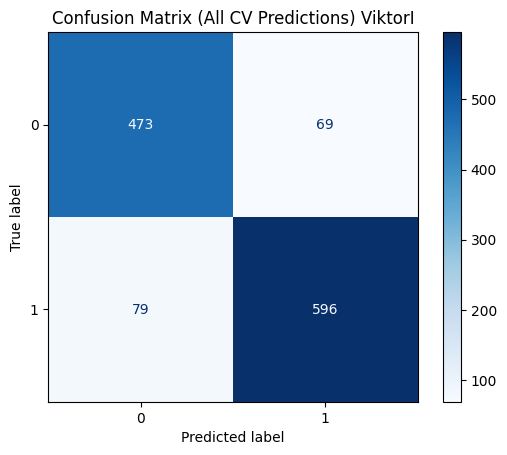

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         28         log2                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.848          0.036        0.867       0.031    0.857   0.024
1           0.892          0.022        0.874       0.036    0.882   0.021


       Accuracy  F1 Macro
score  0.824155  0.831608


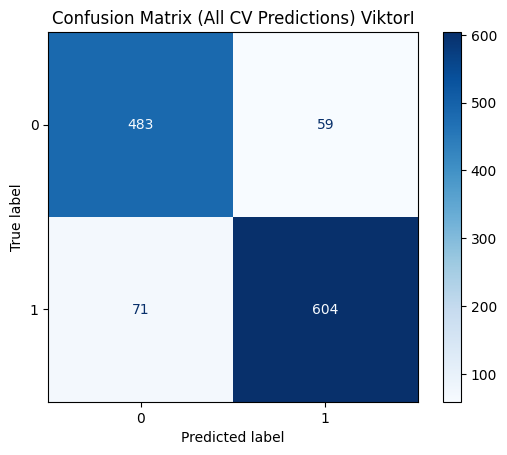

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
ViktorI
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.814          0.029        0.799       0.048    0.806   0.036
1           0.842          0.035        0.853       0.022    0.847   0.026


       Accuracy  F1 Macro
score  0.690198  0.677516


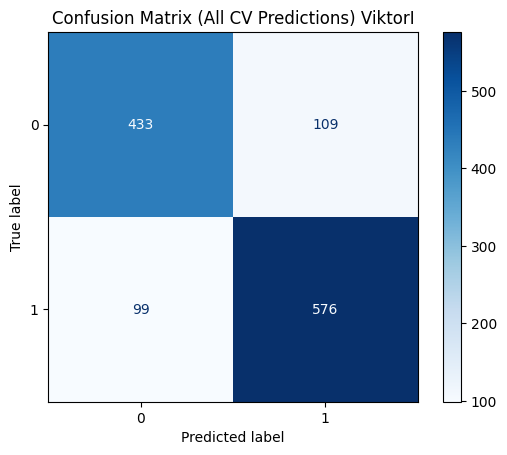

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.814          0.029        0.799       0.048    0.806   0.036
1           0.842          0.035        0.853       0.022    0.847   0.026


       Accuracy  F1 Macro
score  0.690198  0.677516


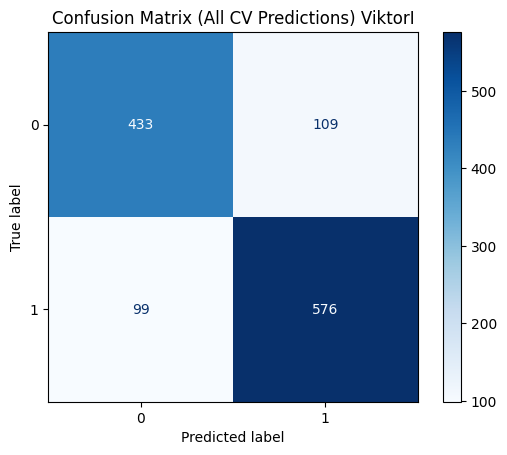

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.810          0.046        0.762       0.036    0.785   0.032
1           0.818          0.025        0.855       0.039    0.835   0.027


       Accuracy  F1 Macro
score  0.695143  0.676664


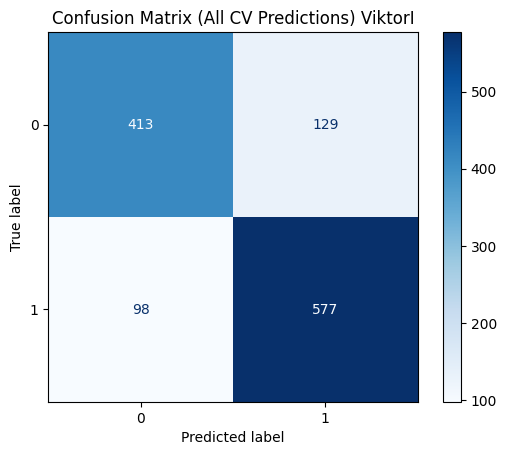

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
ViktorijaP
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 2                  4           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.952          0.009        0.905       0.024    0.928   0.014
1           0.940          0.014        0.970       0.006    0.955   0.008


       Accuracy  F1 Macro
score  0.881371  0.867806


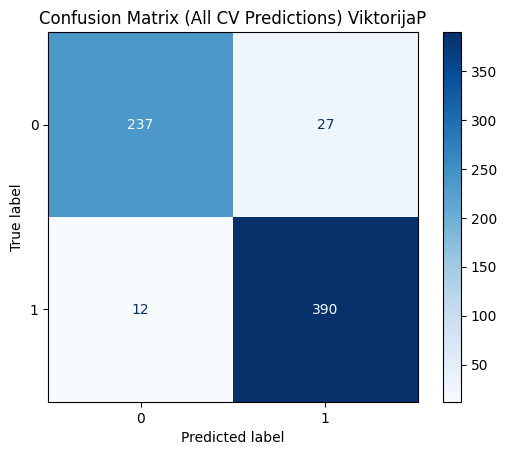

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 1                  9           262


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.948          0.009        0.898       0.019    0.922   0.011
1           0.935          0.012        0.968       0.006    0.951   0.007


       Accuracy  F1 Macro
score   0.88136  0.868808


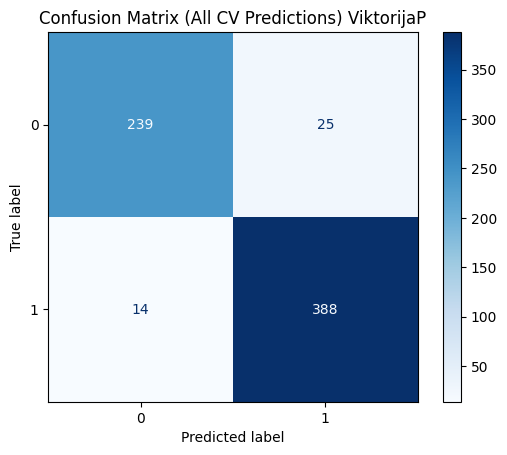

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         16         log2                 1                  8           161


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.008        0.902       0.022    0.931   0.011
1           0.938          0.013        0.978       0.005    0.957   0.006


       Accuracy  F1 Macro
score  0.888856   0.87158


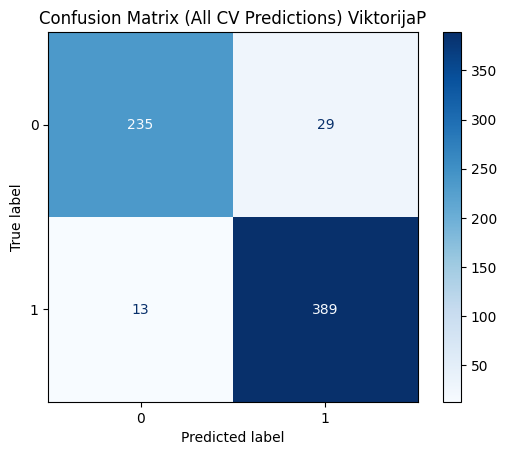

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
ViktorijaP
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         44         log2                 2                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.850          0.040        0.867       0.016    0.858   0.023
1           0.912          0.011        0.898       0.031    0.905   0.018


       Accuracy  F1 Macro
score  0.839345  0.817105


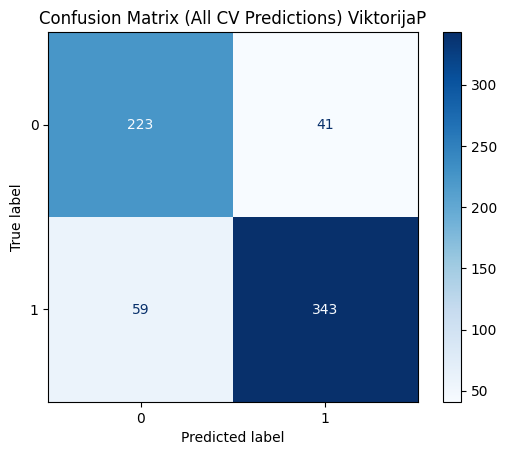

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         38         sqrt                 3                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.871          0.042        0.856       0.048    0.862   0.030
1           0.907          0.027        0.916       0.032    0.911   0.018


       Accuracy  F1 Macro
score  0.849837  0.817934


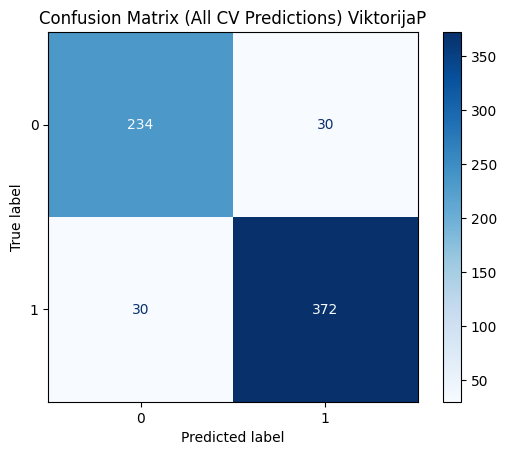

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.841          0.026        0.883       0.043    0.861   0.031
1           0.921          0.028        0.891       0.018    0.905   0.020


       Accuracy  F1 Macro
score  0.851363  0.858536


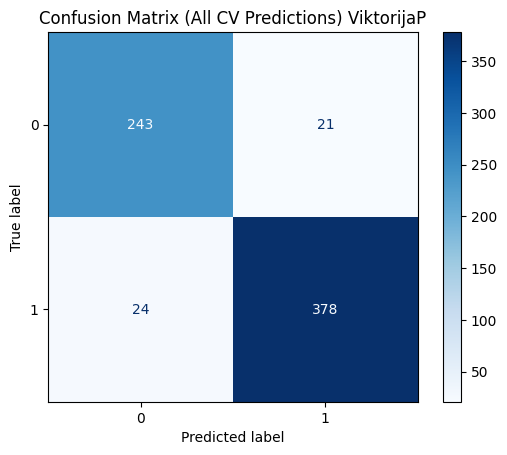

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
ViktorijaP
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.908          0.044        0.834       0.048    0.868   0.030
1           0.897          0.027        0.943       0.029    0.919   0.019


       Accuracy  F1 Macro
score  0.822915  0.806336


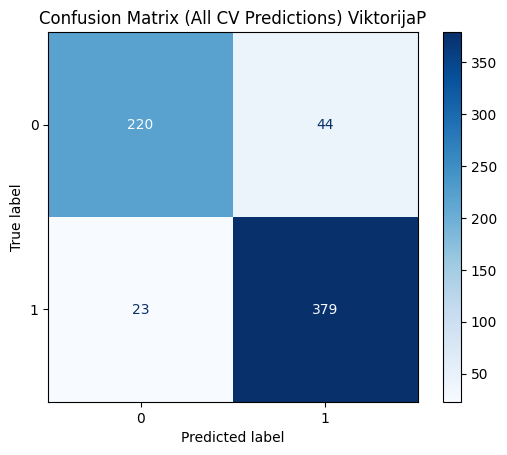

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.914          0.048        0.845       0.053    0.876   0.028
1           0.904          0.030        0.945       0.032    0.923   0.018


       Accuracy  F1 Macro
score  0.816968  0.797787


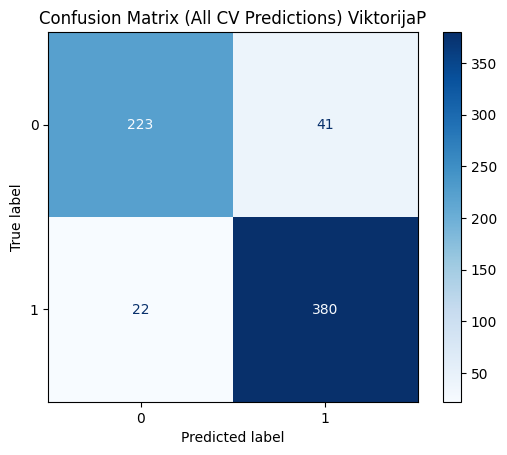

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.904          0.030        0.841       0.059     0.87   0.033
1           0.901          0.033        0.940       0.022     0.92   0.019


       Accuracy  F1 Macro
score  0.812457  0.794132


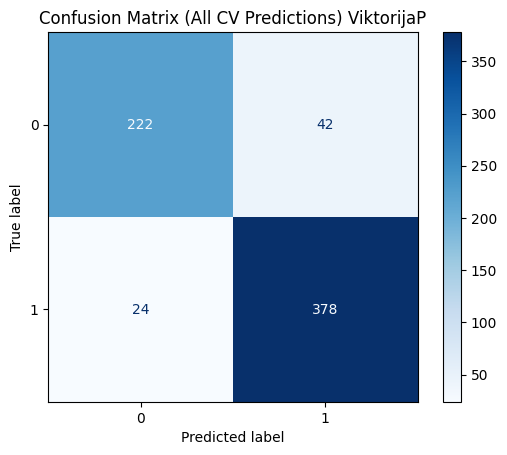

In [28]:
models=[RandomForestClassifier,DecisionTreeClassifier,KNeighborsClassifier]
for NAME in all_names:
    for i, MODEL in enumerate(models):
        print(MODEL)
        model_instance = MODEL()
        final_pipeline(model=model_instance,param_dist=params[i],search_type='random', names=NAME, feat=None,n_iter=25, top_k=3,cv_splits=5)

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
TamaraK
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962          0.014        0.902       0.035    0.931   0.019
1           0.959          0.014        0.985       0.006    0.972   0.007


       Accuracy  F1 Macro
score  0.886391  0.841716


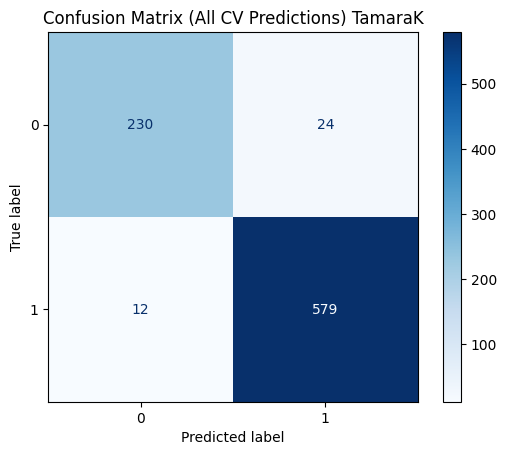

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         18         log2                 2                 10           445


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962          0.015        0.882       0.025    0.920   0.016
1           0.951          0.010        0.985       0.006    0.968   0.006


       Accuracy  F1 Macro
score  0.894675  0.860925


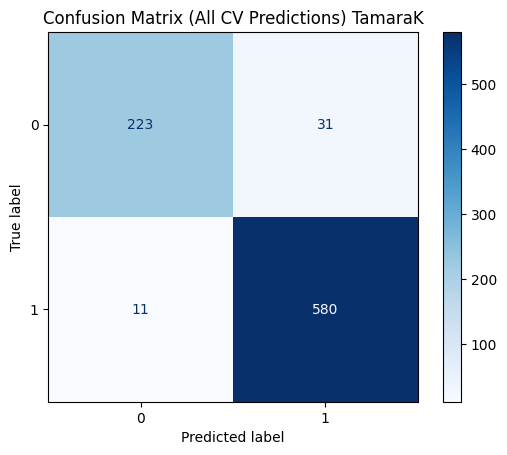

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         46         log2                 2                  3           317


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962          0.027        0.886       0.029    0.922   0.018
1           0.953          0.011        0.985       0.011    0.968   0.007


       Accuracy  F1 Macro
score  0.892308   0.84675


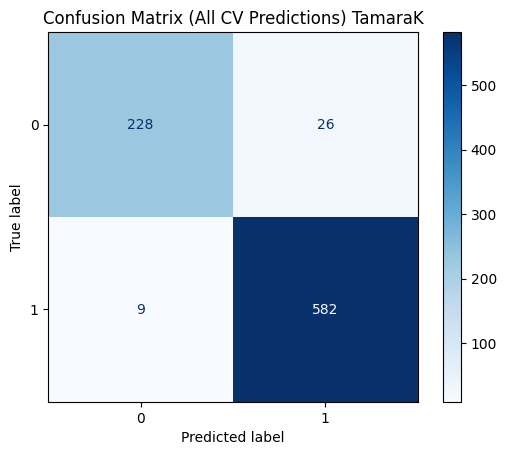

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
TamaraK
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.842          0.055        0.822       0.053    0.829   0.023
1           0.925          0.017        0.931       0.030    0.927   0.011


       Accuracy  F1 Macro
score  0.849704  0.773676


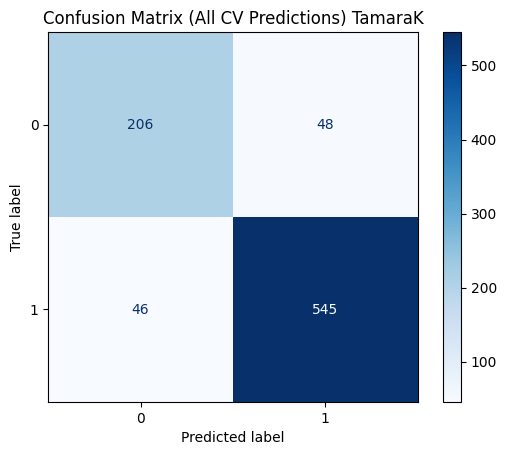

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         35         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.842          0.049        0.795       0.069    0.815   0.039
1           0.915          0.025        0.934       0.025    0.924   0.013


       Accuracy  F1 Macro
score  0.840237  0.824687


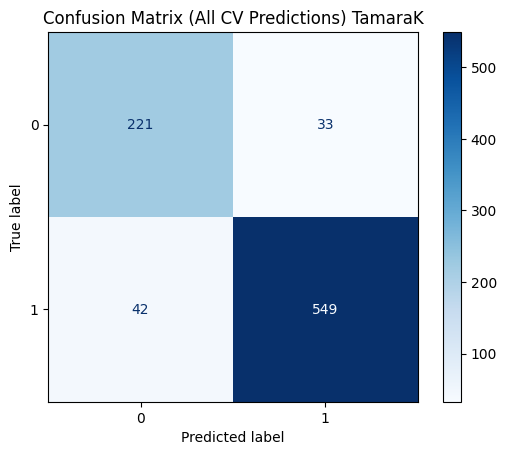

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         28         log2                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.853          0.049        0.870       0.039    0.860   0.030
1           0.944          0.016        0.934       0.025    0.939   0.014


       Accuracy  F1 Macro
score  0.836686  0.770121


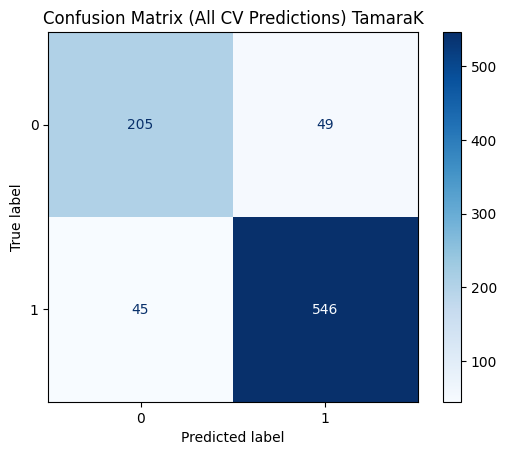

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
TamaraK
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.780          0.029        0.768       0.081    0.772   0.046
1           0.902          0.032        0.907       0.015    0.904   0.015


       Accuracy  F1 Macro
score  0.804734  0.763392


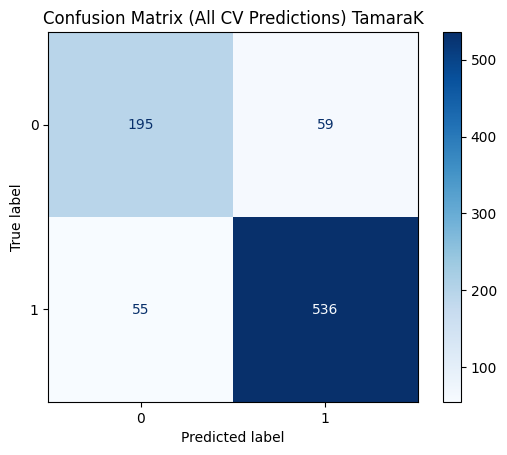

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.762          0.017        0.803       0.059    0.781   0.028
1           0.914          0.023        0.892       0.015    0.902   0.008


       Accuracy  F1 Macro
score  0.781065  0.738441


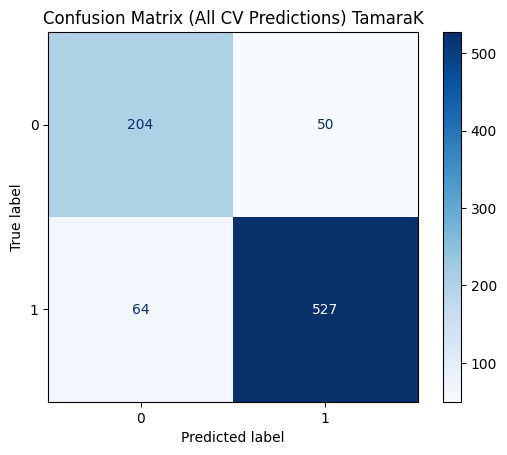

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.762          0.017        0.803       0.059    0.781   0.028
1           0.914          0.023        0.892       0.015    0.902   0.008


       Accuracy  F1 Macro
score  0.781065  0.738441


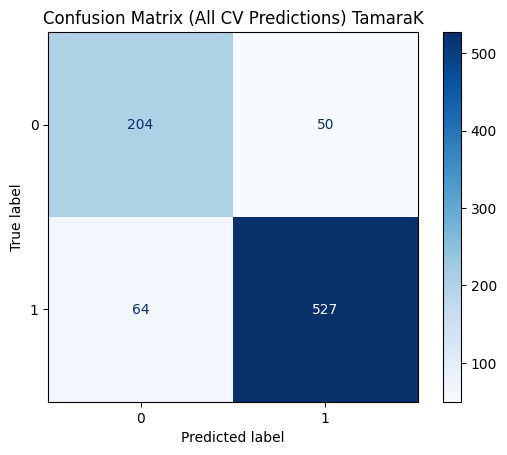

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
TomiN
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.968       0.018    0.984   0.009
1           0.982           0.01        1.000       0.000    0.991   0.005


       Accuracy  F1 Macro
score  0.976667  0.974788


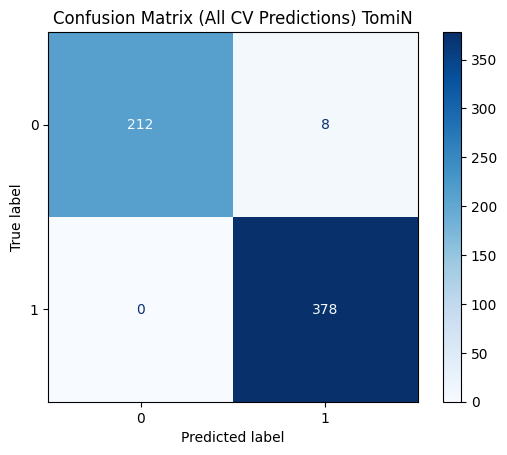

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.964       0.018    0.981   0.009
1           0.979           0.01        1.000       0.000    0.990   0.005


       Accuracy  F1 Macro
score  0.978333  0.972647


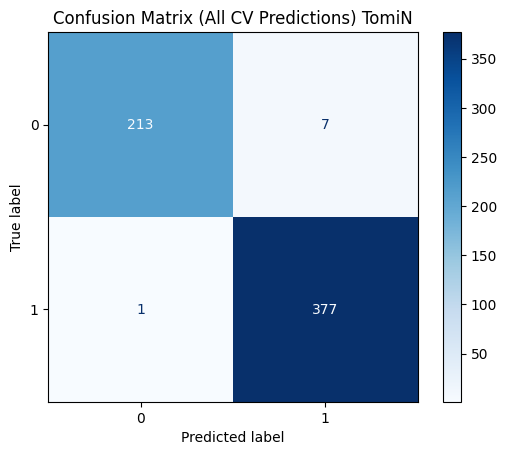

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 3                  7           408


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.964       0.018    0.981   0.009
1           0.979           0.01        1.000       0.000    0.990   0.005


       Accuracy  F1 Macro
score  0.976667  0.972647


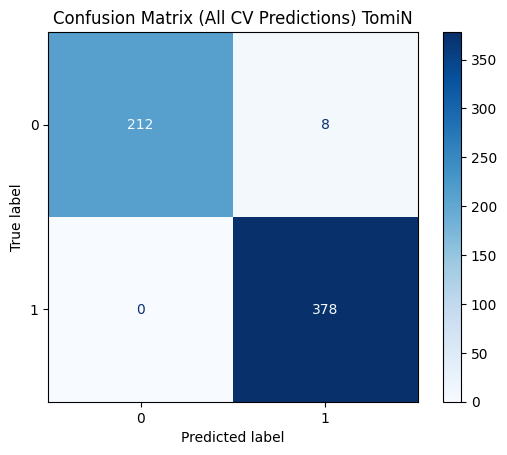

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
TomiN
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.035        0.959       0.027    0.959   0.023
1           0.976          0.015        0.976       0.021    0.976   0.014


       Accuracy  F1 Macro
score  0.946541  0.926565


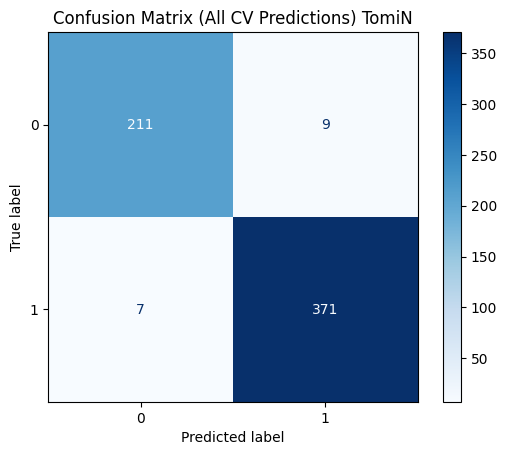

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.951          0.033        0.945       0.042    0.947   0.026
1           0.969          0.024        0.971       0.019    0.970   0.015


       Accuracy  F1 Macro
score  0.941527   0.94507


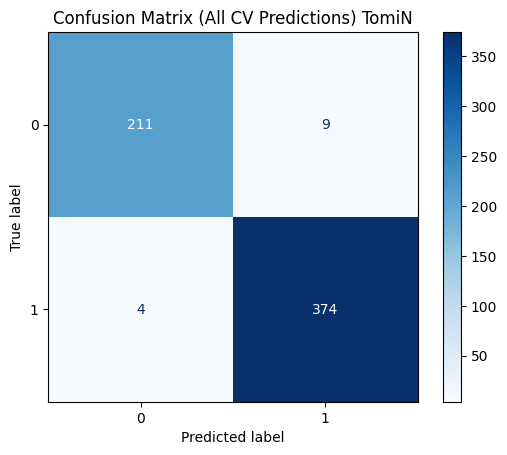

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         28         log2                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.025        0.909       0.050    0.925   0.034
1           0.949          0.028        0.968       0.014    0.958   0.019


       Accuracy  F1 Macro
score  0.959902   0.89763


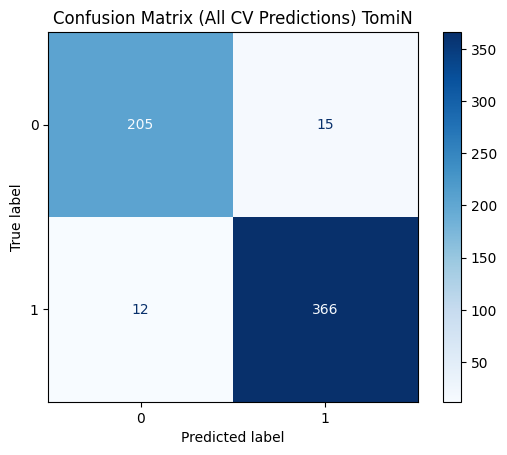

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
TomiN
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.941       0.037    0.969    0.02
1           0.967           0.02        1.000       0.000    0.983    0.01


       Accuracy  F1 Macro
score     0.945  0.934251


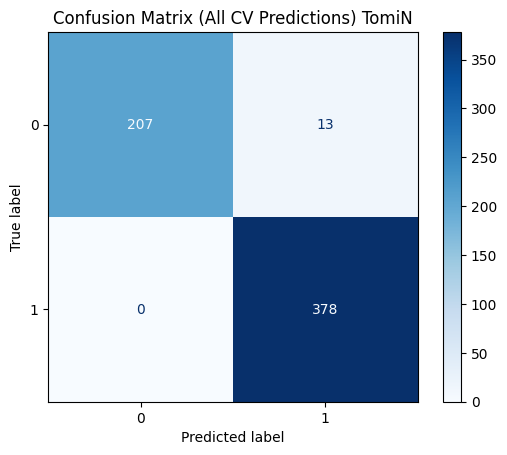

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.941       0.037    0.969    0.02
1           0.967           0.02        1.000       0.000    0.983    0.01


       Accuracy  F1 Macro
score     0.945  0.934251


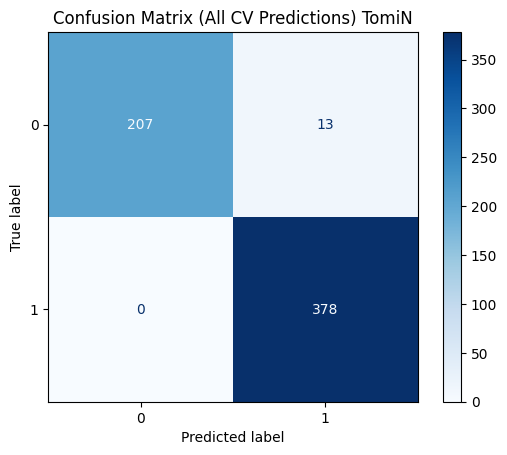

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000           0.00        0.941       0.037    0.969    0.02
1           0.967           0.02        1.000       0.000    0.983    0.01


       Accuracy  F1 Macro
score     0.945  0.934251


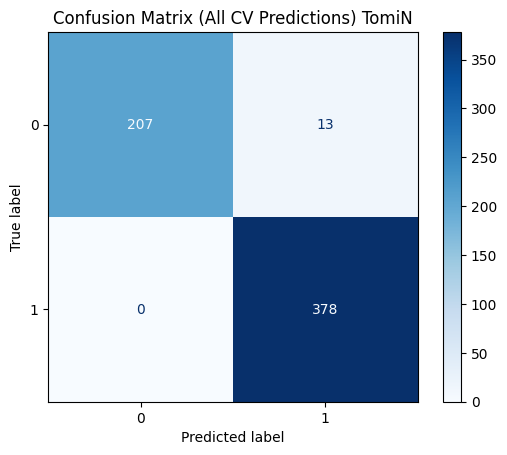

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
ViktorI
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.029        0.919       0.026    0.932   0.018
1           0.937          0.018        0.957       0.025    0.946   0.014


       Accuracy  F1 Macro
score  0.917024  0.913627


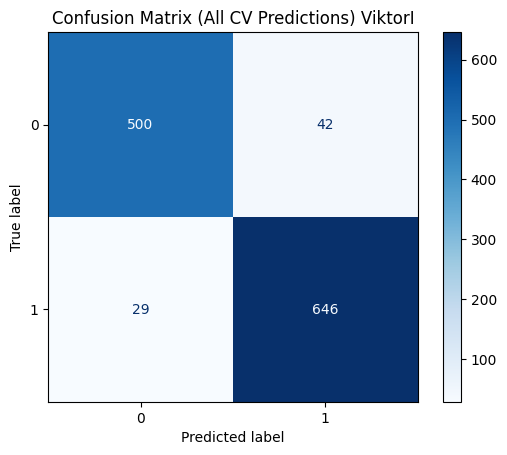

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.951          0.019        0.919       0.026    0.934   0.013
1           0.937          0.018        0.961       0.016    0.949   0.009


       Accuracy  F1 Macro
score  0.917854  0.916144


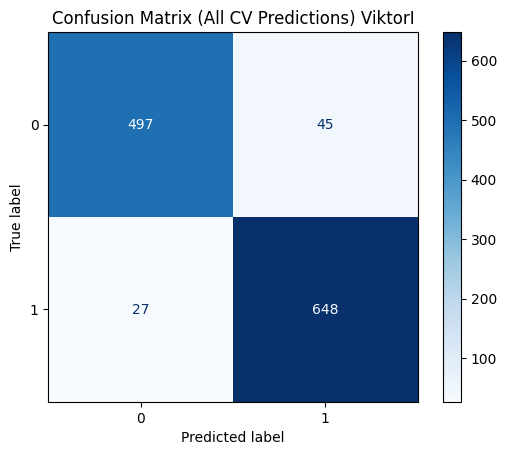

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  8           363


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.024        0.913       0.024    0.928   0.017
1           0.932          0.017        0.956       0.020    0.944   0.013


       Accuracy  F1 Macro
score  0.917854  0.913336


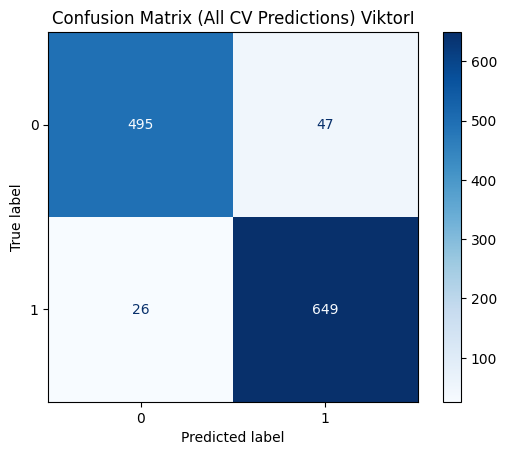

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
ViktorI
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.877          0.030        0.893       0.029    0.884    0.01
1           0.914          0.019        0.898       0.031    0.905    0.01


       Accuracy  F1 Macro
score  0.832382  0.850477


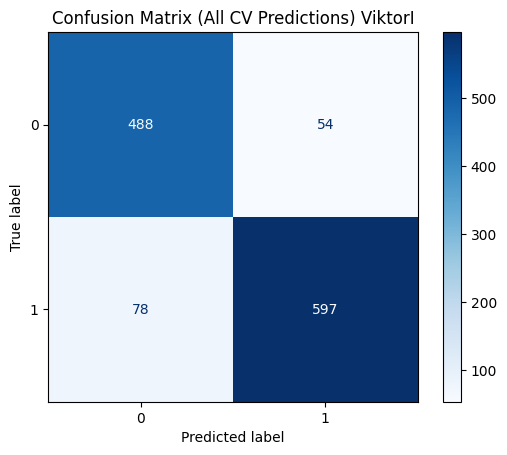

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         38         sqrt                 4                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.861          0.023        0.869       0.022    0.865   0.020
1           0.894          0.017        0.887       0.020    0.891   0.016


       Accuracy  F1 Macro
score  0.825929   0.82837


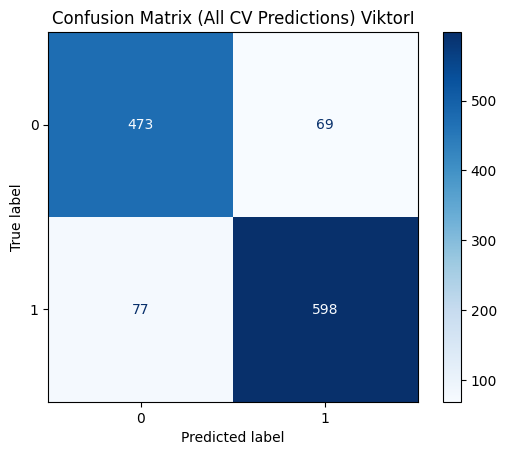

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         39         log2                 2                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.888          0.019        0.875       0.038    0.881   0.022
1           0.901          0.027        0.911       0.017    0.906   0.015


       Accuracy  F1 Macro
score   0.82427  0.851819


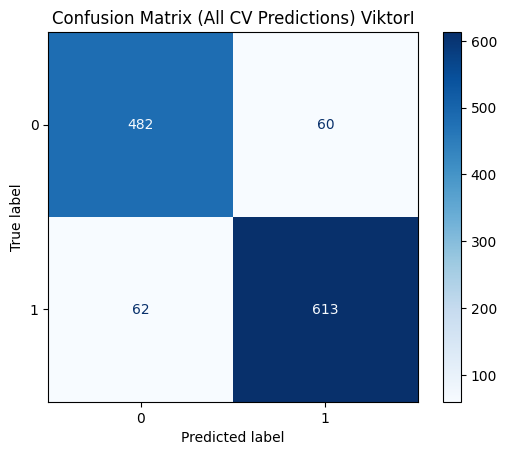

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
ViktorI
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.814          0.029        0.799       0.048    0.806   0.036
1           0.842          0.035        0.853       0.022    0.847   0.026


       Accuracy  F1 Macro
score  0.690198  0.677516


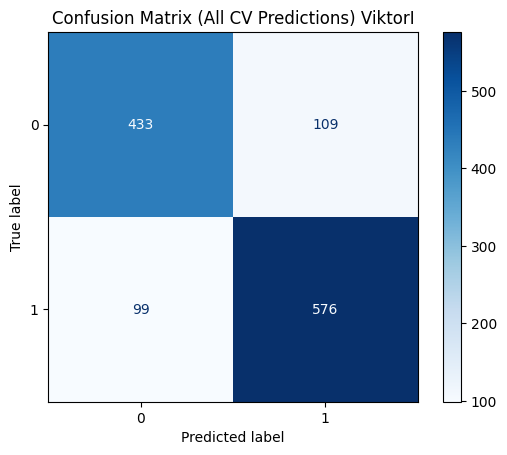

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.814          0.029        0.799       0.048    0.806   0.036
1           0.842          0.035        0.853       0.022    0.847   0.026


       Accuracy  F1 Macro
score  0.690198  0.677516


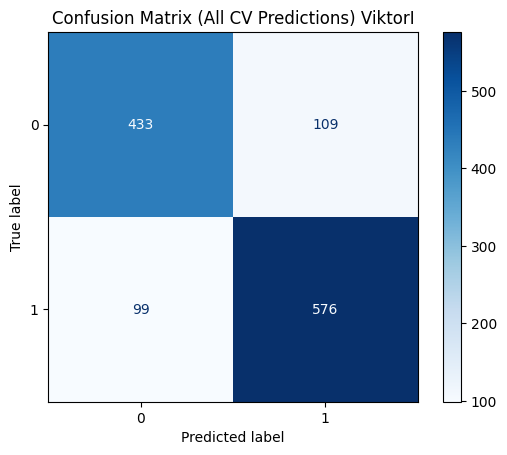

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.810          0.046        0.762       0.036    0.785   0.032
1           0.818          0.025        0.855       0.039    0.835   0.027


       Accuracy  F1 Macro
score  0.695143  0.676664


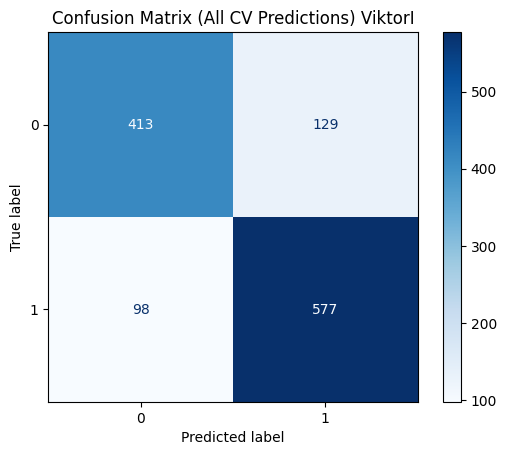

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
ViktorijaP
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         46         log2                 2                  3           317


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.956          0.019        0.894       0.019    0.924   0.012
1           0.933          0.011        0.973       0.012    0.953   0.007


       Accuracy  F1 Macro
score  0.884345  0.857626


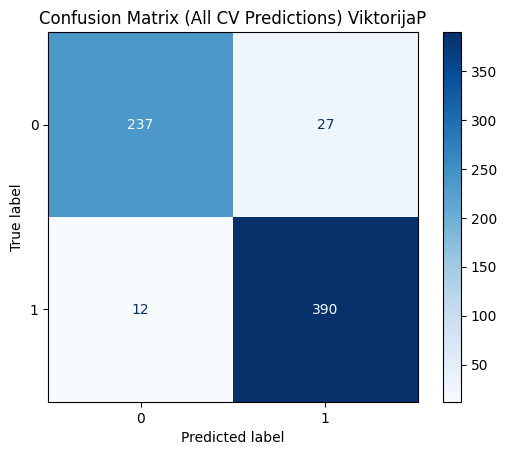

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.017        0.898       0.019    0.928   0.008
1           0.936          0.011        0.975       0.011    0.955   0.005


       Accuracy  F1 Macro
score  0.890349  0.876105


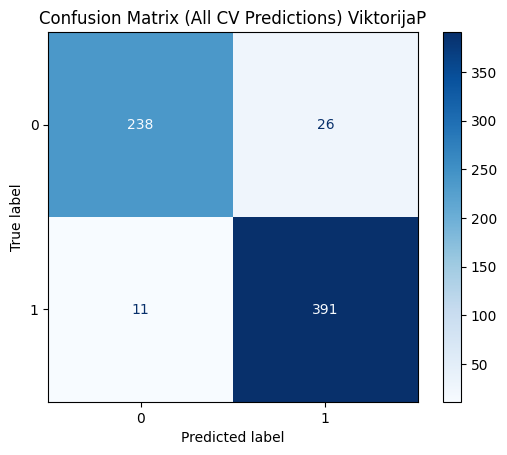

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 1                  9           262


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.945          0.014        0.902       0.022    0.922   0.013
1           0.937          0.013        0.965       0.009    0.951   0.008


       Accuracy  F1 Macro
score  0.884368  0.869579


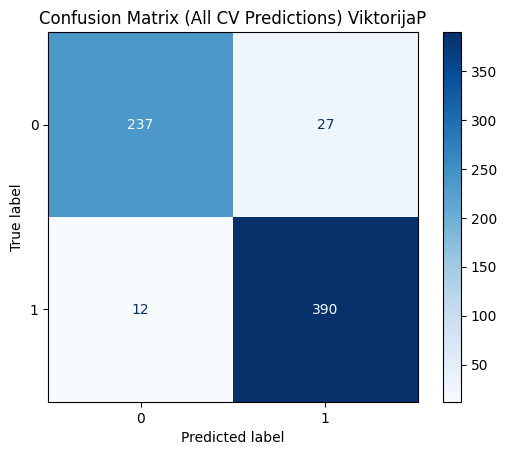

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
ViktorijaP
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.876          0.055        0.887       0.070    0.877   0.027
1           0.927          0.038        0.913       0.041    0.919   0.017


       Accuracy  F1 Macro
score  0.870755  0.827858


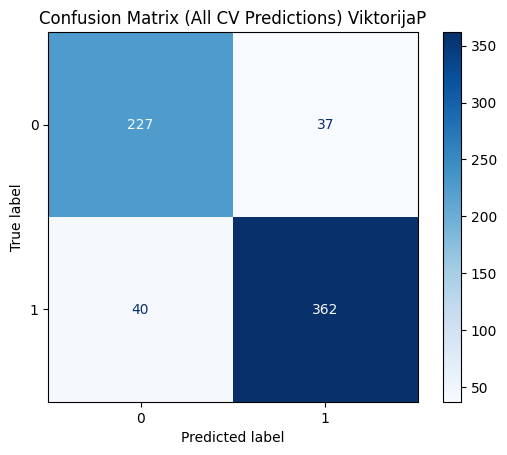

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.882          0.028        0.921       0.025    0.900   0.005
1           0.947          0.015        0.918       0.023    0.932   0.006


       Accuracy  F1 Macro
score   0.84839  0.877005


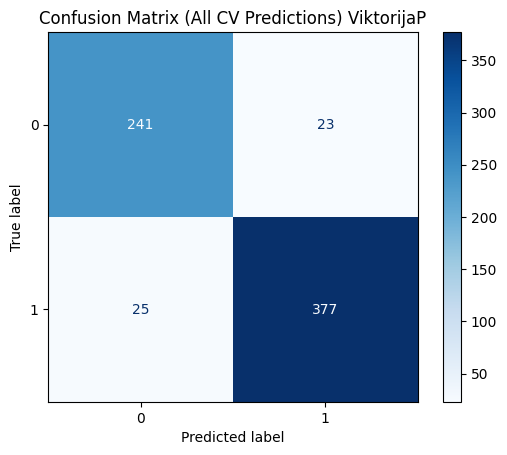

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         38         sqrt                 4                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.842          0.070        0.875       0.060    0.856   0.049
1           0.917          0.037        0.888       0.058    0.901   0.037


       Accuracy  F1 Macro
score  0.848311  0.804059


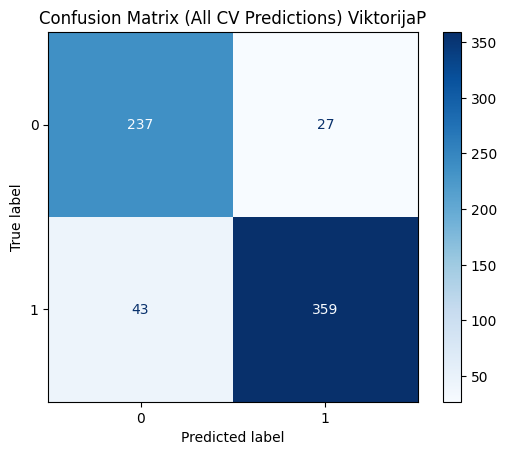

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
ViktorijaP
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.908          0.044        0.834       0.048    0.868   0.030
1           0.897          0.027        0.943       0.029    0.919   0.019


       Accuracy  F1 Macro
score  0.822915  0.806336


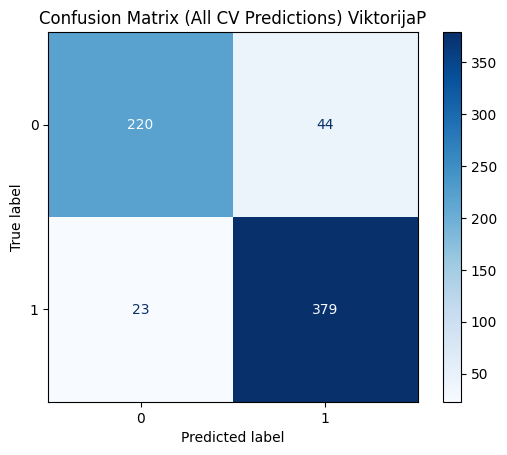

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.914          0.048        0.845       0.053    0.876   0.028
1           0.904          0.030        0.945       0.032    0.923   0.018


       Accuracy  F1 Macro
score  0.816968  0.797787


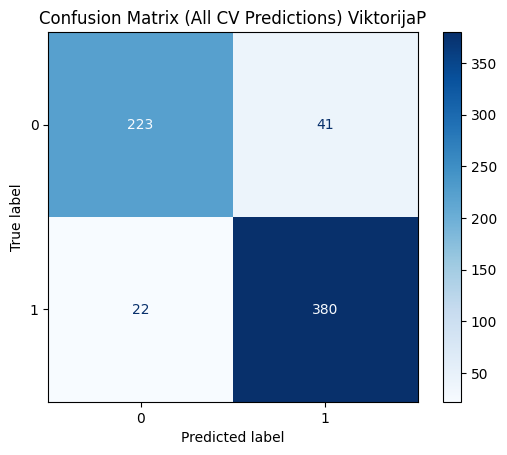

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.904          0.030        0.841       0.059     0.87   0.033
1           0.901          0.033        0.940       0.022     0.92   0.019


       Accuracy  F1 Macro
score  0.812457  0.794132


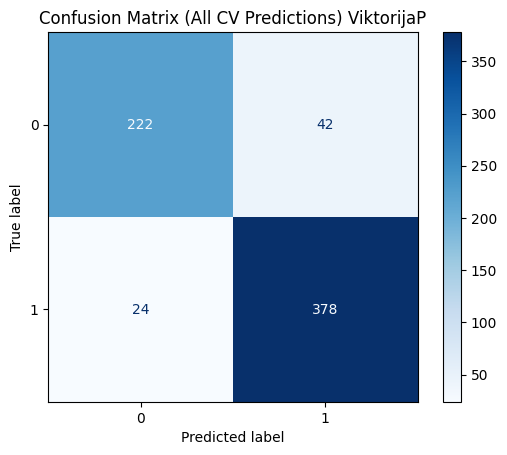

In [29]:
models=[RandomForestClassifier,DecisionTreeClassifier,KNeighborsClassifier]
for NAME in ['FEIT_eating_TamaraK','FEIT_eating_TomiN','FEIT_eating_ViktorI','FEIT_eating_ViktorijaP']:
    for i, MODEL in enumerate(models):
        print(MODEL)
        model_instance = MODEL()
        final_pipeline(model=model_instance,param_dist=params[i],search_type='random', names=NAME, feat=None,n_iter=25, top_k=3,cv_splits=5)

AngelaM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.681224       0.198571          8           286         100   

   subsample  verbosity  
0   0.952187         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.028        0.967       0.021    0.963   0.015
1           0.978          0.014        0.973       0.021    0.975   0.011


       Accuracy  F1 Macro
score  0.908639   0.90499


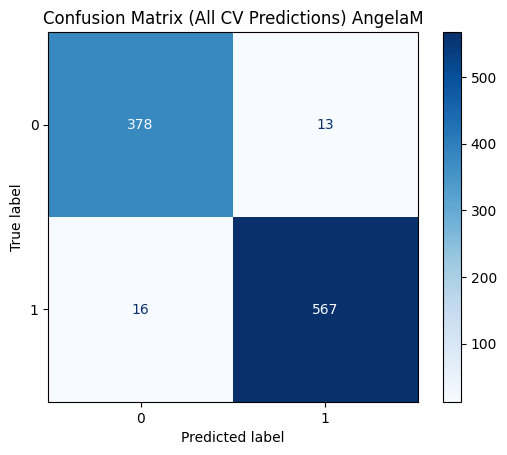

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.024        0.964       0.019    0.958   0.011
1           0.976          0.012        0.967       0.018    0.972   0.008


       Accuracy  F1 Macro
score  0.907613  0.903717


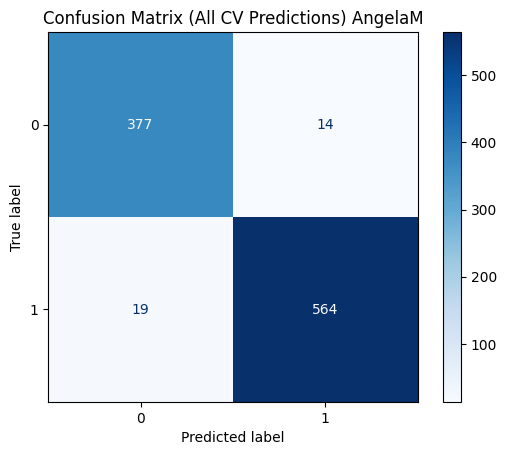

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.725742       0.111714          6           330         123   

   subsample  verbosity  
0   0.815936         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.023        0.964       0.019    0.953   0.008
1           0.976          0.012        0.961       0.018    0.968   0.006


       Accuracy  F1 Macro
score  0.905562  0.901604


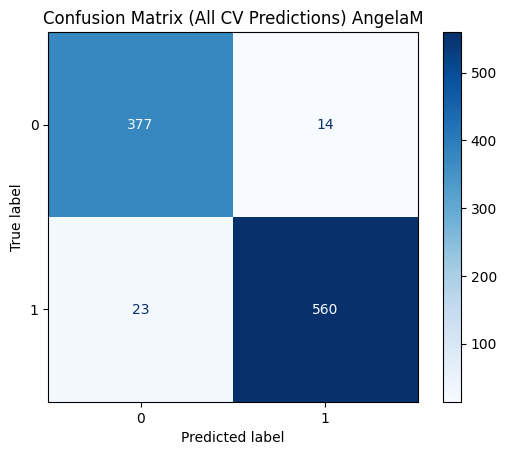

AngelaS
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.017        0.943       0.017    0.956   0.017
1           0.973          0.008        0.986       0.008    0.979   0.008


       Accuracy  F1 Macro
score  0.941375  0.930065


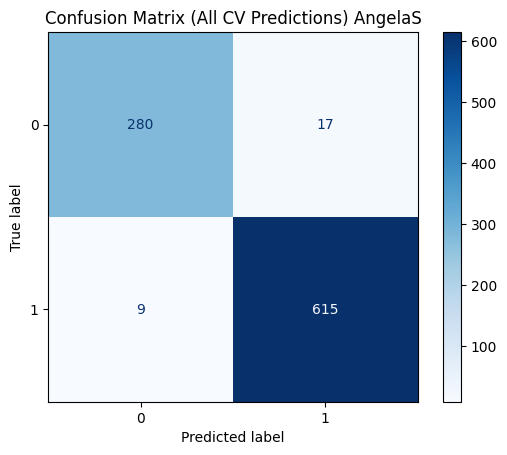

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.955          0.017        0.933       0.011    0.944   0.012
1           0.968          0.005        0.979       0.008    0.974   0.005


       Accuracy  F1 Macro
score  0.939177  0.929229


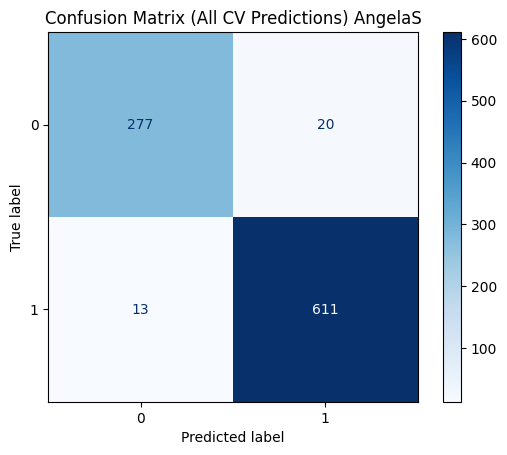

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.809093       0.095508          4           162         110   

   subsample  verbosity  
0   0.854564         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.975          0.018        0.939       0.017    0.957   0.016
1           0.972          0.008        0.989       0.008    0.980   0.008


       Accuracy  F1 Macro
score  0.939183  0.928154


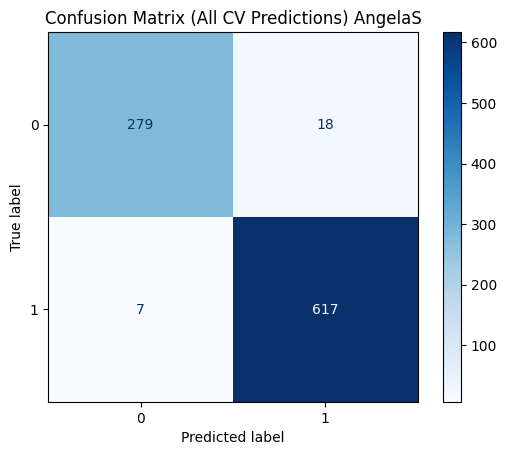

DamjanM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.836519       0.064944          4           326         115   

   subsample  verbosity  
0   0.988685         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.991          0.007        0.976       0.015    0.983   0.009
1           0.982          0.011        0.993       0.005    0.988   0.006


       Accuracy  F1 Macro
score    0.9439  0.942018


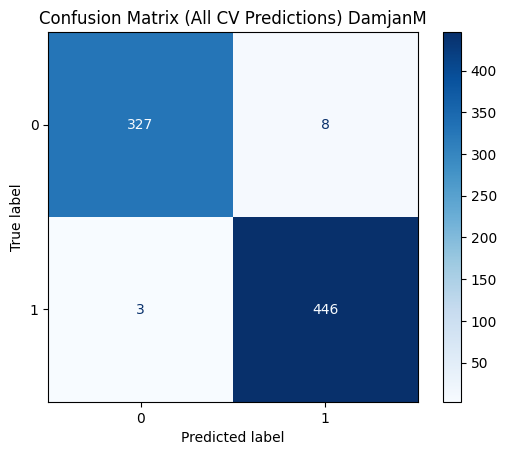

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.994          0.007        0.976       0.015    0.985   0.007
1           0.983          0.011        0.996       0.005    0.989   0.005


       Accuracy  F1 Macro
score    0.9439  0.941938


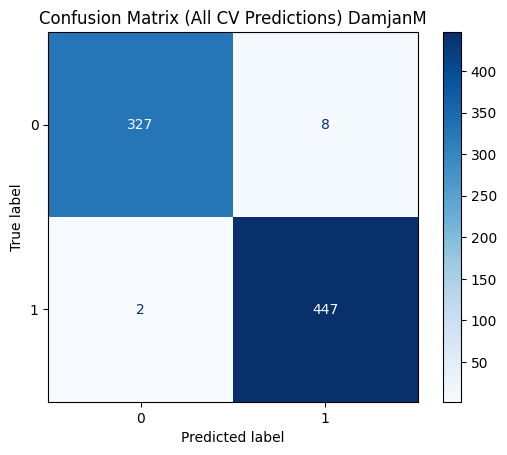

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.994          0.007        0.976       0.015    0.985   0.008
1           0.983          0.011        0.996       0.005    0.989   0.006


       Accuracy  F1 Macro
score  0.943908  0.941934


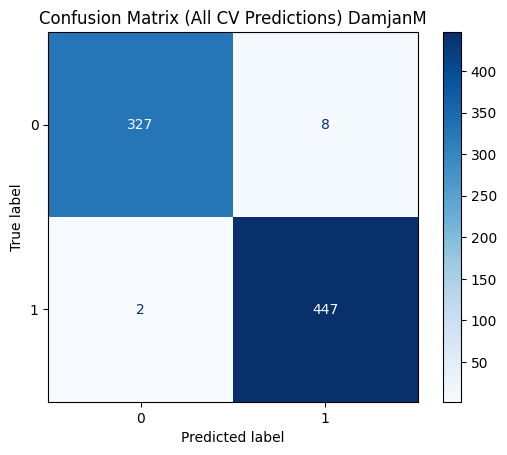

DavidA
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.971          0.022        0.988       0.015    0.979   0.007
1           0.991          0.012        0.975       0.019    0.983   0.006


       Accuracy  F1 Macro
score  0.938373  0.935965


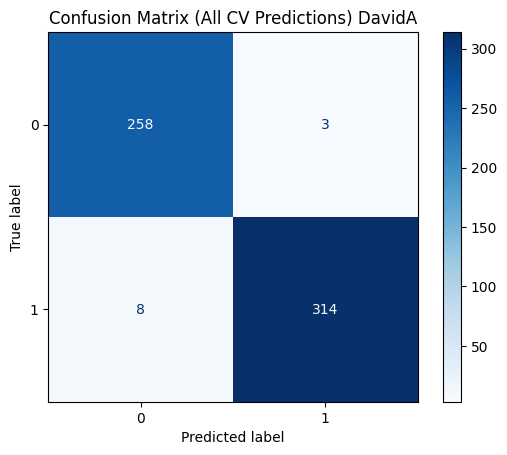

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.026        0.988       0.015    0.977   0.009
1           0.991          0.012        0.972       0.023    0.981   0.008


       Accuracy  F1 Macro
score  0.936664  0.933967


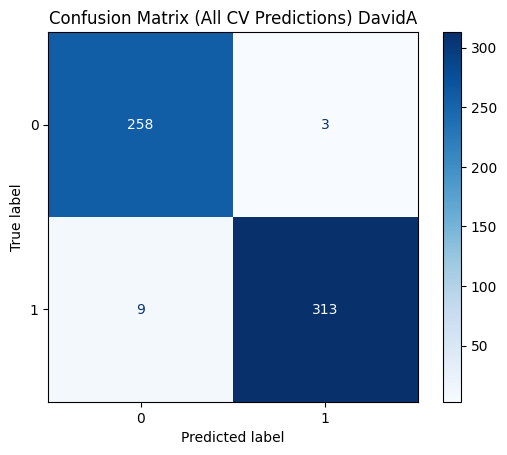

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.027        0.973       0.015    0.970   0.014
1           0.978          0.012        0.972       0.023    0.975   0.012


       Accuracy  F1 Macro
score  0.933215  0.930133


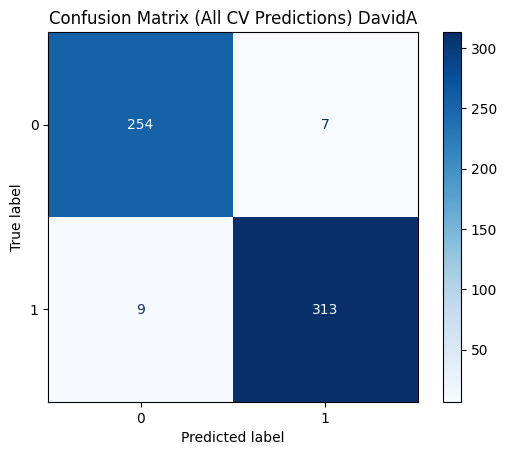

EmilijaM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849319        0.07618          8           161         102   

   subsample  verbosity  
0   0.866369         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.973          0.024        0.965       0.023    0.969   0.013
1           0.971          0.018        0.977       0.022    0.973   0.011


       Accuracy  F1 Macro
score  0.918351  0.916255


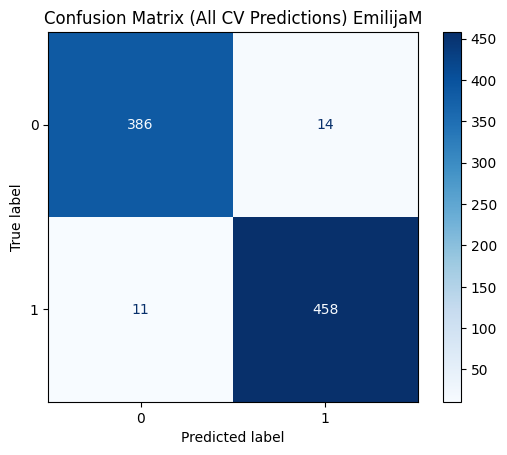

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.860355       0.021282          9           393          16   

   subsample  verbosity  
0    0.67273         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.971          0.023        0.967       0.015    0.969   0.011
1           0.973          0.012        0.974       0.021    0.973   0.010


       Accuracy  F1 Macro
score  0.916052  0.913632


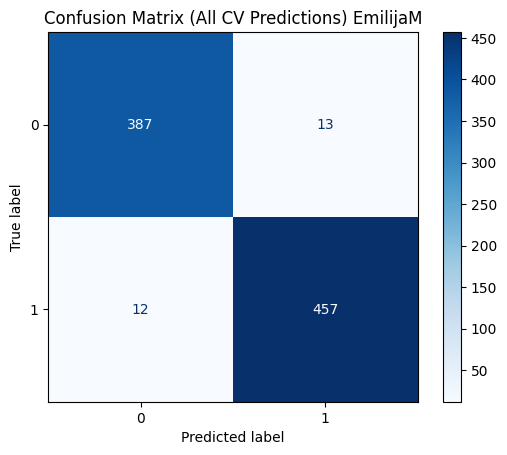

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.662398       0.021617          9           472         114   

   subsample  verbosity  
0   0.657147         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.968          0.023        0.967       0.020    0.968   0.012
1           0.973          0.017        0.972       0.021    0.972   0.010


       Accuracy  F1 Macro
score  0.914896   0.91265


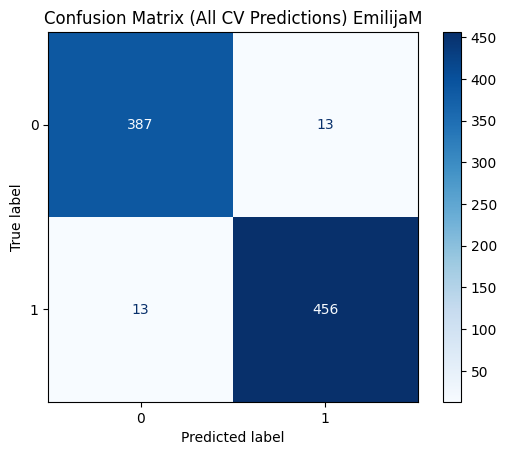

FilipP
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.968          0.034        0.936       0.020    0.951   0.022
1           0.950          0.016        0.974       0.028    0.961   0.019


       Accuracy  F1 Macro
score  0.933864   0.93277


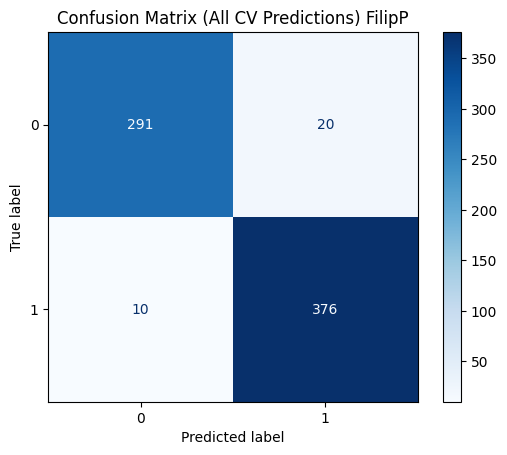

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.968          0.032        0.926       0.013    0.946   0.016
1           0.942          0.009        0.974       0.027    0.958   0.014


       Accuracy  F1 Macro
score   0.92667  0.925453


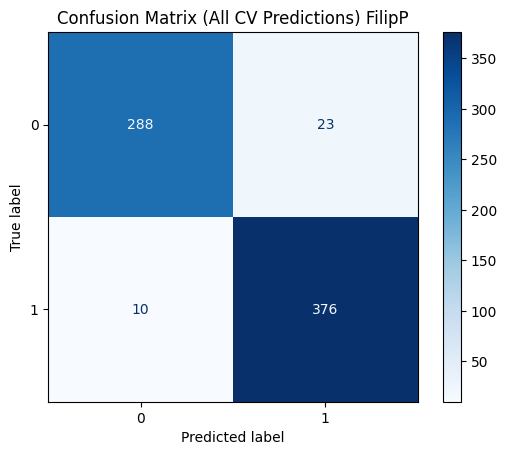

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.974          0.029        0.942       0.026    0.958   0.023
1           0.955          0.020        0.979       0.024    0.967   0.019


       Accuracy  F1 Macro
score   0.92667  0.925453


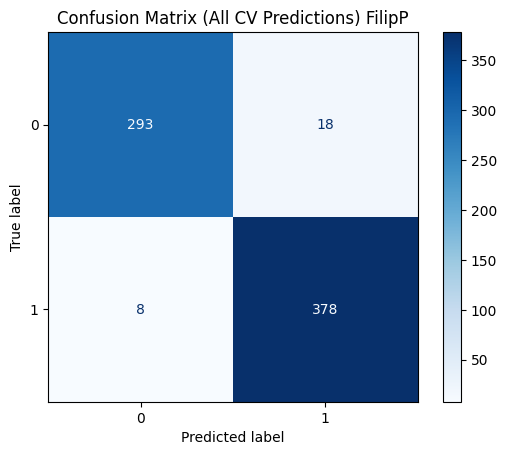

IlijaM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.989          0.014        0.965       0.019    0.977   0.014
1           0.982          0.010        0.995       0.007    0.988   0.007


       Accuracy  F1 Macro
score  0.960947  0.956454


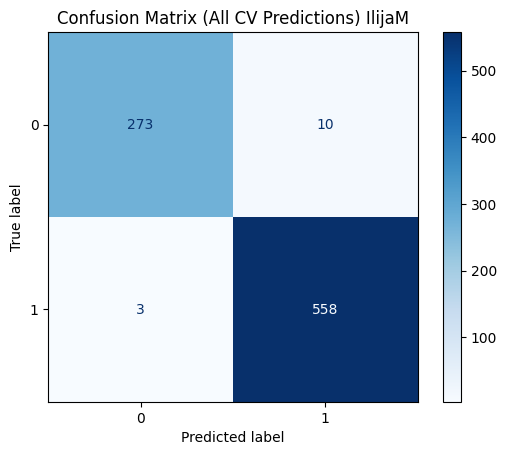

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.873693        0.09803          8           363          61   

   subsample  verbosity  
0   0.669346         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.989          0.014        0.965       0.019    0.977   0.014
1           0.982          0.010        0.995       0.007    0.988   0.007


       Accuracy  F1 Macro
score   0.95858  0.953665


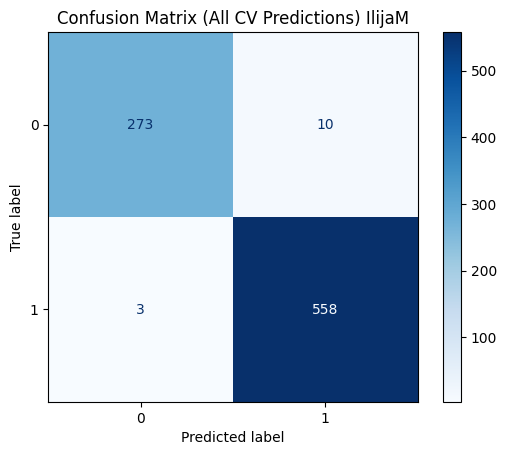

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.993          0.014        0.965       0.019    0.979   0.014
1           0.983          0.010        0.996       0.007    0.989   0.007


       Accuracy  F1 Macro
score  0.957396  0.952474


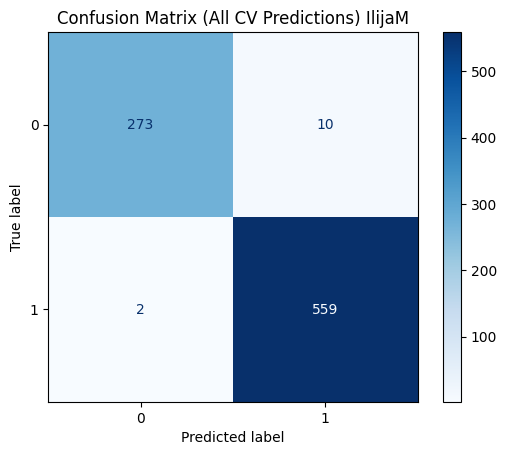

JakovGj
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.030        0.929       0.016    0.947   0.011
1           0.943          0.011        0.972       0.025    0.957   0.010


       Accuracy  F1 Macro
score  0.882692  0.878678


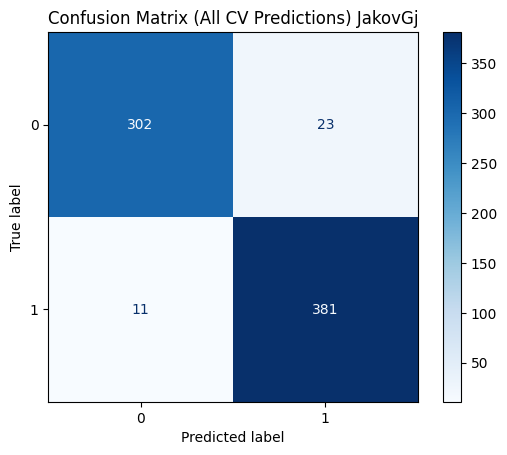

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.036        0.877       0.032    0.911   0.020
1           0.905          0.023        0.959       0.029    0.931   0.017


       Accuracy  F1 Macro
score  0.879915  0.876765


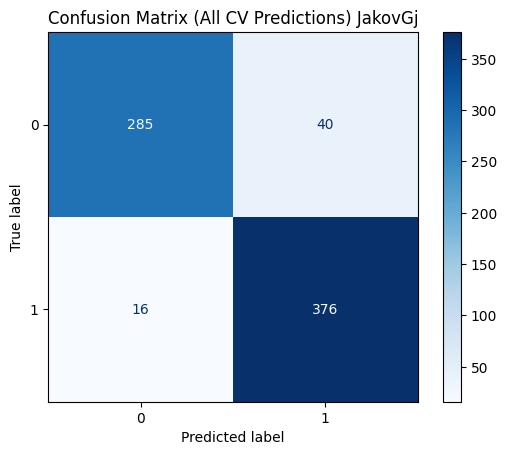

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.80991       0.089972          4           463          69   

   subsample  verbosity  
0   0.993292         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.021        0.938       0.019    0.953   0.009
1           0.951          0.015        0.974       0.018    0.962   0.007


       Accuracy  F1 Macro
score  0.877137  0.873043


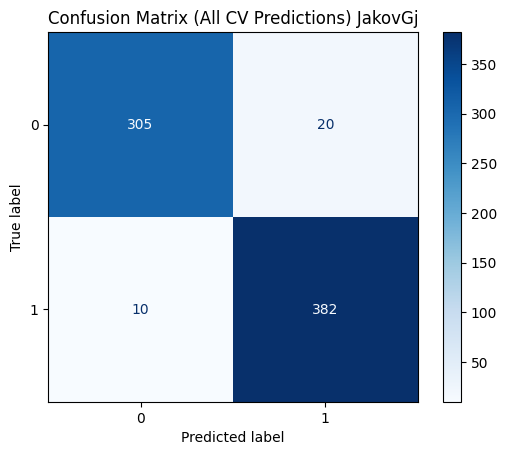

JanaGj
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962          0.027        0.916       0.025    0.938   0.019
1           0.964          0.010        0.984       0.011    0.974   0.008


       Accuracy  F1 Macro
score  0.931887   0.90793


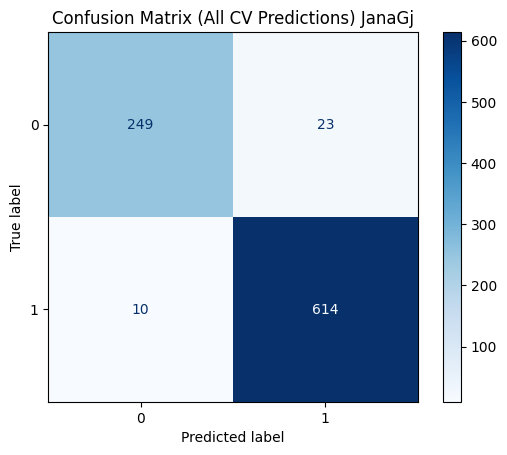

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.959          0.027        0.927       0.020    0.942   0.018
1           0.968          0.008        0.982       0.012    0.975   0.008


       Accuracy  F1 Macro
score  0.930782  0.906588


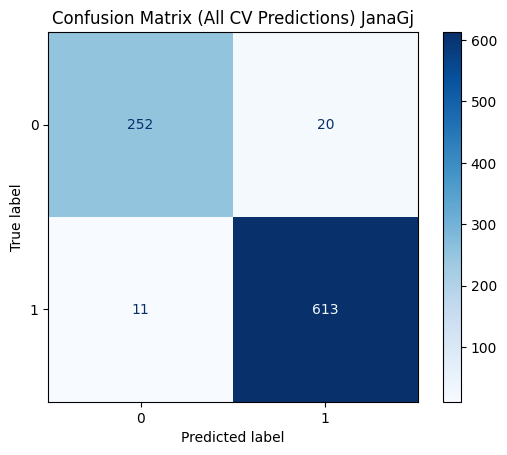

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.032        0.901       0.042    0.928   0.026
1           0.958          0.017        0.982       0.014    0.970   0.010


       Accuracy  F1 Macro
score  0.929652  0.906438


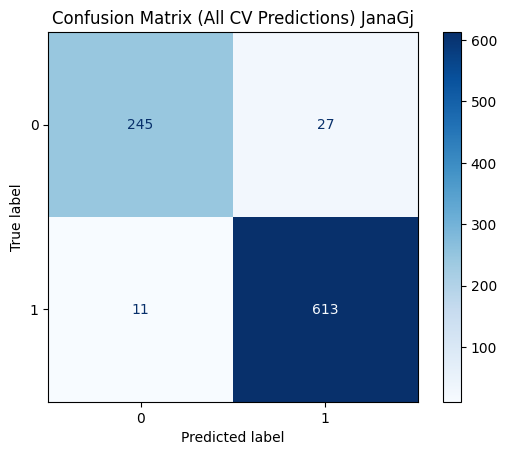

JanaH
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.985          0.014        0.862       0.036    0.919   0.021
1           0.928          0.018        0.992       0.007    0.959   0.010


       Accuracy  F1 Macro
score  0.879102  0.836377


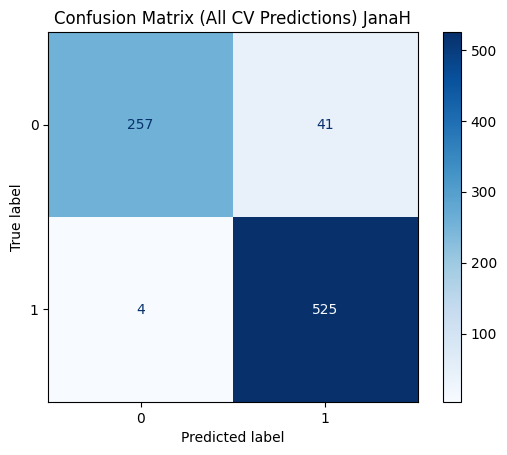

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.644021       0.055587         10           215          91   

   subsample  verbosity  
0   0.944292         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.974          0.027        0.856       0.058    0.910   0.033
1           0.925          0.029        0.987       0.014    0.954   0.015


       Accuracy  F1 Macro
score  0.875495  0.832636


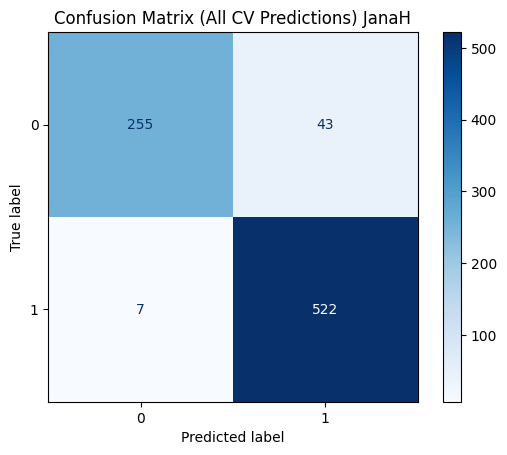

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.975          0.027        0.866       0.042    0.916   0.023
1           0.929          0.020        0.987       0.014    0.957   0.011


       Accuracy  F1 Macro
score  0.873092  0.832143


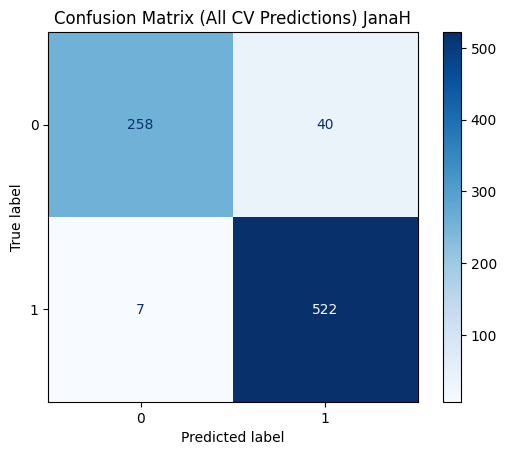

JovanaA
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.030        0.872       0.017    0.913   0.015
1           0.947          0.006        0.983       0.013    0.965   0.006


       Accuracy  F1 Macro
score  0.870774  0.831094


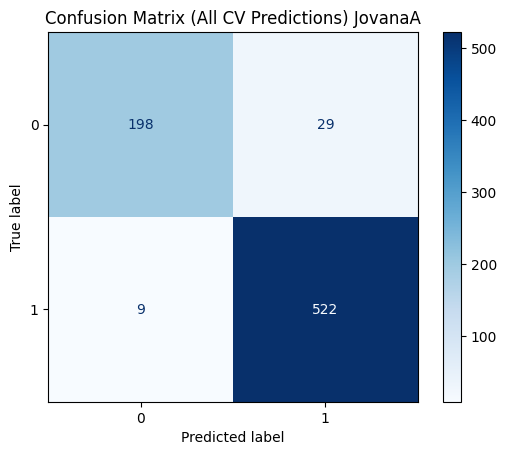

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849319        0.07618          8           161         102   

   subsample  verbosity  
0   0.866369         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.028        0.881       0.018    0.917   0.018
1           0.951          0.007        0.983       0.011    0.967   0.008


       Accuracy  F1 Macro
score  0.869432  0.830276


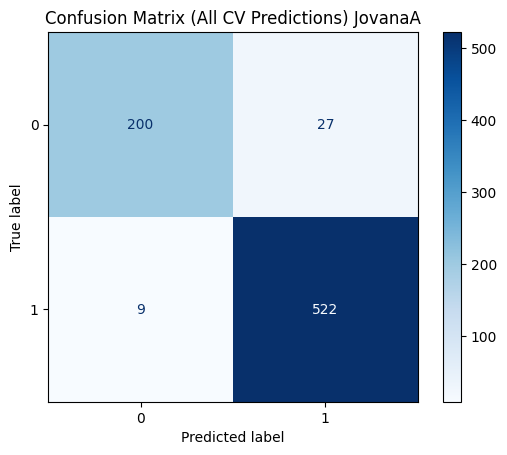

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849742       0.069127          6           233          42   

   subsample  verbosity  
0   0.921469         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958           0.03        0.886       0.026    0.920   0.020
1           0.953           0.01        0.983       0.013    0.968   0.008


       Accuracy  F1 Macro
score  0.870774  0.829633


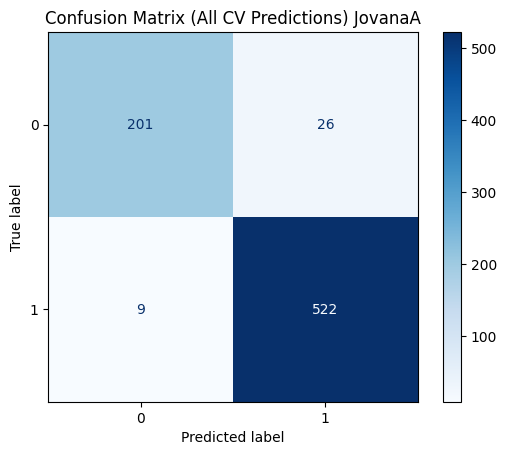

KristijanM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.976       0.015    0.982   0.004
1           0.991          0.006        0.995       0.004    0.993   0.002


       Accuracy  F1 Macro
score  0.972881  0.963846


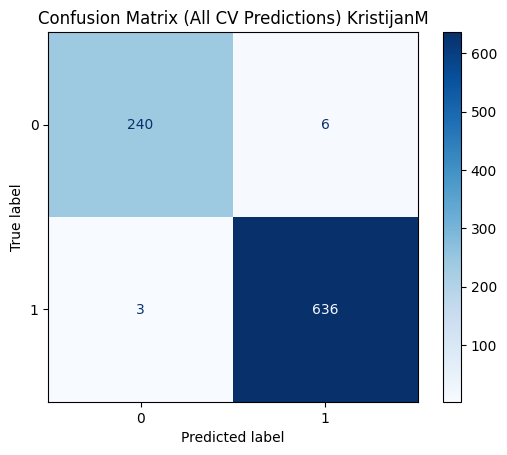

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.873693        0.09803          8           363          61   

   subsample  verbosity  
0   0.669346         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.976       0.015    0.984   0.008
1           0.991          0.006        0.997       0.004    0.994   0.003


       Accuracy  F1 Macro
score  0.959322   0.94083


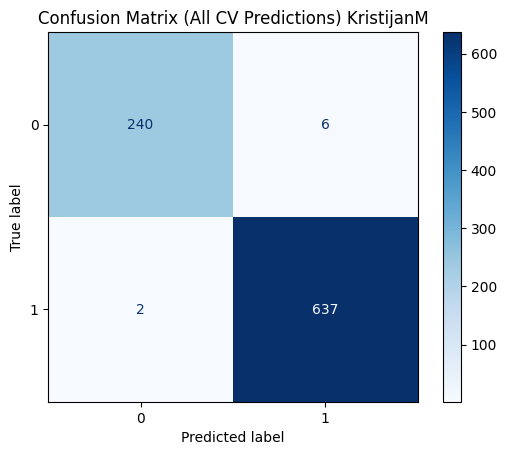

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.939566       0.154346          8           354          28   

   subsample  verbosity  
0   0.797518         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.976       0.015    0.984   0.008
1           0.991          0.006        0.997       0.004    0.994   0.003


       Accuracy  F1 Macro
score  0.958192  0.938642


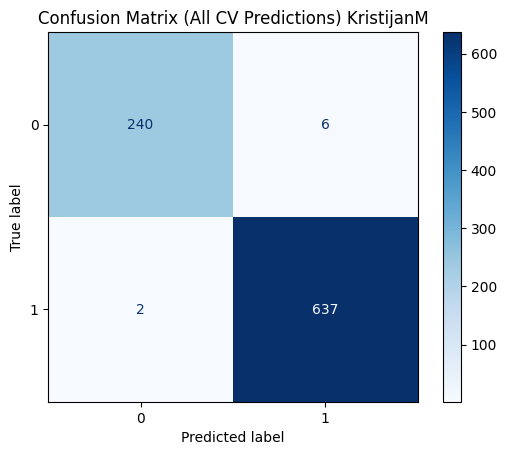

KristinaK
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.674628       0.188512          8           447         103   

   subsample  verbosity  
0   0.727201         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.992       0.010    0.990   0.007
1           0.994          0.008        0.991       0.008    0.992   0.005


       Accuracy  F1 Macro
score  0.978571  0.977769


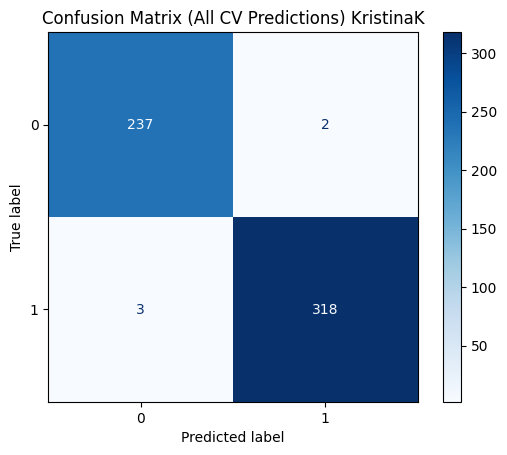

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.662398       0.021617          9           472         114   

   subsample  verbosity  
0   0.657147         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.992       0.010    0.990   0.007
1           0.994          0.008        0.991       0.008    0.992   0.005


       Accuracy  F1 Macro
score  0.976786  0.975828


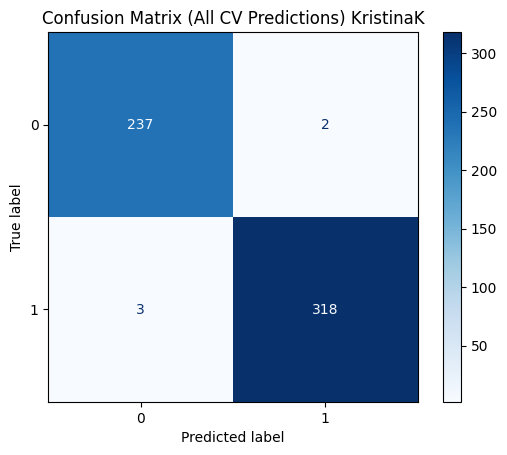

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.992       0.010    0.990   0.007
1           0.994          0.008        0.991       0.008    0.992   0.005


       Accuracy  F1 Macro
score  0.976786  0.975828


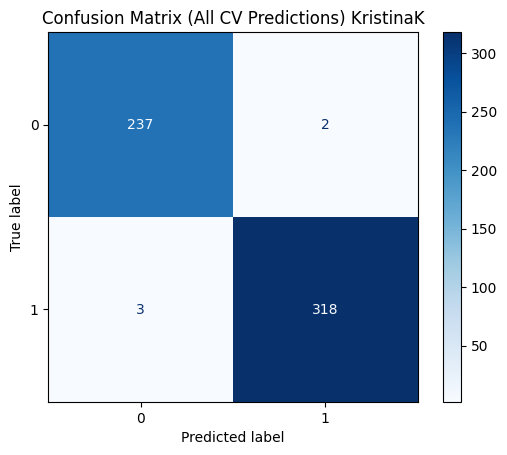

MajaN
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.962          0.018        0.940       0.055    0.950   0.027
1           0.951          0.044        0.967       0.018    0.958   0.020


       Accuracy  F1 Macro
score  0.924453  0.922057


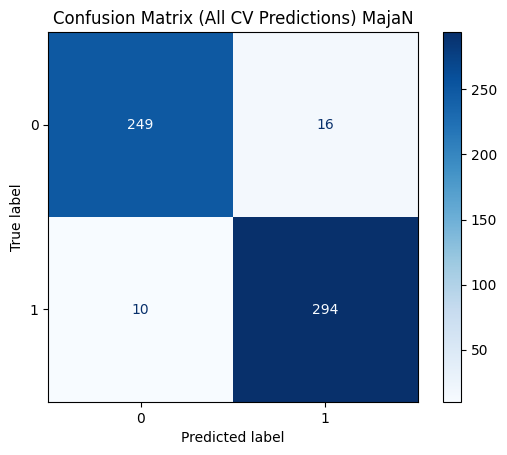

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.020        0.955       0.039    0.960   0.018
1           0.962          0.032        0.970       0.019    0.966   0.015


       Accuracy  F1 Macro
score  0.922729  0.917518


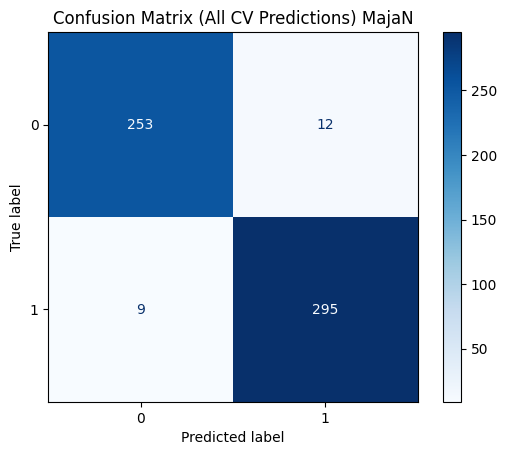

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.024        0.947       0.047    0.956   0.022
1           0.957          0.038        0.970       0.022    0.963   0.018


       Accuracy  F1 Macro
score   0.91919  0.916047


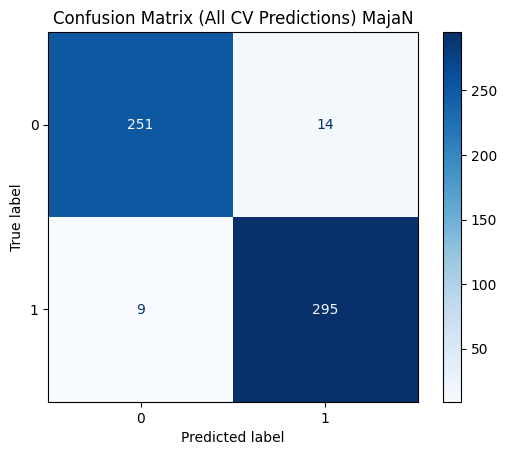

MaksimP
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.014        0.966       0.050    0.975   0.029
1           0.976          0.035        0.989       0.011    0.982   0.020


       Accuracy  F1 Macro
score  0.903492  0.892557


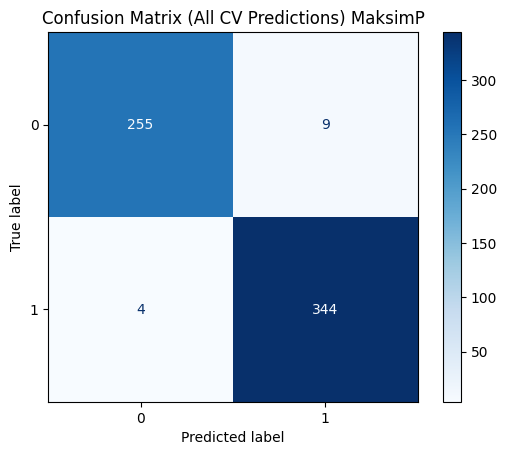

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.809093       0.095508          4           162         110   

   subsample  verbosity  
0   0.854564         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.014        0.955       0.044    0.969   0.026
1           0.967          0.030        0.989       0.011    0.978   0.017


       Accuracy  F1 Macro
score    0.9002  0.889987


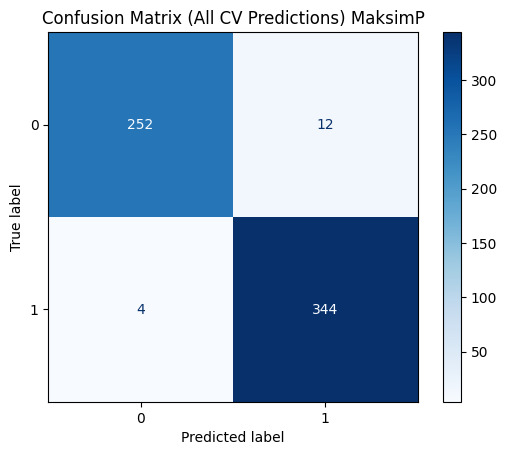

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.873693        0.09803          8           363          61   

   subsample  verbosity  
0   0.669346         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.014        0.955       0.044    0.969   0.026
1           0.967          0.030        0.989       0.011    0.978   0.017


       Accuracy  F1 Macro
score  0.900213  0.889248


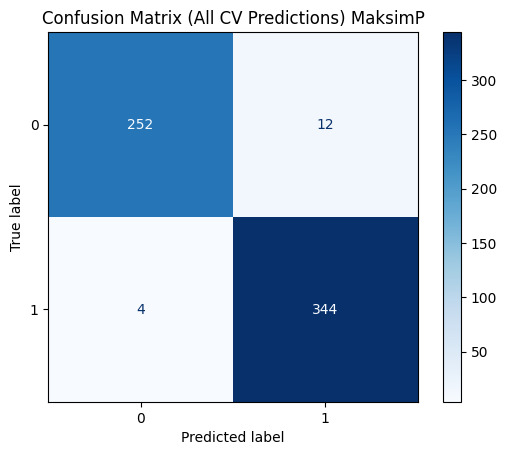

MarinoJ
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.786705       0.181988          8           120          87   

   subsample  verbosity  
0   0.626021         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.995          0.009        0.977       0.025    0.986   0.014
1           0.988          0.013        0.998       0.005    0.993   0.007


       Accuracy  F1 Macro
score  0.958031  0.949844


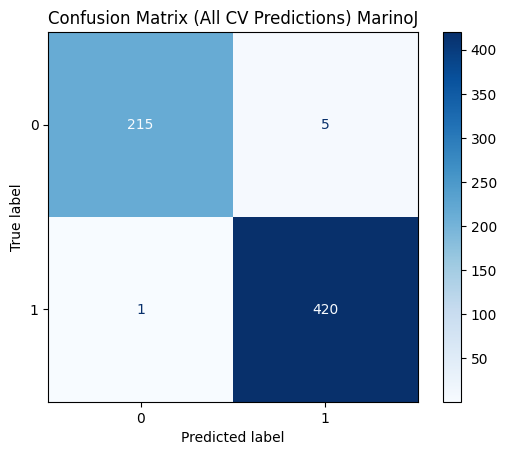

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.995          0.009        0.982       0.017    0.989   0.010
1           0.991          0.009        0.998       0.005    0.994   0.005


       Accuracy  F1 Macro
score  0.958055  0.949159


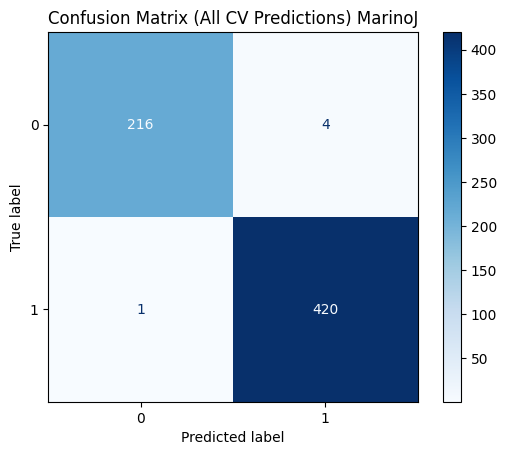

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.681224       0.198571          8           286         100   

   subsample  verbosity  
0   0.952187         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.995          0.009        0.977       0.025    0.986   0.014
1           0.988          0.013        0.998       0.005    0.993   0.007


       Accuracy  F1 Macro
score  0.956468  0.948028


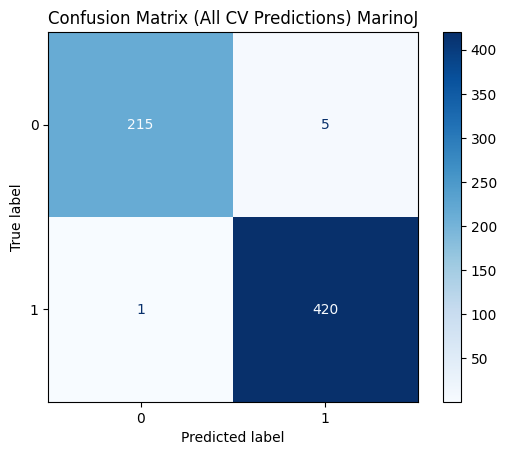

MartinaM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.662398       0.021617          9           472         114   

   subsample  verbosity  
0   0.657147         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.973          0.015        0.924       0.034    0.947   0.014
1           0.952          0.021        0.983       0.010    0.967   0.008


       Accuracy  F1 Macro
score  0.897913  0.888117


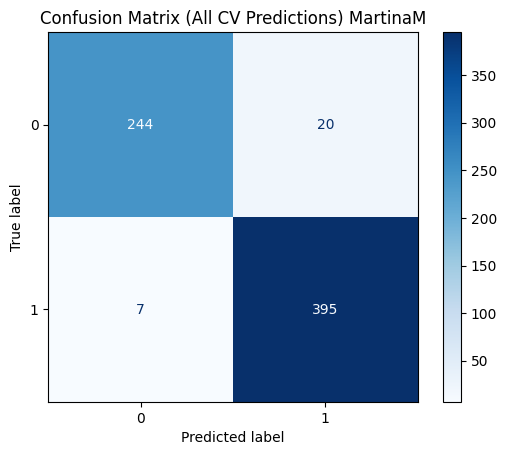

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.80991       0.089972          4           463          69   

   subsample  verbosity  
0   0.993292         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.981          0.012        0.928       0.036    0.953   0.015
1           0.955          0.022        0.988       0.008    0.971   0.009


       Accuracy  F1 Macro
score  0.897901   0.88708


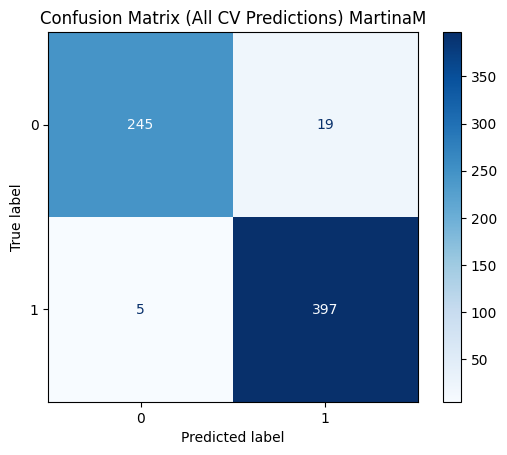

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.755471        0.06427          6           379          40   

   subsample  verbosity  
0   0.986102         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.977          0.014        0.932       0.033    0.953   0.016
1           0.957          0.020        0.985       0.009    0.971   0.010


       Accuracy  F1 Macro
score   0.89789  0.886909


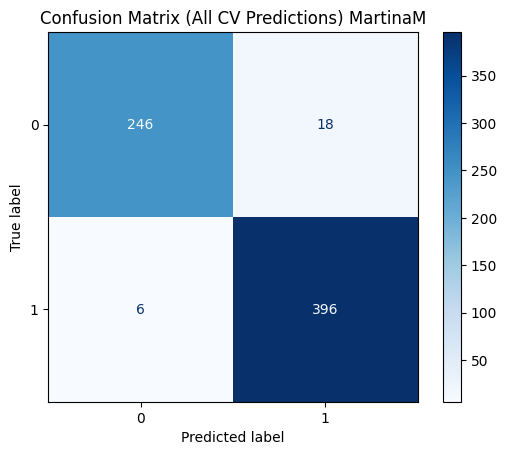

MatejG
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.809093       0.095508          4           162         110   

   subsample  verbosity  
0   0.854564         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.008        0.975       0.025    0.961   0.012
1           0.921          0.069        0.834       0.030    0.873   0.032


       Accuracy  F1 Macro
score   0.88092  0.826046


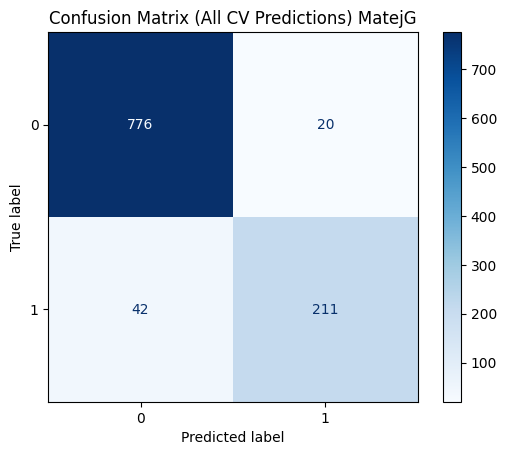

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.681224       0.198571          8           286         100   

   subsample  verbosity  
0   0.952187         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.945          0.014        0.976       0.021    0.960   0.013
1           0.920          0.061        0.822       0.046    0.867   0.041


       Accuracy  F1 Macro
score  0.879968  0.824736


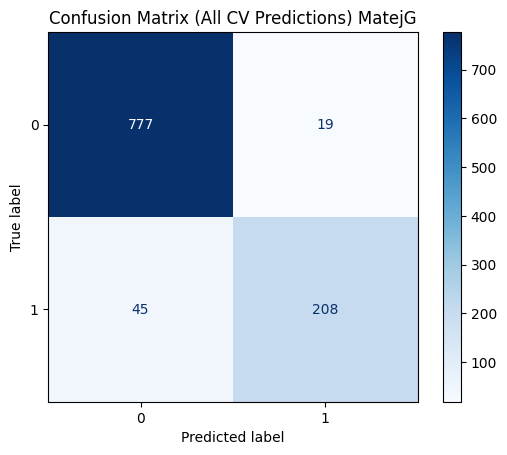

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.873693        0.09803          8           363          61   

   subsample  verbosity  
0   0.669346         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.944          0.013        0.980       0.022    0.962   0.016
1           0.932          0.070        0.818       0.041    0.871   0.050


       Accuracy  F1 Macro
score   0.87902  0.824475


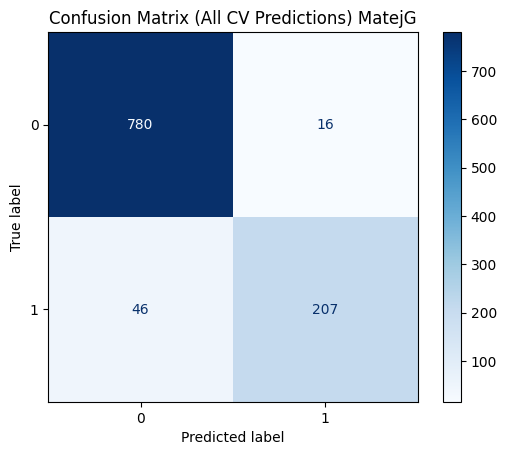

MiaD
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.988       0.016    0.992   0.012
1           0.992          0.011        0.997       0.006    0.994   0.008


       Accuracy  F1 Macro
score  0.993375  0.993116


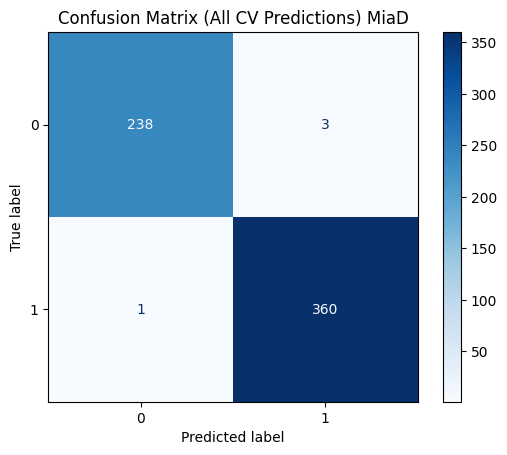

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.662398       0.021617          9           472         114   

   subsample  verbosity  
0   0.657147         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.988       0.016    0.994   0.008
1           0.992          0.011        1.000       0.000    0.996   0.005


       Accuracy  F1 Macro
score  0.993375  0.993116


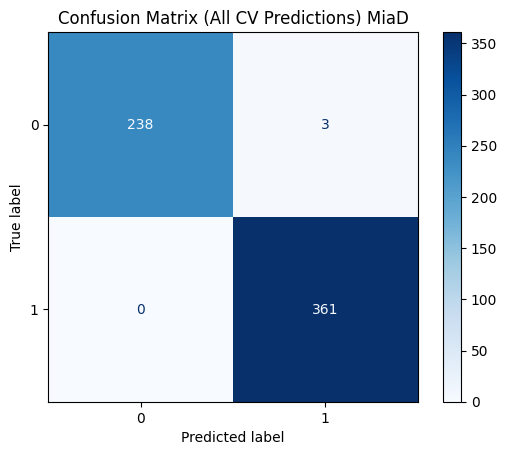

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.988       0.016    0.994   0.008
1           0.992          0.011        1.000       0.000    0.996   0.005


       Accuracy  F1 Macro
score  0.993375  0.993116


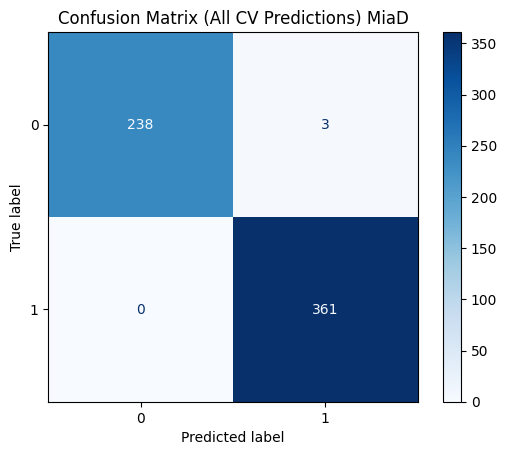

MilaP
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849319        0.07618          8           161         102   

   subsample  verbosity  
0   0.866369         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.977          0.021        0.874       0.056    0.922   0.034
1           0.950          0.021        0.992       0.008    0.970   0.012


       Accuracy  F1 Macro
score  0.869438  0.814926


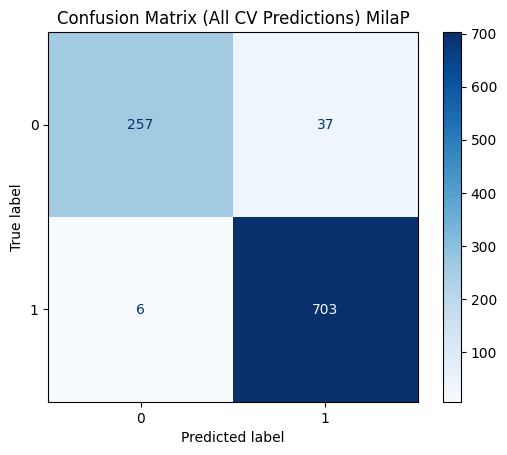

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.015        0.881       0.045    0.931   0.029
1           0.953          0.017        0.996       0.006    0.974   0.010


       Accuracy  F1 Macro
score  0.866438  0.813791


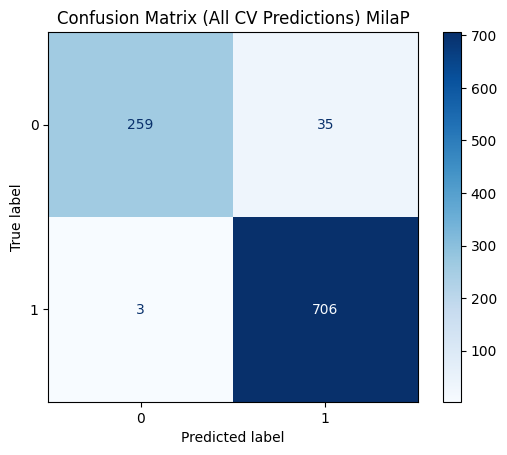

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.644021       0.055587         10           215          91   

   subsample  verbosity  
0   0.944292         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.985          0.021        0.874       0.052    0.925   0.032
1           0.951          0.020        0.994       0.008    0.972   0.011


       Accuracy  F1 Macro
score  0.869438  0.813525


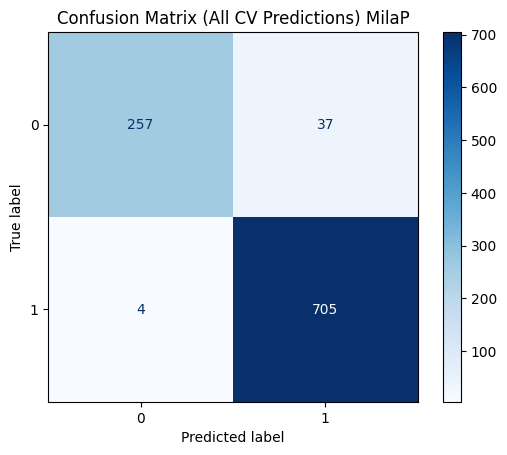

NatalijaG
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.945          0.025        0.875       0.033    0.909   0.028
1           0.926          0.018        0.969       0.014    0.947   0.015


       Accuracy  F1 Macro
score  0.881187  0.869335


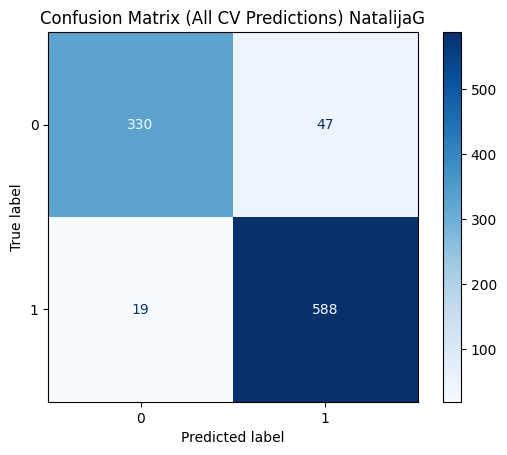

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.947          0.027        0.886       0.021    0.915   0.022
1           0.932          0.013        0.969       0.016    0.950   0.013


       Accuracy  F1 Macro
score  0.875096  0.863101


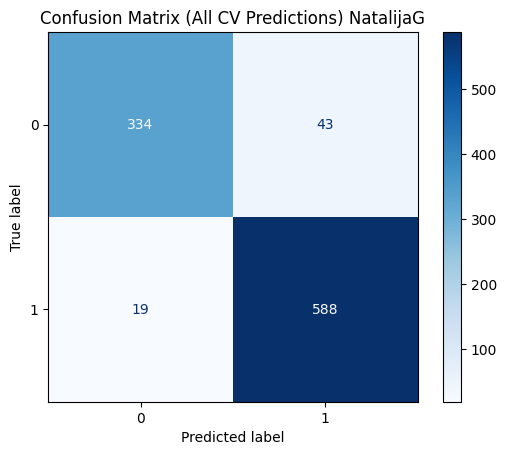

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.017        0.886       0.036    0.921   0.025
1           0.933          0.020        0.977       0.010    0.954   0.013


       Accuracy  F1 Macro
score  0.876111  0.863049


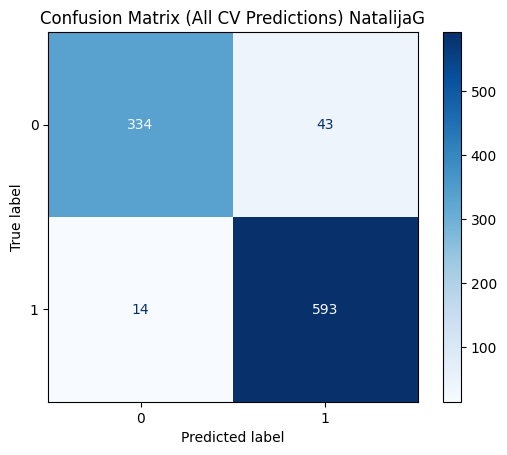

OgnenS
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.980          0.013        0.955       0.028    0.967   0.018
1           0.974          0.016        0.989       0.007    0.981   0.010


       Accuracy  F1 Macro
score  0.936712  0.928478


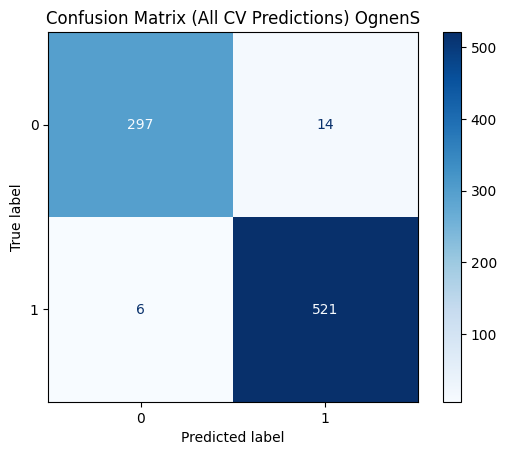

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.939566       0.154346          8           354          28   

   subsample  verbosity  
0   0.797518         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.980          0.012        0.958       0.022    0.969   0.014
1           0.976          0.012        0.989       0.007    0.982   0.008


       Accuracy  F1 Macro
score  0.935522  0.926846


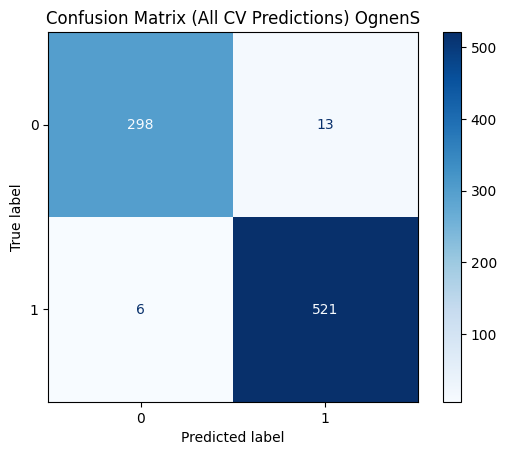

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.725742       0.111714          6           330         123   

   subsample  verbosity  
0   0.815936         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.977          0.013        0.958       0.028    0.967   0.018
1           0.976          0.016        0.987       0.008    0.981   0.010


       Accuracy  F1 Macro
score  0.933148   0.92352


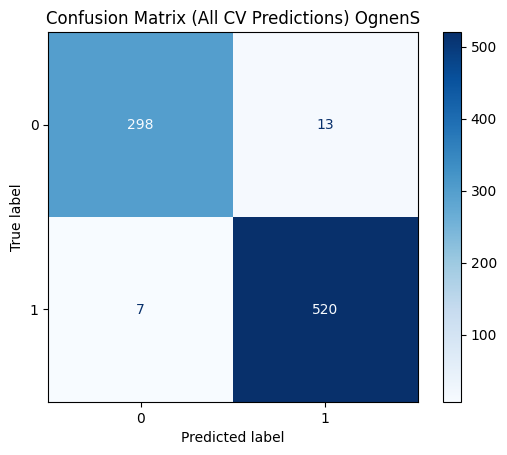

PetarA
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.934          0.038        0.942       0.033    0.938   0.033
1           0.951          0.027        0.943       0.033    0.947   0.029


       Accuracy  F1 Macro
score  0.916278  0.915644


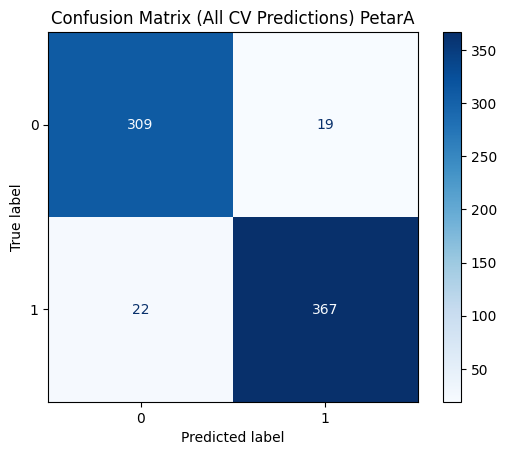

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.662398       0.021617          9           472         114   

   subsample  verbosity  
0   0.657147         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.946          0.031        0.954       0.034    0.950   0.030
1           0.961          0.028        0.954       0.026    0.957   0.025


       Accuracy  F1 Macro
score  0.916288  0.915489


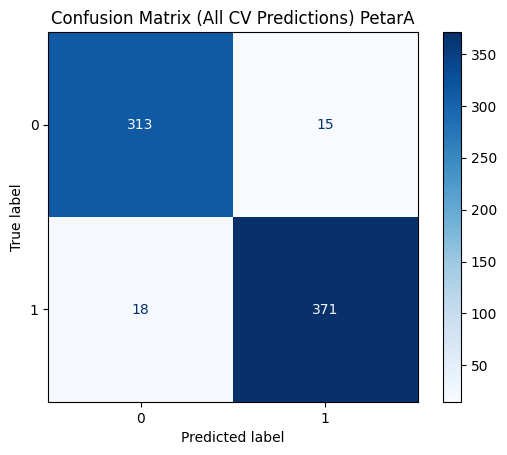

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.942          0.034        0.942       0.031    0.942   0.030
1           0.951          0.026        0.951       0.030    0.951   0.026


       Accuracy  F1 Macro
score  0.916278   0.91518


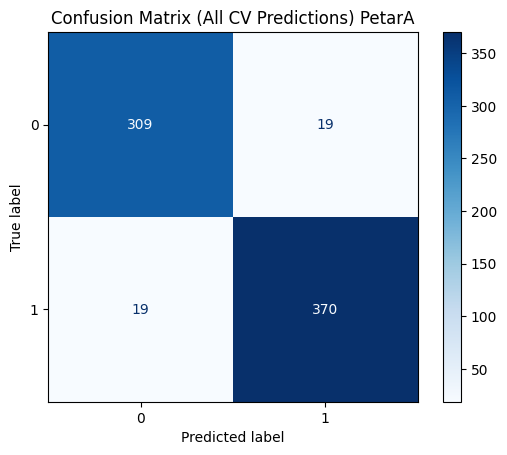

PetarK
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.809093       0.095508          4           162         110   

   subsample  verbosity  
0   0.854564         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.016        0.974       0.006    0.972   0.009
1           0.897          0.022        0.879       0.064    0.887   0.037


       Accuracy  F1 Macro
score  0.884184   0.81882


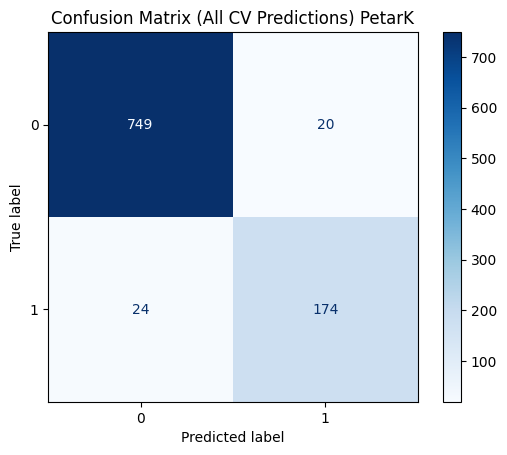

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.836519       0.064944          4           326         115   

   subsample  verbosity  
0   0.988685         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.968          0.017        0.974       0.004    0.971   0.008
1           0.897          0.013        0.874       0.068    0.884   0.035


       Accuracy  F1 Macro
score   0.88209  0.816656


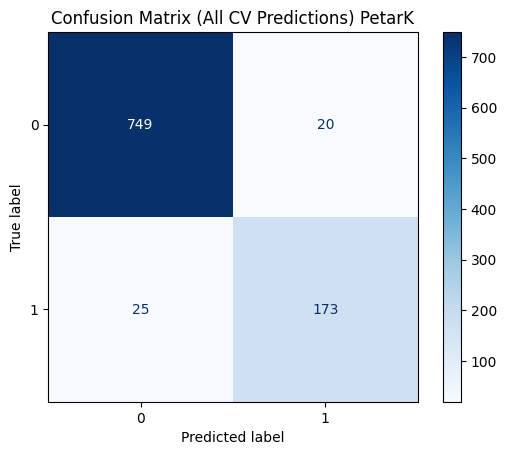

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.020        0.975       0.005     0.97   0.009
1           0.901          0.014        0.864       0.078     0.88   0.040


       Accuracy  F1 Macro
score  0.883131  0.816324


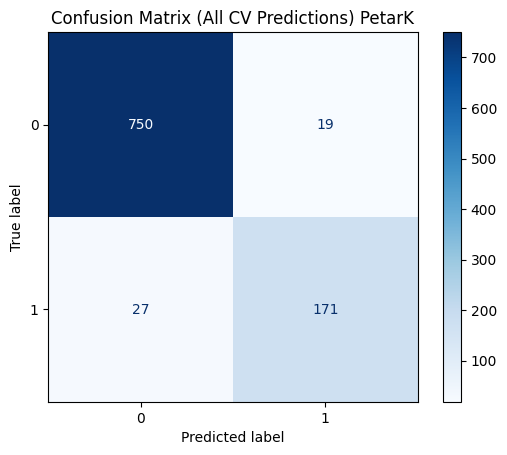

SaraI
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.836519       0.064944          4           326         115   

   subsample  verbosity  
0   0.988685         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.975          0.024        0.912       0.046    0.942   0.016
1           0.962          0.019        0.989       0.011    0.975   0.005


       Accuracy  F1 Macro
score  0.908191  0.870656


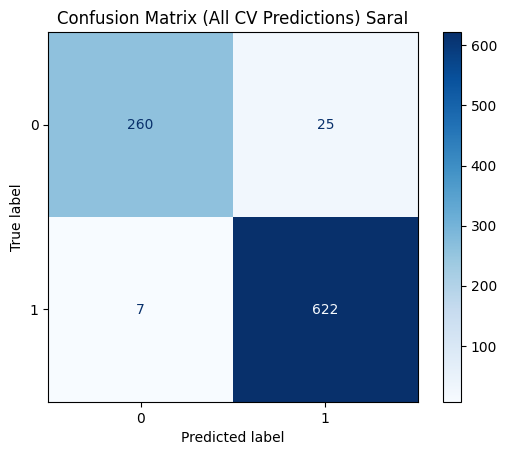

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.662398       0.021617          9           472         114   

   subsample  verbosity  
0   0.657147         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.978          0.021        0.905       0.031    0.940   0.010
1           0.959          0.012        0.990       0.009    0.974   0.004


       Accuracy  F1 Macro
score  0.907092  0.869163


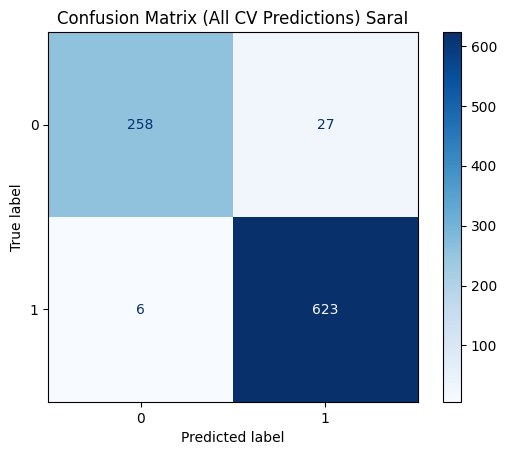

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.681224       0.198571          8           286         100   

   subsample  verbosity  
0   0.952187         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.982          0.016        0.923       0.026    0.951   0.008
1           0.966          0.011        0.992       0.007    0.979   0.003


       Accuracy  F1 Macro
score  0.907092  0.868956


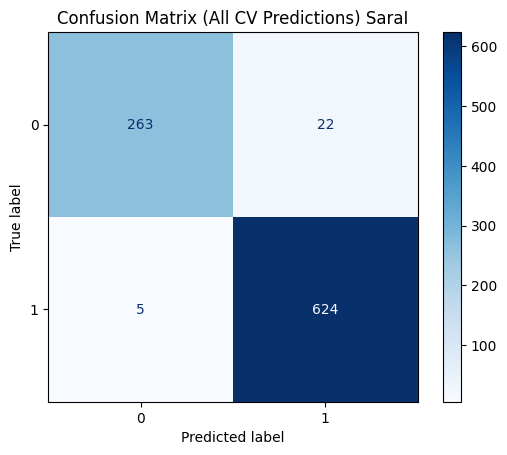

SaraM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.755471        0.06427          6           379          40   

   subsample  verbosity  
0   0.986102         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.983          0.016        0.920       0.055    0.949   0.033
1           0.949          0.033        0.989       0.010    0.969   0.019


       Accuracy  F1 Macro
score  0.876554  0.835386


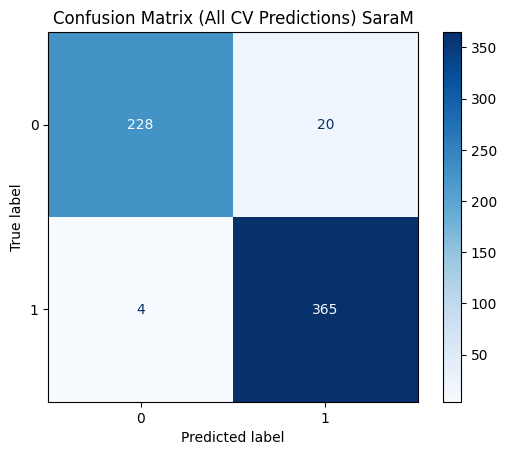

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.979          0.018        0.904       0.054    0.939   0.026
1           0.939          0.031        0.986       0.012    0.962   0.014


       Accuracy  F1 Macro
score  0.870089  0.834539


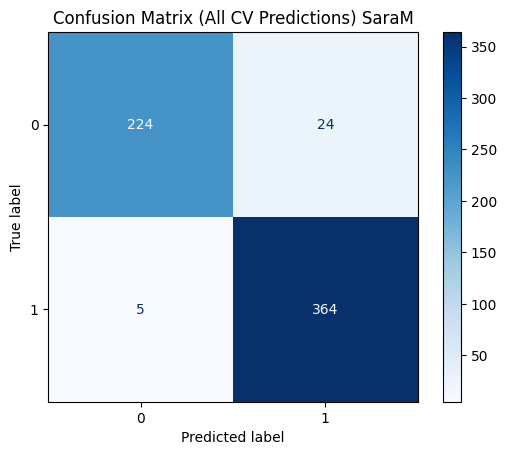

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.983          0.016        0.916        0.06    0.947   0.037
1           0.947          0.035        0.989        0.01    0.967   0.021


       Accuracy  F1 Macro
score  0.873328  0.834411


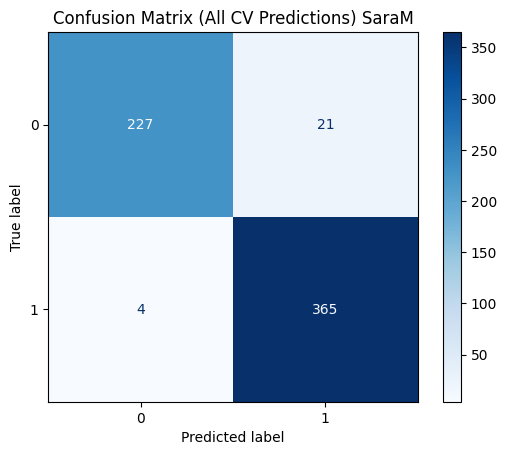

StefanS
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.955          0.023        0.886       0.027    0.919   0.023
1           0.940          0.014        0.977       0.012    0.958   0.012


       Accuracy  F1 Macro
score  0.881967  0.859735


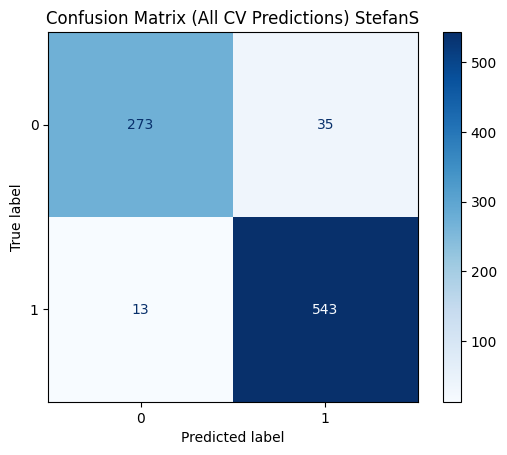

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.017        0.886       0.025    0.921   0.016
1           0.940          0.012        0.978       0.009    0.959   0.008


       Accuracy  F1 Macro
score   0.88196  0.858841


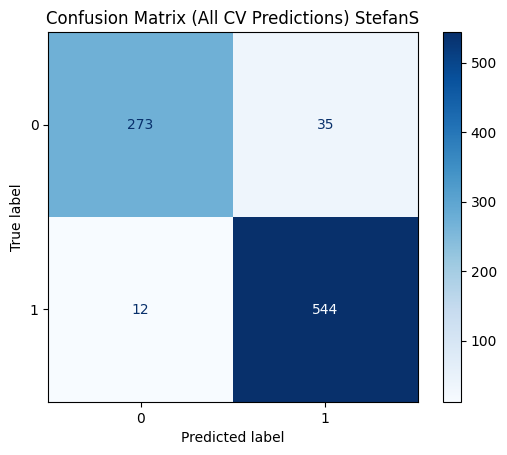

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.952          0.017        0.893       0.030    0.921   0.021
1           0.943          0.015        0.975       0.009    0.958   0.011


       Accuracy  F1 Macro
score  0.878485  0.855484


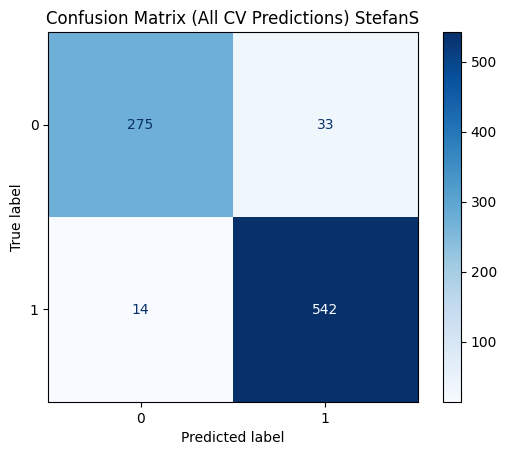

StevceK
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.918          0.026        0.912       0.025    0.914   0.015
1           0.843          0.035        0.850       0.053    0.845   0.030


       Accuracy  F1 Macro
score  0.769467   0.74849


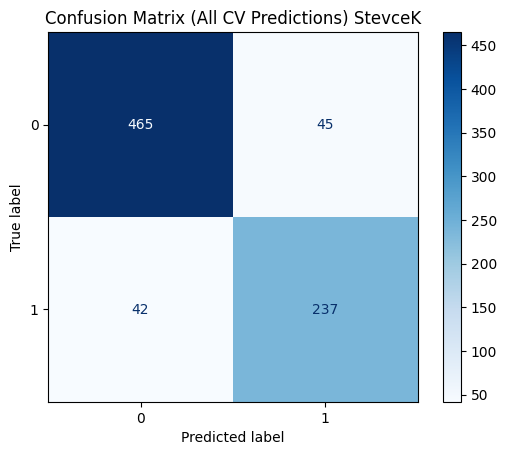

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.809093       0.095508          4           162         110   

   subsample  verbosity  
0   0.854564         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.017        0.937       0.027    0.940   0.015
1           0.889          0.044        0.896       0.034    0.892   0.025


       Accuracy  F1 Macro
score  0.759324  0.735221


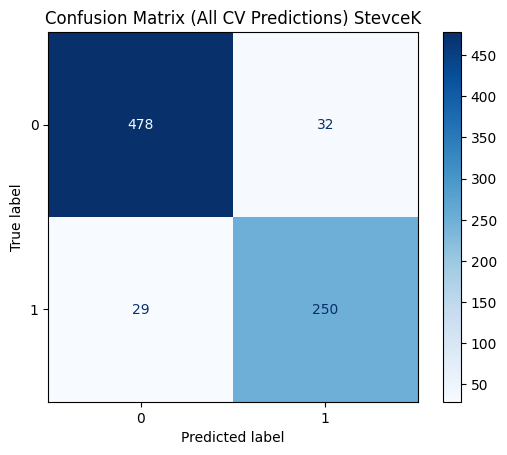

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.940           0.02        0.935       0.026    0.937   0.013
1           0.885           0.04        0.889       0.040    0.886   0.021


       Accuracy  F1 Macro
score  0.758059  0.734488


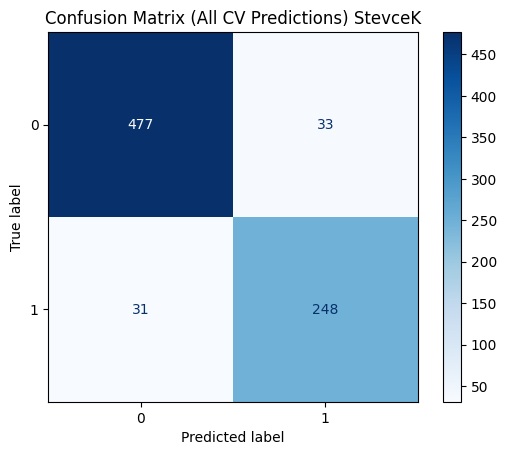

TamaraK
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.674628       0.188512          8           447         103   

   subsample  verbosity  
0   0.727201         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.980          0.001        0.949       0.036    0.964   0.019
1           0.979          0.015        0.992       0.000    0.985   0.008


       Accuracy  F1 Macro
score  0.887574  0.855058


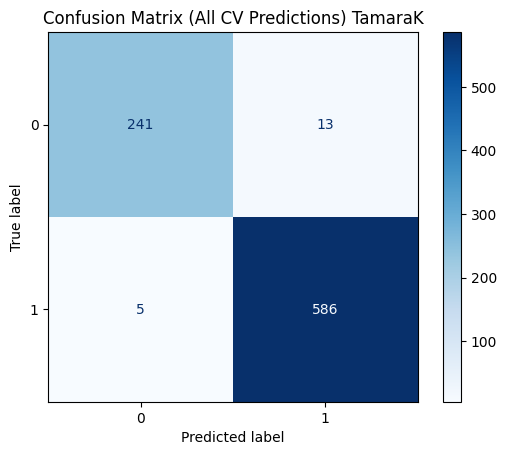

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.725742       0.111714          6           330         123   

   subsample  verbosity  
0   0.815936         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.976          0.008        0.945       0.029    0.960   0.015
1           0.977          0.012        0.990       0.003    0.983   0.006


       Accuracy  F1 Macro
score  0.887574  0.855008


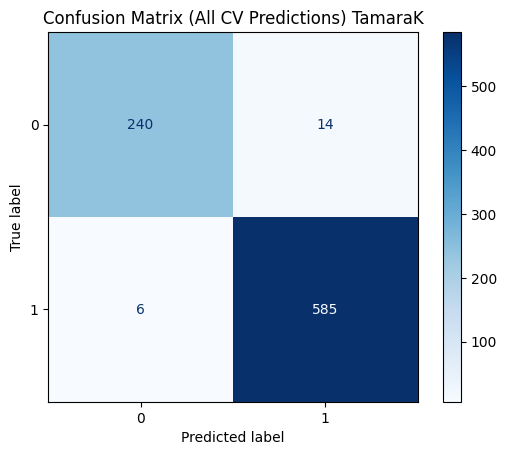

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.972          0.010        0.957       0.034    0.964   0.020
1           0.982          0.014        0.988       0.004    0.985   0.008


       Accuracy  F1 Macro
score  0.885207  0.852122


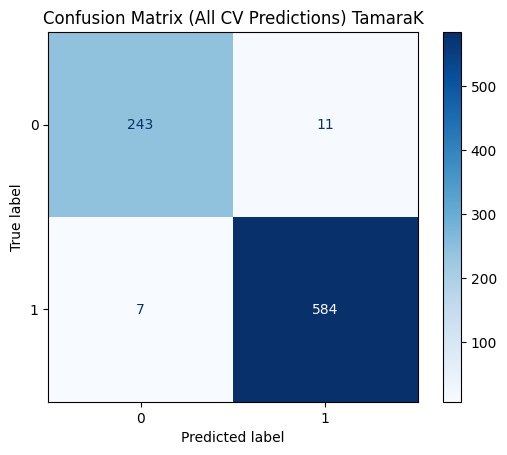

TomiN
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.973       0.022    0.986   0.011
1           0.985          0.013        1.000       0.000    0.992   0.006


       Accuracy  F1 Macro
score  0.968319  0.962399


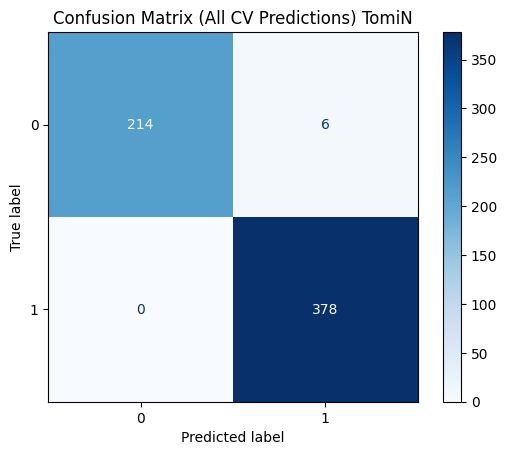

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.725742       0.111714          6           330         123   

   subsample  verbosity  
0   0.815936         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.977        0.02    0.988   0.010
1           0.987          0.011        1.000        0.00    0.993   0.006


       Accuracy  F1 Macro
score  0.968319  0.962399


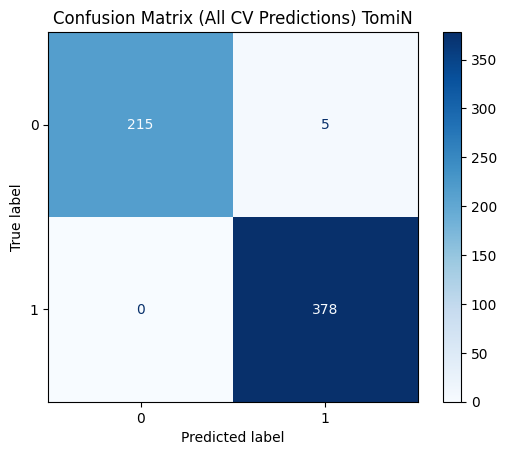

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           1.000          0.000        0.977        0.02    0.988   0.010
1           0.987          0.011        1.000        0.00    0.993   0.006


       Accuracy  F1 Macro
score  0.966639  0.960621


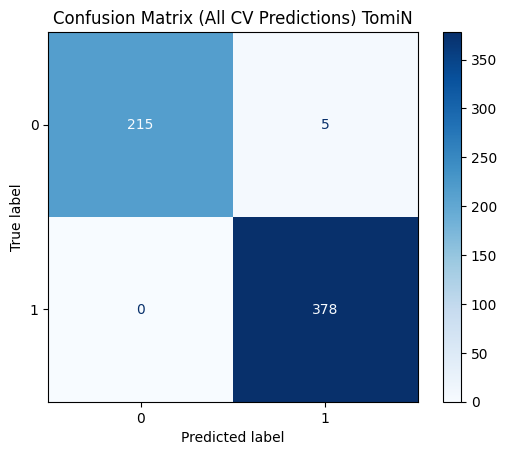

ViktorI
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.021        0.943       0.034    0.954   0.021
1           0.956          0.025        0.973       0.018    0.964   0.015


       Accuracy  F1 Macro
score  0.912072  0.910678


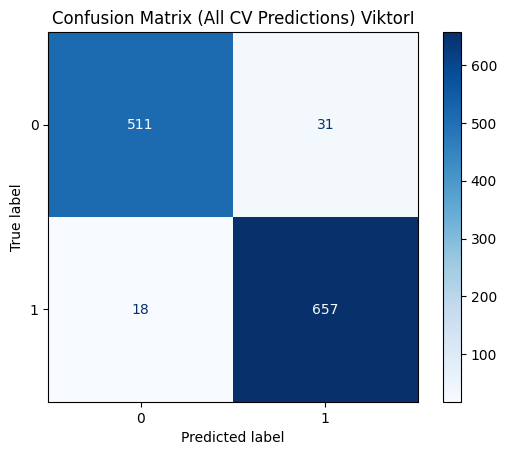

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849742       0.069127          6           233          42   

   subsample  verbosity  
0   0.921469         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.961          0.025        0.937       0.027    0.949   0.023
1           0.951          0.020        0.969       0.020    0.960   0.017


       Accuracy  F1 Macro
score  0.912083  0.910652


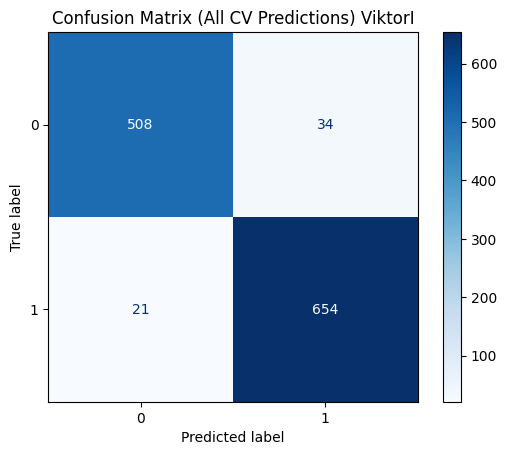

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.025        0.934       0.028    0.948   0.022
1           0.948          0.020        0.972       0.021    0.960   0.017


       Accuracy  F1 Macro
score  0.912076  0.910596


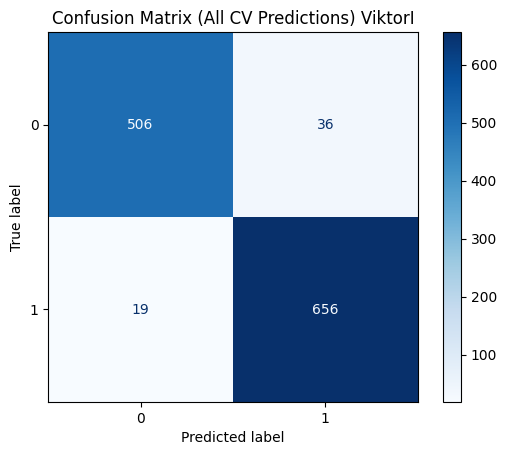

ViktorijaP
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.755471        0.06427          6           379          40   

   subsample  verbosity  
0   0.986102         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.976          0.007        0.924       0.039    0.949   0.019
1           0.953          0.024        0.985       0.005    0.968   0.011


       Accuracy  F1 Macro
score   0.89789  0.887035


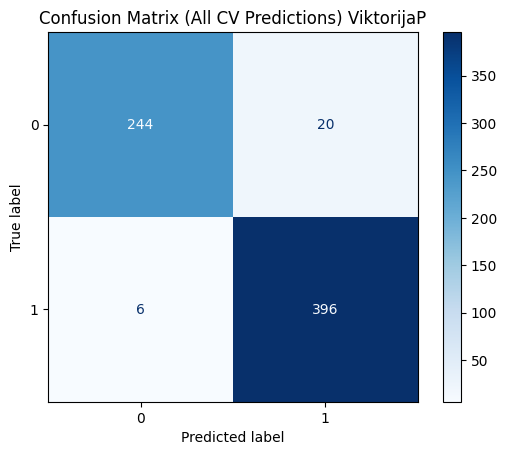

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.673362       0.070848          7           352         122   

   subsample  verbosity  
0   0.609225         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.977          0.014        0.928       0.036    0.951   0.018
1           0.955          0.022        0.985       0.009    0.970   0.011


       Accuracy  F1 Macro
score  0.896386   0.88552


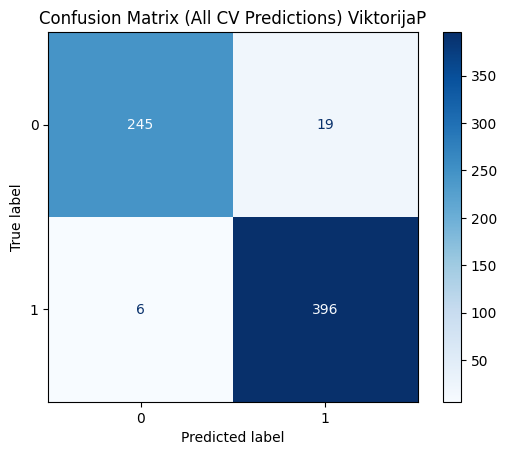

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.786705       0.181988          8           120          87   

   subsample  verbosity  
0   0.626021         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.981          0.017        0.932       0.033    0.955   0.018
1           0.957          0.020        0.988       0.011    0.972   0.011


       Accuracy  F1 Macro
score  0.894905  0.884084


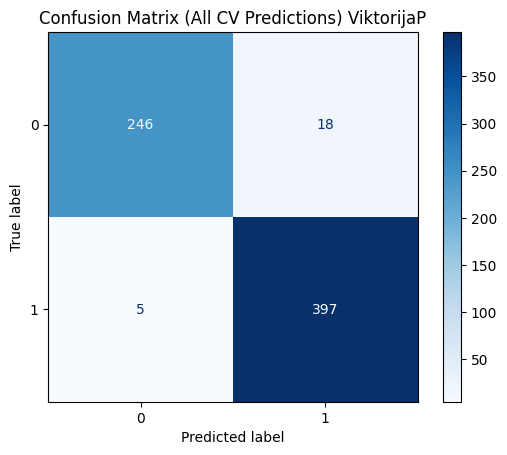

In [44]:
lgbm=LGBMClassifier()
for NAME in all_names:
        final_pipeline(model=lgbm,param_dist=LightGBMParams,search_type='random', names=NAME, feat=None,n_iter=25, top_k=3,cv_splits=5)

# Additonal Analysis and Testing

Now that we have trained models(Random Forests, Decision Trees, KNNs and LightG) on the avalible data let's try and build models on data from specific snesors and try to associate specific movements from the face to detect chewing.

We will try training models from data from cheeck and temple movement and see how they hold up against the models from all the data that we have.

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
IlijaM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.960          0.016        0.933       0.030    0.946   0.013
1           0.967          0.015        0.980       0.009    0.973   0.006


       Accuracy  F1 Macro
score  0.940828  0.925717


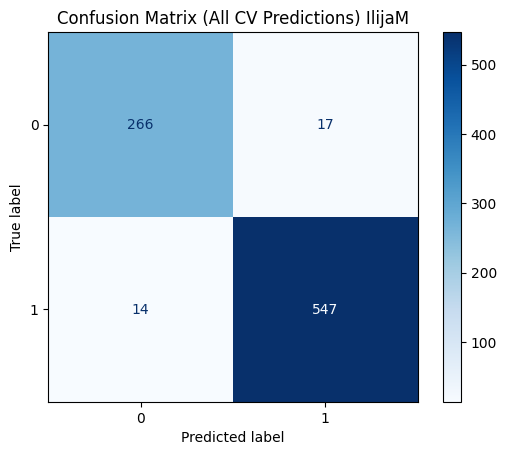

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 4                  6           199


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.950          0.012        0.936       0.026    0.943   0.011
1           0.968          0.013        0.975       0.007    0.972   0.005


       Accuracy  F1 Macro
score  0.936088  0.929757


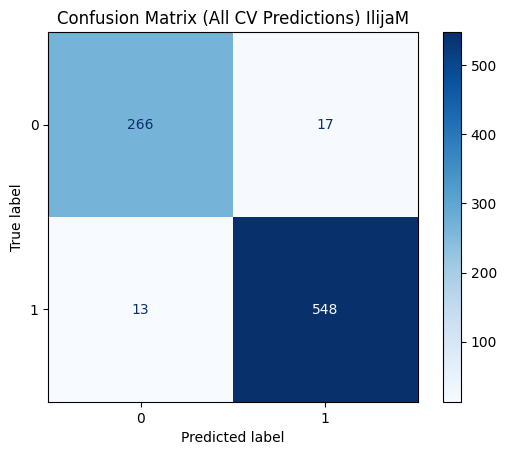

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         18         log2                 2                 10           445


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.947          0.014        0.947       0.029    0.947   0.013
1           0.974          0.015        0.973       0.008    0.973   0.006


       Accuracy  F1 Macro
score  0.940828  0.933034


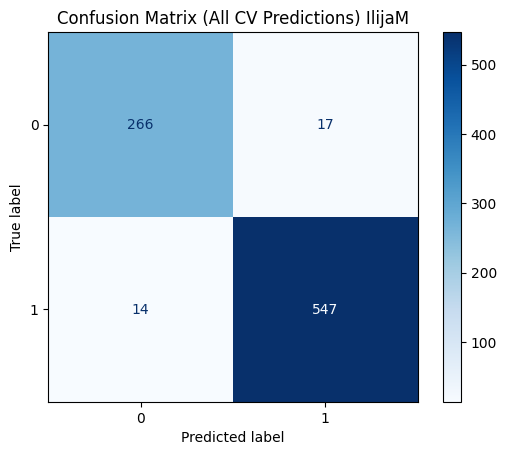

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
IlijaM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         31         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.861          0.053        0.880        0.02    0.870   0.031
1           0.939          0.010        0.927        0.03    0.933   0.018


       Accuracy  F1 Macro
score  0.879227  0.889065


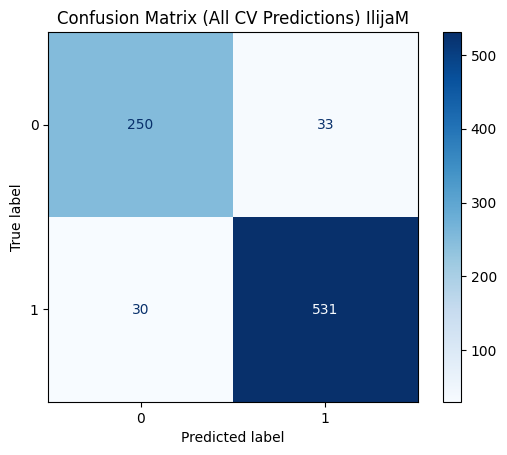

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         26         sqrt                 1                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.864          0.044        0.891       0.040    0.877   0.039
1           0.944          0.021        0.929       0.025    0.936   0.021


       Accuracy  F1 Macro
score  0.901698  0.878904


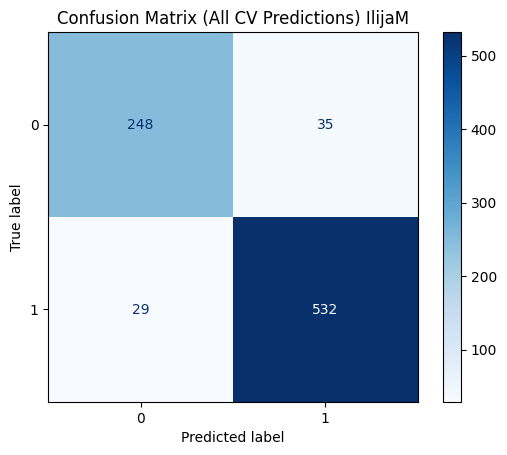

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         39         log2                 2                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.860          0.027        0.887       0.024    0.873   0.017
1           0.942          0.012        0.927       0.016    0.934   0.009


       Accuracy  F1 Macro
score  0.889892  0.899233


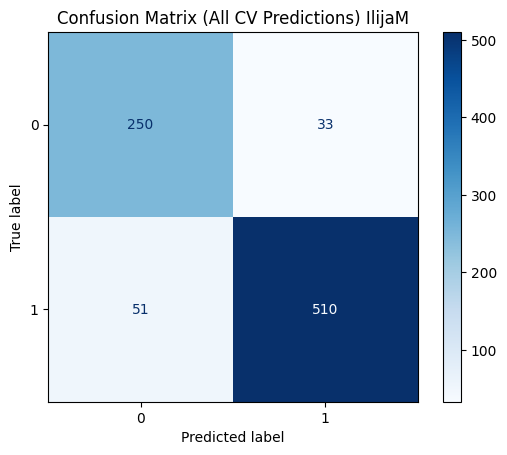

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
IlijaM
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.894          0.010        0.802       0.020    0.845   0.013
1           0.905          0.009        0.952       0.004    0.928   0.006


       Accuracy  F1 Macro
score  0.822112  0.763713


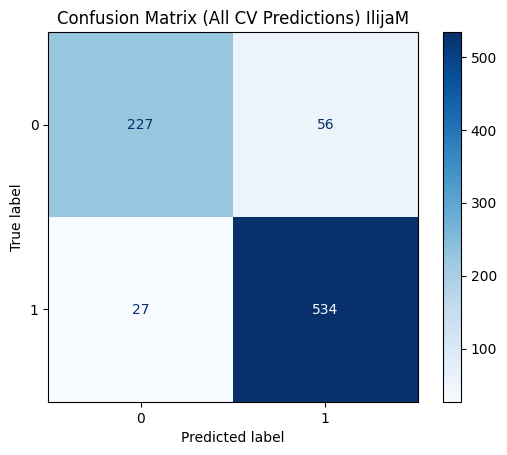

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.894          0.010        0.802       0.020    0.845   0.013
1           0.905          0.009        0.952       0.004    0.928   0.006


       Accuracy  F1 Macro
score  0.822112  0.763713


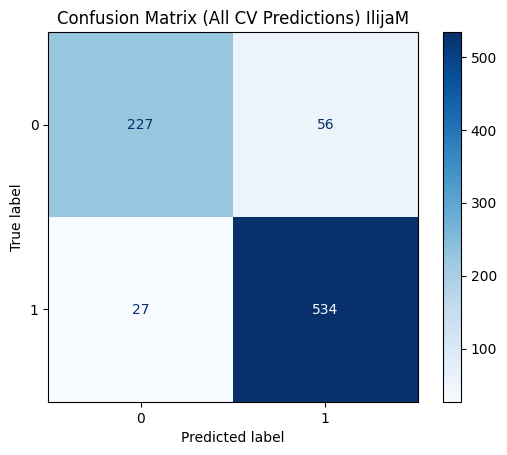

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.917          0.022        0.767       0.049    0.834   0.024
1           0.892          0.021        0.964       0.011    0.926   0.009


       Accuracy  F1 Macro
score  0.819766  0.761071


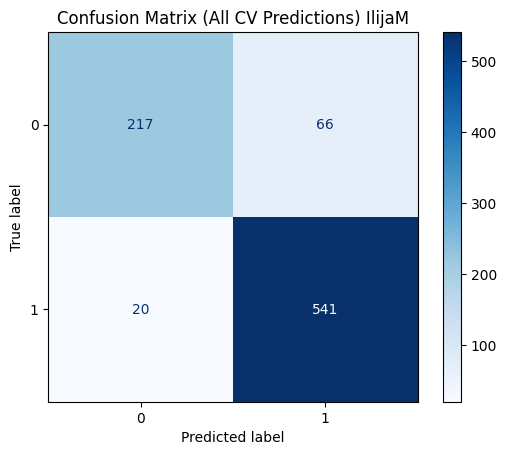

<class 'lightgbm.sklearn.LGBMClassifier'>
IlijaM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.011        0.958       0.024    0.961   0.017
1           0.979          0.012        0.982       0.006    0.980   0.009


       Accuracy  F1 Macro
score  0.946739  0.939589


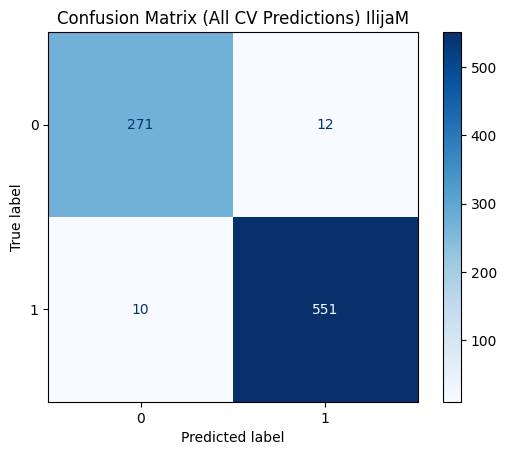

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.968          0.007        0.958       0.024    0.963   0.012
1           0.979          0.012        0.984       0.004    0.981   0.006


       Accuracy  F1 Macro
score  0.944372   0.93648


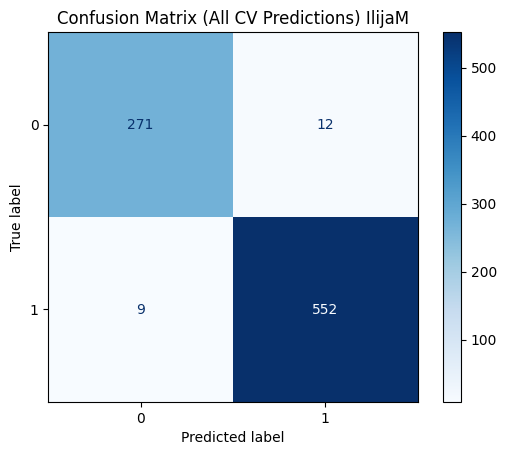

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.860355       0.021282          9           393          16   

   subsample  verbosity  
0    0.67273         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.968          0.013        0.958       0.024    0.963   0.016
1           0.979          0.012        0.984       0.007    0.981   0.008


       Accuracy  F1 Macro
score  0.944379  0.936221


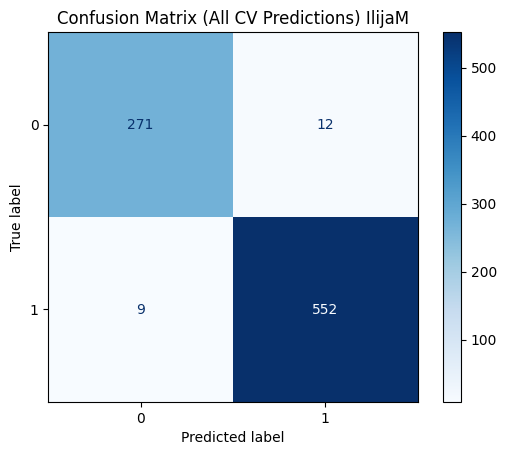

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MiaD
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 2                  4           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.992       0.016    0.994   0.008
1           0.995          0.011        0.997       0.006    0.996   0.005


       Accuracy  F1 Macro
score  0.991694  0.991312


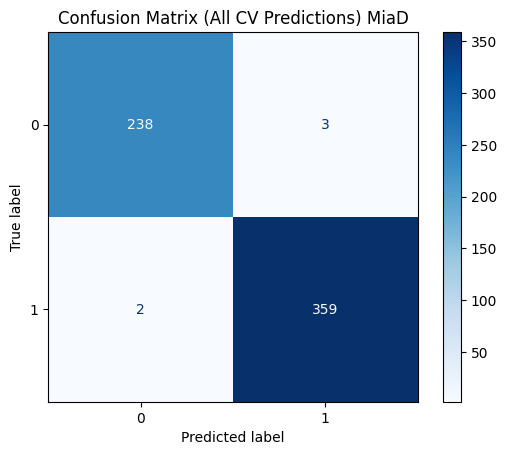

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          7         sqrt                 3                  8           120


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.988       0.024    0.992   0.012
1           0.992          0.016        0.997       0.006    0.995   0.008


       Accuracy  F1 Macro
score  0.986736  0.991329


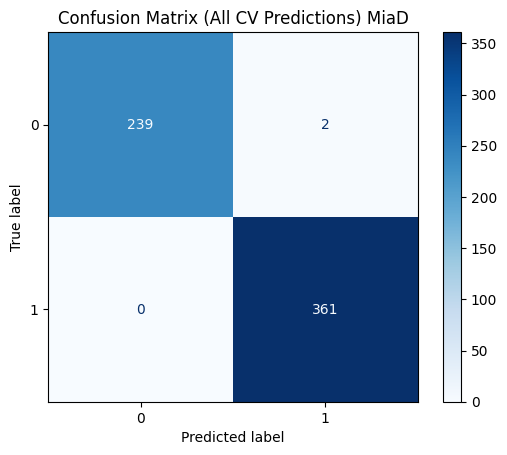

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         sqrt                 3                  6           330


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.996          0.008        0.992       0.016    0.994   0.008
1           0.995          0.011        0.997       0.006    0.996   0.005


       Accuracy  F1 Macro
score  0.990041  0.989569


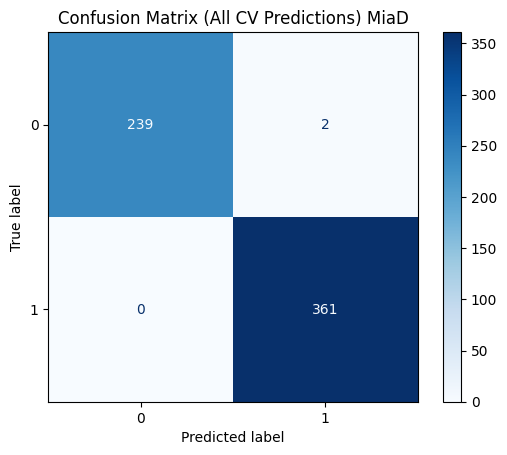

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MiaD
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         24         None                 2                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.987          0.010        0.984       0.024    0.985   0.016
1           0.989          0.016        0.992       0.007    0.990   0.010


       Accuracy  F1 Macro
score   0.98011  0.987823


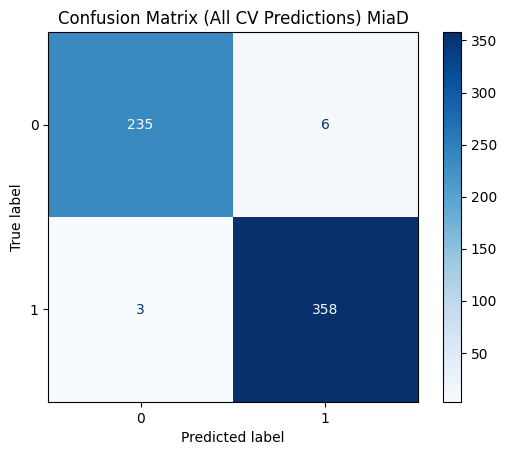

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         47         None                 1                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.016        0.975       0.030    0.981   0.018
1           0.984          0.020        0.992       0.011    0.988   0.012


       Accuracy  F1 Macro
score  0.988375  0.987858


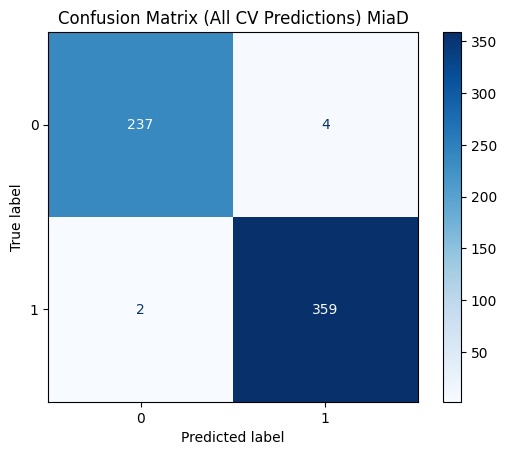

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.016        0.984       0.024    0.985   0.016
1           0.989          0.016        0.992       0.011    0.990   0.010


       Accuracy  F1 Macro
score  0.985028   0.98445


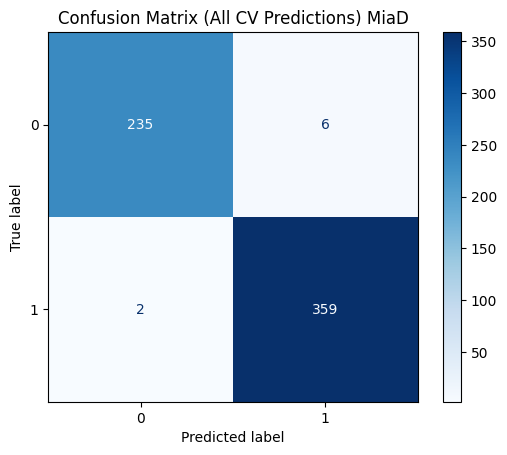

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MiaD
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.974          0.016        0.946       0.028    0.960   0.020
1           0.965          0.018        0.983       0.010    0.974   0.013


       Accuracy  F1 Macro
score  0.930041  0.924705


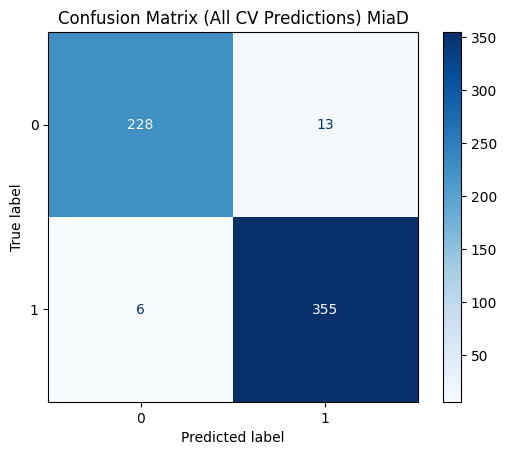

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.974          0.016        0.946       0.028    0.960   0.020
1           0.965          0.018        0.983       0.010    0.974   0.013


       Accuracy  F1 Macro
score  0.930041  0.924705


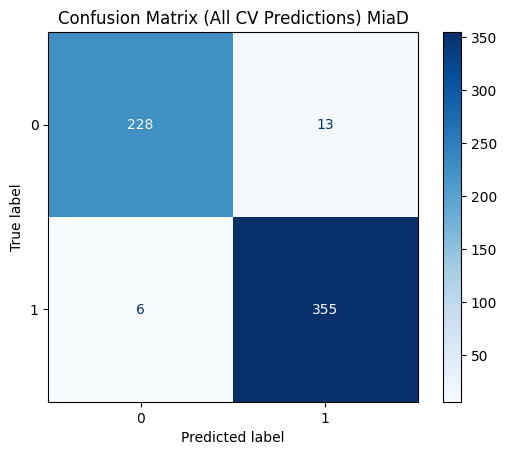

KNeighborsClassifier


   algorithm  n_neighbors  p   weights
0  ball_tree            8  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.995          0.009        0.913       0.024    0.952   0.016
1           0.945          0.015        0.997       0.006    0.970   0.010


       Accuracy  F1 Macro
score  0.926708  0.919397


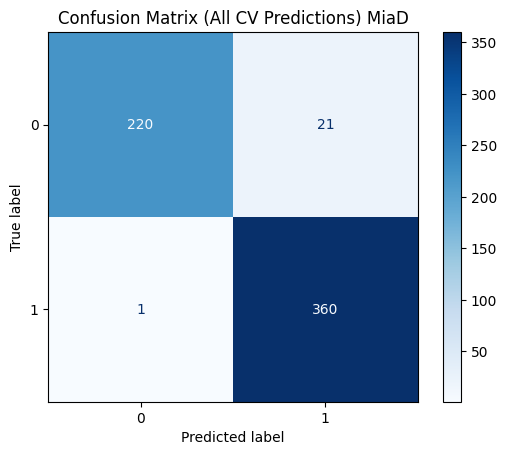

<class 'lightgbm.sklearn.LGBMClassifier'>
MiaD
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.992       0.016    0.992   0.008
1           0.995          0.011        0.994       0.007    0.994   0.005


       Accuracy  F1 Macro
score   0.99668  0.996537


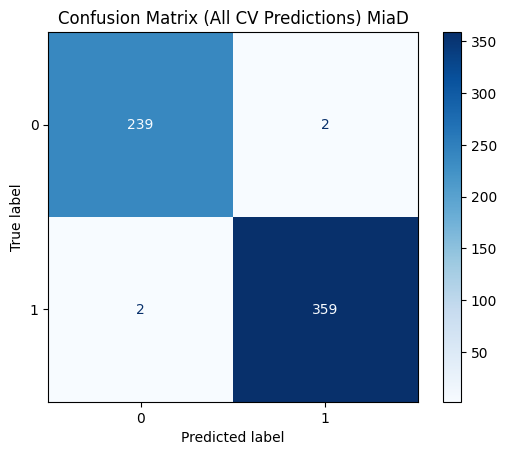

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.992       0.016    0.992   0.012
1           0.995          0.011        0.994       0.007    0.994   0.008


       Accuracy  F1 Macro
score  0.993347  0.993076


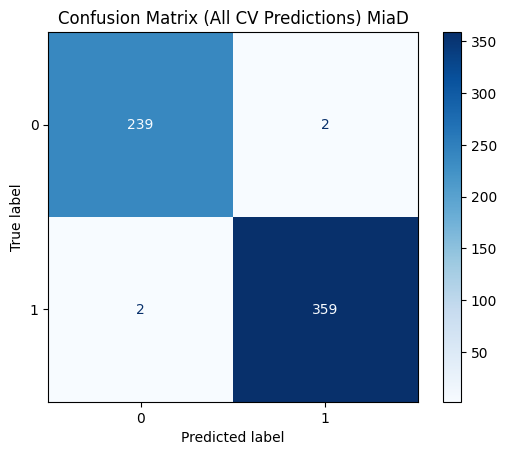

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.674628       0.188512          8           447         103   

   subsample  verbosity  
0   0.727201         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.992       0.016    0.992   0.012
1           0.995          0.011        0.994       0.007    0.994   0.008


       Accuracy  F1 Macro
score  0.993347  0.993076


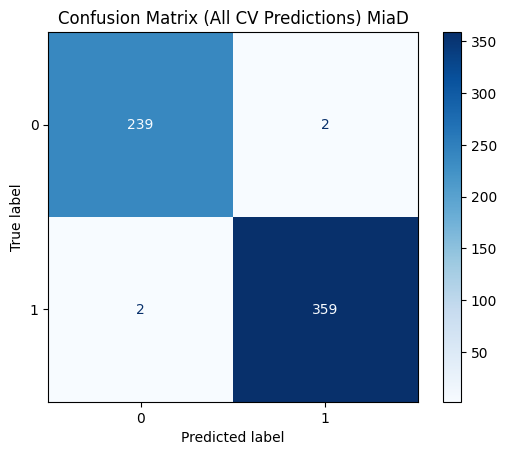

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
KristijanM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         15         sqrt                 1                  9           262


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.883          0.049        0.951       0.028    0.915   0.028
1           0.981          0.011        0.950       0.025    0.965   0.013


       Accuracy  F1 Macro
score  0.885876  0.845307


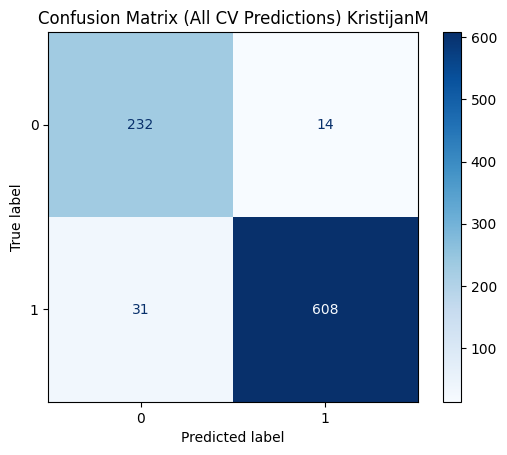

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.879          0.048        0.943       0.033    0.909   0.024
1           0.978          0.013        0.948       0.025    0.963   0.011


       Accuracy  F1 Macro
score  0.884746  0.836789


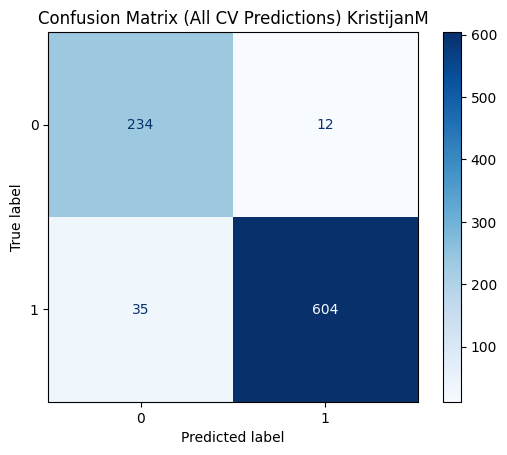

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         sqrt                 2                  5           188


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.881          0.054        0.951       0.021    0.913   0.030
1           0.981          0.008        0.948       0.028    0.964   0.015


       Accuracy  F1 Macro
score  0.888136  0.845907


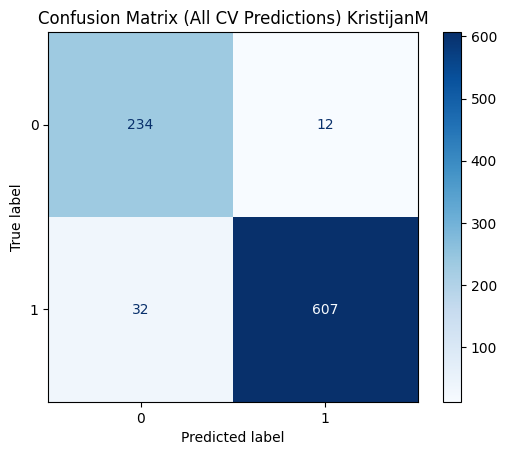

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
KristijanM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         26         sqrt                 1                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.828          0.038        0.845       0.028    0.836   0.024
1           0.940          0.010        0.931       0.021    0.935   0.012


       Accuracy  F1 Macro
score  0.847458  0.775523


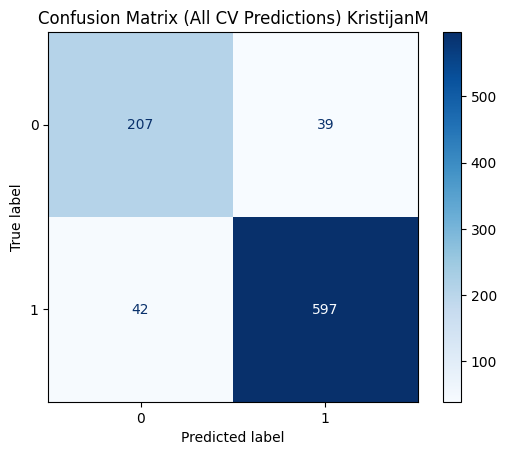

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         24         None                 4                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.845          0.036        0.854       0.023    0.849   0.021
1           0.943          0.009        0.939       0.018    0.941   0.010


       Accuracy  F1 Macro
score  0.861017  0.810486


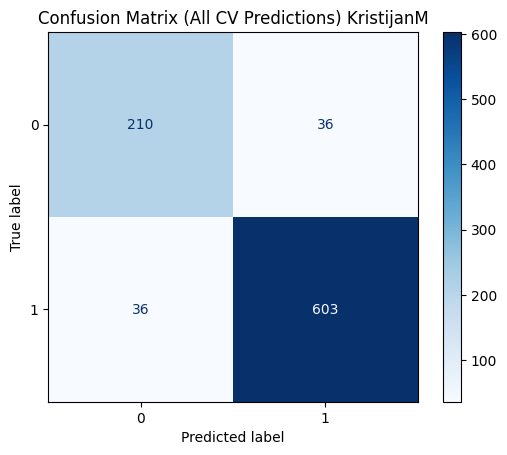

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         26         None                 4                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.837          0.036        0.805       0.058    0.819   0.034
1           0.926          0.020        0.939       0.017    0.932   0.011


       Accuracy  F1 Macro
score  0.874576  0.814736


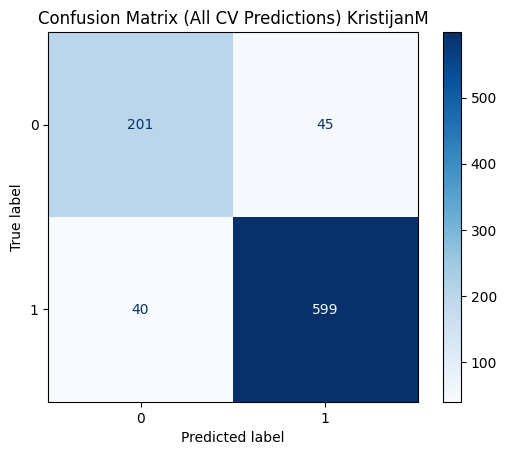

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
KristijanM
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.853          0.032        0.837       0.027    0.844   0.018
1           0.938          0.009        0.944       0.014    0.941   0.007


       Accuracy  F1 Macro
score  0.845198  0.796533


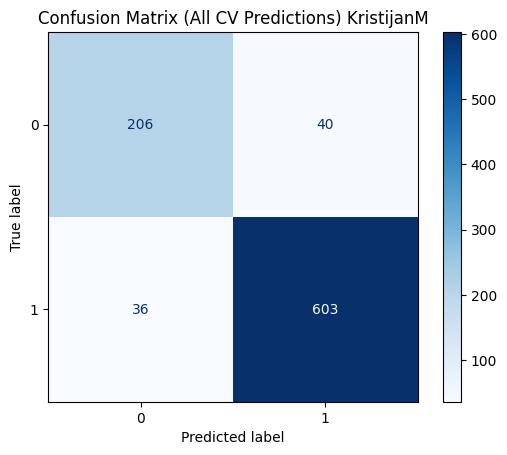

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.853          0.032        0.837       0.027    0.844   0.018
1           0.938          0.009        0.944       0.014    0.941   0.007


       Accuracy  F1 Macro
score  0.845198  0.796533


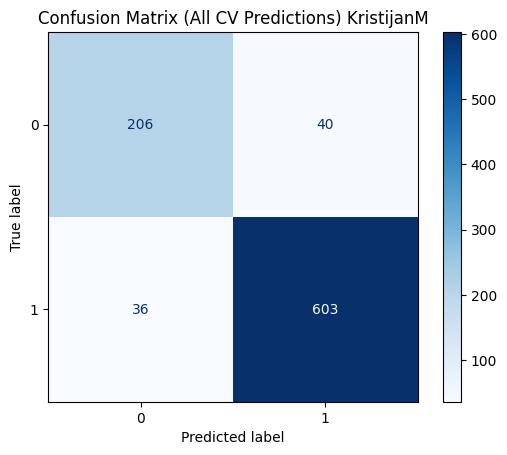

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.868          0.020        0.752       0.055    0.805   0.038
1           0.910          0.018        0.956       0.006    0.932   0.010


       Accuracy  F1 Macro
score  0.846328  0.782447


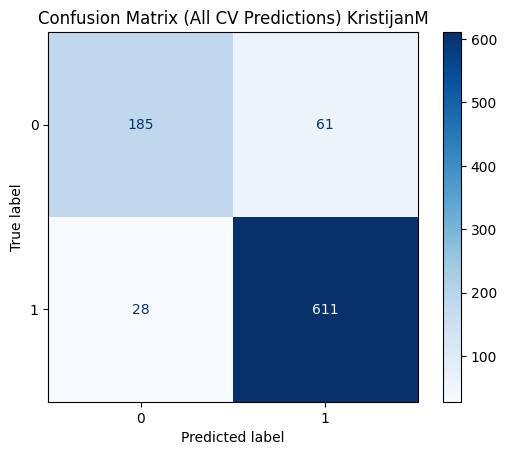

<class 'lightgbm.sklearn.LGBMClassifier'>
KristijanM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.82708       0.016263          3           317          58   

   subsample  verbosity  
0     0.9758         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.903          0.044        0.951       0.010    0.926   0.022
1           0.981          0.004        0.959       0.021    0.970   0.011


       Accuracy  F1 Macro
score  0.897175  0.865423


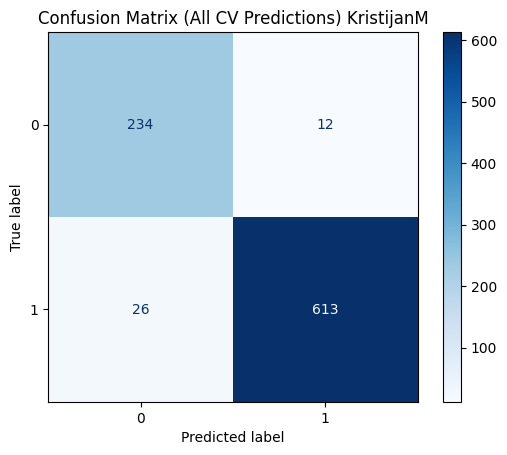

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.914          0.032        0.939       0.013    0.926   0.020
1           0.976          0.005        0.966       0.014    0.971   0.008


       Accuracy  F1 Macro
score  0.899435   0.86485


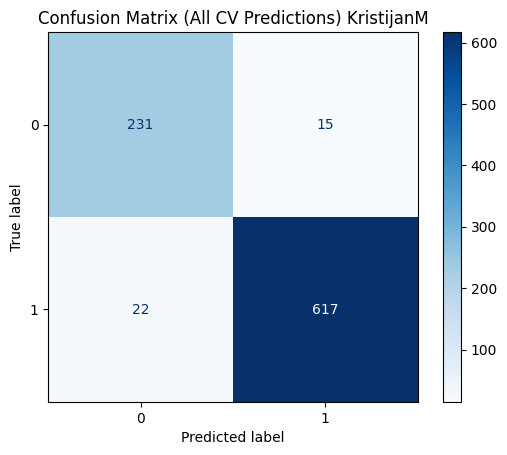

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849319        0.07618          8           161         102   

   subsample  verbosity  
0   0.866369         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.930          0.038        0.955       0.015    0.942   0.026
1           0.983          0.006        0.972       0.016    0.977   0.011


       Accuracy  F1 Macro
score  0.899435  0.864676


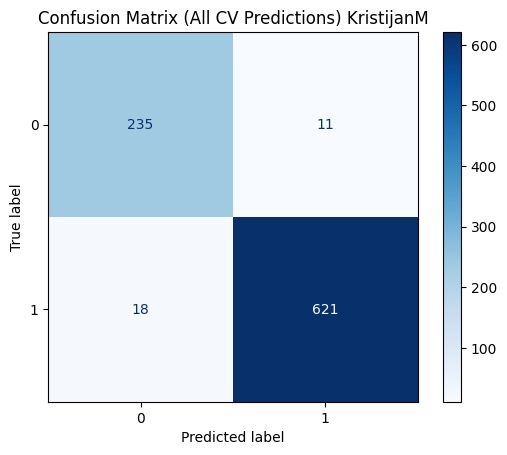

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
OgnenS
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 3                  7           408


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.952          0.012        0.884       0.026    0.916   0.015
1           0.935          0.014        0.973       0.007    0.954   0.008


       Accuracy  F1 Macro
score  0.916431  0.909041


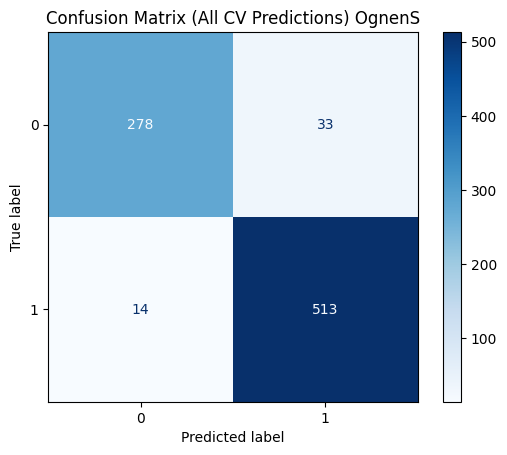

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.949          0.014        0.897       0.017    0.922   0.007
1           0.941          0.008        0.972       0.009    0.956   0.004


       Accuracy  F1 Macro
score  0.917615  0.907574


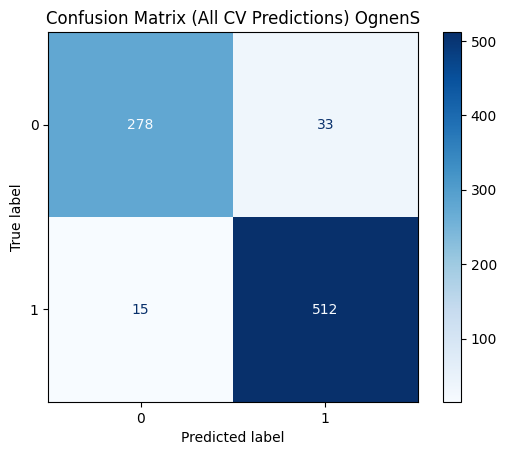

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.016        0.907       0.028    0.929   0.019
1           0.947          0.015        0.973       0.009    0.960   0.010


       Accuracy  F1 Macro
score   0.91882  0.909036


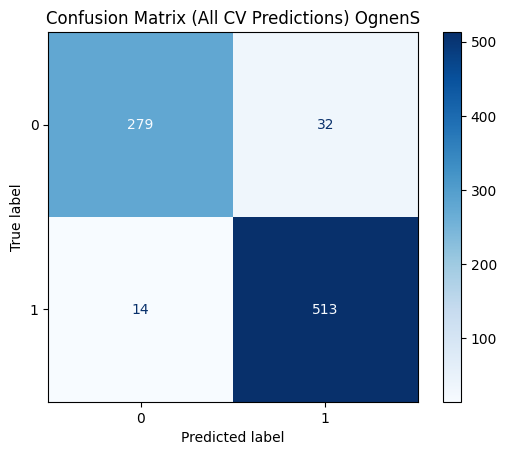

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
OgnenS
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         42         None                 4                  3   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.863          0.019        0.910       0.042    0.885   0.024
1           0.946          0.024        0.915       0.013    0.930   0.013


       Accuracy  F1 Macro
score  0.885379  0.868539


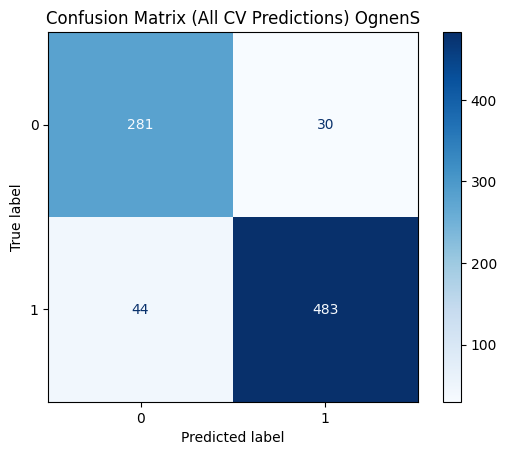

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         31         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.909          0.033        0.897       0.048    0.902   0.035
1           0.940          0.026        0.947       0.019    0.943   0.019


       Accuracy  F1 Macro
score  0.877139  0.862323


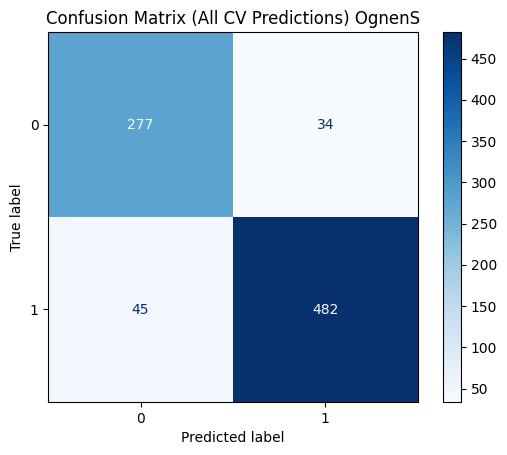

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.879          0.048        0.904       0.037    0.889   0.023
1           0.943          0.020        0.924       0.032    0.933   0.016


       Accuracy  F1 Macro
score  0.885451    0.8781


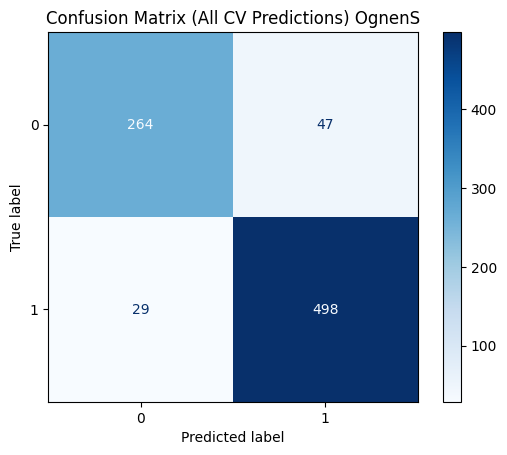

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
OgnenS
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.919          0.016        0.839       0.022    0.877   0.013
1           0.910          0.012        0.956       0.010    0.932   0.007


       Accuracy  F1 Macro
score  0.861456  0.841678


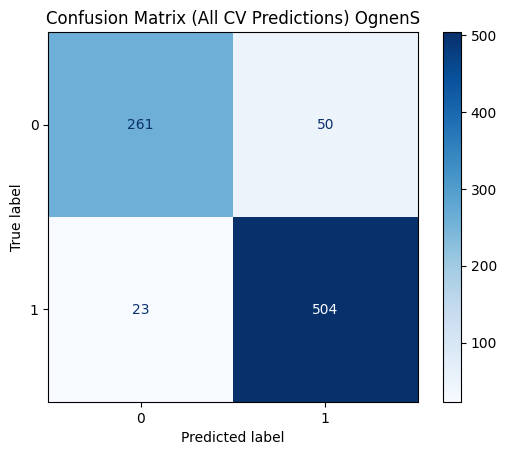

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.919          0.016        0.839       0.022    0.877   0.013
1           0.910          0.012        0.956       0.010    0.932   0.007


       Accuracy  F1 Macro
score  0.861456  0.841678


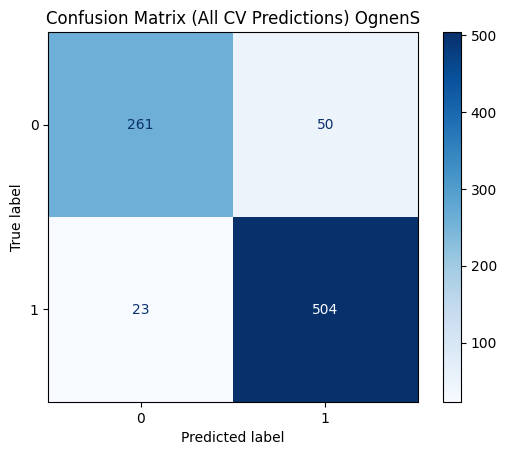

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.932          0.013        0.791       0.038    0.855   0.022
1           0.887          0.019        0.966       0.008    0.925   0.010


       Accuracy  F1 Macro
score  0.857913  0.830908


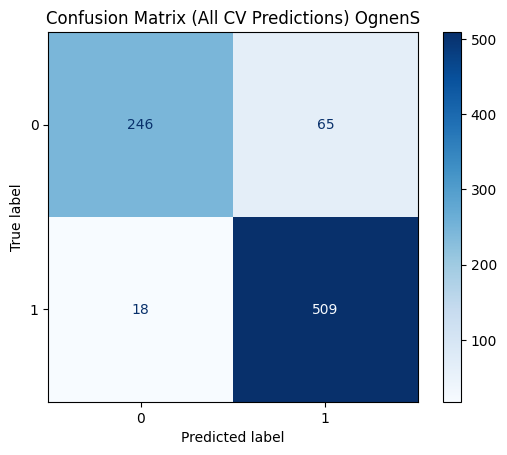

<class 'lightgbm.sklearn.LGBMClassifier'>
OgnenS
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.908508       0.024809          8           140          42   

   subsample  verbosity  
0   0.945241         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.939          0.020        0.932       0.012    0.936   0.010
1           0.960          0.007        0.964       0.013    0.962   0.006


       Accuracy  F1 Macro
score  0.909253  0.897935


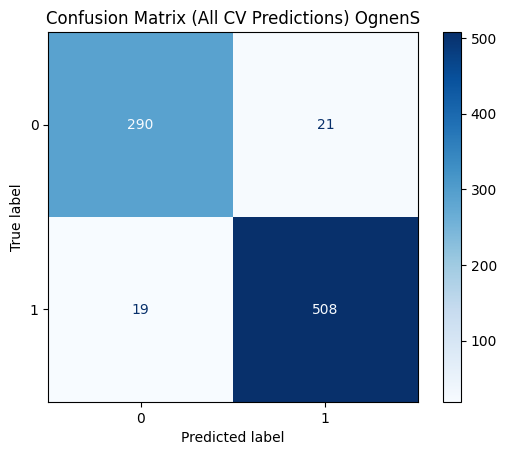

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.873693        0.09803          8           363          61   

   subsample  verbosity  
0   0.669346         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.958          0.018        0.945       0.022    0.951   0.009
1           0.968          0.012        0.975       0.011    0.972   0.005


       Accuracy  F1 Macro
score  0.909274  0.897127


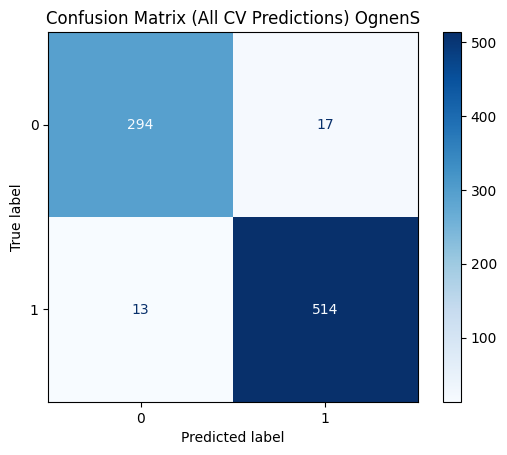

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.955          0.018        0.945       0.022    0.950   0.010
1           0.968          0.012        0.973       0.011    0.971   0.005


       Accuracy  F1 Macro
score  0.908084  0.895415


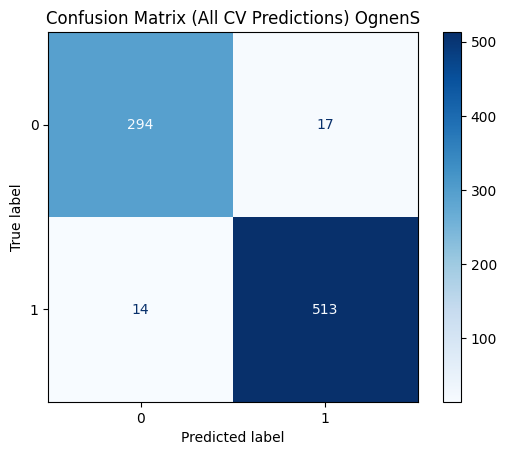

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MarinoJ
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.936          0.029        0.977       0.020    0.956   0.018
1           0.988          0.011        0.964       0.017    0.976   0.010


       Accuracy  F1 Macro
score  0.957849  0.949019


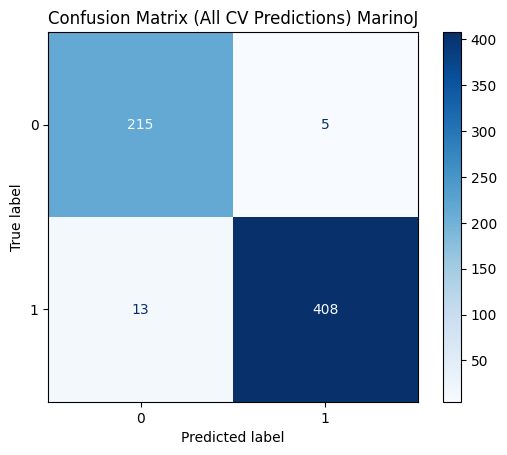

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0          6         log2                 4                  8           363


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.936          0.028        0.982       0.017    0.958   0.014
1           0.990          0.009        0.964       0.017    0.977   0.008


       Accuracy  F1 Macro
score  0.959411  0.957545


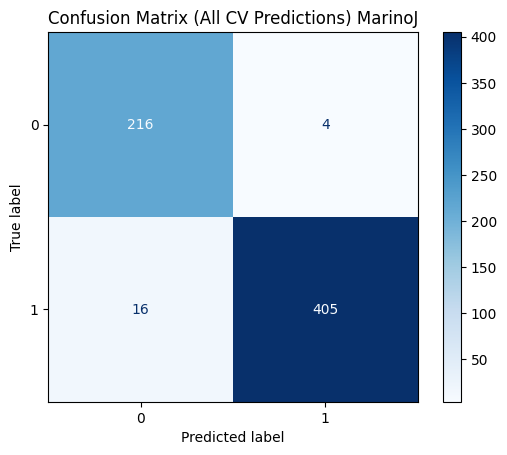

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         sqrt                 1                  4           463


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.944          0.034        0.977       0.020    0.960   0.021
1           0.988          0.011        0.969       0.019    0.978   0.012


       Accuracy  F1 Macro
score  0.957849  0.959316


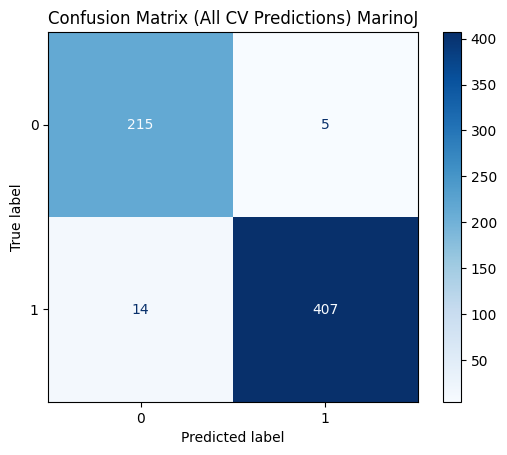

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MarinoJ
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         37         None                 3                  6   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.931          0.038        0.945       0.042    0.937   0.022
1           0.972          0.021        0.962       0.022    0.967   0.012


       Accuracy  F1 Macro
score   0.93142  0.931133


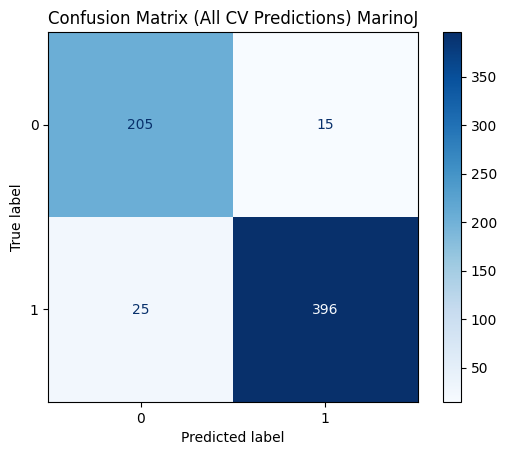

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 4                 10   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.898          0.038        0.950       0.039    0.923   0.033
1           0.973          0.020        0.943       0.023    0.958   0.018


       Accuracy  F1 Macro
score  0.920506  0.920276


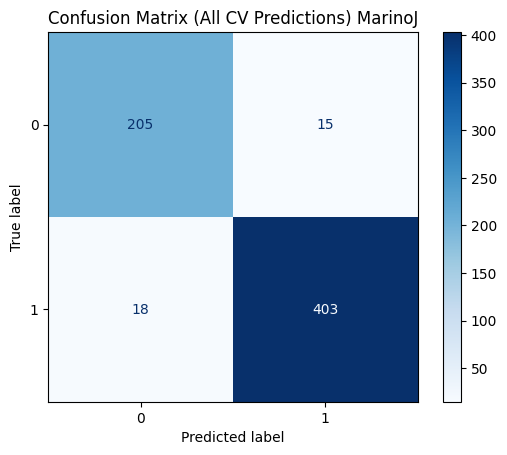

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.934          0.028        0.945       0.031    0.939   0.012
1           0.972          0.016        0.964       0.017    0.968   0.006


       Accuracy  F1 Macro
score  0.943823  0.931284


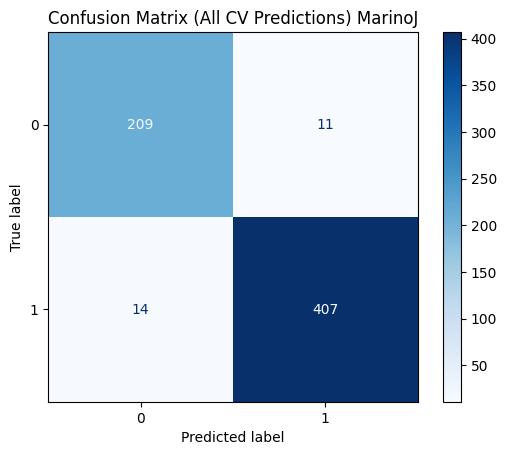

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MarinoJ
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.963          0.018        0.927       0.027    0.944   0.016
1           0.963          0.013        0.981       0.009    0.972   0.008


       Accuracy  F1 Macro
score  0.942224  0.931962


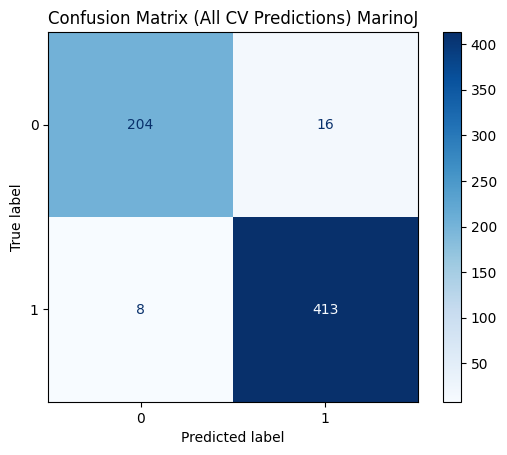

KNeighborsClassifier


   algorithm  n_neighbors  p  weights
0  ball_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.963          0.018        0.927       0.027    0.944   0.016
1           0.963          0.013        0.981       0.009    0.972   0.008


       Accuracy  F1 Macro
score  0.942224  0.931962


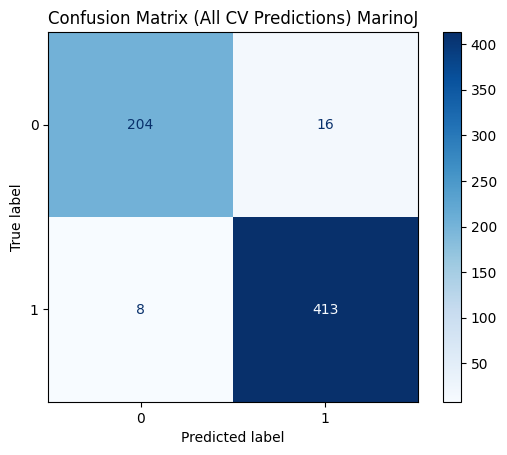

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.010        0.923       0.034    0.944   0.015
1           0.961          0.017        0.983       0.006    0.972   0.007


       Accuracy  F1 Macro
score  0.939111  0.927048


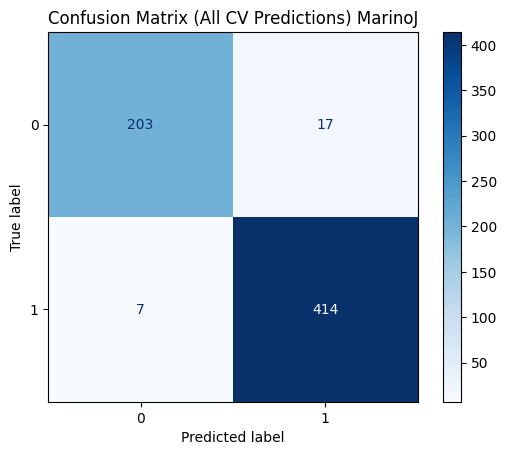

<class 'lightgbm.sklearn.LGBMClassifier'>
MarinoJ
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.939566       0.154346          8           354          28   

   subsample  verbosity  
0   0.797518         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.018        0.977        0.02    0.973   0.017
1           0.988          0.011        0.983        0.01    0.986   0.009


       Accuracy  F1 Macro
score  0.971887  0.968798


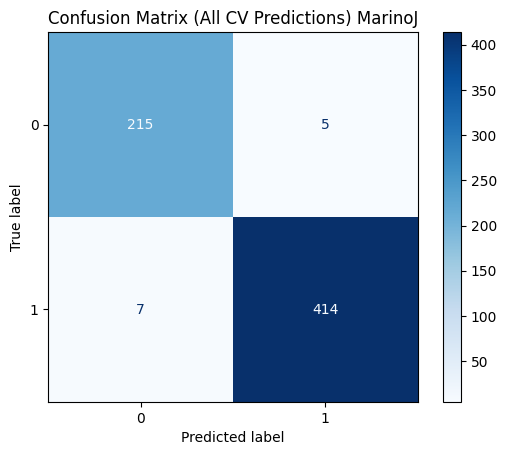

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.849319        0.07618          8           161         102   

   subsample  verbosity  
0   0.866369         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.965          0.026        0.977       0.020    0.971   0.021
1           0.988          0.011        0.981       0.014    0.984   0.011


       Accuracy  F1 Macro
score  0.968786  0.965415


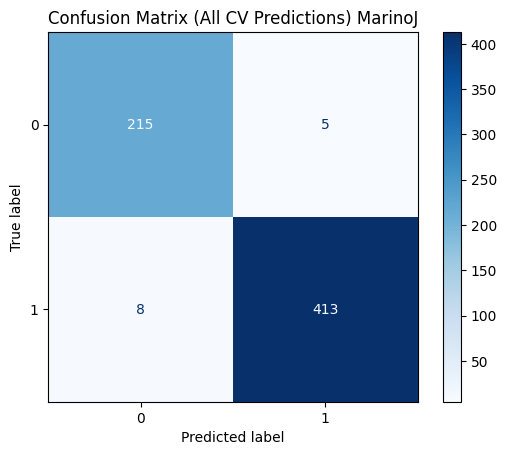

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.681224       0.198571          8           286         100   

   subsample  verbosity  
0   0.952187         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.027        0.973       0.027    0.968   0.025
1           0.986          0.014        0.981       0.014    0.983   0.013


       Accuracy  F1 Macro
score  0.968786  0.965415


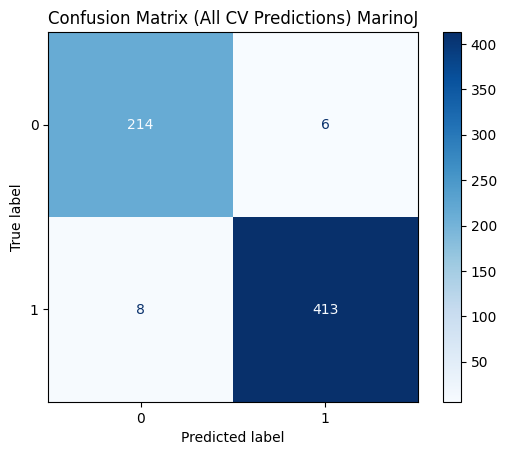

Exception ignored in: <function ResourceTracker.__del__ at 0x70acbafa1c60>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 77, in __del__
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 86, in _stop
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 111, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x77770cd91c60>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 77, in __del__
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 86, in _stop
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 111, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x70690e9a1c60>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/reso

In [ ]:
features1 = ['LeftTemple','Subject']
models=[RandomForestClassifier,DecisionTreeClassifier,KNeighborsClassifier,LGBMClassifier]
namess = ['FEIT_eating_IlijaM', 'FEIT_eating_MiaD','FEIT_eating_KristijanM','FEIT_eating_OgnenS','FEIT_eating_MarinoJ']
for NAME in namess:
    for i, MODEL in enumerate(models):
        print(MODEL)
        model_instance = MODEL()
        final_pipeline(model=model_instance,param_dist=params[i],search_type='random', names=NAME, feat=features1,n_iter=25, top_k=3,cv_splits=5)

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
IlijaM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         log2                 1                  9           162


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.924          0.031        0.940       0.024    0.932   0.022
1           0.970          0.012        0.961       0.016    0.965   0.011


       Accuracy  F1 Macro
score  0.923077  0.911979


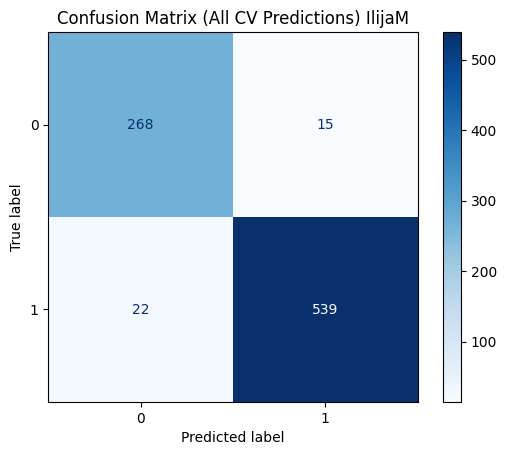

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         log2                 2                  5           369


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.925          0.036        0.944       0.021    0.934   0.022
1           0.971          0.010        0.961       0.019    0.966   0.012


       Accuracy  F1 Macro
score  0.923077  0.917471


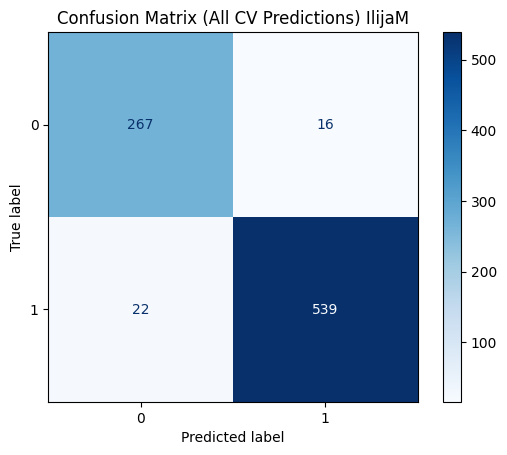

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         46         log2                 2                  3           317


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.928          0.032        0.944       0.021    0.935    0.02
1           0.971          0.010        0.963       0.017    0.967    0.01


       Accuracy  F1 Macro
score  0.919527   0.91548


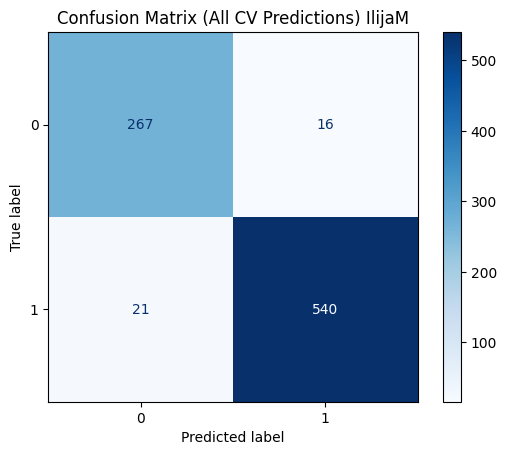

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
IlijaM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         28         log2                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.874          0.041        0.890       0.034    0.881   0.021
1           0.945          0.016        0.934       0.024    0.939   0.011


       Accuracy  F1 Macro
score  0.878043  0.856693


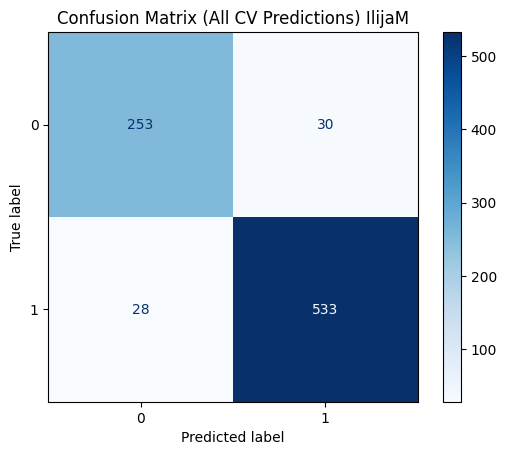

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         46         sqrt                 3                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.901          0.037        0.922       0.024    0.911   0.029
1           0.960          0.012        0.948       0.021    0.954   0.016


       Accuracy  F1 Macro
score  0.875627  0.881737


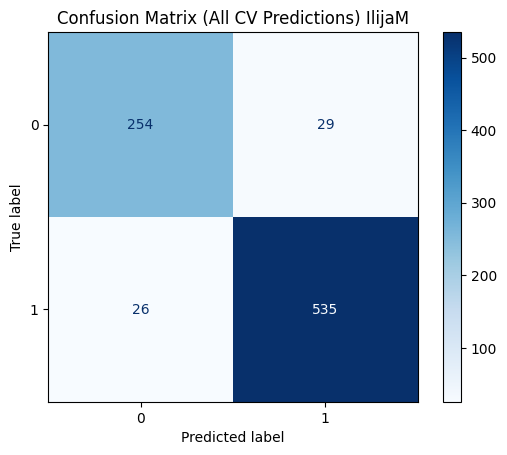

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.890          0.036        0.908       0.038    0.899   0.035
1           0.953          0.019        0.943       0.020    0.948   0.018


       Accuracy  F1 Macro
score  0.857918  0.877458


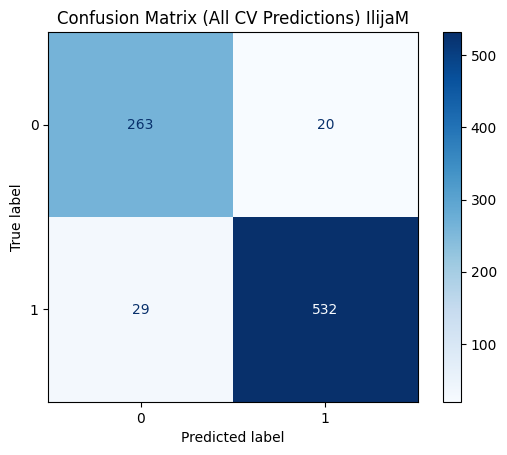

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
IlijaM
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            9  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.844          0.043        0.855       0.040    0.849   0.039
1           0.926          0.020        0.920       0.022    0.923   0.020


       Accuracy  F1 Macro
score   0.88992  0.876857


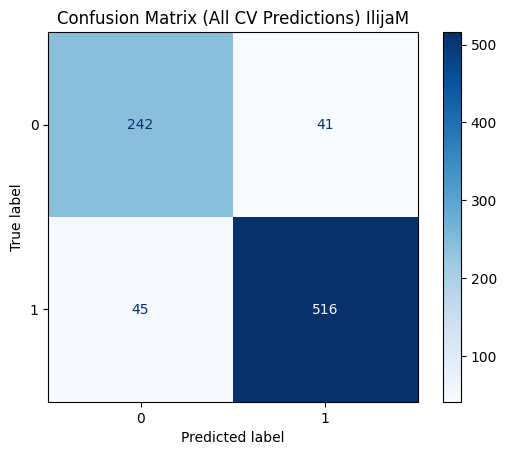

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            7  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.831          0.050        0.848       0.033    0.839   0.041
1           0.922          0.017        0.913       0.027    0.917   0.022


       Accuracy  F1 Macro
score  0.878092  0.862684


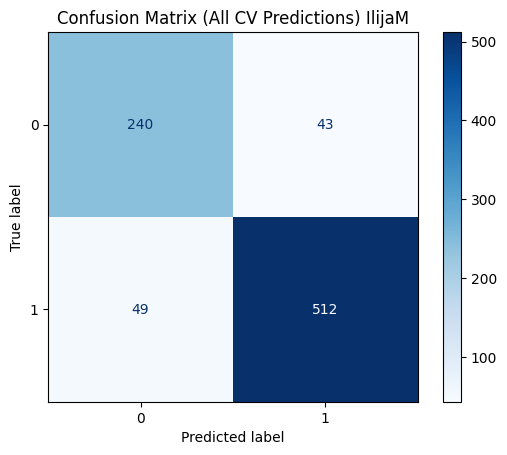

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0   kd_tree            6  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.827          0.046        0.873       0.032    0.849   0.035
1           0.934          0.016        0.907       0.027    0.920   0.019


       Accuracy  F1 Macro
score  0.868625  0.855439


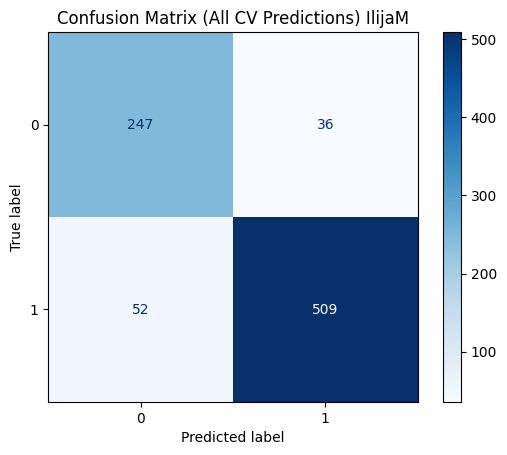

<class 'lightgbm.sklearn.LGBMClassifier'>
IlijaM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.939566       0.154346          8           354          28   

   subsample  verbosity  
0   0.797518         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.936          0.014        0.930       0.033    0.932   0.019
1           0.965          0.016        0.968       0.007    0.966   0.009


       Accuracy  F1 Macro
score   0.91952  0.909988


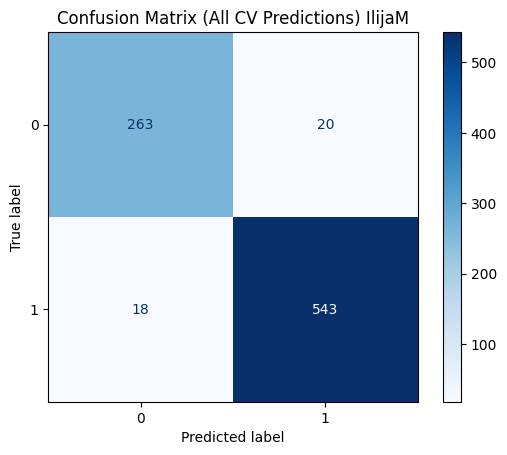

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.757953       0.068698          4           180          22   

   subsample  verbosity  
0   0.891603         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.937          0.023        0.937       0.032    0.936   0.014
1           0.968          0.016        0.968       0.012    0.968   0.007


       Accuracy  F1 Macro
score   0.91952  0.909728


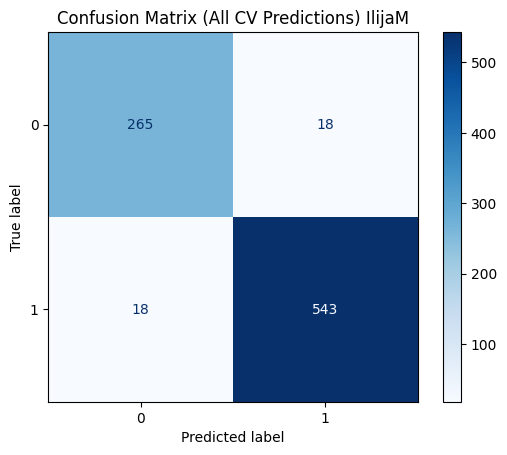

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.947          0.019        0.937       0.028    0.941   0.017
1           0.968          0.014        0.973       0.010    0.971   0.008


       Accuracy  F1 Macro
score  0.918336  0.908578


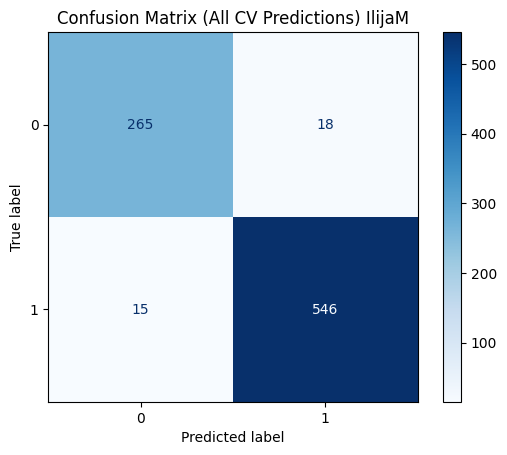

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MiaD
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         46         log2                 2                  3           317


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.979       0.013    0.985   0.011
1           0.986          0.009        0.994       0.007    0.990   0.007


       Accuracy  F1 Macro
score  0.978402  0.975738


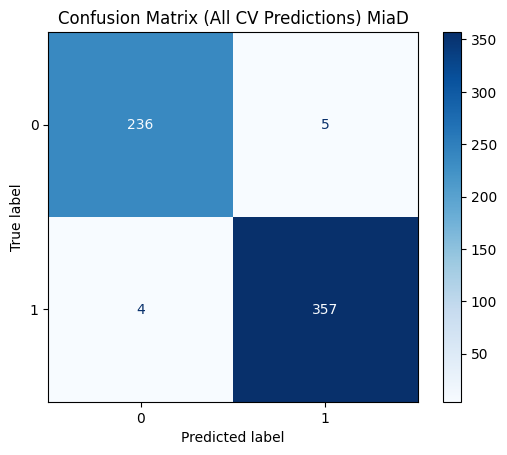

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         28         log2                 1                 10           256


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.016        0.979       0.013    0.983   0.012
1           0.986          0.009        0.992       0.011    0.989   0.008


       Accuracy  F1 Macro
score  0.976749  0.973984


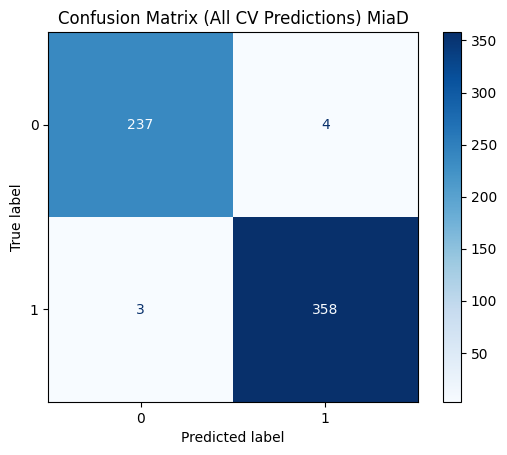

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         18         log2                 2                 10           445


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.016        0.979       0.013    0.983   0.012
1           0.986          0.009        0.992       0.011    0.989   0.008


       Accuracy  F1 Macro
score  0.978402  0.977424


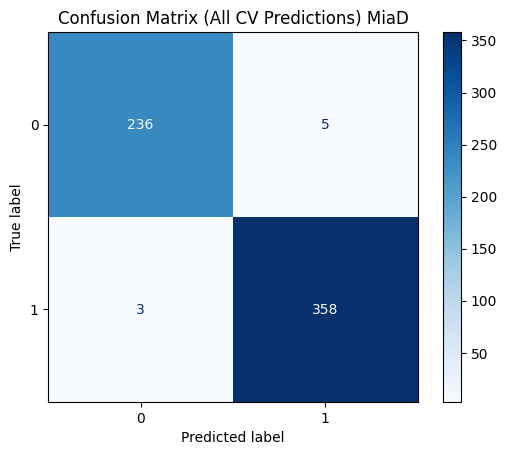

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MiaD
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         28         log2                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.955          0.026        0.954       0.016    0.954   0.008
1           0.970          0.010        0.970       0.018    0.969   0.006


       Accuracy  F1 Macro
score  0.912039  0.858669


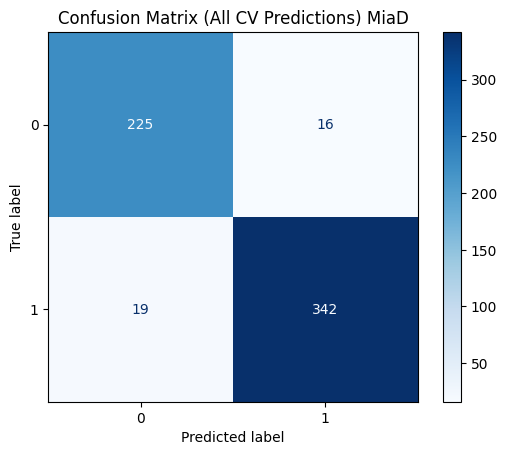

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         26         sqrt                 1                 10   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.929          0.025        0.959       0.029    0.943   0.014
1           0.972          0.019        0.950       0.019    0.961   0.009


       Accuracy  F1 Macro
score  0.930344   0.93513


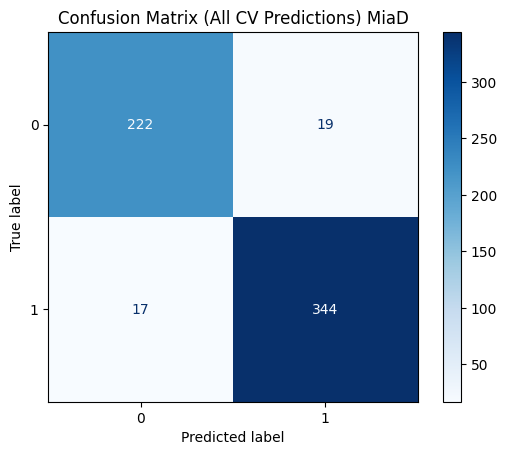

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.929           0.04        0.959       0.029    0.943   0.028
1           0.972           0.02        0.950       0.028    0.961   0.019


       Accuracy  F1 Macro
score   0.94186  0.870546


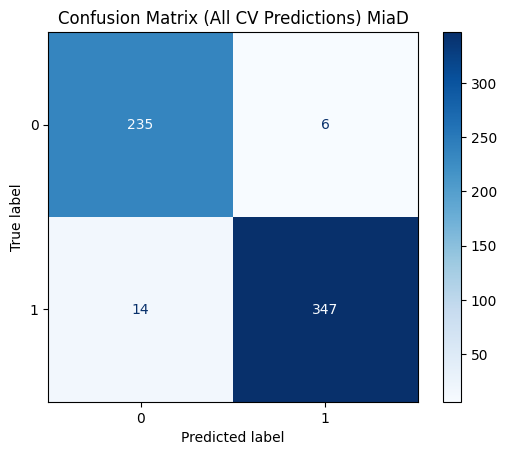

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MiaD
KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.774          0.026        0.693       0.019    0.731   0.014
1           0.808          0.010        0.864       0.020    0.835   0.011


       Accuracy  F1 Macro
score  0.638278  0.601623


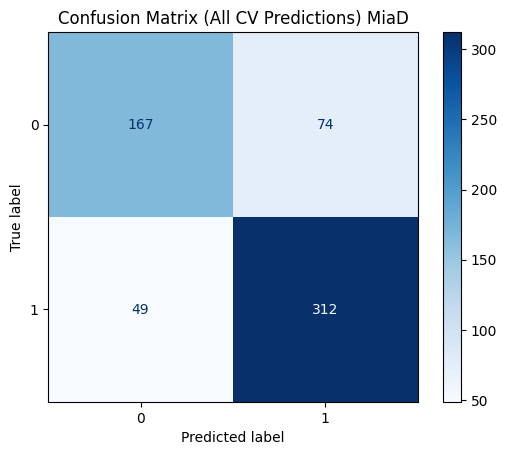

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.774          0.026        0.693       0.019    0.731   0.014
1           0.808          0.010        0.864       0.020    0.835   0.011


       Accuracy  F1 Macro
score  0.638278  0.601623


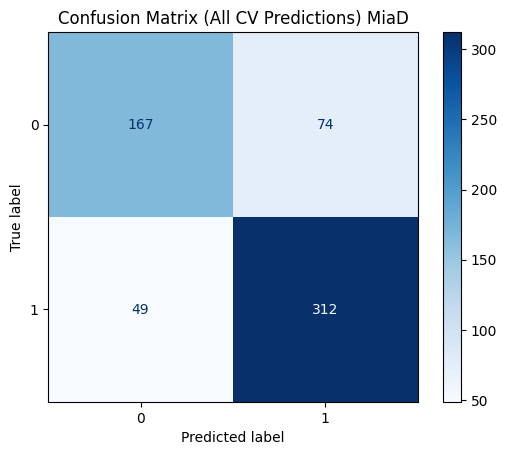

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.773          0.028        0.718       0.022    0.744   0.019
1           0.820          0.013        0.859       0.022    0.839   0.014


       Accuracy  F1 Macro
score  0.631639  0.595726


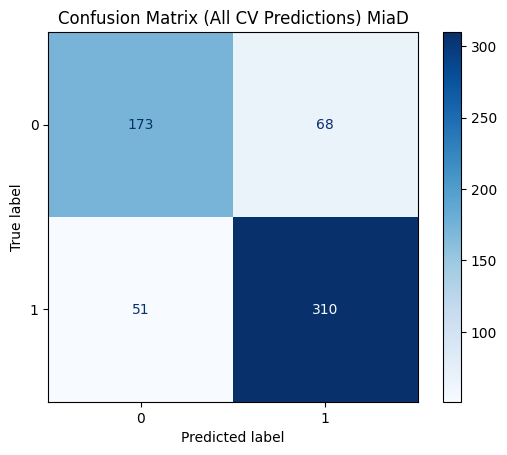

<class 'lightgbm.sklearn.LGBMClassifier'>
MiaD
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.016        0.988       0.016    0.988   0.012
1           0.992          0.011        0.992       0.011    0.992   0.008


       Accuracy  F1 Macro
score  0.976763  0.975626


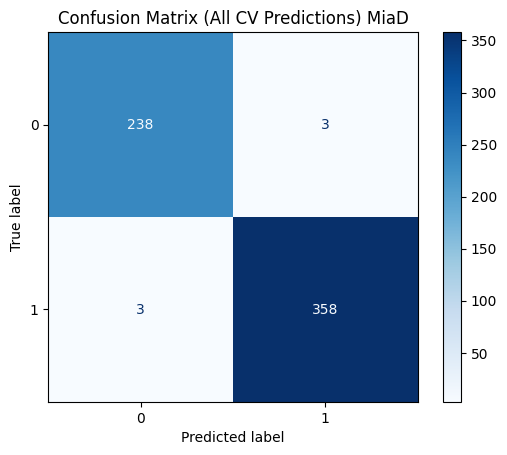

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.786705       0.181988          8           120          87   

   subsample  verbosity  
0   0.626021         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.980          0.018        0.984       0.015    0.981   0.012
1           0.989          0.010        0.986       0.012    0.987   0.008


       Accuracy  F1 Macro
score  0.975083  0.973744


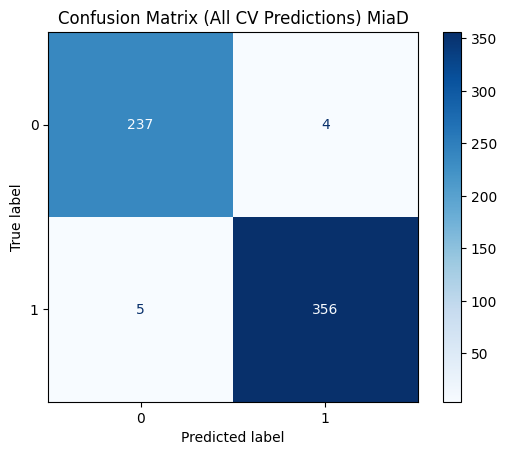

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.980          0.018        0.984       0.015    0.981   0.015
1           0.989          0.010        0.986       0.012    0.987   0.010


       Accuracy  F1 Macro
score  0.975083  0.973707


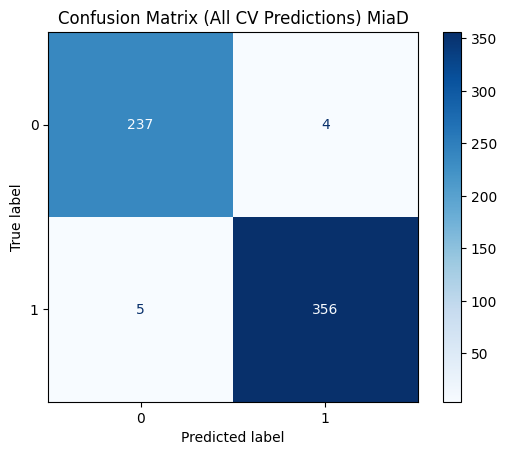

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
KristijanM
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.992          0.010        0.968       0.010    0.979     0.0
1           0.988          0.004        0.997       0.004    0.992     0.0


       Accuracy  F1 Macro
score  0.960452  0.944796


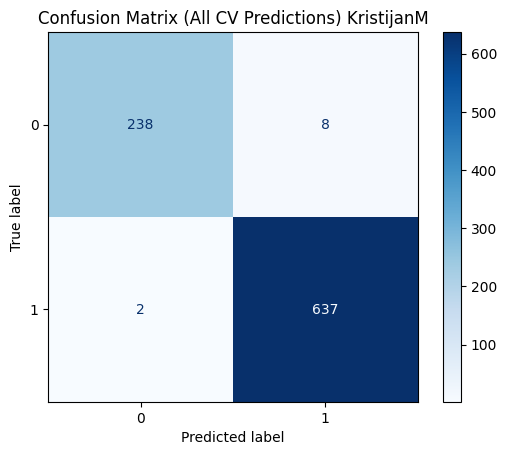

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         13         sqrt                 2                  5           188


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.968       0.010    0.977   0.004
1           0.988          0.004        0.995       0.004    0.991   0.002


       Accuracy  F1 Macro
score  0.959322   0.94781


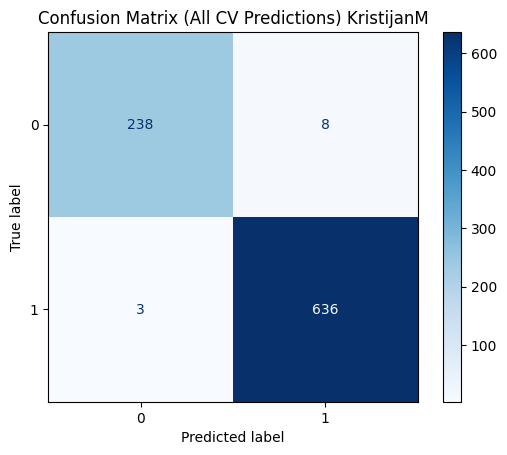

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         39         log2                 1                  5           149


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.988          0.010        0.968       0.010    0.977   0.004
1           0.988          0.004        0.995       0.004    0.991   0.002


       Accuracy  F1 Macro
score  0.963842  0.955326


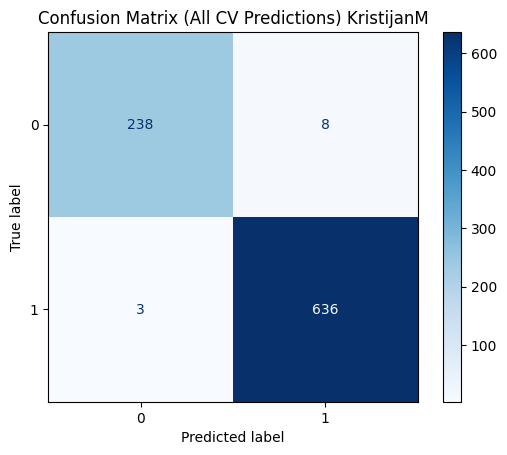

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
KristijanM
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         35         log2                 3                  9   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.922          0.037        0.947       0.016    0.934   0.024
1           0.979          0.006        0.969       0.016    0.974   0.010


       Accuracy  F1 Macro
score  0.920904  0.871063


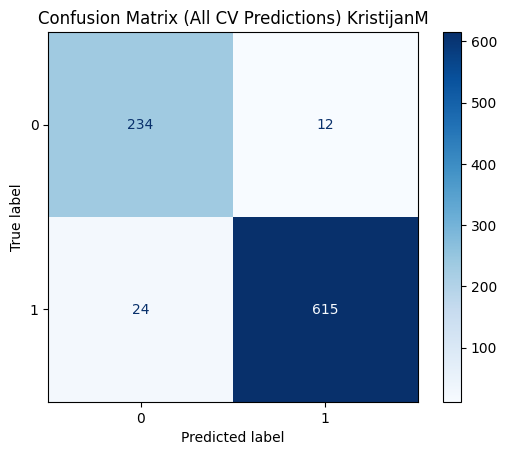

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          5         None                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.943          0.057        0.959       0.022     0.95   0.034
1           0.984          0.009        0.977       0.025     0.98   0.014


       Accuracy  F1 Macro
score  0.941243  0.935828


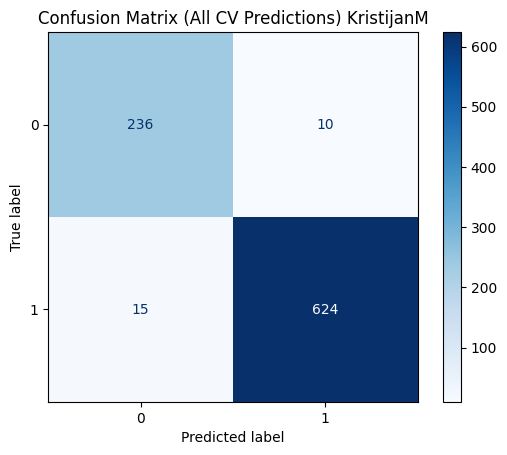

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         46         sqrt                 3                  4   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.942          0.043        0.943       0.020    0.942   0.016
1           0.978          0.007        0.977       0.018    0.977   0.007


       Accuracy  F1 Macro
score  0.948023  0.936312


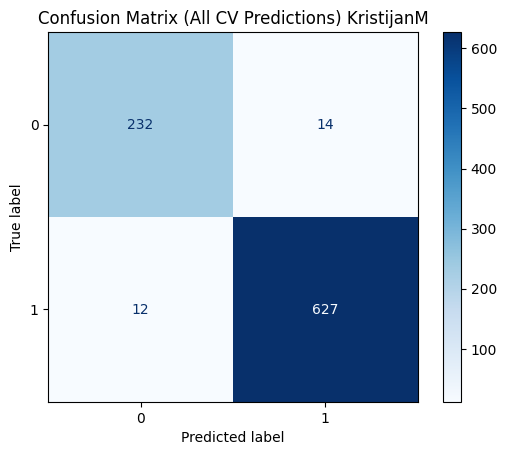

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
KristijanM
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.887          0.063        0.740       0.073    0.804   0.050
1           0.906          0.025        0.962       0.022    0.933   0.017


       Accuracy  F1 Macro
score  0.867797  0.820826


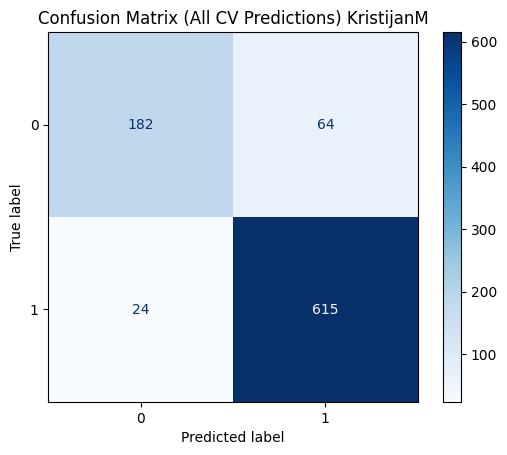

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.878          0.063        0.740       0.083    0.800   0.058
1           0.906          0.029        0.959       0.022    0.932   0.018


       Accuracy  F1 Macro
score  0.866667  0.817603


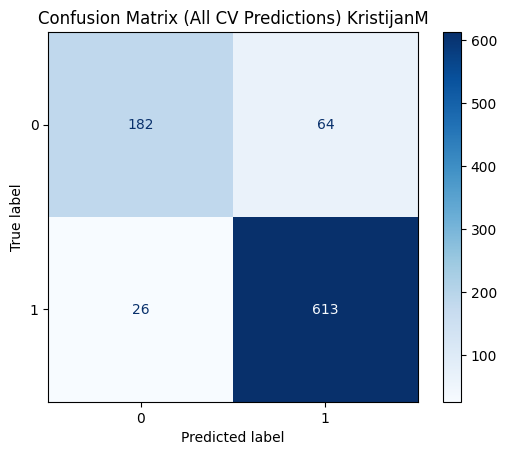

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.878          0.063        0.740       0.083    0.800   0.058
1           0.906          0.029        0.959       0.022    0.932   0.018


       Accuracy  F1 Macro
score  0.866667  0.817603


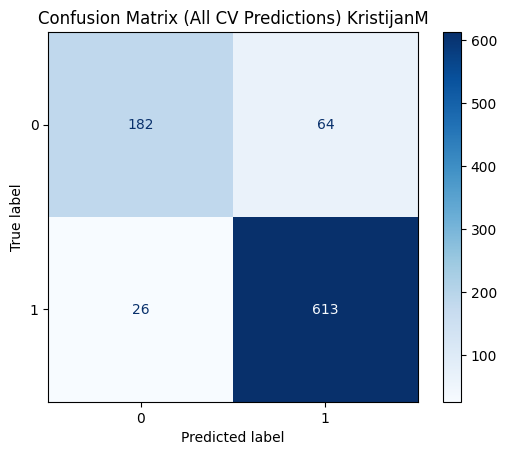

<class 'lightgbm.sklearn.LGBMClassifier'>
KristijanM
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.979554       0.203126          3           364         104   

   subsample  verbosity  
0   0.639069         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.015        0.976       0.015    0.980   0.006
1           0.991          0.006        0.994       0.006    0.992   0.002


       Accuracy  F1 Macro
score  0.971751  0.964644


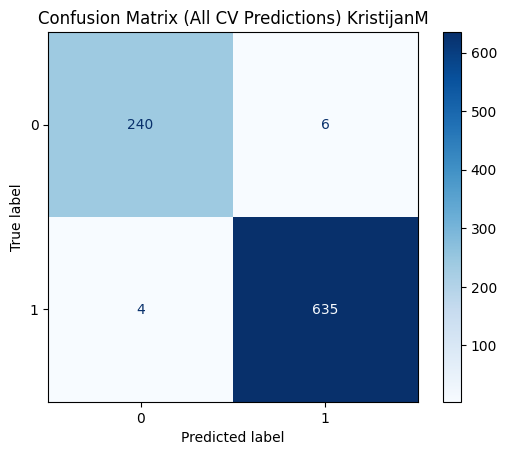

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.786705       0.181988          8           120          87   

   subsample  verbosity  
0   0.626021         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.984          0.015        0.976       0.015    0.980   0.006
1           0.991          0.006        0.994       0.006    0.992   0.002


       Accuracy  F1 Macro
score  0.964972   0.95402


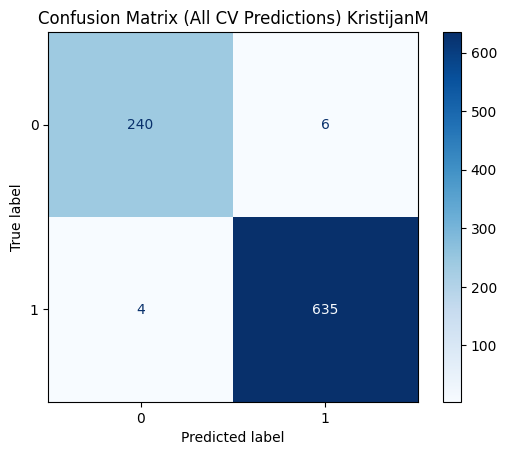

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.957931        0.12958          9           314          76   

   subsample  verbosity  
0   0.730132         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.980          0.018        0.972       0.016    0.976   0.005
1           0.989          0.006        0.992       0.007    0.991   0.002


       Accuracy  F1 Macro
score  0.963842  0.953287


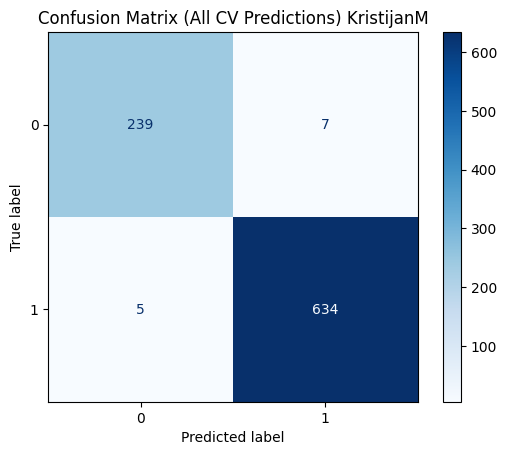

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
OgnenS
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.027        0.900       0.019    0.932   0.010
1           0.944          0.009        0.981       0.016    0.962   0.006


       Accuracy  F1 Macro
score  0.908148  0.892715


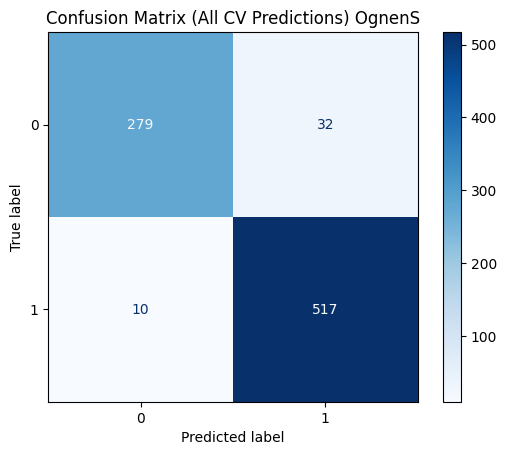

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         35         log2                 3                  9           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.969          0.020        0.891       0.016    0.928   0.008
1           0.939          0.008        0.983       0.011    0.960   0.005


       Accuracy  F1 Macro
score  0.909331  0.895527


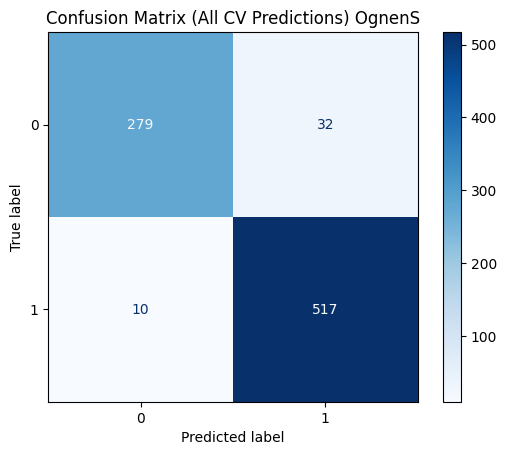

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         25         sqrt                 2                  4           314


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.029        0.897       0.017    0.930   0.012
1           0.942          0.008        0.981       0.017    0.961   0.008


       Accuracy  F1 Macro
score  0.911712  0.895094


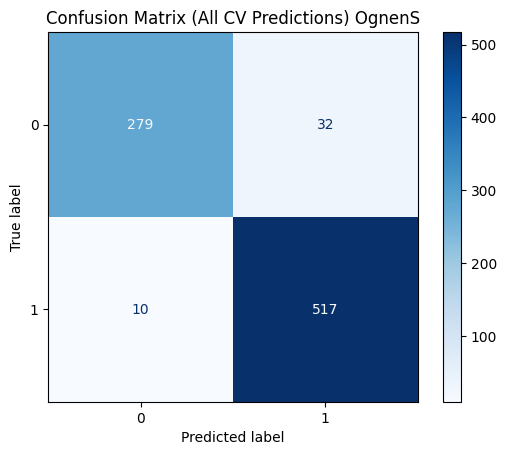

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
OgnenS
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy          8         sqrt                 2                  5   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.911          0.042        0.861       0.050    0.884   0.033
1           0.922          0.026        0.949       0.026    0.935   0.018


       Accuracy  F1 Macro
score  0.864093  0.868602


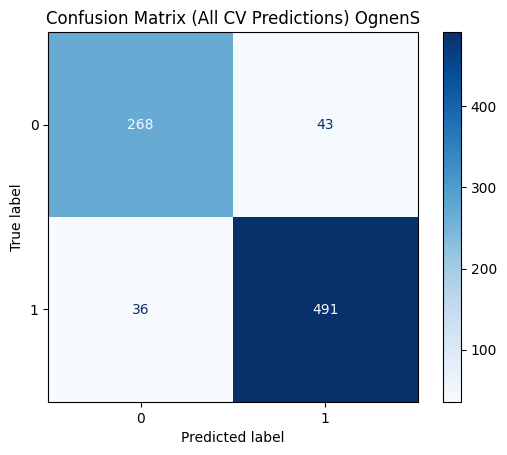

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         20         sqrt                 4                  3   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.873          0.039        0.891       0.026    0.881   0.025
1           0.935          0.015        0.922       0.026    0.928   0.016


       Accuracy  F1 Macro
score  0.893798  0.890539


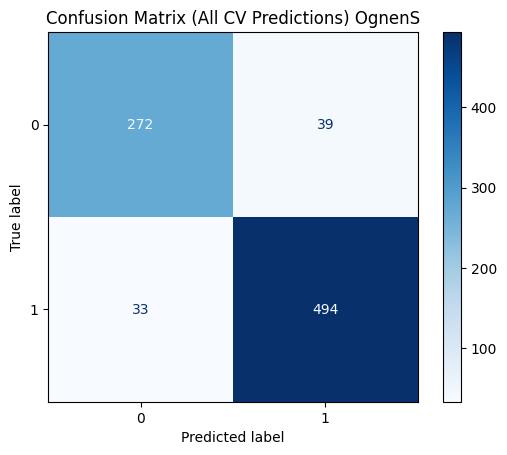

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss          9         None                 4                  4   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.904          0.038        0.926       0.008    0.915   0.020
1           0.956          0.005        0.941       0.025    0.948   0.014


       Accuracy  F1 Macro
score  0.880681    0.8611


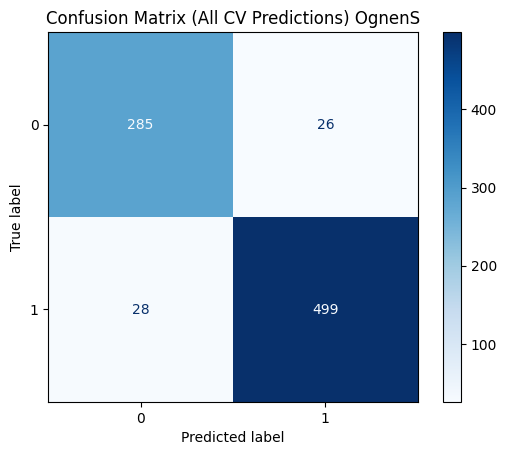

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
OgnenS
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.804          0.050        0.649       0.044    0.717   0.040
1           0.814          0.021        0.905       0.029    0.857   0.022


       Accuracy  F1 Macro
score  0.735208  0.690004


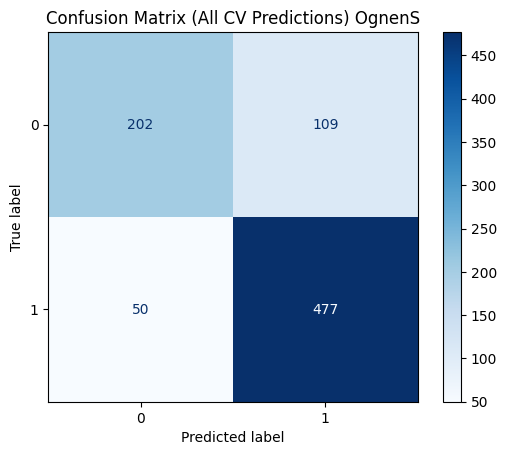

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.799          0.065        0.646       0.057    0.714   0.057
1           0.812          0.030        0.903       0.035    0.855   0.030


       Accuracy  F1 Macro
score   0.72567  0.677737


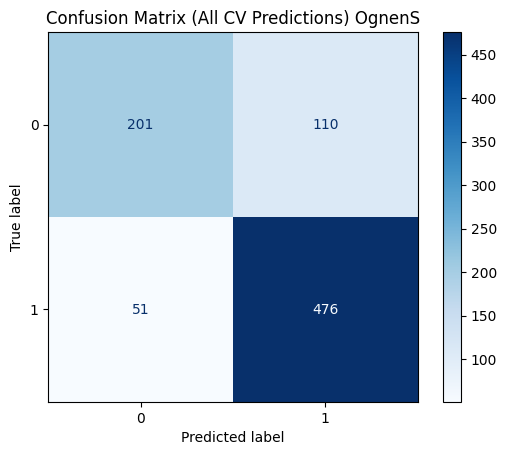

KNeighborsClassifier


  algorithm  n_neighbors  p  weights
0     brute            3  1  uniform


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.799          0.065        0.646       0.057    0.714   0.057
1           0.812          0.030        0.903       0.035    0.855   0.030


       Accuracy  F1 Macro
score   0.72567  0.677737


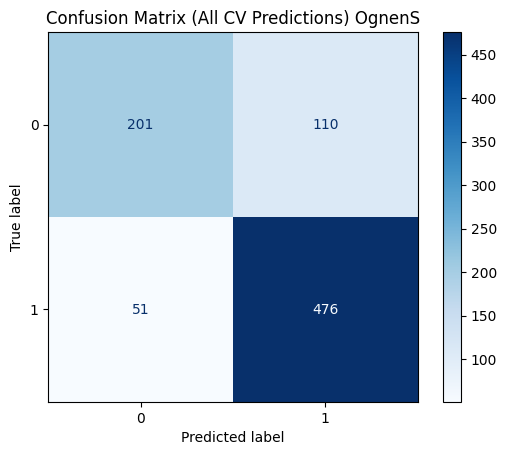

<class 'lightgbm.sklearn.LGBMClassifier'>
OgnenS
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.756424       0.046447          5           101          20   

   subsample  verbosity  
0   0.683177         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.973          0.017        0.910       0.022    0.940   0.013
1           0.949          0.012        0.985       0.010    0.966   0.007


       Accuracy  F1 Macro
score  0.912853  0.901874


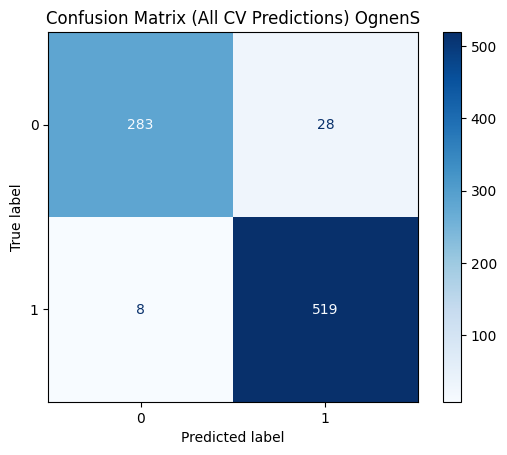

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.681224       0.198571          8           286         100   

   subsample  verbosity  
0   0.952187         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.970          0.018        0.920       0.034    0.944   0.019
1           0.954          0.018        0.983       0.011    0.968   0.010


       Accuracy  F1 Macro
score  0.912881  0.901131


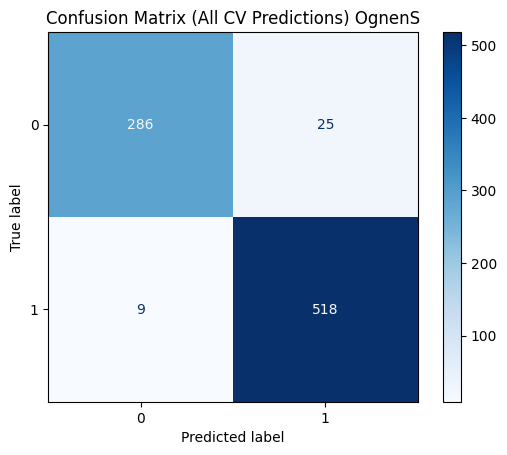

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.749816       0.200143          9           288          35   

   subsample  verbosity  
0   0.662407         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.967          0.017        0.929        0.03    0.947   0.016
1           0.959          0.016        0.981        0.01    0.970   0.009


       Accuracy  F1 Macro
score  0.911662   0.90107


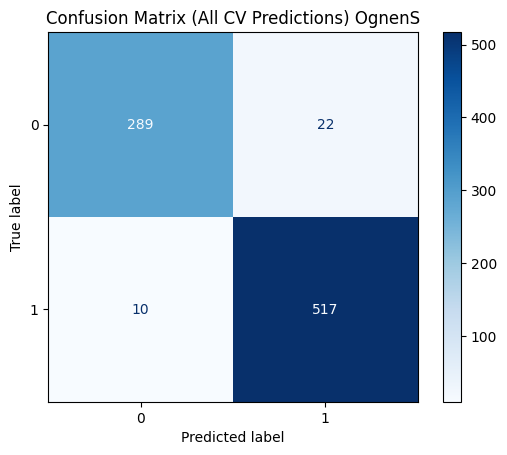

<class 'sklearn.ensemble._forest.RandomForestClassifier'>
MarinoJ
RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         48         sqrt                 1                  4           463


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.050        0.964       0.023    0.964   0.032
1           0.981          0.012        0.981       0.028    0.981   0.018


       Accuracy  F1 Macro
score  0.942466  0.930533


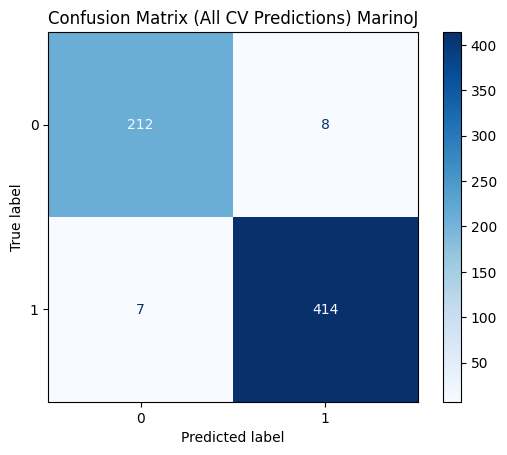

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         44         log2                 2                  7           153


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.961          0.047        0.964       0.023    0.962   0.031
1           0.981          0.012        0.979       0.027    0.980   0.017


       Accuracy  F1 Macro
score  0.940916  0.924395


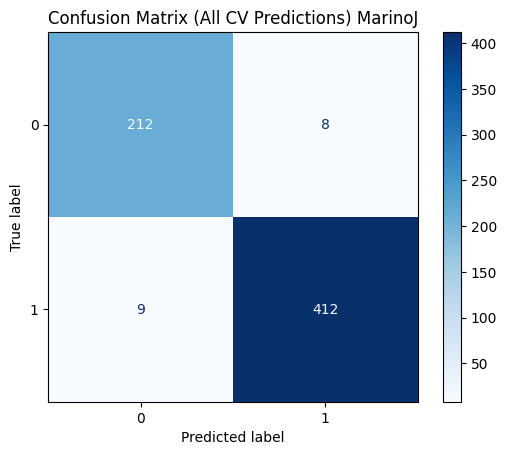

RandomForestClassifier


   max_depth max_features  min_samples_leaf  min_samples_split  n_estimators
0         43         log2                 1                  9           288


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.966          0.050        0.964       0.023    0.964   0.032
1           0.981          0.012        0.981       0.028    0.981   0.018


       Accuracy  F1 Macro
score  0.940904  0.926513


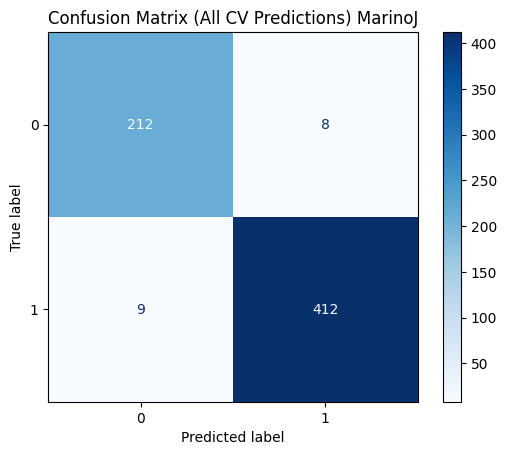

<class 'sklearn.tree._classes.DecisionTreeClassifier'>
MarinoJ
DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0  log_loss         24         None                 2                  9   

  splitter  
0   random  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.964          0.030        0.959       0.022    0.961    0.02
1           0.979          0.012        0.981       0.016    0.980    0.01


       Accuracy  F1 Macro
score  0.920579  0.925788


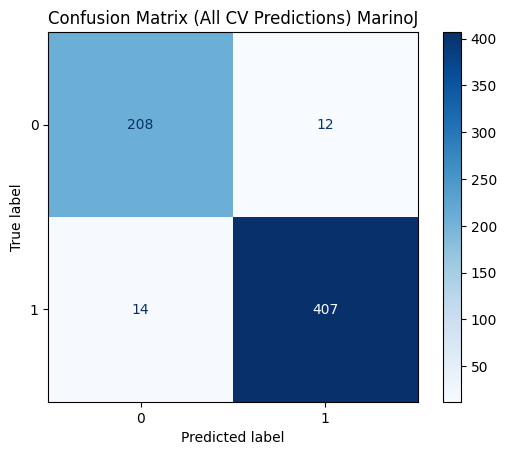

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0      gini         41         sqrt                 3                  8   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.933          0.037        0.936       0.044    0.934   0.036
1           0.967          0.023        0.964       0.020    0.966   0.019


       Accuracy  F1 Macro
score  0.926768   0.95806


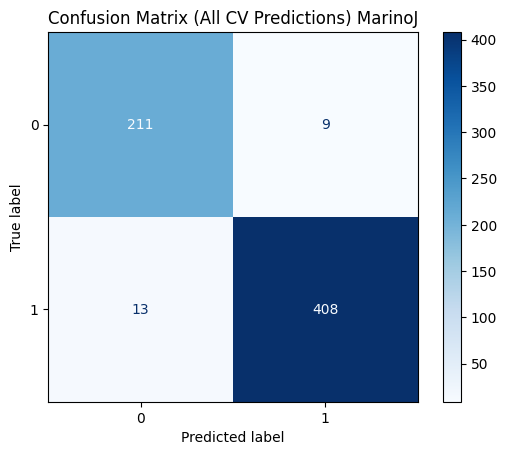

DecisionTreeClassifier


  criterion  max_depth max_features  min_samples_leaf  min_samples_split  \
0   entropy         40         sqrt                 4                  6   

  splitter  
0     best  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.953          0.051        0.936       0.044    0.943   0.029
1           0.968          0.021        0.974       0.029    0.970   0.016


       Accuracy  F1 Macro
score  0.929893  0.894945


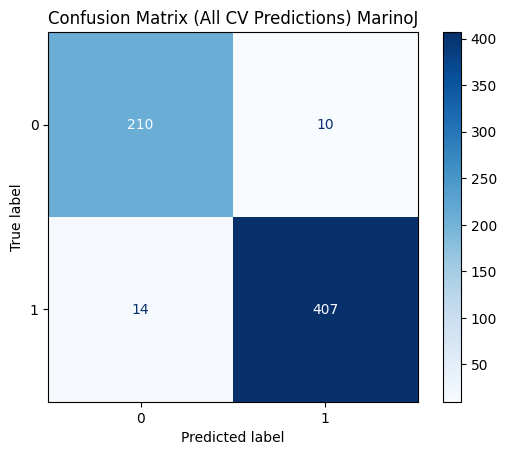

<class 'sklearn.neighbors._classification.KNeighborsClassifier'>
MarinoJ
KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0      auto            4  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.805          0.027        0.691       0.092     0.74   0.054
1           0.852          0.039        0.912       0.016     0.88   0.018


       Accuracy  F1 Macro
score  0.728864  0.660436


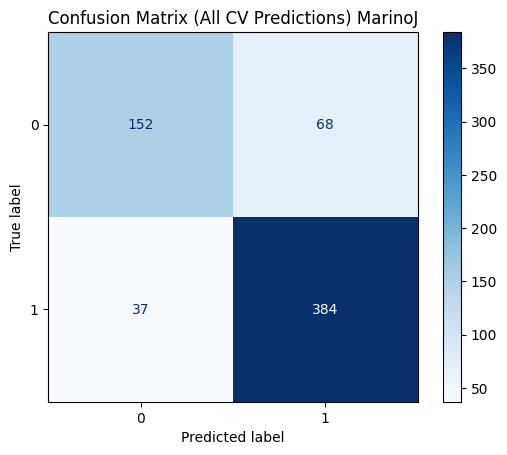

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0   kd_tree            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.772          0.043        0.664       0.070    0.713   0.051
1           0.837          0.030        0.898       0.021    0.866   0.021


       Accuracy  F1 Macro
score  0.716437  0.641849


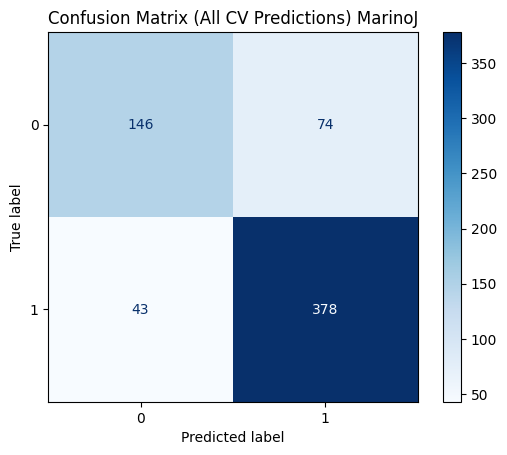

KNeighborsClassifier


  algorithm  n_neighbors  p   weights
0     brute            6  1  distance


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.772          0.043        0.664       0.070    0.713   0.051
1           0.837          0.030        0.898       0.021    0.866   0.021


       Accuracy  F1 Macro
score  0.716437  0.641849


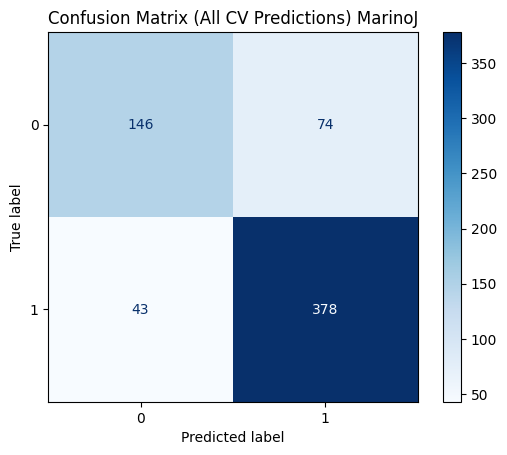

<class 'lightgbm.sklearn.LGBMClassifier'>
MarinoJ
LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0           0.80991       0.089972          4           463          69   

   subsample  verbosity  
0   0.993292         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.965          0.039        0.977       0.014    0.971   0.025
1           0.988          0.008        0.981       0.022    0.984   0.014


       Accuracy  F1 Macro
score  0.940928  0.928493


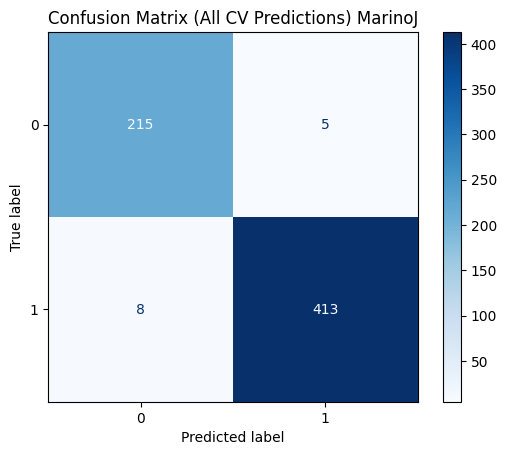

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.725742       0.111714          6           330         123   

   subsample  verbosity  
0   0.815936         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.965          0.040        0.973       0.017    0.969   0.026
1           0.986          0.009        0.981       0.022    0.983   0.015


       Accuracy  F1 Macro
score  0.940928  0.928493


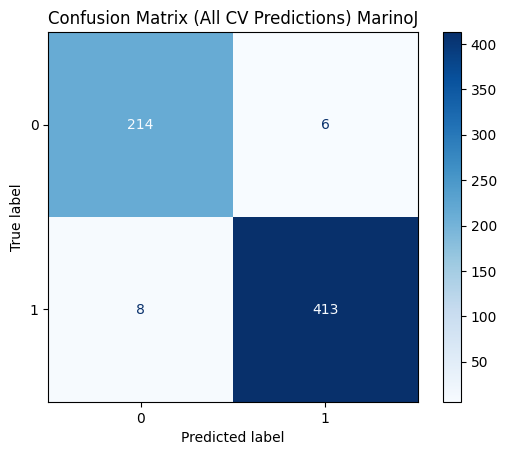

LGBMClassifier


   colsample_bytree  learning_rate  max_depth  n_estimators  num_leaves  \
0          0.602781       0.112149         10           417          51   

   subsample  verbosity  
0   0.876974         -1  


   precision_mean  precision_std  recall_mean  recall_std  f1_mean  f1_std
0           0.965          0.039        0.973       0.017    0.969   0.024
1           0.986          0.009        0.981       0.022    0.983   0.014


       Accuracy  F1 Macro
score  0.940928  0.928493


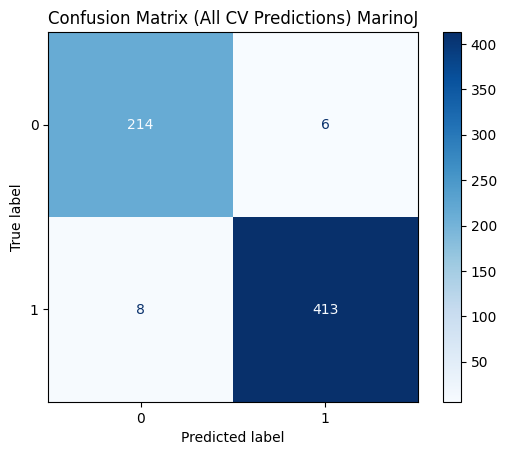

Exception ignored in: <function ResourceTracker.__del__ at 0x70aa8a999c60>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 77, in __del__
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 86, in _stop
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 111, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x7e8a7d1a1c60>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 77, in __del__
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 86, in _stop
  File "/usr/lib/python3.12/multiprocessing/resource_tracker.py", line 111, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x71cf61199c60>
Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/reso

In [25]:
models=[RandomForestClassifier,DecisionTreeClassifier,KNeighborsClassifier,LGBMClassifier]
namess = ['FEIT_eating_IlijaM', 'FEIT_eating_MiaD','FEIT_eating_KristijanM','FEIT_eating_OgnenS','FEIT_eating_MarinoJ']
featuress = ['LeftCheek','RightCheek,','Subject']
for NAME in namess:
    for i, MODEL in enumerate(models):
        print(MODEL)
        model_instance = MODEL()
        final_pipeline(model=model_instance,param_dist=params[i],search_type='random', names=NAME, feat=featuress,n_iter=25, top_k=3,cv_splits=5)